In [13]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [14]:
import keras
from keras.models import load_model

import numpy as np
import matplotlib.pyplot as plt
import time
import math

In [15]:
input_path = '/content/drive/MyDrive/G05-AI Project/data_2/maze_10x10_rnd/'
# input_path = '../data_2/maze_15x15_rnd/'
# input_path = '../data_2/maze_20x20_rnd/'
# input_path = '../data_2/maze_30x30_rnd/'

model_file = '/content/drive/MyDrive/GO5-AI Project/results_2/model_10_conv.hf5'
# model_file = '../results_2/model_15_conv.hf5'
# model_file = '../results_2/model_20_conv.hf5'
# model_file = '../results_2/model_30_conv.hf5'

ind_test = np.array(range(28000,30000)) #the range of samples for testing (the last 2000 samples are used)

In [16]:
def reconstruct_path(y_pred,env,s,g):
	sx=s[0]+1
	sy=s[1]+1
	gx=g[0]+1
	gy=g[1]+1
	#find predicted path
	y_pred[env==1]=-1
	pred_map=-1*np.ones((n+2,n+2))
	pred_map[1:n+1,1:n+1]=y_pred
	pred_map_2=-1*np.ones((n+2,n+2))
	pred_map_2[1:n+1,1:n+1]=y_pred

	pred_map[sx,sy]=0
	pred_map_2[gx,gy]=0

	T=pow(n,2)

	px_pred=np.zeros(T,dtype='int')
	py_pred=np.zeros(T,dtype='int')
	px_pred[0]=sx
	py_pred[0]=sy

	px_pred_2=np.zeros(T,dtype='int')
	py_pred_2=np.zeros(T,dtype='int')
	px_pred_2[0]=gx
	py_pred_2[0]=gy

	path_found=False
	got_stuck=False
	got_stuck_2=False

	for k in range(T):

		if not got_stuck:
			if math.sqrt(pow(px_pred[k]-gx,2)+pow(py_pred[k]-gy,2)) <= math.sqrt(2):
				px_pred[k+1]=gx
				py_pred[k+1]=gy
				px_pred=px_pred[0:k+2]
				py_pred=py_pred[0:k+2]
				path_found=True
				# print('forward path')
				break
			
			tmp=pred_map[px_pred[k]-1:px_pred[k]+2,py_pred[k]-1:py_pred[k]+2]		
			ii, jj = np.unravel_index(tmp.argmax(), tmp.shape)
			px_pred[k+1]=px_pred[k]+ii-1
			py_pred[k+1]=py_pred[k]+jj-1
			pred_map[px_pred[k+1],py_pred[k+1]]=0          
			
			h=np.array(np.where((px_pred_2==px_pred[k+1])&(py_pred_2==py_pred[k+1]))).squeeze()
			if h.size==1:
				px_pred_2=px_pred_2[0:h]
				py_pred_2=py_pred_2[0:h]
				px_pred=px_pred[0:k+2]
				py_pred=py_pred[0:k+2]
				px_pred=np.append(px_pred,np.flip(px_pred_2))
				py_pred=np.append(py_pred,np.flip(py_pred_2))
				path_found=True
				# print('forward cross')
				break
			
			if (px_pred[k+1]==px_pred[k]) and (py_pred[k+1]==py_pred[k]):
				px_pred=px_pred[0:px_pred.size-1]
				py_pred=py_pred[0:py_pred.size-1]
				got_stuck=True

		if not got_stuck_2:
			if math.sqrt(pow(px_pred_2[k]-sx,2)+pow(py_pred_2[k]-sy,2)) <= math.sqrt(2):
				px_pred_2[k+1]=sx
				py_pred_2[k+1]=sy
				px_pred_2=px_pred_2[0:k+2]
				py_pred_2=py_pred_2[0:k+2]
				px_pred = np.flip(px_pred_2)
				py_pred = np.flip(py_pred_2)
				path_found=True
				# print('backward path')
				break
			
			tmp=pred_map_2[px_pred_2[k]-1:px_pred_2[k]+2,py_pred_2[k]-1:py_pred_2[k]+2]
			ii, jj = np.unravel_index(tmp.argmax(), tmp.shape)
			px_pred_2[k+1]=px_pred_2[k]+ii-1
			py_pred_2[k+1]=py_pred_2[k]+jj-1
			pred_map_2[px_pred_2[k+1],py_pred_2[k+1]]=0
			
			h=np.array(np.where((px_pred==px_pred_2[k+1])&(py_pred==py_pred_2[k+1]))).squeeze()
			if h.size==1:
				px_pred=px_pred[0:h]
				py_pred=py_pred[0:h]
				px_pred_2=px_pred_2[0:k+2]
				py_pred_2=py_pred_2[0:k+2]
				px_pred=np.append(px_pred,np.flip(px_pred_2))
				py_pred=np.append(py_pred,np.flip(py_pred_2))
				path_found=True
				# print('backward cross')
				break
			
			if (px_pred_2[k+1]==px_pred_2[k]) and (py_pred_2[k+1]==py_pred_2[k]):
				px_pred_2=px_pred_2[0:px_pred_2.size-1]
				py_pred_2=py_pred_2[0:py_pred_2.size-1]
				got_stuck_2=True      

		if got_stuck and got_stuck_2:
			break

	###remove loops
	ind=np.array([])
	for k in range(px_pred.size):
		h=np.array( np.where( (px_pred==px_pred[k])&(py_pred==py_pred[k]) ) ).squeeze()
		if h.size>=2:
			ind=np.append(ind, np.array(range(h[0]+1,h[1]+1)))
	ind=ind.astype(int)
	# print("ind datattype is ", ind.dtype)
	px_pred=np.delete(px_pred,ind)
	py_pred=np.delete(py_pred,ind)

	###remove zig-zags
	while 1:
		k=0
		ind=np.array([])
		for i in range(px_pred.size-2):
			if math.sqrt(pow(px_pred[k]-px_pred[k+2],2)+pow(py_pred[k]-py_pred[k+2],2)) <= math.sqrt(2):
				ind=np.append(ind, k+1)
				k=k+2
			else:
				k=k+1

			if k>=px_pred.size-2:
				break
		
		if ind.size:
			ind=ind.astype(int)
			px_pred=np.delete(px_pred,ind)
			py_pred=np.delete(py_pred,ind)
		else:
			break
	return px_pred, py_pred

In [17]:
print('Load data ...')
x = np.loadtxt('/content/gdrive/MyDrive/G05-AI Project/data_2/maze_10x10_rnd/inputs.dat')
s_map = np.loadtxt('/content/gdrive/MyDrive/G05-AI Project/data_2/maze_10x10_rnd/s_maps.dat')
g_map = np.loadtxt('/content/gdrive/MyDrive/G05-AI Project/data_2/maze_10x10_rnd/g_maps.dat')
                    
y = np.loadtxt('/content/gdrive/MyDrive/G05-AI Project/data_2/maze_10x10_rnd/s_maps.dat')


Load data ...


In [18]:
print('Transform data ...')
x=x[ind_test,:]
s_map=s_map[ind_test,:]
g_map=g_map[ind_test,:]
y=y[ind_test,:]

m = x.shape[0]
n = int(np.sqrt(x.shape[1]))

x = x.reshape(m,n,n)
s_map = s_map.reshape(m,n,n)
g_map = g_map.reshape(m,n,n)

x_test=np.zeros((m,n,n,3))
x_test[:,:,:,0]=x
x_test[:,:,:,1]=s_map
x_test[:,:,:,2]=g_map
del x, s_map, g_map
;
y_test = y.reshape(m,n,n)
del y

Transform data ...


In [19]:
print('Load model ...')
model=load_model('/content/gdrive/MyDrive/G05-AI Project/results_2/model_10_conv.hf5')
model.summary()
#do prediction ones to initialize GPU
model.predict(np.zeros((1,n,n,3)))

Load model ...
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 conv2d_1 (Conv2D)           (None, None, None, 64)    1792      
                                                                 
 batch_normalization_1 (Batc  (None, None, None, 64)   256       
 hNormalization)                                                 
                                                                 
 conv2d_2 (Conv2D)           (None, None, None, 64)    36928     
                                                                 
 batch_normalization_2 (Batc  (None, None, None, 64)   256       
 hNormalization)                                                 
                                                                 
 conv2d_3 (Conv2D)           (None, None, No

array([[[[ 3.25404049e-04],
         [-1.07825384e-03],
         [ 5.73414844e-04],
         [-5.18225133e-05],
         [ 1.02923739e-04],
         [ 1.01264415e-03],
         [ 2.88939825e-03],
         [ 3.84080131e-03],
         [ 3.81527073e-03],
         [ 1.33359933e-03]],

        [[ 5.57262916e-04],
         [ 3.85017972e-03],
         [ 5.86448610e-03],
         [ 3.48702120e-03],
         [ 3.36666289e-03],
         [ 4.51814197e-03],
         [ 5.26790554e-03],
         [ 4.50198958e-03],
         [ 4.16592462e-03],
         [ 1.44666305e-03]],

        [[ 4.30652348e-04],
         [ 7.34473579e-03],
         [ 9.01933014e-03],
         [ 5.43307234e-03],
         [ 5.99995442e-03],
         [ 5.61178615e-03],
         [ 4.72603319e-03],
         [ 3.49848368e-03],
         [ 3.13063571e-03],
         [ 2.13702931e-03]],

        [[ 1.60714064e-03],
         [ 1.02109285e-02],
         [ 1.24268737e-02],
         [ 9.31371283e-03],
         [ 8.75464641e-03],
         [ 8.1

Predict path ...
0
Prediction time:  0.059696391999978005
Reconstruction time:  0.0025981080000008205
ground truth path
predicted path


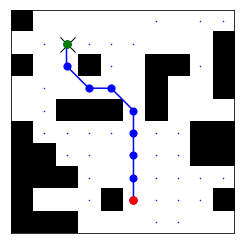

1
Prediction time:  0.05514548899998317
Reconstruction time:  0.0022300319999999374
ground truth path
predicted path


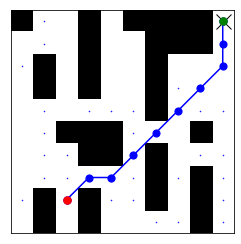

2
Prediction time:  0.05373778899999593
Reconstruction time:  0.0021726420000049984
ground truth path
predicted path


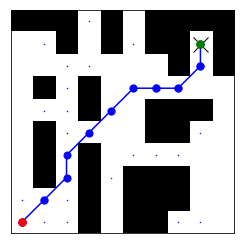

3
Prediction time:  0.05265239700000279
Reconstruction time:  0.003409159999989697
ground truth path
predicted path


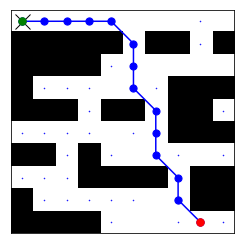

4
Prediction time:  0.056159298000011404
Reconstruction time:  0.001345256999996991
ground truth path
predicted path


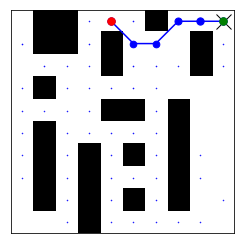

5
Prediction time:  0.33710830600000463
Reconstruction time:  0.000852772000001778
ground truth path
predicted path


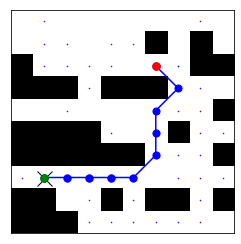

6
Prediction time:  0.05725033400000257
Reconstruction time:  0.0026002049999931387
ground truth path
predicted path


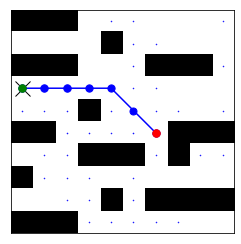

7
Prediction time:  0.05602328599999851
Reconstruction time:  0.0012425859999893873
ground truth path
predicted path


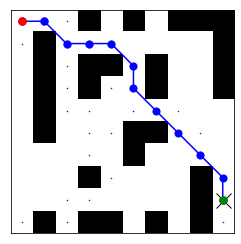

8
Prediction time:  0.05816159700000867
Reconstruction time:  0.0005301759999838396
ground truth path
predicted path


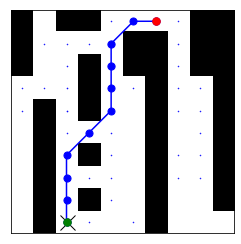

9
Prediction time:  0.05805258099999833
Reconstruction time:  0.0005252830000017639
ground truth path
predicted path


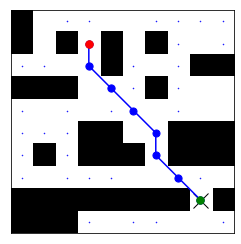

10
Prediction time:  0.05469894700001987
Reconstruction time:  0.001489516999981788
ground truth path
predicted path


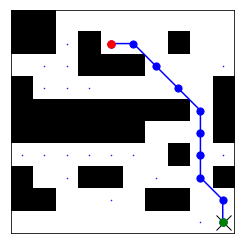

11
Prediction time:  0.056200727999993205
Reconstruction time:  0.0004815389999919262
ground truth path
predicted path


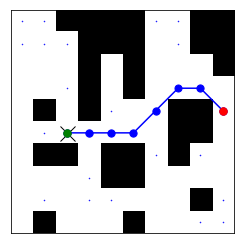

12
Prediction time:  0.05888466799999037
Reconstruction time:  0.0014016400000116391
ground truth path
predicted path


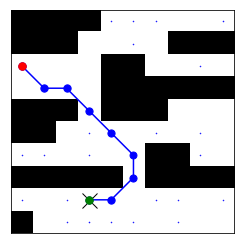

13
Prediction time:  0.057044630000007146
Reconstruction time:  0.0019223049999936848
ground truth path
predicted path


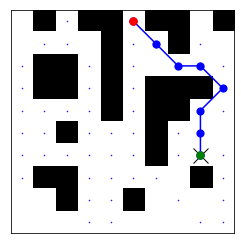

14
Prediction time:  0.060244823000005
Reconstruction time:  0.001176444000009269
ground truth path
predicted path


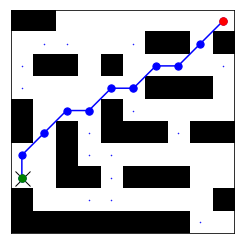

15
Prediction time:  0.05298993100001326
Reconstruction time:  0.0005635419999805436
ground truth path
predicted path


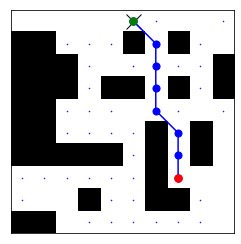

16
Prediction time:  0.06267405299999496
Reconstruction time:  0.0009515550000003259
ground truth path
predicted path


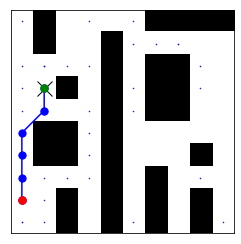

17
Prediction time:  0.06177776200001972
Reconstruction time:  0.003999348000007785
ground truth path
predicted path


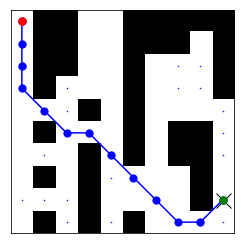

18
Prediction time:  0.057783706999998685
Reconstruction time:  0.0014931720000106452
ground truth path
predicted path


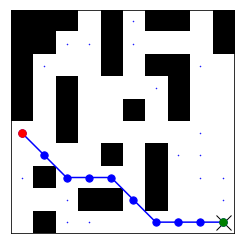

19
Prediction time:  0.05969718699998339
Reconstruction time:  0.0007296120000148676
ground truth path
predicted path


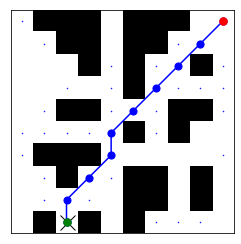

20
Prediction time:  0.055413474999994605
Reconstruction time:  0.0018956020000189255
ground truth path
predicted path


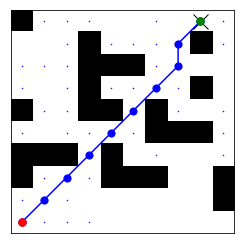

21
Prediction time:  0.05793465900001138
Reconstruction time:  0.0014523549999978513
ground truth path
predicted path


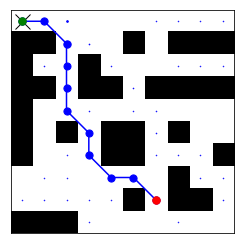

22
Prediction time:  0.06202921799999217
Reconstruction time:  0.0018167370000128358
ground truth path
predicted path


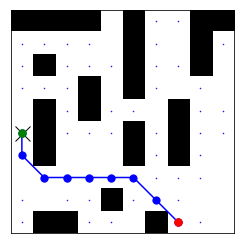

23
Prediction time:  0.3013730330000044
Reconstruction time:  0.0012559559999942849
ground truth path
predicted path


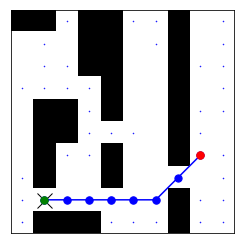

24
Prediction time:  0.05472575699999993
Reconstruction time:  0.0015052920000186987
ground truth path
predicted path


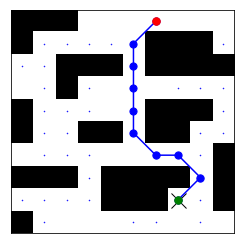

25
Prediction time:  0.06415343399999074
Reconstruction time:  0.001511773999993693
ground truth path
predicted path


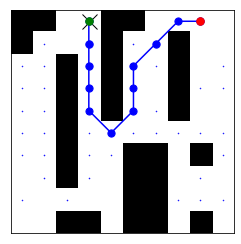

26
Prediction time:  0.05546206599998982
Reconstruction time:  0.0017030509999926835
ground truth path
predicted path


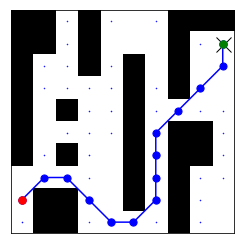

27
Prediction time:  0.06222448099998701
Reconstruction time:  0.0017257869999980358
ground truth path
predicted path


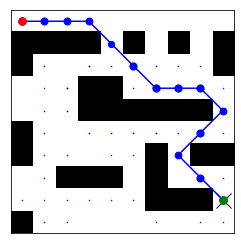

28
Prediction time:  0.06356928100001369
Reconstruction time:  0.0006995669999980692
ground truth path
predicted path


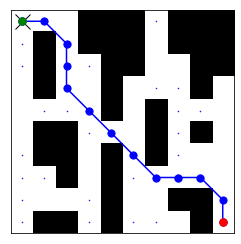

29
Prediction time:  0.058531749999986005
Reconstruction time:  0.001164924999983441
ground truth path
predicted path


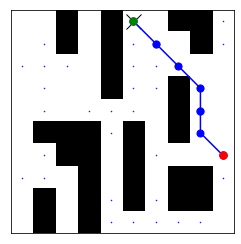

30
Prediction time:  0.05686558799999375
Reconstruction time:  0.0012211000000093009
ground truth path
predicted path


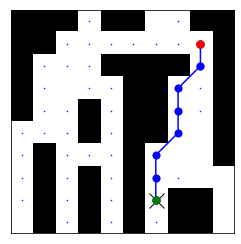

31
Prediction time:  0.057513376000002836
Reconstruction time:  0.0005047089999834498
ground truth path
predicted path


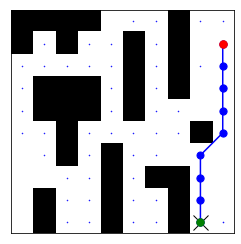

32
Prediction time:  0.05718863199999191
Reconstruction time:  0.0011941440000100556
ground truth path
predicted path


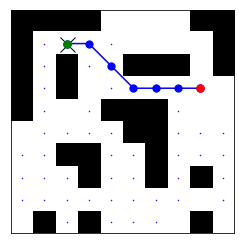

33
Prediction time:  0.05817278999998621
Reconstruction time:  0.0013952280000069095
ground truth path
predicted path


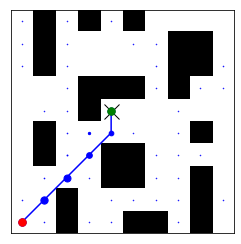

34
Prediction time:  0.06008271700000023
Reconstruction time:  0.0006942279999861967
ground truth path
predicted path


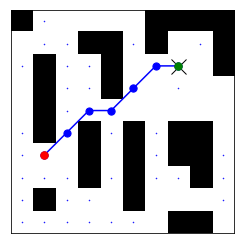

35
Prediction time:  0.060339026999997714
Reconstruction time:  0.0005976219999865862
ground truth path
predicted path


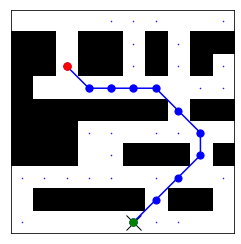

36
Prediction time:  0.0564714300000162
Reconstruction time:  0.0006483760000151051
ground truth path
predicted path


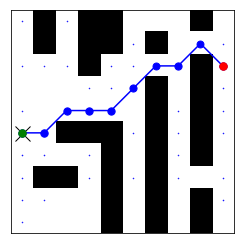

37
Prediction time:  0.06131548399997655
Reconstruction time:  0.0019254040000191708
ground truth path
predicted path


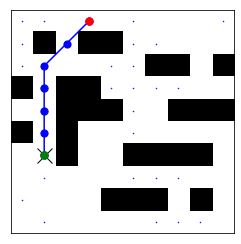

38
Prediction time:  0.06267057100001239
Reconstruction time:  0.001245796000006294
ground truth path
predicted path


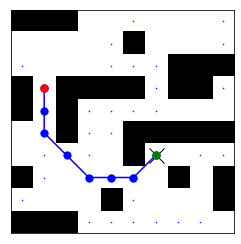

39
Prediction time:  0.06570841799998561
Reconstruction time:  0.0021650900000054207
ground truth path
predicted path


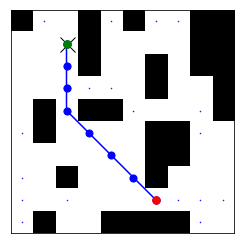

40
Prediction time:  0.3045247750000044
Reconstruction time:  0.00043050599998650796
ground truth path
predicted path


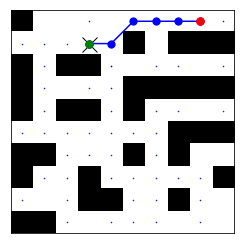

41
Prediction time:  0.05879374899998879
Reconstruction time:  0.000507394999999633
ground truth path
predicted path


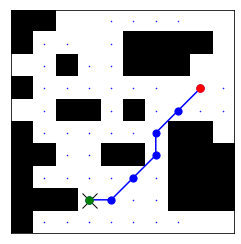

42
Prediction time:  0.06738003299997786
Reconstruction time:  0.0010904959999891162
ground truth path
predicted path


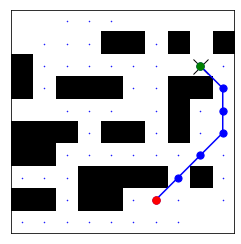

43
Prediction time:  0.06830207600000904
Reconstruction time:  0.0017880430000047909
ground truth path
predicted path


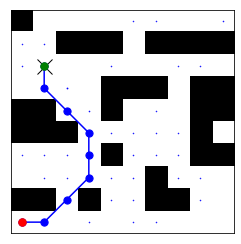

44
Prediction time:  0.06066742200002295
Reconstruction time:  0.000982176999997364
ground truth path
predicted path


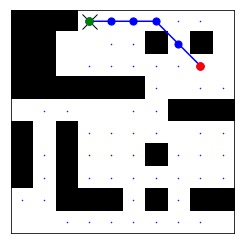

45
Prediction time:  0.061268044000001964
Reconstruction time:  0.0015290579999884812
ground truth path
predicted path


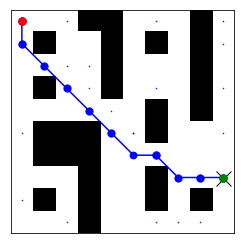

46
Prediction time:  0.061631501000022126
Reconstruction time:  0.001462400999997726
ground truth path
predicted path


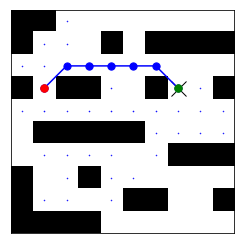

47
Prediction time:  0.06351505999998608
Reconstruction time:  0.001567797999996401
ground truth path
predicted path


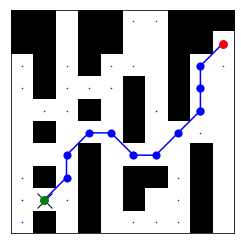

48
Prediction time:  0.0633261760000039
Reconstruction time:  0.0006076740000082737
ground truth path
predicted path


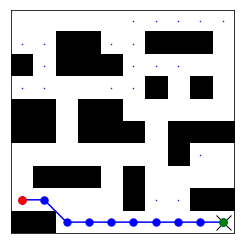

49
Prediction time:  0.056032066000000214
Reconstruction time:  0.0016740389999938543
ground truth path
predicted path


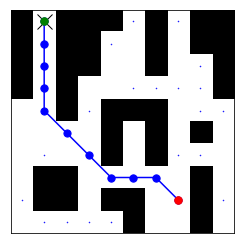

50
Prediction time:  0.0550673829999937
Reconstruction time:  0.002039112000005616
ground truth path
predicted path


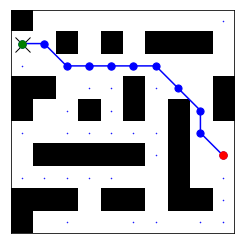

51
Prediction time:  0.060582961000022806
Reconstruction time:  0.0003639010000142662
ground truth path
predicted path


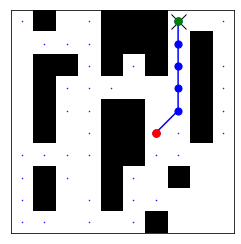

52
Prediction time:  0.0593602179999948
Reconstruction time:  0.0012426360000006298
ground truth path
predicted path


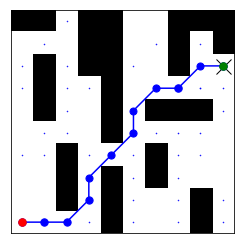

53
Prediction time:  0.06757356800000025
Reconstruction time:  0.0006958959999963099
ground truth path
predicted path


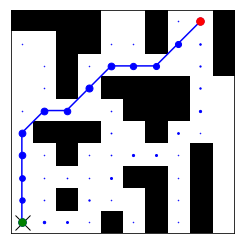

54
Prediction time:  0.0705159569999978
Reconstruction time:  0.003499532000006411
ground truth path
predicted path


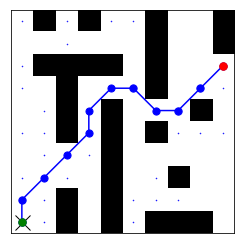

55
Prediction time:  0.055262493000014956
Reconstruction time:  0.0014149360000033084
ground truth path
predicted path


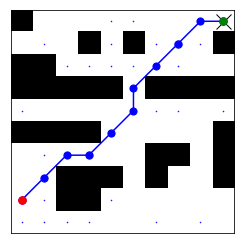

56
Prediction time:  0.054219388999996454
Reconstruction time:  0.0008368690000111201
ground truth path
predicted path


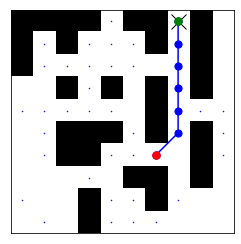

57
Prediction time:  0.30643793699999833
Reconstruction time:  0.0021426739999981237
ground truth path
predicted path


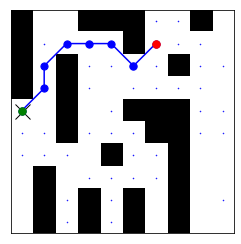

58
Prediction time:  0.05628161500001738
Reconstruction time:  0.003015886000014234
ground truth path
predicted path


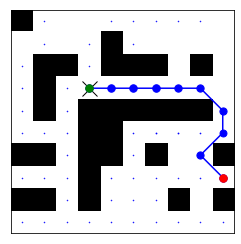

59
Prediction time:  0.05848201399999198
Reconstruction time:  0.0005166569999914827
ground truth path
predicted path


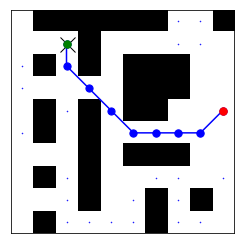

60
Prediction time:  0.06285495800000263
Reconstruction time:  0.001471576000000141
ground truth path
predicted path


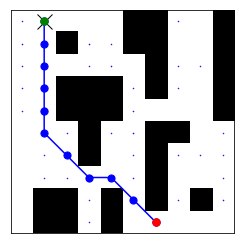

61
Prediction time:  0.059708989000000656
Reconstruction time:  0.0019583539999814548
ground truth path
predicted path


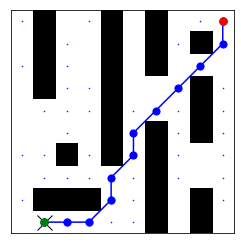

62
Prediction time:  0.06572767800000179
Reconstruction time:  0.0006946800000093845
ground truth path
predicted path


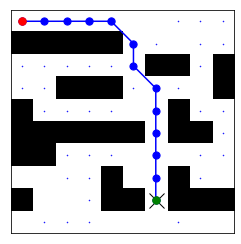

63
Prediction time:  0.06440362600000071
Reconstruction time:  0.00046317799998973896
ground truth path
predicted path


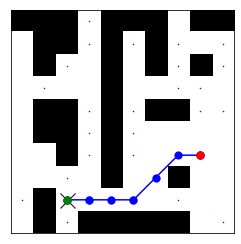

64
Prediction time:  0.061894141999999874
Reconstruction time:  0.0016784580000148708
ground truth path
predicted path


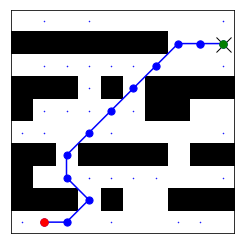

65
Prediction time:  0.06289712200000963
Reconstruction time:  0.0005870349999952396
ground truth path
predicted path


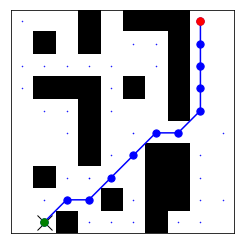

66
Prediction time:  0.06281476300000577
Reconstruction time:  0.0018460269999991397
ground truth path
predicted path


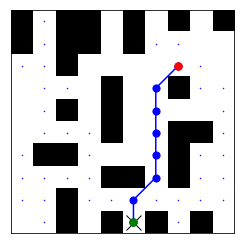

67
Prediction time:  0.06095398700000487
Reconstruction time:  0.0006476570000018
ground truth path
predicted path


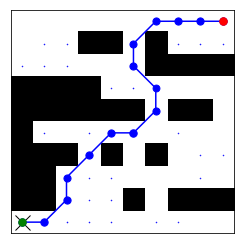

68
Prediction time:  0.05869492900001205
Reconstruction time:  0.0018937570000048254
ground truth path
predicted path


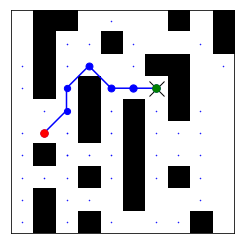

69
Prediction time:  0.06228337999999667
Reconstruction time:  0.0024776719999977104
ground truth path
predicted path


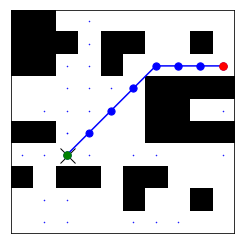

70
Prediction time:  0.06545408899998506
Reconstruction time:  0.0007613779999928738
ground truth path
predicted path


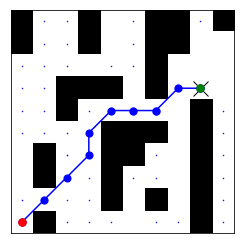

71
Prediction time:  0.06211397600000623
Reconstruction time:  0.0016083579999985886
ground truth path
predicted path


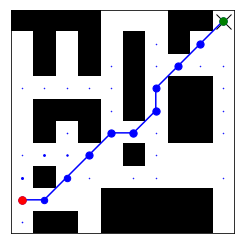

72
Prediction time:  0.06989575700001183
Reconstruction time:  0.002519273999979532
ground truth path
predicted path


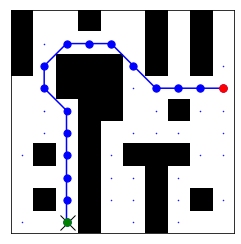

73
Prediction time:  0.0643648189999908
Reconstruction time:  0.0005369730000097661
ground truth path
predicted path


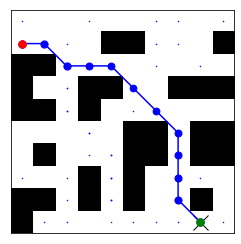

74
Prediction time:  0.30652151600000366
Reconstruction time:  0.0016247890000045118
ground truth path
predicted path


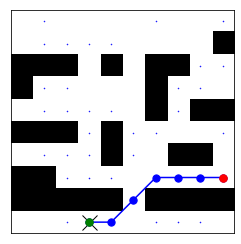

75
Prediction time:  0.056930950000008806
Reconstruction time:  0.002329892999995309
ground truth path
predicted path


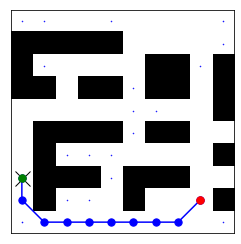

76
Prediction time:  0.06600121399998216
Reconstruction time:  0.0004781620000073872
ground truth path
predicted path


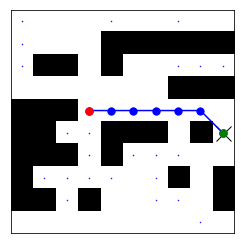

77
Prediction time:  0.06499771399998622
Reconstruction time:  0.0010587190000137525
ground truth path
predicted path


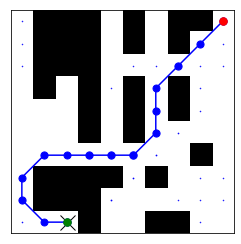

78
Prediction time:  0.0582550360000198
Reconstruction time:  0.00038485100000684724
ground truth path
predicted path


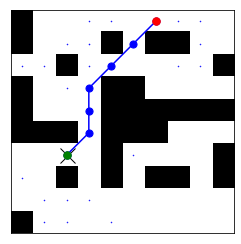

79
Prediction time:  0.0572275459999787
Reconstruction time:  0.0007242060000010042
ground truth path
predicted path


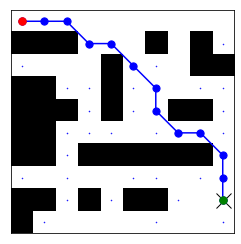

80
Prediction time:  0.06882217300000093
Reconstruction time:  0.001926709000002802
ground truth path
predicted path


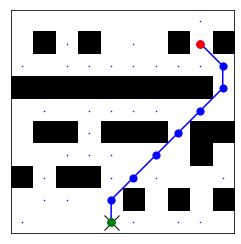

81
Prediction time:  0.06561214399999926
Reconstruction time:  0.00044042200002536447
ground truth path
predicted path


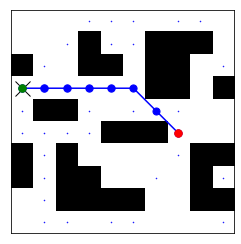

82
Prediction time:  0.060652465000003986
Reconstruction time:  0.0023344029999918803
ground truth path
predicted path


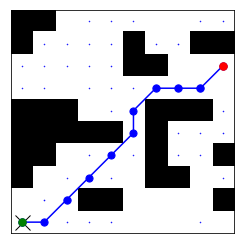

83
Prediction time:  0.061138224000018226
Reconstruction time:  0.0003862479999838797
ground truth path
predicted path


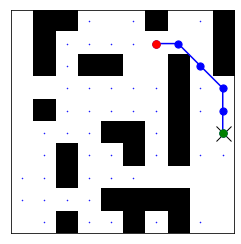

84
Prediction time:  0.06062222799999972
Reconstruction time:  0.002396922999992057
ground truth path
predicted path


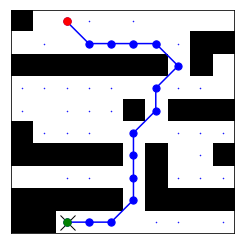

85
Prediction time:  0.07048304899998925
Reconstruction time:  0.0016932359999941582
ground truth path
predicted path


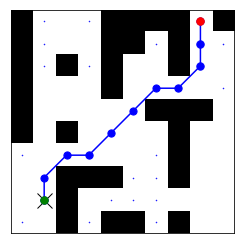

86
Prediction time:  0.06454998399999567
Reconstruction time:  0.00048360899998556306
ground truth path
predicted path


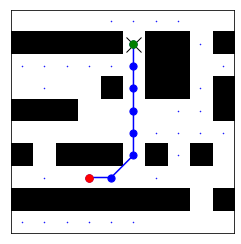

87
Prediction time:  0.057717943000000105
Reconstruction time:  0.0006356309999944187
ground truth path
predicted path


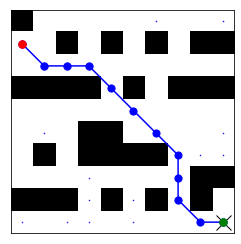

88
Prediction time:  0.07039104899999415
Reconstruction time:  0.0014710860000093362
ground truth path
predicted path


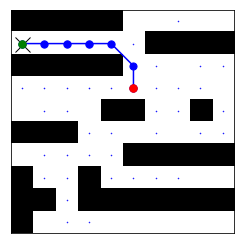

89
Prediction time:  0.06516662999999312
Reconstruction time:  0.00037394599999629463
ground truth path
predicted path


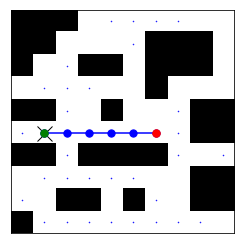

90
Prediction time:  0.06054047399999263
Reconstruction time:  0.0013883120000173221
ground truth path
predicted path


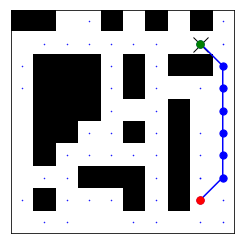

91
Prediction time:  0.06431538500001466
Reconstruction time:  0.0004074889999969855
ground truth path
predicted path


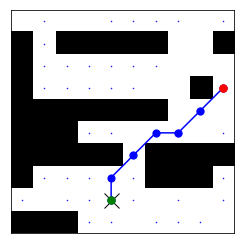

92
Prediction time:  0.31756835600000954
Reconstruction time:  0.0015882270000133758
ground truth path
predicted path


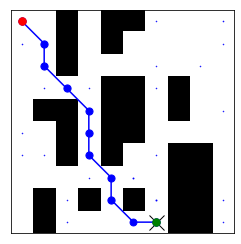

93
Prediction time:  0.05803907600000002
Reconstruction time:  0.0005994320000013431
ground truth path
predicted path


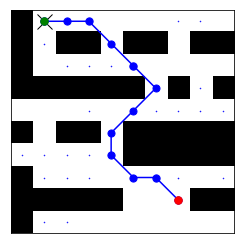

94
Prediction time:  0.0649302440000099
Reconstruction time:  0.000501302000003534
ground truth path
predicted path


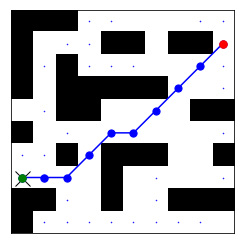

95
Prediction time:  0.0631525780000004
Reconstruction time:  0.0011799110000083601
ground truth path
predicted path


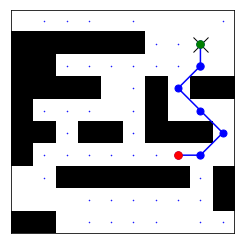

96
Prediction time:  0.060890975999996044
Reconstruction time:  0.0004910709999990104
ground truth path
predicted path


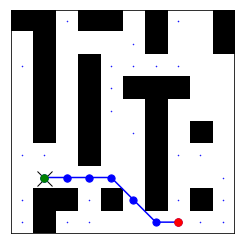

97
Prediction time:  0.06068440499998928
Reconstruction time:  0.001210963999994874
ground truth path
predicted path


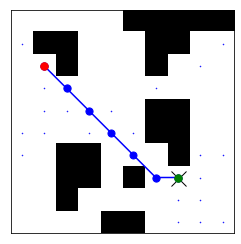

98
Prediction time:  0.05913710100000458
Reconstruction time:  0.001957649999980049
ground truth path
predicted path


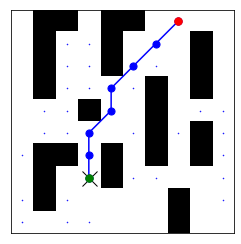

99
Prediction time:  0.06798742000000857
Reconstruction time:  0.0016278680000141321
ground truth path
predicted path


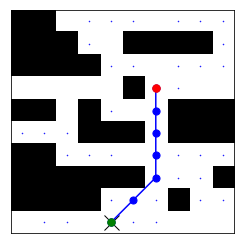

100
Prediction time:  0.06470729499997674
Reconstruction time:  0.0015413730000091164
ground truth path
predicted path


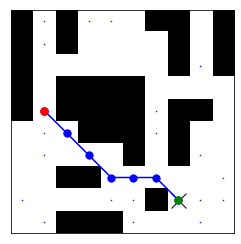

101
Prediction time:  0.06686205500000142
Reconstruction time:  0.0010618250000220542
ground truth path
predicted path


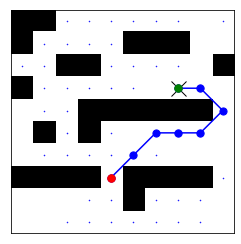

102
Prediction time:  0.06158728000002611
Reconstruction time:  0.0005554440000139493
ground truth path
predicted path


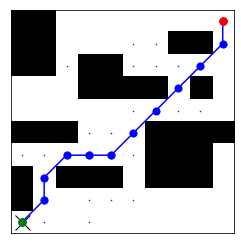

103
Prediction time:  0.06340619799999558
Reconstruction time:  0.0010528800000031424
ground truth path
predicted path


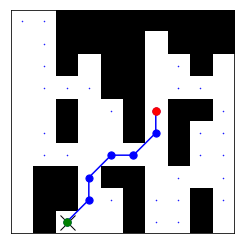

104
Prediction time:  0.06292344099998104
Reconstruction time:  0.0011043429999801901
ground truth path
predicted path


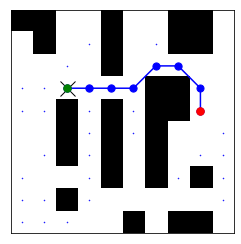

105
Prediction time:  0.06313036500000635
Reconstruction time:  0.001656142000001637
ground truth path
predicted path


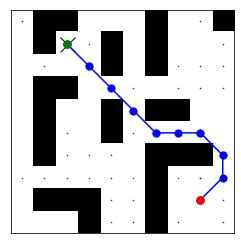

106
Prediction time:  0.06860383100001854
Reconstruction time:  0.0010467360000063763
ground truth path
predicted path


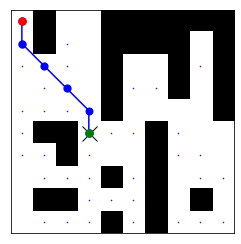

107
Prediction time:  0.06854808899998943
Reconstruction time:  0.0005772199999967143
ground truth path
predicted path


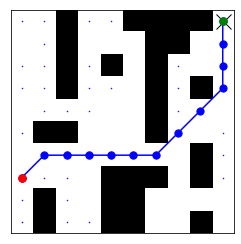

108
Prediction time:  0.06240587599998548
Reconstruction time:  0.001827934000004916
ground truth path
predicted path


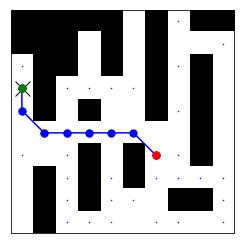

109
Prediction time:  0.06699025800000413
Reconstruction time:  0.0010530030000097668
ground truth path
predicted path


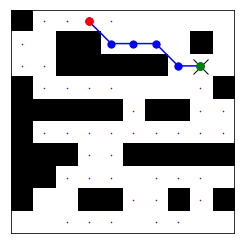

110
Prediction time:  0.3104255359999968
Reconstruction time:  0.0014820250000013857
ground truth path
predicted path


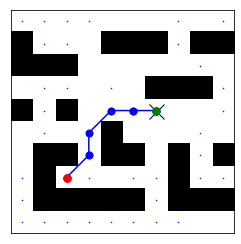

111
Prediction time:  0.06077232699999513
Reconstruction time:  0.0007395620000067993
ground truth path
predicted path


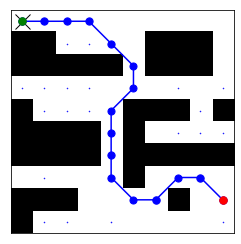

112
Prediction time:  0.06297708299999272
Reconstruction time:  0.001984572999987222
ground truth path
predicted path


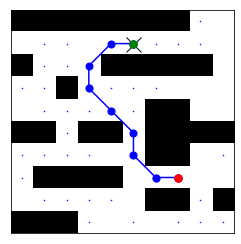

113
Prediction time:  0.06797332900001152
Reconstruction time:  0.0014292410000109612
ground truth path
predicted path


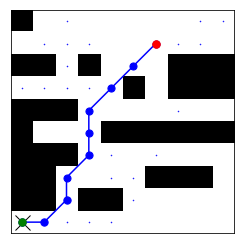

114
Prediction time:  0.06654835899999512
Reconstruction time:  0.0013990729999875384
ground truth path
predicted path


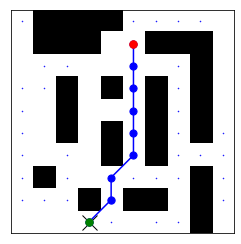

115
Prediction time:  0.06309566800001676
Reconstruction time:  0.0017036520000033306
ground truth path
predicted path


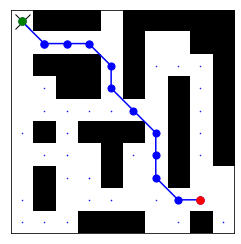

116
Prediction time:  0.06150797500001204
Reconstruction time:  0.0025002330000063466
ground truth path
predicted path


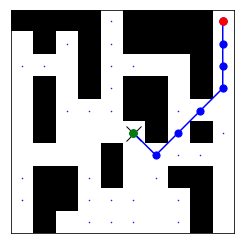

117
Prediction time:  0.06955866399999877
Reconstruction time:  0.0012898239999969974
ground truth path
predicted path


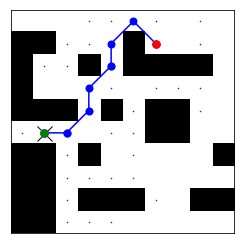

118
Prediction time:  0.07215753799999902
Reconstruction time:  0.0006988420000197948
ground truth path
predicted path


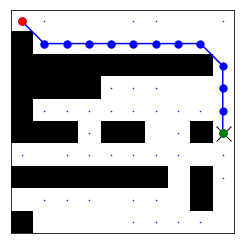

119
Prediction time:  0.05791272000001868
Reconstruction time:  0.0018565120000175739
ground truth path
predicted path


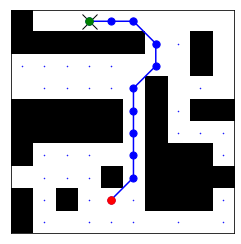

120
Prediction time:  0.07590983000000051
Reconstruction time:  0.0006437769999934062
ground truth path
predicted path


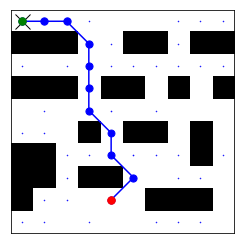

121
Prediction time:  0.06517856299998925
Reconstruction time:  0.00057920199998307
ground truth path
predicted path


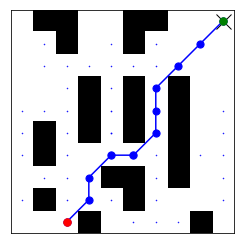

122
Prediction time:  0.06559871600001088
Reconstruction time:  0.0004773219999947287
ground truth path
predicted path


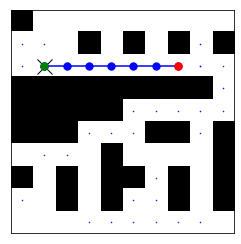

123
Prediction time:  0.061465133000012884
Reconstruction time:  0.003482724000008375
ground truth path
predicted path


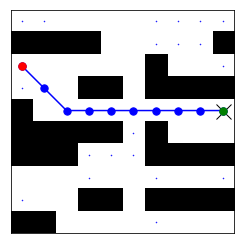

124
Prediction time:  0.06792707799999675
Reconstruction time:  0.0013178279999976894
ground truth path
predicted path


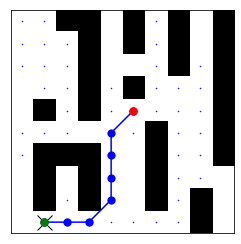

125
Prediction time:  0.06900014299998247
Reconstruction time:  0.0005424280000170256
ground truth path
predicted path


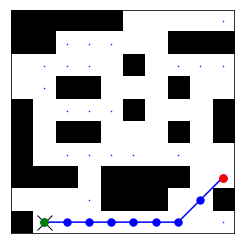

126
Prediction time:  0.06751927100000898
Reconstruction time:  0.0004895370000213006
ground truth path
predicted path


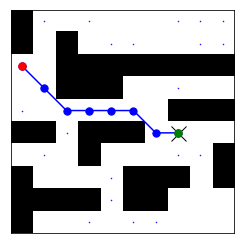

127
Prediction time:  0.06405076200002213
Reconstruction time:  0.001347992999995995
ground truth path
predicted path


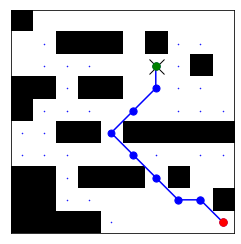

128
Prediction time:  0.2946348360000002
Reconstruction time:  0.0015001159999883384
ground truth path
predicted path


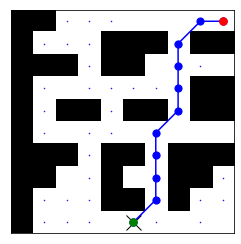

129
Prediction time:  0.05621889799999735
Reconstruction time:  0.001131828000012547
ground truth path
predicted path


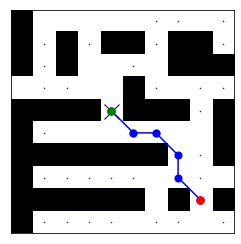

130
Prediction time:  0.06494023600001242
Reconstruction time:  0.001743736999998191
ground truth path
predicted path


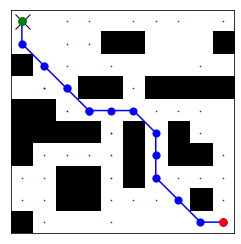

131
Prediction time:  0.06588238499998056
Reconstruction time:  0.0015473150000104852
ground truth path
predicted path


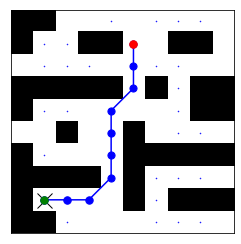

132
Prediction time:  0.06591522300001884
Reconstruction time:  0.0011927309999748559
ground truth path
predicted path


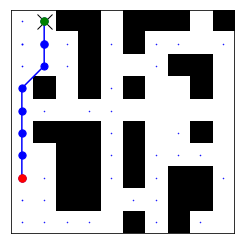

133
Prediction time:  0.06631093000001442
Reconstruction time:  0.0004997309999907884
ground truth path
predicted path


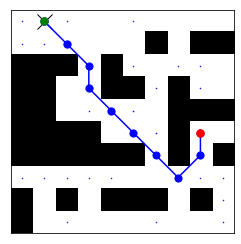

134
Prediction time:  0.0627458380000121
Reconstruction time:  0.0015906040000004396
ground truth path
predicted path


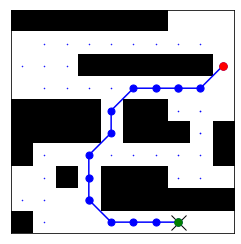

135
Prediction time:  0.06803400499998702
Reconstruction time:  0.001658738000003268
ground truth path
predicted path


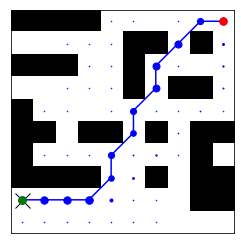

136
Prediction time:  0.0663599270000077
Reconstruction time:  0.0006008280000173727
ground truth path
predicted path


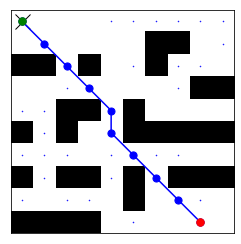

137
Prediction time:  0.06487636599999291
Reconstruction time:  0.0019855600000084905
ground truth path
predicted path


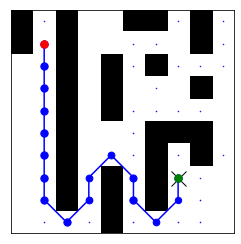

138
Prediction time:  0.06591065099999582
Reconstruction time:  0.0006976899999813213
ground truth path
predicted path


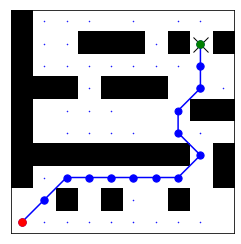

139
Prediction time:  0.06244596799999158
Reconstruction time:  0.000893079999997326
ground truth path
predicted path


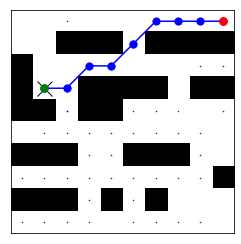

140
Prediction time:  0.0668399930000021
Reconstruction time:  0.0005838680000067598
ground truth path
predicted path


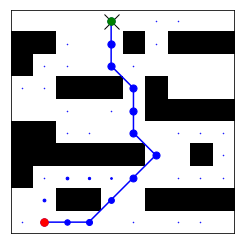

141
Prediction time:  0.06347370100002081
Reconstruction time:  0.0009832389999928637
ground truth path
predicted path


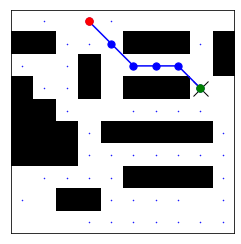

142
Prediction time:  0.06853065299998207
Reconstruction time:  0.0008020639999983814
ground truth path
predicted path


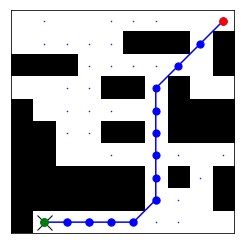

143
Prediction time:  0.06608174600000893
Reconstruction time:  0.0017335779999996248
ground truth path
predicted path


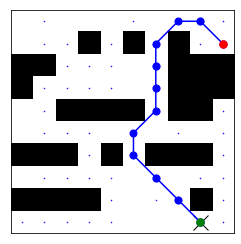

144
Prediction time:  0.056257904000005965
Reconstruction time:  0.0005083890000037172
ground truth path
predicted path


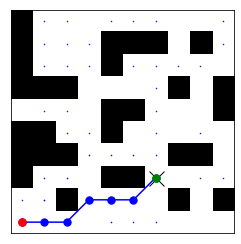

145
Prediction time:  0.4157343529999764
Reconstruction time:  0.001313907999985986
ground truth path
predicted path


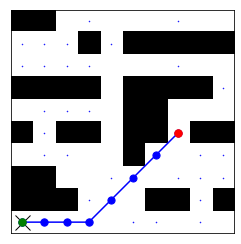

146
Prediction time:  0.06254719399998976
Reconstruction time:  0.001826515000004747
ground truth path
predicted path


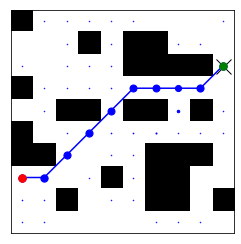

147
Prediction time:  0.06561916699999415
Reconstruction time:  0.0018607039999949393
ground truth path
predicted path


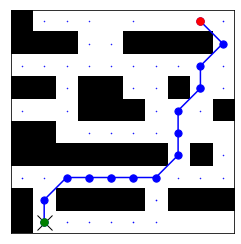

148
Prediction time:  0.07442896000000587
Reconstruction time:  0.001473014999987754
ground truth path
predicted path


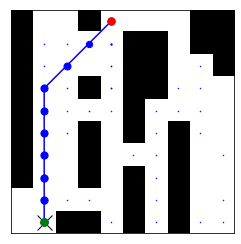

149
Prediction time:  0.0714834309999901
Reconstruction time:  0.0005980120000117495
ground truth path
predicted path


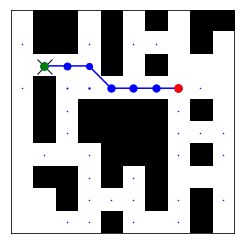

150
Prediction time:  0.06607205099999192
Reconstruction time:  0.0019355029999985618
ground truth path
predicted path


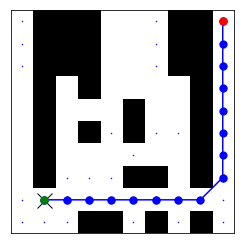

151
Prediction time:  0.06520917000000281
Reconstruction time:  0.0012082940000084363
ground truth path
predicted path


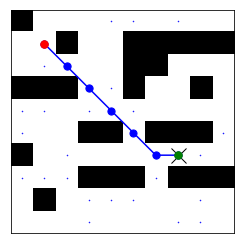

152
Prediction time:  0.06349282400000789
Reconstruction time:  0.0021415930000046046
ground truth path
predicted path


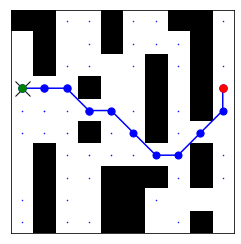

153
Prediction time:  0.06229217199998516
Reconstruction time:  0.0017164809999883346
ground truth path
predicted path


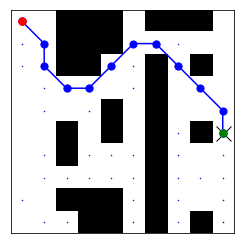

154
Prediction time:  0.07564847200001168
Reconstruction time:  0.0010170110000160548
ground truth path
predicted path


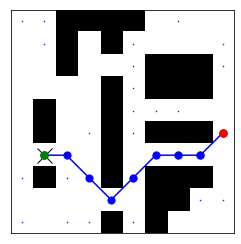

155
Prediction time:  0.06757664599999202
Reconstruction time:  0.0023943099999996775
ground truth path
predicted path


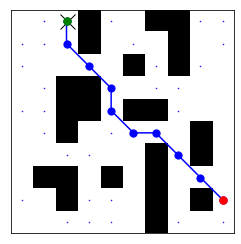

156
Prediction time:  0.06592445100000077
Reconstruction time:  0.0005280790000199431
ground truth path
predicted path


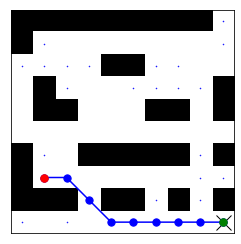

157
Prediction time:  0.06392921700000898
Reconstruction time:  0.001796325000015031
ground truth path
predicted path


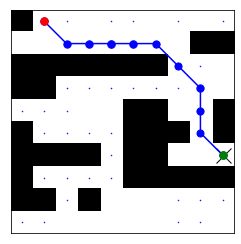

158
Prediction time:  0.06503314200000432
Reconstruction time:  0.0010991640000099778
ground truth path
predicted path


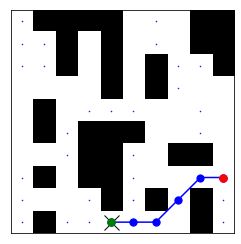

159
Prediction time:  0.05964240599999471
Reconstruction time:  0.0008948790000147255
ground truth path
predicted path


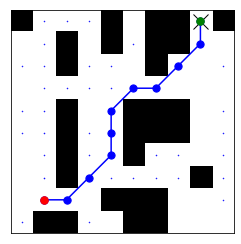

160
Prediction time:  0.06620402999999442
Reconstruction time:  0.000652215000002343
ground truth path
predicted path


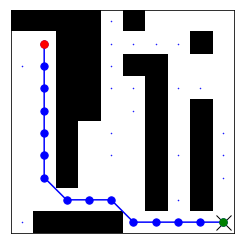

161
Prediction time:  0.06984454799999185
Reconstruction time:  0.001967576999987841
ground truth path
predicted path


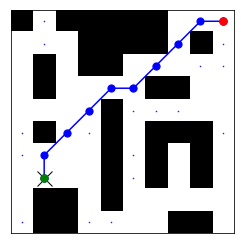

162
Prediction time:  0.0638491160000001
Reconstruction time:  0.0005231940000101076
ground truth path
predicted path


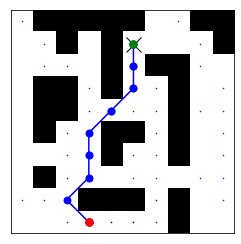

163
Prediction time:  0.32012816799999655
Reconstruction time:  0.0018396910000149092
ground truth path
predicted path


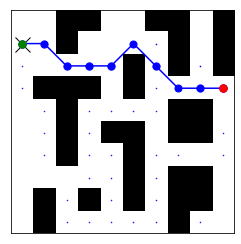

164
Prediction time:  0.06505751200000987
Reconstruction time:  0.0005400819999863415
ground truth path
predicted path


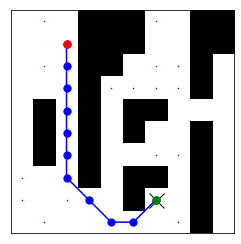

165
Prediction time:  0.06725839899999642
Reconstruction time:  0.0018025939999972707
ground truth path
predicted path


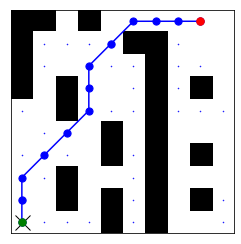

166
Prediction time:  0.07348863900000424
Reconstruction time:  0.003207054000000653
ground truth path
predicted path


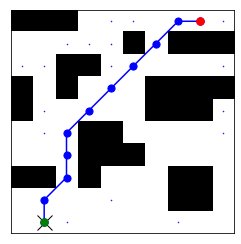

167
Prediction time:  0.07000909199999228
Reconstruction time:  0.0007860940000057326
ground truth path
predicted path


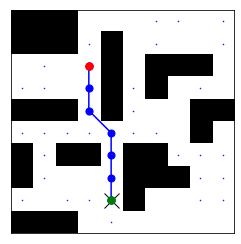

168
Prediction time:  0.06566147500001307
Reconstruction time:  0.0018641789999946923
ground truth path
predicted path


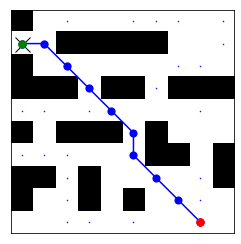

169
Prediction time:  0.0662023769999962
Reconstruction time:  0.0014661850000265986
ground truth path
predicted path


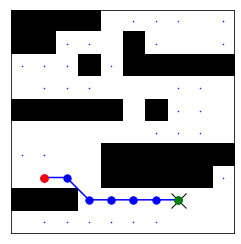

170
Prediction time:  0.07341940699998872
Reconstruction time:  0.0006511810000233709
ground truth path
predicted path


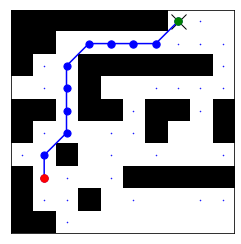

171
Prediction time:  0.07340510800000288
Reconstruction time:  0.001849749000001566
ground truth path
predicted path


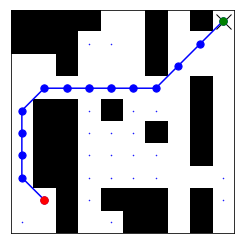

172
Prediction time:  0.05904762399998731
Reconstruction time:  0.0005926200000203607
ground truth path
predicted path


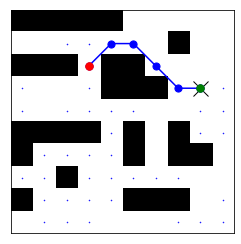

173
Prediction time:  0.06948192599998038
Reconstruction time:  0.0017110469999863653
ground truth path
predicted path


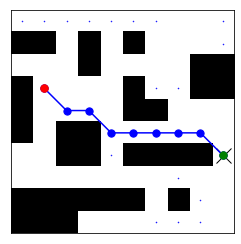

174
Prediction time:  0.06810802799998328
Reconstruction time:  0.002301208000005772
ground truth path
predicted path


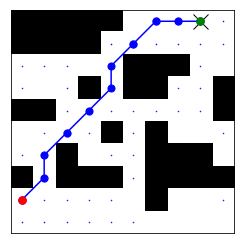

175
Prediction time:  0.06145255800001337
Reconstruction time:  0.0017699570000218046
ground truth path
predicted path


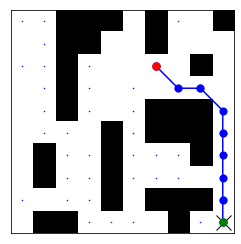

176
Prediction time:  0.07282422500000507
Reconstruction time:  0.0017912920000071608
ground truth path
predicted path


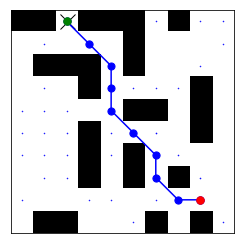

177
Prediction time:  0.06787258700001075
Reconstruction time:  0.0005343740000114394
ground truth path
predicted path


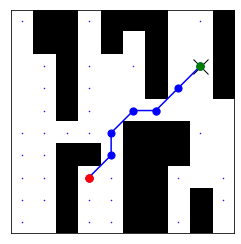

178
Prediction time:  0.07278614300000186
Reconstruction time:  0.0030104090000122596
ground truth path
predicted path


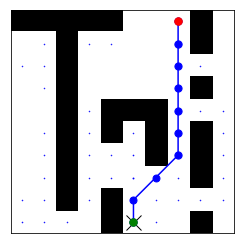

179
Prediction time:  0.0592257170000039
Reconstruction time:  0.0006412740000030226
ground truth path
predicted path


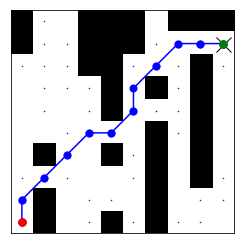

180
Prediction time:  0.07192833899998163
Reconstruction time:  0.0024832850000109374
ground truth path
predicted path


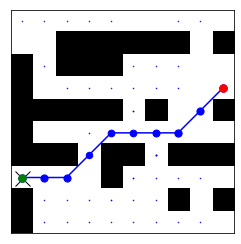

181
Prediction time:  0.3079389079999828
Reconstruction time:  0.001721191000001454
ground truth path
predicted path


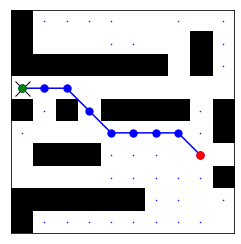

182
Prediction time:  0.06626931799999625
Reconstruction time:  0.0018230619999997089
ground truth path
predicted path


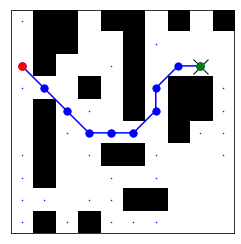

183
Prediction time:  0.06749260300000515
Reconstruction time:  0.0009714300000212006
ground truth path
predicted path


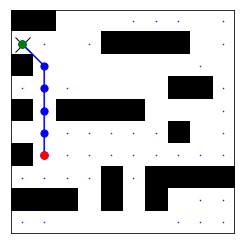

184
Prediction time:  0.0686023670000111
Reconstruction time:  0.0010353069999951003
ground truth path
predicted path


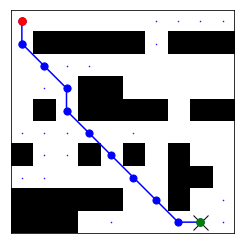

185
Prediction time:  0.06900392500000407
Reconstruction time:  0.0020022820000065167
ground truth path
predicted path


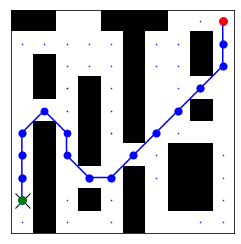

186
Prediction time:  0.07443204799997716
Reconstruction time:  0.0005535020000024815
ground truth path
predicted path


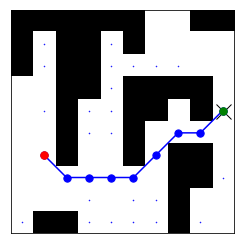

187
Prediction time:  0.06291125199999215
Reconstruction time:  0.00037940999999364067
ground truth path
predicted path


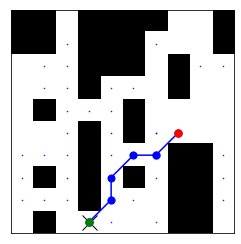

188
Prediction time:  0.06842118299999811
Reconstruction time:  0.0011434780000172395
ground truth path
predicted path


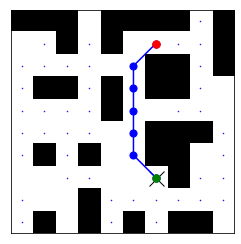

189
Prediction time:  0.06924900299998171
Reconstruction time:  0.0014708749999954307
ground truth path
predicted path


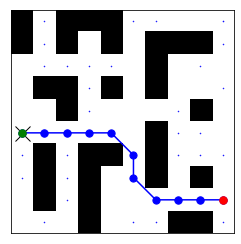

190
Prediction time:  0.061598439000022154
Reconstruction time:  0.0020982099999855564
ground truth path
predicted path


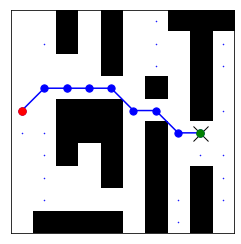

191
Prediction time:  0.06914771399999609
Reconstruction time:  0.001954648000008774
ground truth path
predicted path


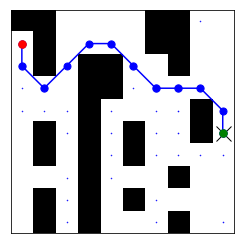

192
Prediction time:  0.06823776799998882
Reconstruction time:  0.0023292330000117545
ground truth path
predicted path


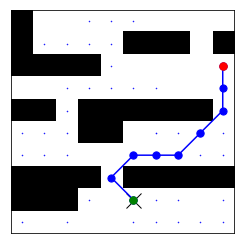

193
Prediction time:  0.07281186200000889
Reconstruction time:  0.0013443520000180342
ground truth path
predicted path


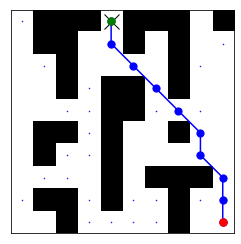

194
Prediction time:  0.06686459399998057
Reconstruction time:  0.0017734479999944597
ground truth path
predicted path


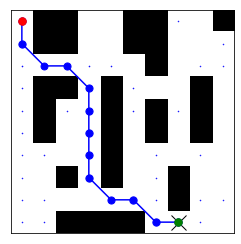

195
Prediction time:  0.07439609300001848
Reconstruction time:  0.0009931989999927282
ground truth path
predicted path


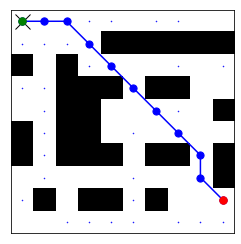

196
Prediction time:  0.06752054000000385
Reconstruction time:  0.0004976959999964947
ground truth path
predicted path


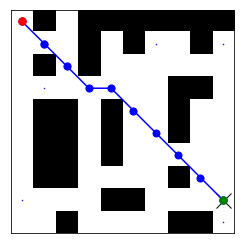

197
Prediction time:  0.06579062600002317
Reconstruction time:  0.0007164209999928062
ground truth path
predicted path


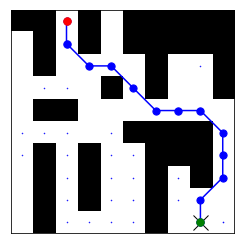

198
Prediction time:  0.06775261600000704
Reconstruction time:  0.0006157490000191501
ground truth path
predicted path


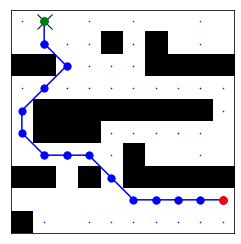

199
Prediction time:  0.3166745350000042
Reconstruction time:  0.0017015809999918474
ground truth path
predicted path


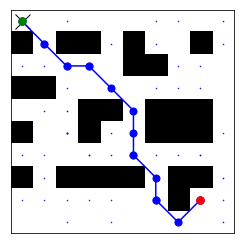

200
Prediction time:  0.06355791100000374
Reconstruction time:  0.0009392139999988558
ground truth path
predicted path


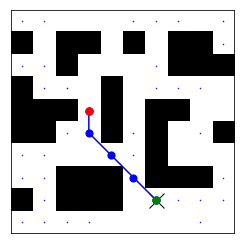

201
Prediction time:  0.07181450400000244
Reconstruction time:  0.003126505000011548
ground truth path
predicted path


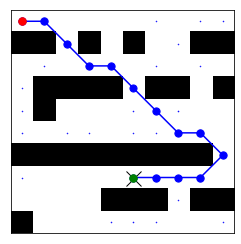

202
Prediction time:  0.06830062700001349
Reconstruction time:  0.0005036249999932352
ground truth path
predicted path


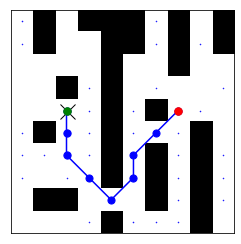

203
Prediction time:  0.06559665300000006
Reconstruction time:  0.0014510139999970306
ground truth path
predicted path


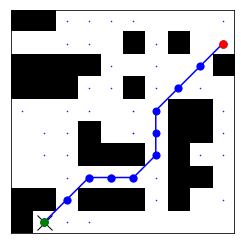

204
Prediction time:  0.06983070300000804
Reconstruction time:  0.0005820259999893551
ground truth path
predicted path


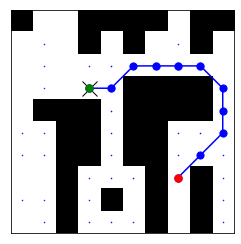

205
Prediction time:  0.06888852000000156
Reconstruction time:  0.0007215740000106052
ground truth path
predicted path


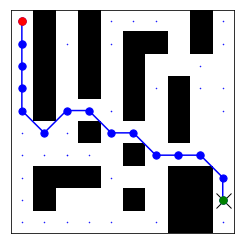

206
Prediction time:  0.0679707279999775
Reconstruction time:  0.00285590699999716
ground truth path
predicted path


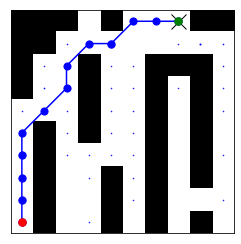

207
Prediction time:  0.08558670999997275
Reconstruction time:  0.0009764289999907305
ground truth path
predicted path


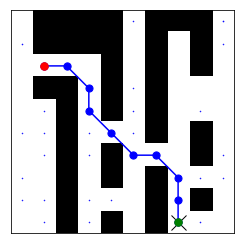

208
Prediction time:  0.06987608600002204
Reconstruction time:  0.000455353000006653
ground truth path
predicted path


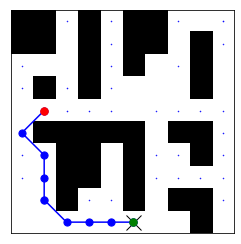

209
Prediction time:  0.07442082299999697
Reconstruction time:  0.0018174539999904482
ground truth path
predicted path


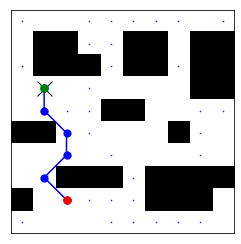

210
Prediction time:  0.06223572800001875
Reconstruction time:  0.0017753680000112126
ground truth path
predicted path


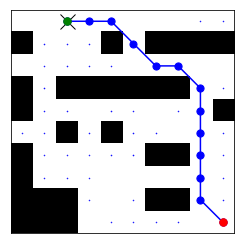

211
Prediction time:  0.060607183000001896
Reconstruction time:  0.00224837899997965
ground truth path
predicted path


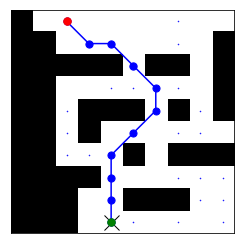

212
Prediction time:  0.067834916999999
Reconstruction time:  0.0013996529999928953
ground truth path
predicted path


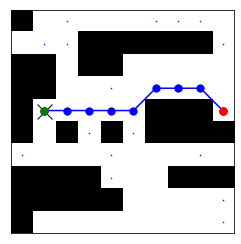

213
Prediction time:  0.07691265599999042
Reconstruction time:  0.0004397759999790196
ground truth path
predicted path


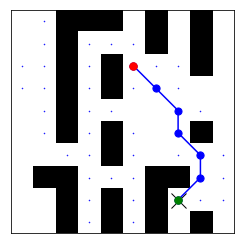

214
Prediction time:  0.062467027000025155
Reconstruction time:  0.0010952730000042266
ground truth path
predicted path


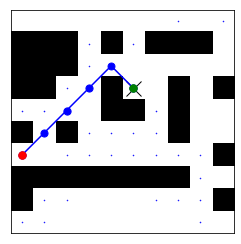

215
Prediction time:  0.08302266800001235
Reconstruction time:  0.0010518859999990582
ground truth path
predicted path


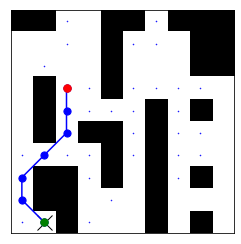

216
Prediction time:  0.07104507099998614
Reconstruction time:  0.002619856999984904
ground truth path
predicted path


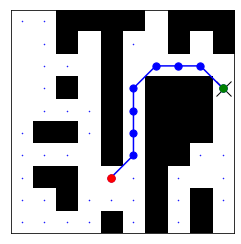

217
Prediction time:  0.29733661399998823
Reconstruction time:  0.0005973140000037347
ground truth path
predicted path


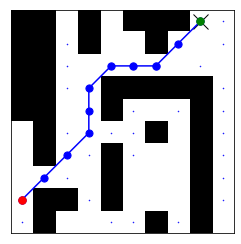

218
Prediction time:  0.06288606699999377
Reconstruction time:  0.0005843670000160728
ground truth path
predicted path


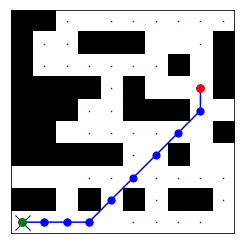

219
Prediction time:  0.07342758999999432
Reconstruction time:  0.0005500909999796022
ground truth path
predicted path


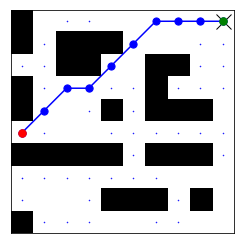

220
Prediction time:  0.06975369500000284
Reconstruction time:  0.0011871899999960078
ground truth path
predicted path


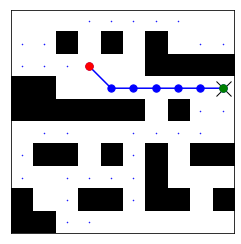

221
Prediction time:  0.06882365200002027
Reconstruction time:  0.0007824790000086068
ground truth path
predicted path


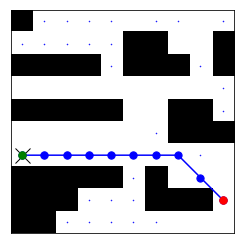

222
Prediction time:  0.06906197499998257
Reconstruction time:  0.0004480320000084248
ground truth path
predicted path


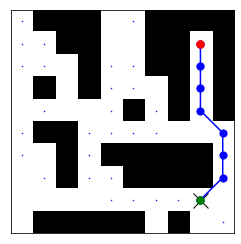

223
Prediction time:  0.06225163499999553
Reconstruction time:  0.0029082499999901756
ground truth path
predicted path


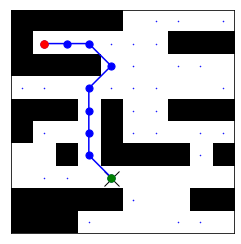

224
Prediction time:  0.0675945229999968
Reconstruction time:  0.002328058999978566
ground truth path
predicted path


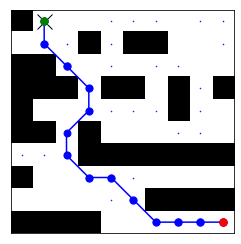

225
Prediction time:  0.06981190199999787
Reconstruction time:  0.0012421479999886742
ground truth path
predicted path


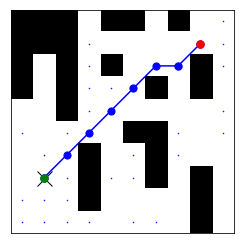

226
Prediction time:  0.07221817999999303
Reconstruction time:  0.0006936270000039713
ground truth path
predicted path


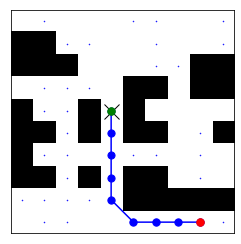

227
Prediction time:  0.05608857699999703
Reconstruction time:  0.0006410180000102628
ground truth path
predicted path


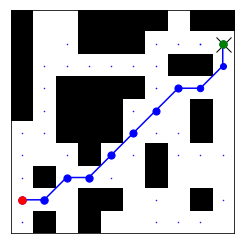

228
Prediction time:  0.06878288699999757
Reconstruction time:  0.002163975000001983
ground truth path
predicted path


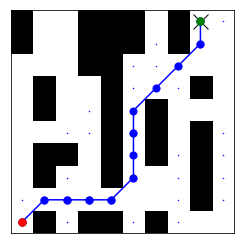

229
Prediction time:  0.06683175200001301
Reconstruction time:  0.0006330049999974108
ground truth path
predicted path


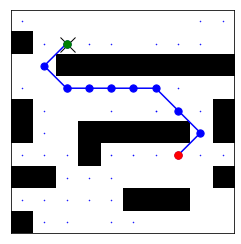

230
Prediction time:  0.07217648499999996
Reconstruction time:  0.0009424689999946168
ground truth path
predicted path


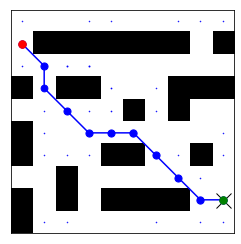

231
Prediction time:  0.0720377040000244
Reconstruction time:  0.0008450299999935851
ground truth path
predicted path


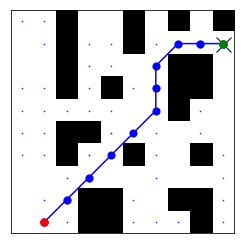

232
Prediction time:  0.05797707599998603
Reconstruction time:  0.000543502999988732
ground truth path
predicted path


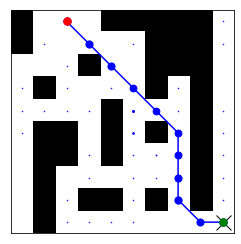

233
Prediction time:  0.0722151980000092
Reconstruction time:  0.0021887339999864253
ground truth path
predicted path


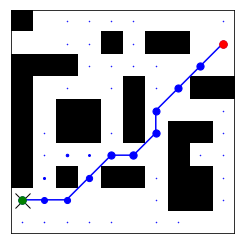

234
Prediction time:  0.41483947800000465
Reconstruction time:  0.00041727499998955864
ground truth path
predicted path


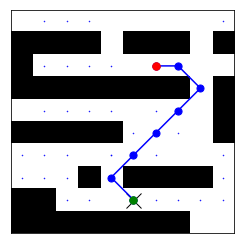

235
Prediction time:  0.06725067200000012
Reconstruction time:  0.0009858760000156508
ground truth path
predicted path


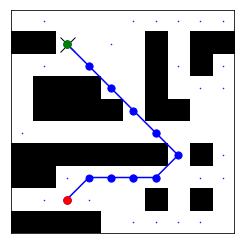

236
Prediction time:  0.06916188399998191
Reconstruction time:  0.0016572979999978088
ground truth path
predicted path


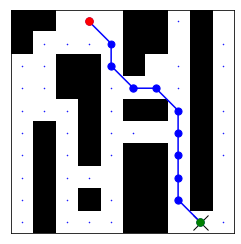

237
Prediction time:  0.0689583070000026
Reconstruction time:  0.0005766830000197842
ground truth path
predicted path


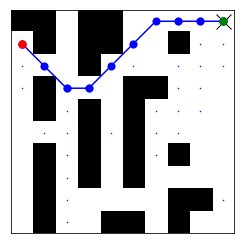

238
Prediction time:  0.06925291000001721
Reconstruction time:  0.0006242409999970278
ground truth path
predicted path


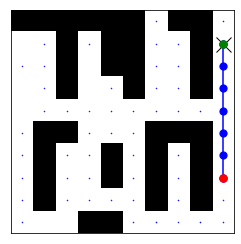

239
Prediction time:  0.05731487199997787
Reconstruction time:  0.0004467239999996764
ground truth path
predicted path


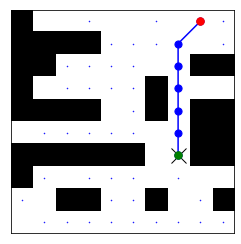

240
Prediction time:  0.07093815600001108
Reconstruction time:  0.0007035520000044926
ground truth path
predicted path


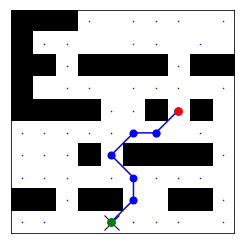

241
Prediction time:  0.05594036499999788
Reconstruction time:  0.0006726469999875917
ground truth path
predicted path


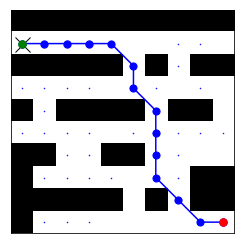

242
Prediction time:  0.06683575499999961
Reconstruction time:  0.001160247000001391
ground truth path
predicted path


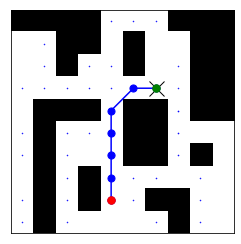

243
Prediction time:  0.06297356099997842
Reconstruction time:  0.0019153060000007827
ground truth path
predicted path


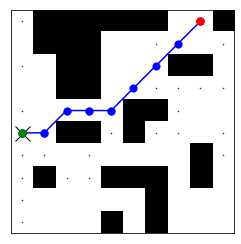

244
Prediction time:  0.07168464599999425
Reconstruction time:  0.0009044649999907506
ground truth path
predicted path


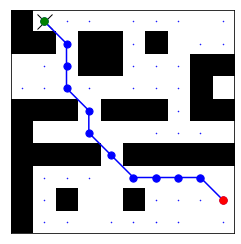

245
Prediction time:  0.057958831999997074
Reconstruction time:  0.00164878300000737
ground truth path
predicted path


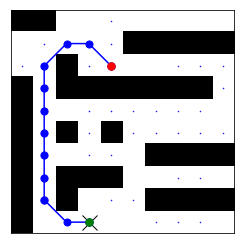

246
Prediction time:  0.06979653200002645
Reconstruction time:  0.0005945590000067114
ground truth path
predicted path


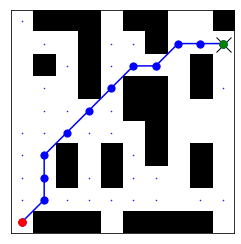

247
Prediction time:  0.06937317000000576
Reconstruction time:  0.0006384080000145786
ground truth path
predicted path


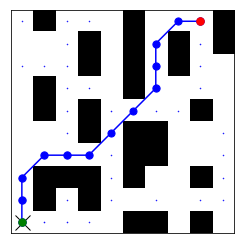

248
Prediction time:  0.0690899649999892
Reconstruction time:  0.0010640619999833234
ground truth path
predicted path


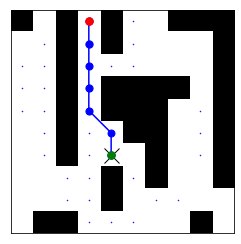

249
Prediction time:  0.07038350799999193
Reconstruction time:  0.00093322099999682
ground truth path
predicted path


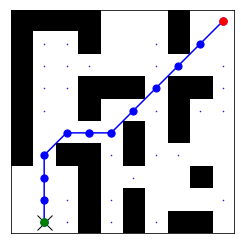

250
Prediction time:  0.06511775799998532
Reconstruction time:  0.0018215329999975438
ground truth path
predicted path


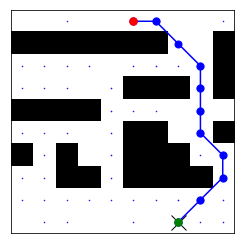

251
Prediction time:  0.31122465199999283
Reconstruction time:  0.0026269610000042576
ground truth path
predicted path


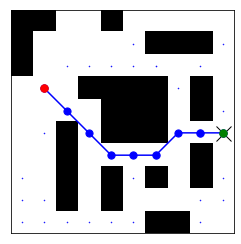

252
Prediction time:  0.06391030499997896
Reconstruction time:  0.0016501220000009198
ground truth path
predicted path


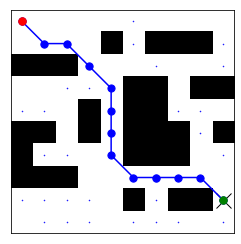

253
Prediction time:  0.06906065300000819
Reconstruction time:  0.0013189770000110457
ground truth path
predicted path


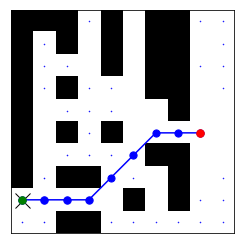

254
Prediction time:  0.06840091000000825
Reconstruction time:  0.0025040970000134166
ground truth path
predicted path


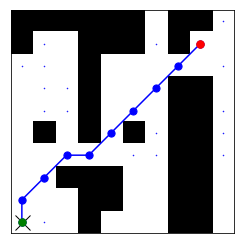

255
Prediction time:  0.0693354720000059
Reconstruction time:  0.0015489719999948193
ground truth path
predicted path


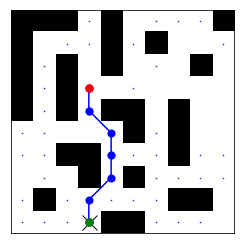

256
Prediction time:  0.05629345500000227
Reconstruction time:  0.0021940599999936694
ground truth path
predicted path


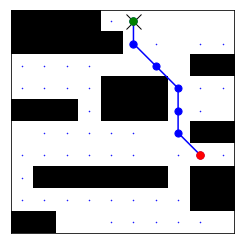

257
Prediction time:  0.06909755600000267
Reconstruction time:  0.00196714699998779
ground truth path
predicted path


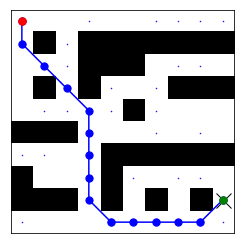

258
Prediction time:  0.06925690799999984
Reconstruction time:  0.000579630000004272
ground truth path
predicted path


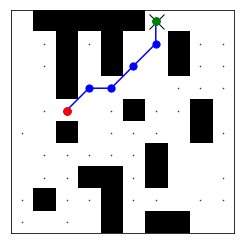

259
Prediction time:  0.06241209600000275
Reconstruction time:  0.0004472270000235312
ground truth path
predicted path


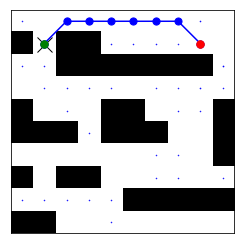

260
Prediction time:  0.0700256940000088
Reconstruction time:  0.0006531950000123743
ground truth path
predicted path


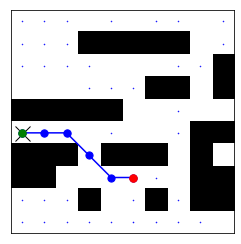

261
Prediction time:  0.06595891500001017
Reconstruction time:  0.00177523199999996
ground truth path
predicted path


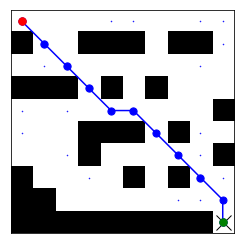

262
Prediction time:  0.07280964599999606
Reconstruction time:  0.000712386000003562
ground truth path
predicted path


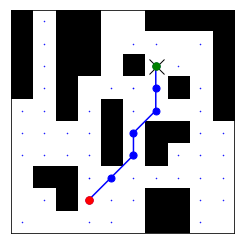

263
Prediction time:  0.06150752299998885
Reconstruction time:  0.0010275410000133434
ground truth path
predicted path


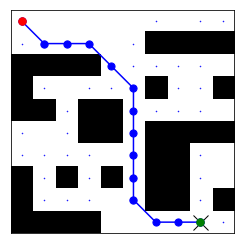

264
Prediction time:  0.0723136550000163
Reconstruction time:  0.0008783440000001974
ground truth path
predicted path


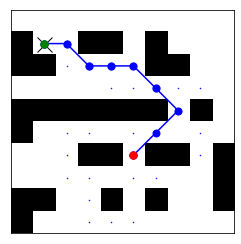

265
Prediction time:  0.07144780199999445
Reconstruction time:  0.0009719530000040777
ground truth path
predicted path


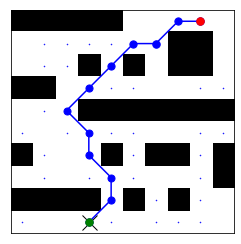

266
Prediction time:  0.05890234599999644
Reconstruction time:  0.0009732860000042365
ground truth path
predicted path


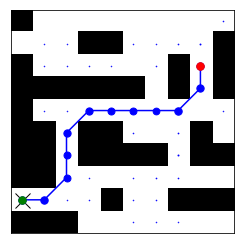

267
Prediction time:  0.07044534799999269
Reconstruction time:  0.0006698089999872536
ground truth path
predicted path


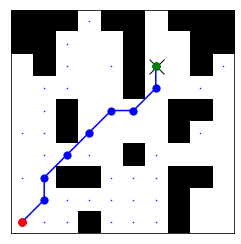

268
Prediction time:  0.066275595999997
Reconstruction time:  0.0019124410000017633
ground truth path
predicted path


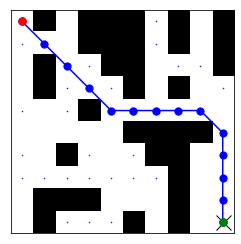

269
Prediction time:  0.30811914199998114
Reconstruction time:  0.0010817099999940183
ground truth path
predicted path


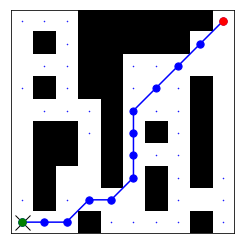

270
Prediction time:  0.07149024699998563
Reconstruction time:  0.0005220130000225254
ground truth path
predicted path


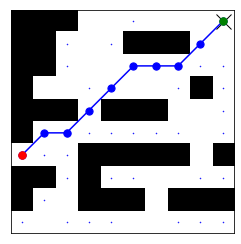

271
Prediction time:  0.0695078069999795
Reconstruction time:  0.0027512380000018766
ground truth path
predicted path


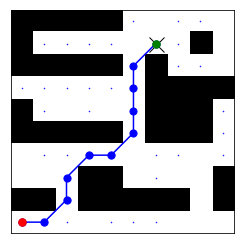

272
Prediction time:  0.0660964129999968
Reconstruction time:  0.0007413929999984248
ground truth path
predicted path


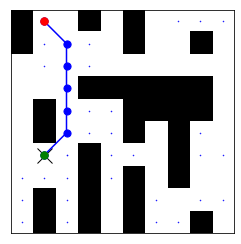

273
Prediction time:  0.07478037100000279
Reconstruction time:  0.000426720000007208
ground truth path
predicted path


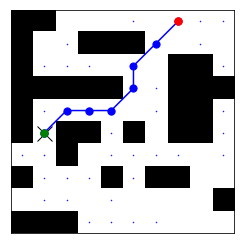

274
Prediction time:  0.06564265700001215
Reconstruction time:  0.0011628910000069936
ground truth path
predicted path


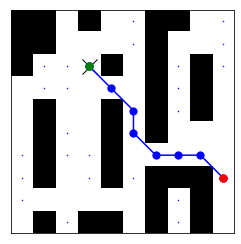

275
Prediction time:  0.06811190199999828
Reconstruction time:  0.0007636509999997543
ground truth path
predicted path


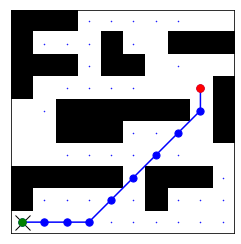

276
Prediction time:  0.058954006999982767
Reconstruction time:  0.00035555300001988144
ground truth path
predicted path


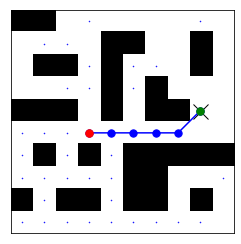

277
Prediction time:  0.06563581500000737
Reconstruction time:  0.000455093999988776
ground truth path
predicted path


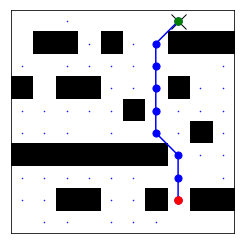

278
Prediction time:  0.07078378099998872
Reconstruction time:  0.0011263810000059493
ground truth path
predicted path


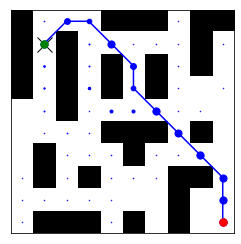

279
Prediction time:  0.0747146869999824
Reconstruction time:  0.0009112619999882554
ground truth path
predicted path


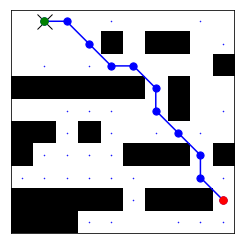

280
Prediction time:  0.06646089400001642
Reconstruction time:  0.0014377390000106516
ground truth path
predicted path


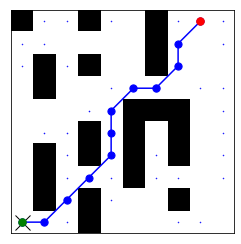

281
Prediction time:  0.06658781199999453
Reconstruction time:  0.0008121240000207308
ground truth path
predicted path


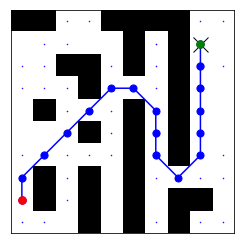

282
Prediction time:  0.06978982399999722
Reconstruction time:  0.002181749000015998
ground truth path
predicted path


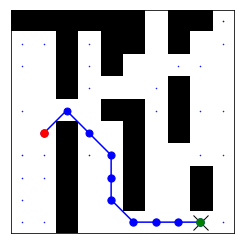

283
Prediction time:  0.07069979800002102
Reconstruction time:  0.0008904410000241114
ground truth path
predicted path


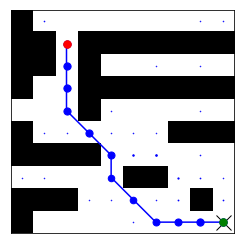

284
Prediction time:  0.07184783200000311
Reconstruction time:  0.0022764960000074552
ground truth path
predicted path


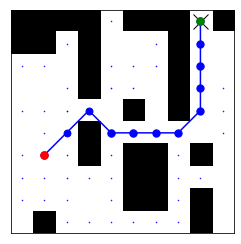

285
Prediction time:  0.0595447809999996
Reconstruction time:  0.0008457190000115133
ground truth path
predicted path


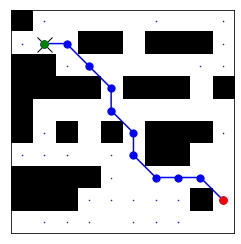

286
Prediction time:  0.31989906200001883
Reconstruction time:  0.0005731610000054843
ground truth path
predicted path


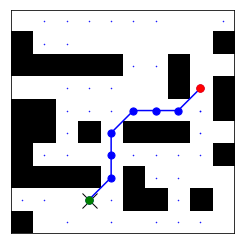

287
Prediction time:  0.07037858499998606
Reconstruction time:  0.0012873889999980292
ground truth path
predicted path


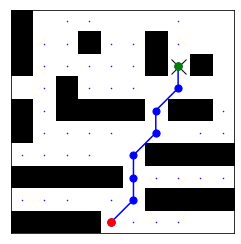

288
Prediction time:  0.06883006500001443
Reconstruction time:  0.0005647349999833295
ground truth path
predicted path


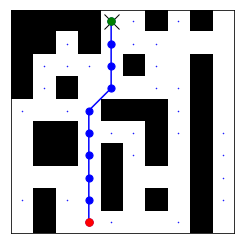

289
Prediction time:  0.0678091899999913
Reconstruction time:  0.0009071009999956914
ground truth path
predicted path


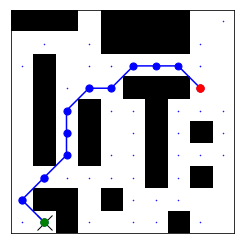

290
Prediction time:  0.05819030899999689
Reconstruction time:  0.0012572079999983998
ground truth path
predicted path


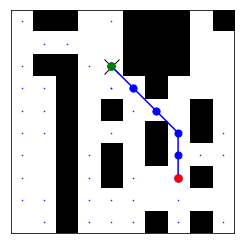

291
Prediction time:  0.06680306600000563
Reconstruction time:  0.0017120869999871502
ground truth path
predicted path


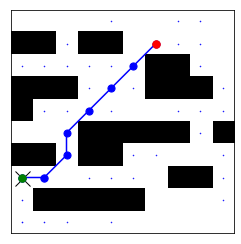

292
Prediction time:  0.06888998499999843
Reconstruction time:  0.000852402000020902
ground truth path
predicted path


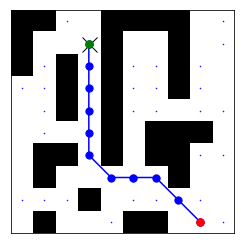

293
Prediction time:  0.06815278700000249
Reconstruction time:  0.0007555299999921772
ground truth path
predicted path


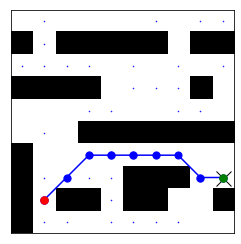

294
Prediction time:  0.059873893000002454
Reconstruction time:  0.0015382530000067618
ground truth path
predicted path


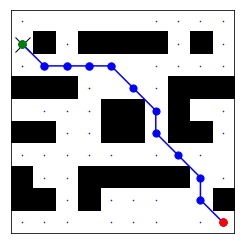

295
Prediction time:  0.06688099699999839
Reconstruction time:  0.001165539999988141
ground truth path
predicted path


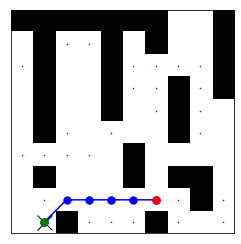

296
Prediction time:  0.0688298839999959
Reconstruction time:  0.0007087019999971744
ground truth path
predicted path


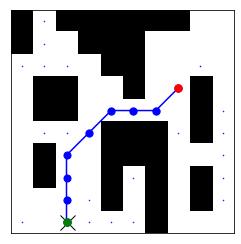

297
Prediction time:  0.07199242300001174
Reconstruction time:  0.0022587119999855076
ground truth path
predicted path


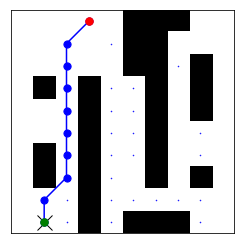

298
Prediction time:  0.06733749400001443
Reconstruction time:  0.0005799770000010085
ground truth path
predicted path


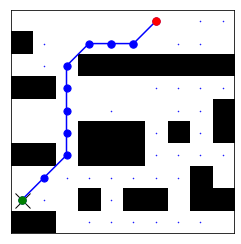

299
Prediction time:  0.07134737299998051
Reconstruction time:  0.0009268029999986993
ground truth path
predicted path


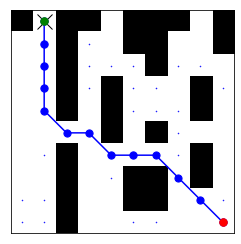

300
Prediction time:  0.06772742199999016
Reconstruction time:  0.0006121489999770802
ground truth path
predicted path


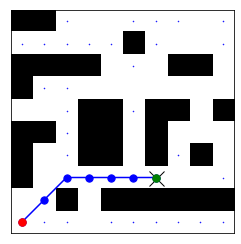

301
Prediction time:  0.0687656279999942
Reconstruction time:  0.0004911190000029819
ground truth path
predicted path


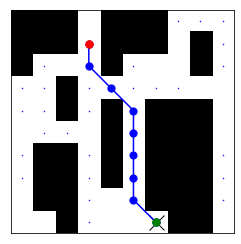

302
Prediction time:  0.07321001700000807
Reconstruction time:  0.0005555850000007467
ground truth path
predicted path


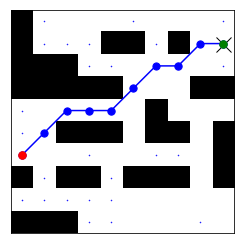

303
Prediction time:  0.06952330600000778
Reconstruction time:  0.0005701129999806653
ground truth path
predicted path


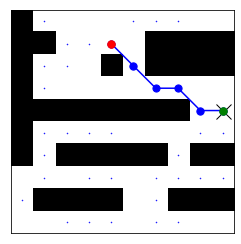

304
Prediction time:  0.3208325450000018
Reconstruction time:  0.0005971230000056948
ground truth path
predicted path


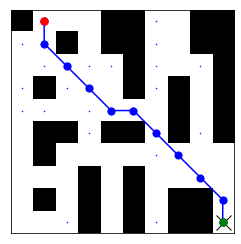

305
Prediction time:  0.07271286400001031
Reconstruction time:  0.0007568130000095152
ground truth path
predicted path


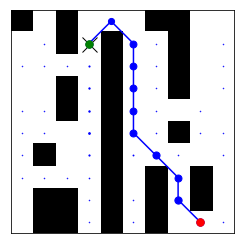

306
Prediction time:  0.06775996499999337
Reconstruction time:  0.00042305299999156887
ground truth path
predicted path


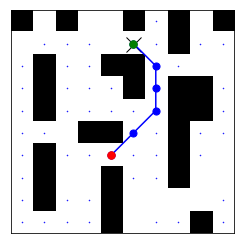

307
Prediction time:  0.0703019270000027
Reconstruction time:  0.0008780969999975241
ground truth path
predicted path


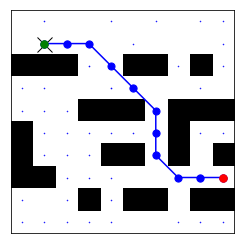

308
Prediction time:  0.0644816589999948
Reconstruction time:  0.0016319249999980912
ground truth path
predicted path


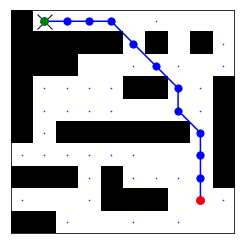

309
Prediction time:  0.06073189599999296
Reconstruction time:  0.0018457629999772962
ground truth path
predicted path


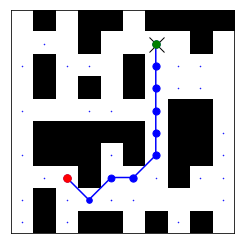

310
Prediction time:  0.06871534299997961
Reconstruction time:  0.000844267000019272
ground truth path
predicted path


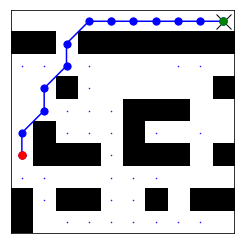

311
Prediction time:  0.06913146799999481
Reconstruction time:  0.0007351409999785119
ground truth path
predicted path


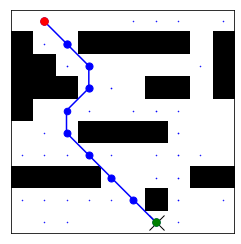

312
Prediction time:  0.05937362399998847
Reconstruction time:  0.0005385839999973996
ground truth path
predicted path


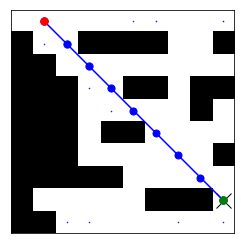

313
Prediction time:  0.0636145790000171
Reconstruction time:  0.0008311670000011873
ground truth path
predicted path


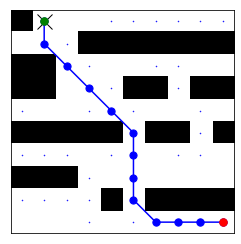

314
Prediction time:  0.06238200900000379
Reconstruction time:  0.00043578099999308506
ground truth path
predicted path


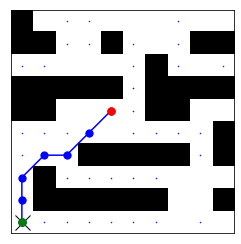

315
Prediction time:  0.07142429999998967
Reconstruction time:  0.0006227659999922253
ground truth path
predicted path


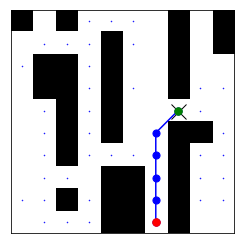

316
Prediction time:  0.06128079900000216
Reconstruction time:  0.0009042190000059236
ground truth path
predicted path


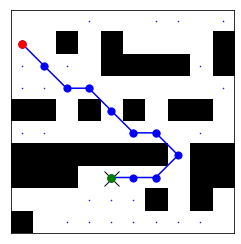

317
Prediction time:  0.06721033299999135
Reconstruction time:  0.0008260810000138008
ground truth path
predicted path


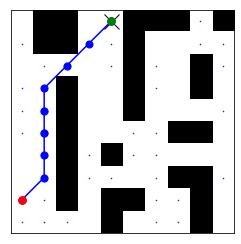

318
Prediction time:  0.06006905199998869
Reconstruction time:  0.002982215999992377
ground truth path
predicted path


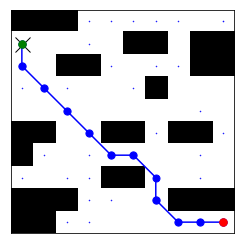

319
Prediction time:  0.0694822320000128
Reconstruction time:  0.0007330990000014026
ground truth path
predicted path


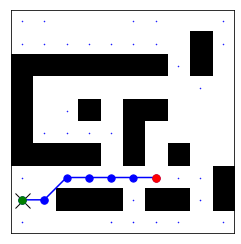

320
Prediction time:  0.0697812729999896
Reconstruction time:  0.0006378109999900516
ground truth path
predicted path


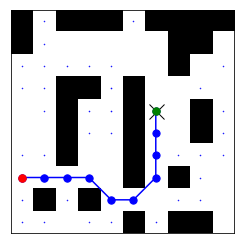

321
Prediction time:  0.3046718740000074
Reconstruction time:  0.0005764160000012453
ground truth path
predicted path


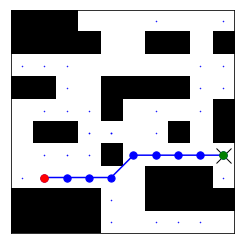

322
Prediction time:  0.06760300499999516
Reconstruction time:  0.0012430650000112564
ground truth path
predicted path


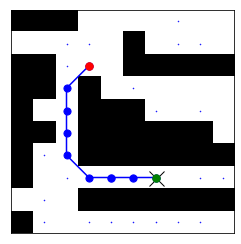

323
Prediction time:  0.07207984100000431
Reconstruction time:  0.0006067360000088229
ground truth path
predicted path


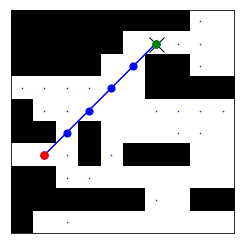

324
Prediction time:  0.06999021500001845
Reconstruction time:  0.0009268059999953948
ground truth path
predicted path


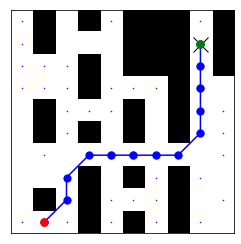

325
Prediction time:  0.059516986000005545
Reconstruction time:  0.0006876149999754944
ground truth path
predicted path


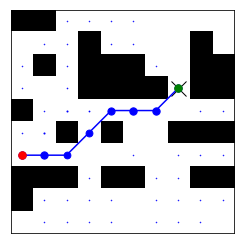

326
Prediction time:  0.07974675200000547
Reconstruction time:  0.0009729580000055194
ground truth path
predicted path


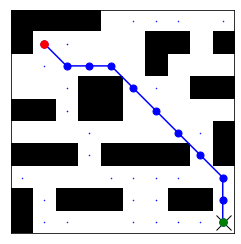

327
Prediction time:  0.06994135899998355
Reconstruction time:  0.0007739140000069256
ground truth path
predicted path


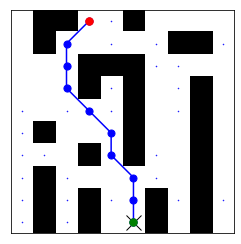

328
Prediction time:  0.07230290600000444
Reconstruction time:  0.000825163000001794
ground truth path
predicted path


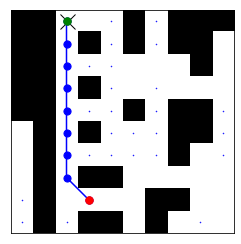

329
Prediction time:  0.06959834600002068
Reconstruction time:  0.0009300030000076731
ground truth path
predicted path


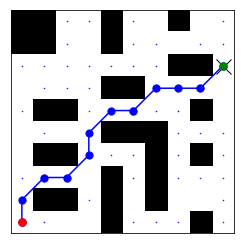

330
Prediction time:  0.06967118899999036
Reconstruction time:  0.0006588519999866094
ground truth path
predicted path


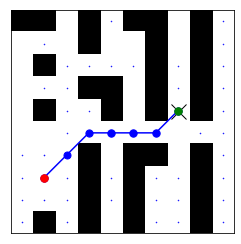

331
Prediction time:  0.06569709300001136
Reconstruction time:  0.0007434569999986707
ground truth path
predicted path


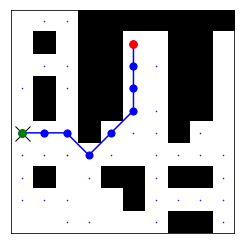

332
Prediction time:  0.07266460600001778
Reconstruction time:  0.0007116380000127265
ground truth path
predicted path


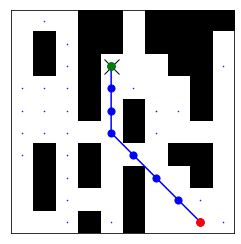

333
Prediction time:  0.07515406600001029
Reconstruction time:  0.0008949850000021797
ground truth path
predicted path


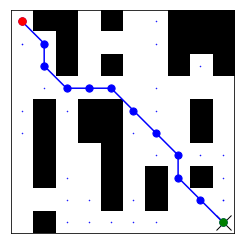

334
Prediction time:  0.07051391999999623
Reconstruction time:  0.0026527710000152638
ground truth path
predicted path


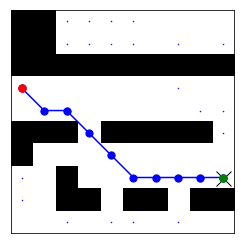

335
Prediction time:  0.06902720300001874
Reconstruction time:  0.0029753279999908955
ground truth path
predicted path


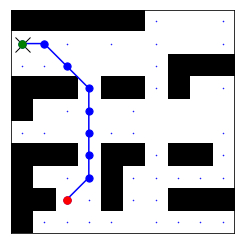

336
Prediction time:  0.07116651699999466
Reconstruction time:  0.0026133389999927203
ground truth path
predicted path


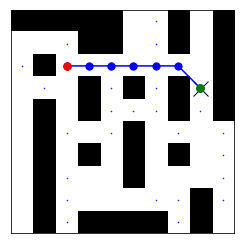

337
Prediction time:  0.07375326400000404
Reconstruction time:  0.0015754910000111977
ground truth path
predicted path


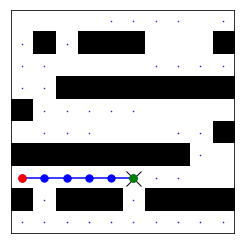

338
Prediction time:  0.06697122299999592
Reconstruction time:  0.000864503999991939
ground truth path
predicted path


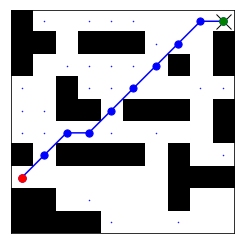

339
Prediction time:  0.3256799499999943
Reconstruction time:  0.0025463610000144854
ground truth path
predicted path


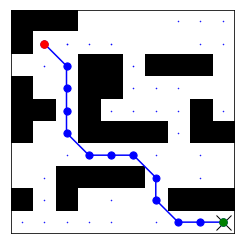

340
Prediction time:  0.06970481000001882
Reconstruction time:  0.0006146869999952287
ground truth path
predicted path


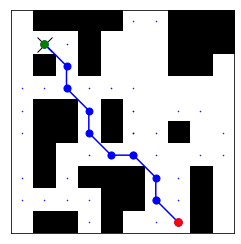

341
Prediction time:  0.07195483699999272
Reconstruction time:  0.0012526279999747203
ground truth path
predicted path


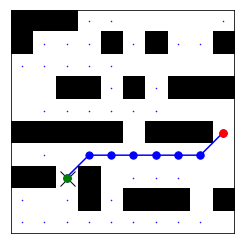

342
Prediction time:  0.07012840000001574
Reconstruction time:  0.0010090160000117976
ground truth path
predicted path


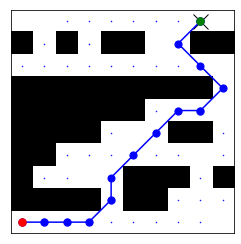

343
Prediction time:  0.06892127300000084
Reconstruction time:  0.0010348039999996672
ground truth path
predicted path


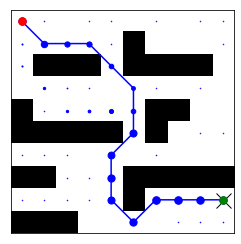

344
Prediction time:  0.06561284600002182
Reconstruction time:  0.0006597459999966304
ground truth path
predicted path


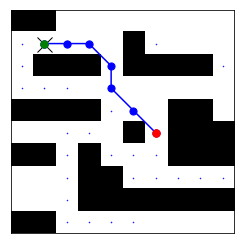

345
Prediction time:  0.06892123599999422
Reconstruction time:  0.0008336180000014792
ground truth path
predicted path


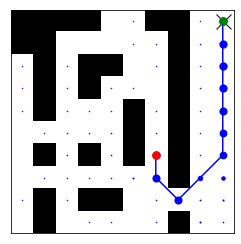

346
Prediction time:  0.05979054999997402
Reconstruction time:  0.0006863499999951728
ground truth path
predicted path


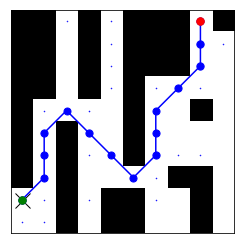

347
Prediction time:  0.06752362200001016
Reconstruction time:  0.000881749000001264
ground truth path
predicted path


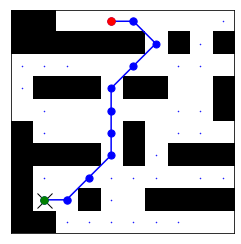

348
Prediction time:  0.061232910000001084
Reconstruction time:  0.001601652999994485
ground truth path
predicted path


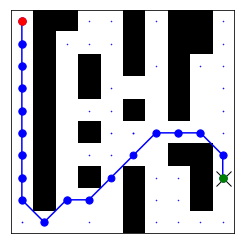

349
Prediction time:  0.07003367099997604
Reconstruction time:  0.0008394360000067991
ground truth path
predicted path


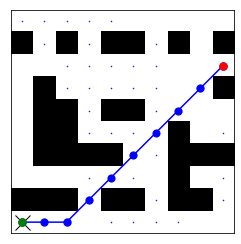

350
Prediction time:  0.06835443099998884
Reconstruction time:  0.0028528740000126618
ground truth path
predicted path


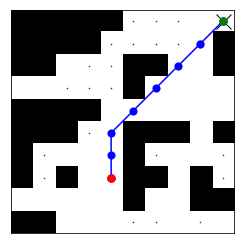

351
Prediction time:  0.07929129299998294
Reconstruction time:  0.0006174030000067887
ground truth path
predicted path


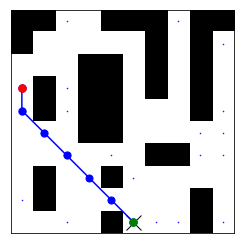

352
Prediction time:  0.07118896000000063
Reconstruction time:  0.0025223920000030375
ground truth path
predicted path


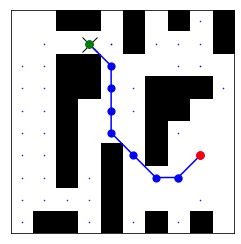

353
Prediction time:  0.07093915400000128
Reconstruction time:  0.0003952460000107294
ground truth path
predicted path


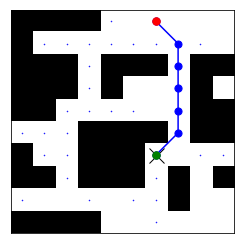

354
Prediction time:  0.07316412500000524
Reconstruction time:  0.0026460640000038893
ground truth path
predicted path


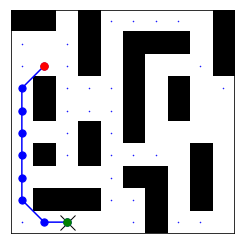

355
Prediction time:  0.07195576300000539
Reconstruction time:  0.000642246000012392
ground truth path
predicted path


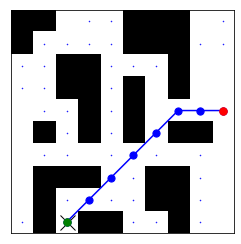

356
Prediction time:  0.31138059399998497
Reconstruction time:  0.0021680269999819757
ground truth path
predicted path


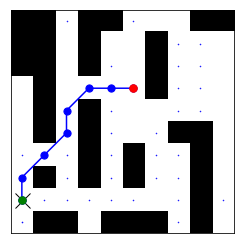

357
Prediction time:  0.06832907999998383
Reconstruction time:  0.0014399049999838098
ground truth path
predicted path


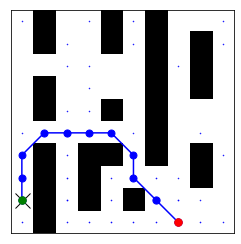

358
Prediction time:  0.07344046100001833
Reconstruction time:  0.0008264900000085618
ground truth path
predicted path


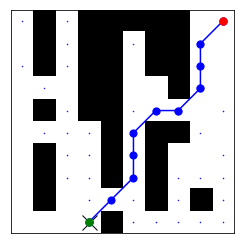

359
Prediction time:  0.07280596399999695
Reconstruction time:  0.0023973129999887988
ground truth path
predicted path


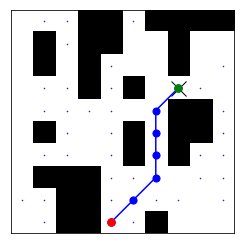

360
Prediction time:  0.07077386299999944
Reconstruction time:  0.000785145999998349
ground truth path
predicted path


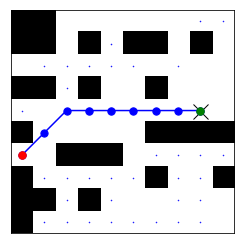

361
Prediction time:  0.06790412500001253
Reconstruction time:  0.0026357959999927516
ground truth path
predicted path


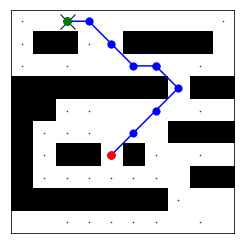

362
Prediction time:  0.072508895999988
Reconstruction time:  0.001022312000003467
ground truth path
predicted path


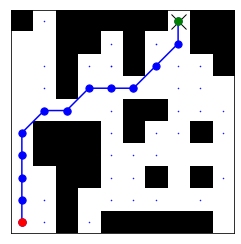

363
Prediction time:  0.06749307399999793
Reconstruction time:  0.001925431999978855
ground truth path
predicted path


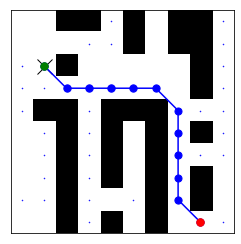

364
Prediction time:  0.07125338199998055
Reconstruction time:  0.0012376029999927596
ground truth path
predicted path


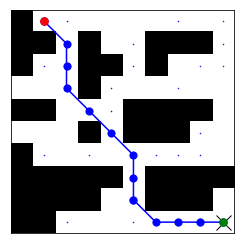

365
Prediction time:  0.0692812419999882
Reconstruction time:  0.0006964089999996759
ground truth path
predicted path


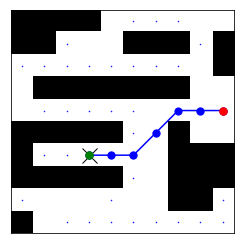

366
Prediction time:  0.06766486899999791
Reconstruction time:  0.001745787000004384
ground truth path
predicted path


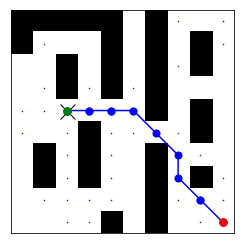

367
Prediction time:  0.0688299939999979
Reconstruction time:  0.0007273820000079922
ground truth path
predicted path


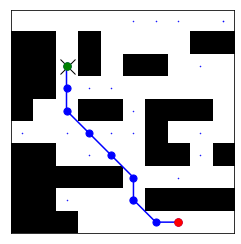

368
Prediction time:  0.06988049100002058
Reconstruction time:  0.0007080370000096536
ground truth path
predicted path


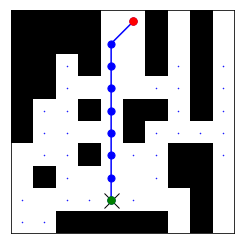

369
Prediction time:  0.06383816599998227
Reconstruction time:  0.0008822549999933926
ground truth path
predicted path


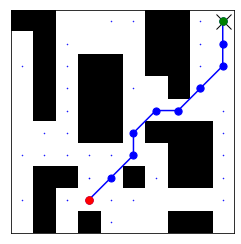

370
Prediction time:  0.0709801860000141
Reconstruction time:  0.0004627030000108334
ground truth path
predicted path


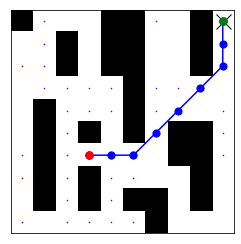

371
Prediction time:  0.07065541800000119
Reconstruction time:  0.0006418579999944996
ground truth path
predicted path


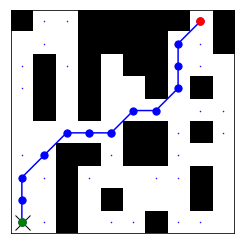

372
Prediction time:  0.07362867099999448
Reconstruction time:  0.0006101209999940238
ground truth path
predicted path


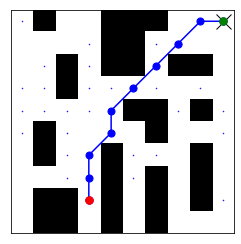

373
Prediction time:  0.06974293199999693
Reconstruction time:  0.000697760999997854
ground truth path
predicted path


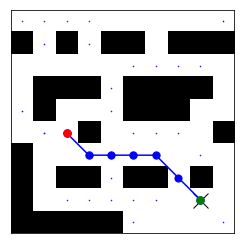

374
Prediction time:  0.3137417840000012
Reconstruction time:  0.0021290519999865865
ground truth path
predicted path


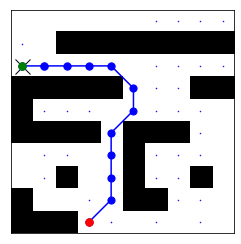

375
Prediction time:  0.06938388600002554
Reconstruction time:  0.0014274910000153795
ground truth path
predicted path


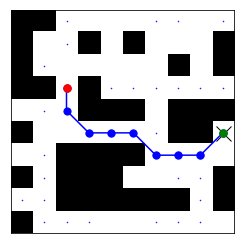

376
Prediction time:  0.08010482000003094
Reconstruction time:  0.0008085629999641242
ground truth path
predicted path


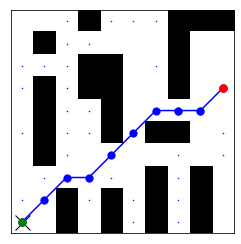

377
Prediction time:  0.06721122900000864
Reconstruction time:  0.000675641999976051
ground truth path
predicted path


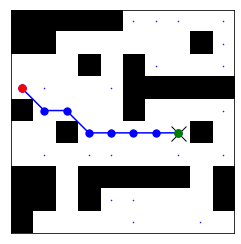

378
Prediction time:  0.06589159500003916
Reconstruction time:  0.0007965160000367177
ground truth path
predicted path


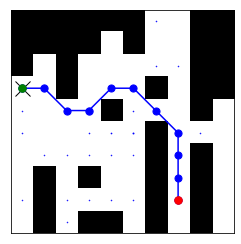

379
Prediction time:  0.06587200799998527
Reconstruction time:  0.0007743429999891305
ground truth path
predicted path


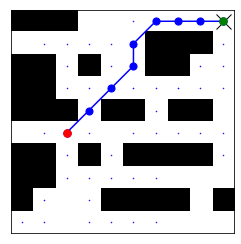

380
Prediction time:  0.0662457619999941
Reconstruction time:  0.0008115919999909238
ground truth path
predicted path


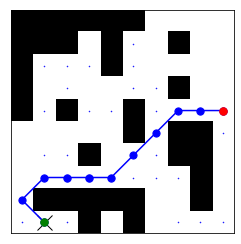

381
Prediction time:  0.07085992499997928
Reconstruction time:  0.000839658000018062
ground truth path
predicted path


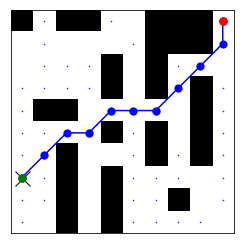

382
Prediction time:  0.06847436300000709
Reconstruction time:  0.0006431719999682173
ground truth path
predicted path


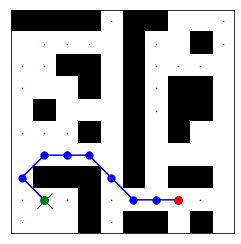

383
Prediction time:  0.07581600900005014
Reconstruction time:  0.0007423540000104367
ground truth path
predicted path


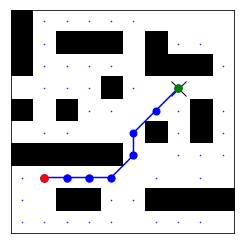

384
Prediction time:  0.06807294300000422
Reconstruction time:  0.0009836189999532507
ground truth path
predicted path


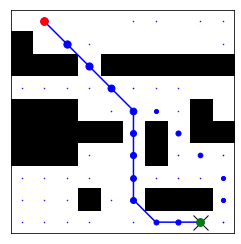

385
Prediction time:  0.07539585900002521
Reconstruction time:  0.0009603070000139269
ground truth path
predicted path


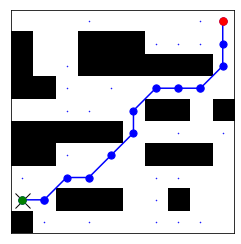

386
Prediction time:  0.07590471899999329
Reconstruction time:  0.0009862400000315574
ground truth path
predicted path


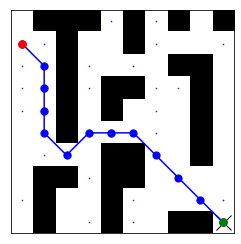

387
Prediction time:  0.06733636299998125
Reconstruction time:  0.0008061209999823404
ground truth path
predicted path


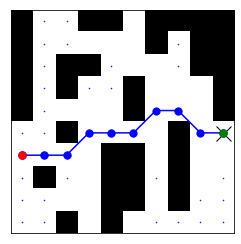

388
Prediction time:  0.06799983899998097
Reconstruction time:  0.0008013340000161406
ground truth path
predicted path


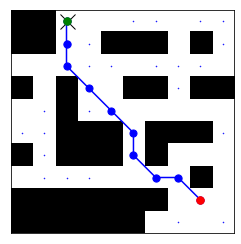

389
Prediction time:  0.07741852399999516
Reconstruction time:  0.0005839820000232976
ground truth path
predicted path


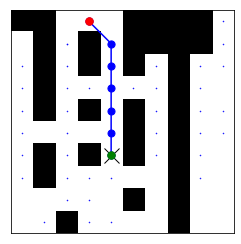

390
Prediction time:  0.05705106400000659
Reconstruction time:  0.002883413000006385
ground truth path
predicted path


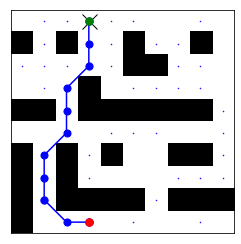

391
Prediction time:  0.312076334999972
Reconstruction time:  0.0014202699999827928
ground truth path
predicted path


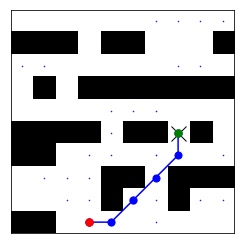

392
Prediction time:  0.06820457399999214
Reconstruction time:  0.0003458049999949253
ground truth path
predicted path


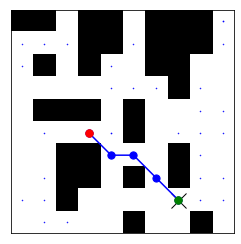

393
Prediction time:  0.07322324000000435
Reconstruction time:  0.0005694780000453648
ground truth path
predicted path


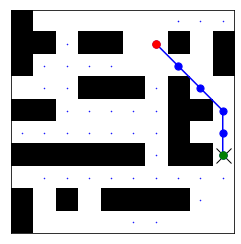

394
Prediction time:  0.06893633800001453
Reconstruction time:  0.0007651239999972859
ground truth path
predicted path


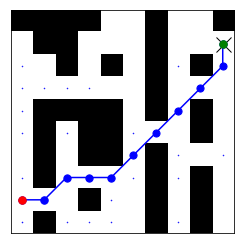

395
Prediction time:  0.07002615999999762
Reconstruction time:  0.001045779000037328
ground truth path
predicted path


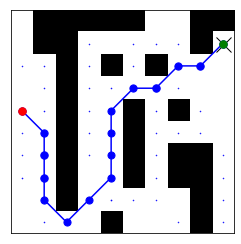

396
Prediction time:  0.06859878400001662
Reconstruction time:  0.0005297980000023017
ground truth path
predicted path


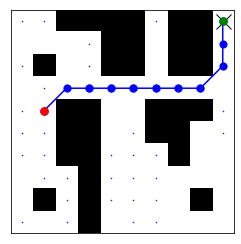

397
Prediction time:  0.07131152900001325
Reconstruction time:  0.0006826810000006844
ground truth path
predicted path


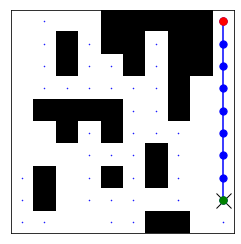

398
Prediction time:  0.06581745799996952
Reconstruction time:  0.0017107200000054945
ground truth path
predicted path


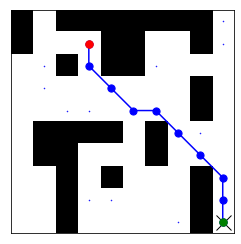

399
Prediction time:  0.0805097990000263
Reconstruction time:  0.0008303769999997712
ground truth path
predicted path


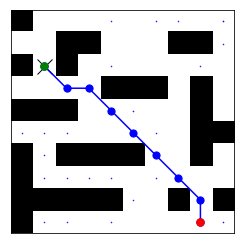

400
Prediction time:  0.06765348800001902
Reconstruction time:  0.0012266060000456491
ground truth path
predicted path


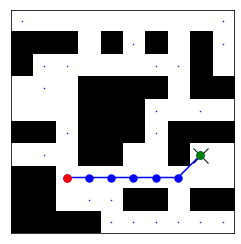

401
Prediction time:  0.07138662199997725
Reconstruction time:  0.00102362100000164
ground truth path
predicted path


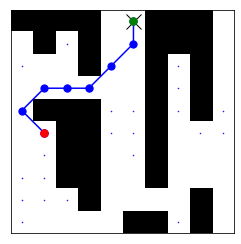

402
Prediction time:  0.06894190299999536
Reconstruction time:  0.0022375450000140518
ground truth path
predicted path


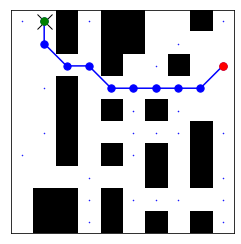

403
Prediction time:  0.06573663099999294
Reconstruction time:  0.001158735999979399
ground truth path
predicted path


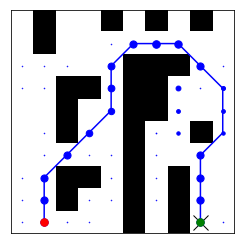

404
Prediction time:  0.06823912300001211
Reconstruction time:  0.0005402869999784343
ground truth path
predicted path


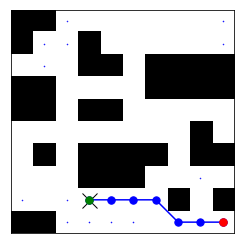

405
Prediction time:  0.07992301100000532
Reconstruction time:  0.0006480750000150692
ground truth path
predicted path


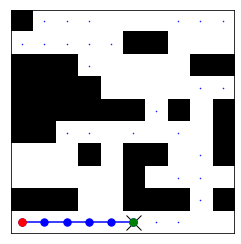

406
Prediction time:  0.07990235199997642
Reconstruction time:  0.0018843550000156029
ground truth path
predicted path


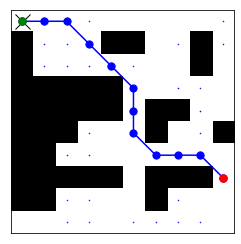

407
Prediction time:  0.07851115400001163
Reconstruction time:  0.000530941000022267
ground truth path
predicted path


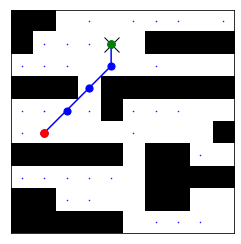

408
Prediction time:  0.07323754899999813
Reconstruction time:  0.002325360999975601
ground truth path
predicted path


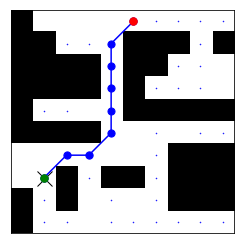

409
Prediction time:  0.07274084700003414
Reconstruction time:  0.0006852469999785171
ground truth path
predicted path


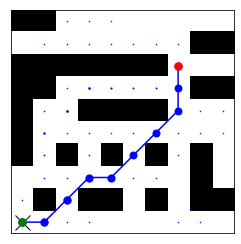

410
Prediction time:  0.3190840600000229
Reconstruction time:  0.001426904000027207
ground truth path
predicted path


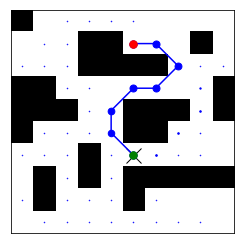

411
Prediction time:  0.0665812130000063
Reconstruction time:  0.0008811229999992065
ground truth path
predicted path


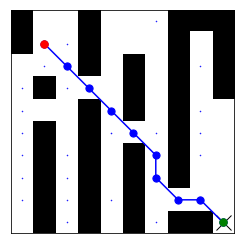

412
Prediction time:  0.0717705179999939
Reconstruction time:  0.0006831729999703384
ground truth path
predicted path


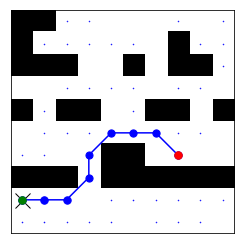

413
Prediction time:  0.06414840100001129
Reconstruction time:  0.0007599570000138556
ground truth path
predicted path


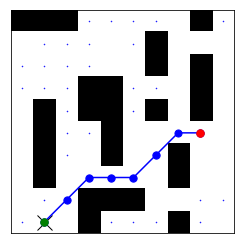

414
Prediction time:  0.06943424899998263
Reconstruction time:  0.0006562759999724221
ground truth path
predicted path


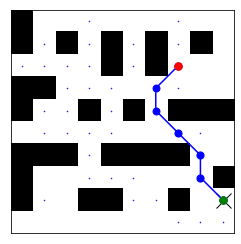

415
Prediction time:  0.0669151580000289
Reconstruction time:  0.0007807910000110496
ground truth path
predicted path


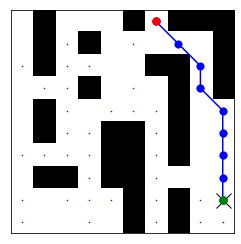

416
Prediction time:  0.06833368299999165
Reconstruction time:  0.000983084000040435
ground truth path
predicted path


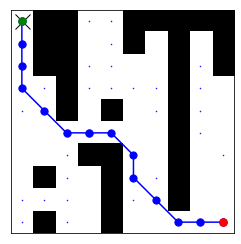

417
Prediction time:  0.0704570650000278
Reconstruction time:  0.0009906290000003537
ground truth path
predicted path


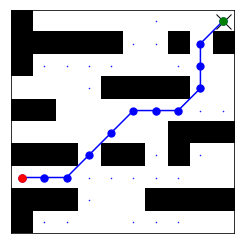

418
Prediction time:  0.07022437800003445
Reconstruction time:  0.0009709809999662866
ground truth path
predicted path


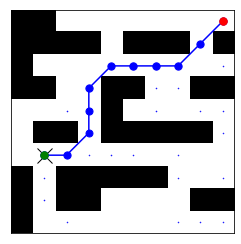

419
Prediction time:  0.0757910289999586
Reconstruction time:  0.0007666420000305152
ground truth path
predicted path


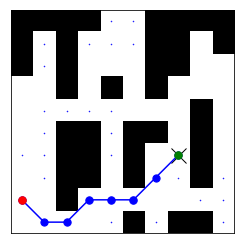

420
Prediction time:  0.06712127899999132
Reconstruction time:  0.0008086400000024696
ground truth path
predicted path


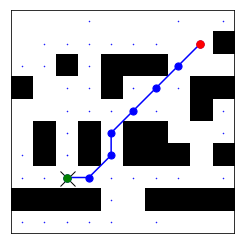

421
Prediction time:  0.06918738800004576
Reconstruction time:  0.0008629040000300847
ground truth path
predicted path


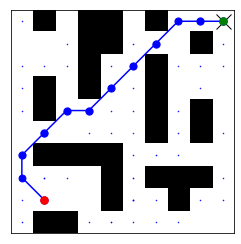

422
Prediction time:  0.07264361299996835
Reconstruction time:  0.0008044969999900786
ground truth path
predicted path


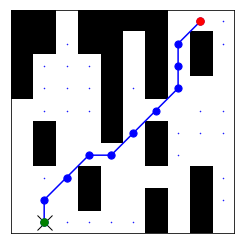

423
Prediction time:  0.07392832100003943
Reconstruction time:  0.0007810079999899244
ground truth path
predicted path


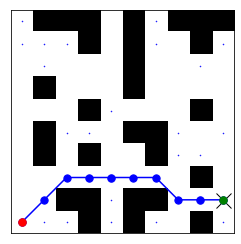

424
Prediction time:  0.07044814300002145
Reconstruction time:  0.0006244439999818496
ground truth path
predicted path


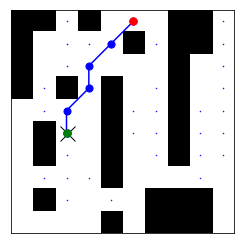

425
Prediction time:  0.0647303430000079
Reconstruction time:  0.0022543599999949038
ground truth path
predicted path


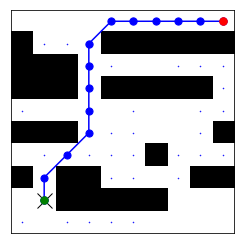

426
Prediction time:  0.07733429799998248
Reconstruction time:  0.0010572570000135784
ground truth path
predicted path


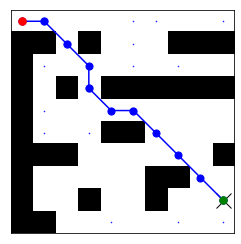

427
Prediction time:  0.08328730499999892
Reconstruction time:  0.0026025679999861495
ground truth path
predicted path


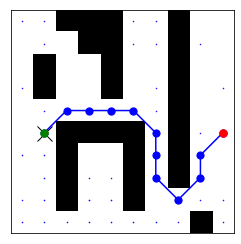

428
Prediction time:  0.34657522499998095
Reconstruction time:  0.002020171999959075
ground truth path
predicted path


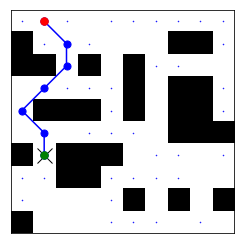

429
Prediction time:  0.07375506599998971
Reconstruction time:  0.0018131119999793555
ground truth path
predicted path


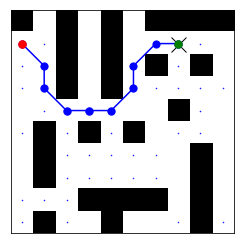

430
Prediction time:  0.06973618200004239
Reconstruction time:  0.0018288809999944533
ground truth path
predicted path


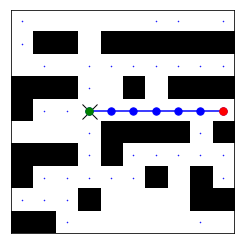

431
Prediction time:  0.07061116899996023
Reconstruction time:  0.0008834509999928741
ground truth path
predicted path


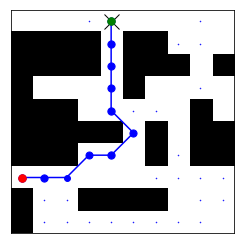

432
Prediction time:  0.06789874199995438
Reconstruction time:  0.0028796229999557
ground truth path
predicted path


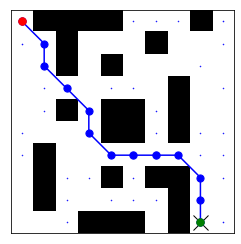

433
Prediction time:  0.07446276899997883
Reconstruction time:  0.0008943489999637677
ground truth path
predicted path


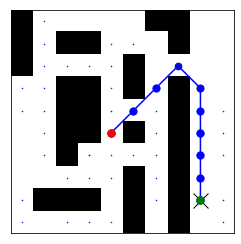

434
Prediction time:  0.0721652289999497
Reconstruction time:  0.0014203869999960261
ground truth path
predicted path


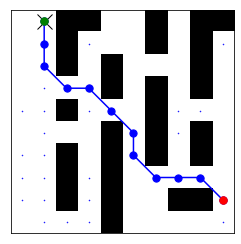

435
Prediction time:  0.0681730129999778
Reconstruction time:  0.0008251450000216209
ground truth path
predicted path


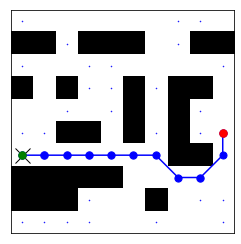

436
Prediction time:  0.06985881200000676
Reconstruction time:  0.0005883599999947364
ground truth path
predicted path


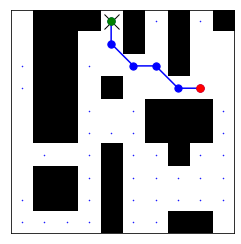

437
Prediction time:  0.06564853399999038
Reconstruction time:  0.0012589709999701881
ground truth path
predicted path


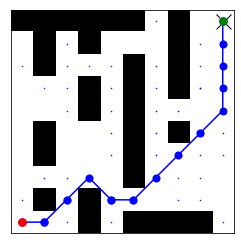

438
Prediction time:  0.07151395900001489
Reconstruction time:  0.0010217440000133138
ground truth path
predicted path


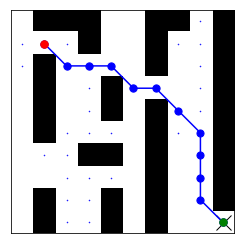

439
Prediction time:  0.0695936749999646
Reconstruction time:  0.0007418960000222796
ground truth path
predicted path


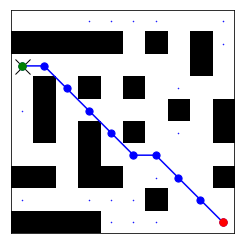

440
Prediction time:  0.06862248099997714
Reconstruction time:  0.0006631300000208284
ground truth path
predicted path


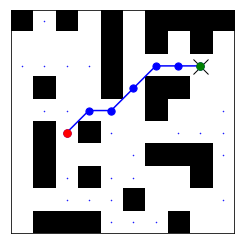

441
Prediction time:  0.08058613999997988
Reconstruction time:  0.0012683279999805563
ground truth path
predicted path


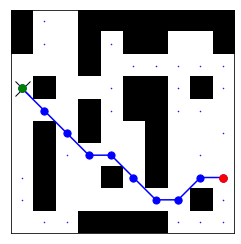

442
Prediction time:  0.06924384500001679
Reconstruction time:  0.0008468719999541463
ground truth path
predicted path


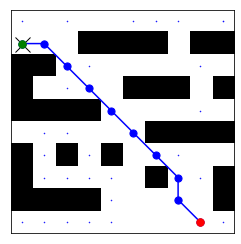

443
Prediction time:  0.06667565300000433
Reconstruction time:  0.0008246950000057041
ground truth path
predicted path


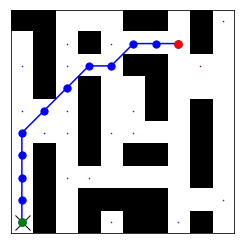

444
Prediction time:  0.07952674100005197
Reconstruction time:  0.0008165550000285293
ground truth path
predicted path


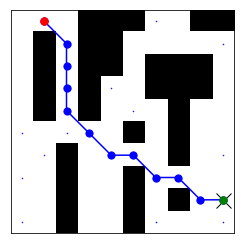

445
Prediction time:  0.06962817199996607
Reconstruction time:  0.0008594209999728264
ground truth path
predicted path


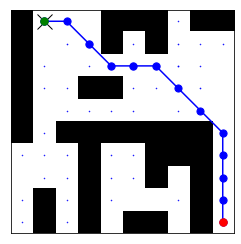

446
Prediction time:  0.32326222100005
Reconstruction time:  0.0005060789999902227
ground truth path
predicted path


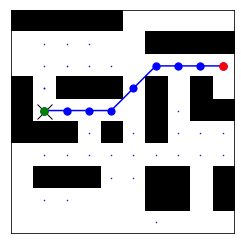

447
Prediction time:  0.07707458099997666
Reconstruction time:  0.002985356000010597
ground truth path
predicted path


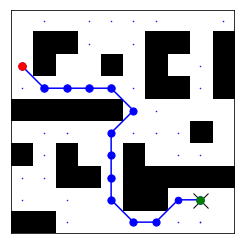

448
Prediction time:  0.06890254900002901
Reconstruction time:  0.0009967180000103326
ground truth path
predicted path


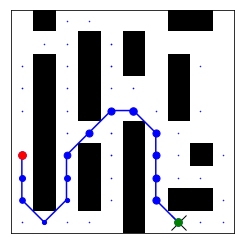

449
Prediction time:  0.06594927499997993
Reconstruction time:  0.0004847499999982574
ground truth path
predicted path


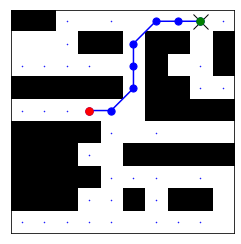

450
Prediction time:  0.06875316299999668
Reconstruction time:  0.0007692950000546261
ground truth path
predicted path


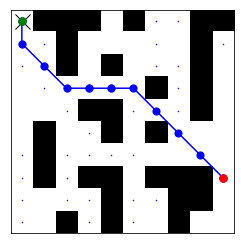

451
Prediction time:  0.06574969199999714
Reconstruction time:  0.0006870809999668381
ground truth path
predicted path


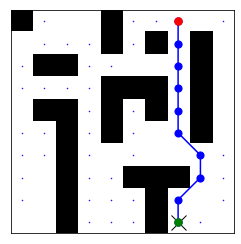

452
Prediction time:  0.06853074399998604
Reconstruction time:  0.0006338809999988371
ground truth path
predicted path


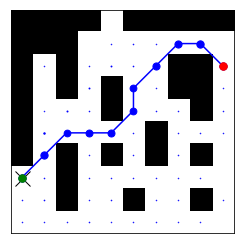

453
Prediction time:  0.06777961000000232
Reconstruction time:  0.0005177070000286221
ground truth path
predicted path


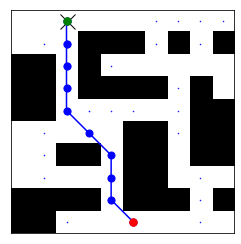

454
Prediction time:  0.07098362099998212
Reconstruction time:  0.0005392410000126802
ground truth path
predicted path


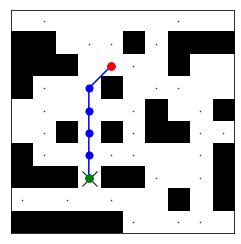

455
Prediction time:  0.0791332179999813
Reconstruction time:  0.0008550919999947837
ground truth path
predicted path


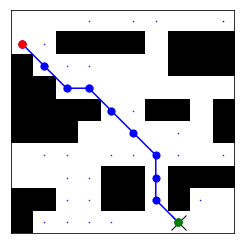

456
Prediction time:  0.07096472500001028
Reconstruction time:  0.0007212749999894186
ground truth path
predicted path


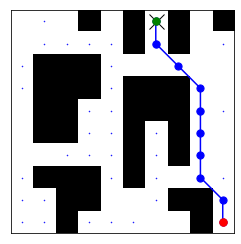

457
Prediction time:  0.0707602589999965
Reconstruction time:  0.0010303770000064105
ground truth path
predicted path


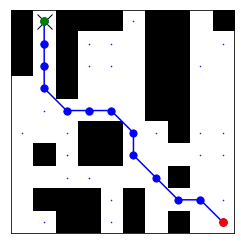

458
Prediction time:  0.07004640600001721
Reconstruction time:  0.0007781040000054418
ground truth path
predicted path


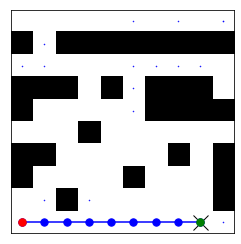

459
Prediction time:  0.0705479529999593
Reconstruction time:  0.000815174000024399
ground truth path
predicted path


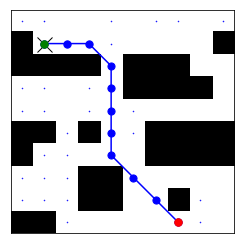

460
Prediction time:  0.0705641899999705
Reconstruction time:  0.0008540070000435662
ground truth path
predicted path


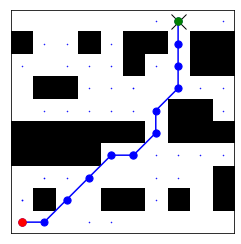

461
Prediction time:  0.07686302600001227
Reconstruction time:  0.0009160860000179127
ground truth path
predicted path


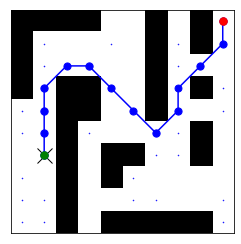

462
Prediction time:  0.07339381599996386
Reconstruction time:  0.0007314929999893138
ground truth path
predicted path


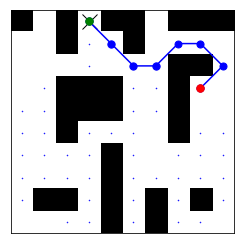

463
Prediction time:  0.31330455400001256
Reconstruction time:  0.001923471999987214
ground truth path
predicted path


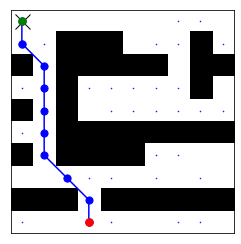

464
Prediction time:  0.06735282800002551
Reconstruction time:  0.0018493160000048192
ground truth path
predicted path


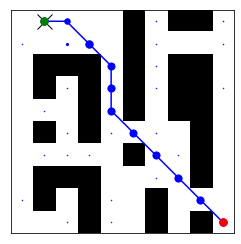

465
Prediction time:  0.06738454900005308
Reconstruction time:  0.0010295679999785534
ground truth path
predicted path


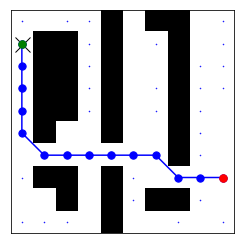

466
Prediction time:  0.06916495899997699
Reconstruction time:  0.000641157000018211
ground truth path
predicted path


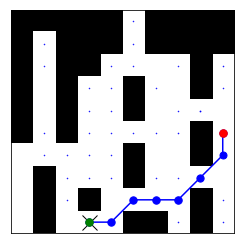

467
Prediction time:  0.07084668099997771
Reconstruction time:  0.000585738000040692
ground truth path
predicted path


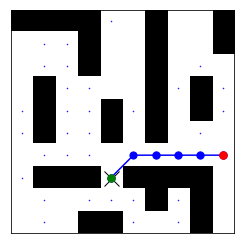

468
Prediction time:  0.069788458000005
Reconstruction time:  0.0011515690000010181
ground truth path
predicted path


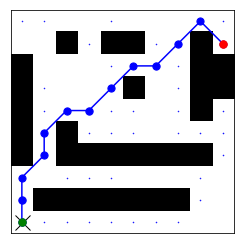

469
Prediction time:  0.06771309999999175
Reconstruction time:  0.0008161480000126176
ground truth path
predicted path


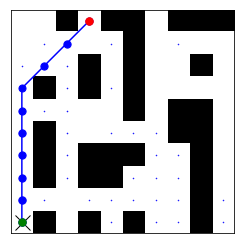

470
Prediction time:  0.07037131600003477
Reconstruction time:  0.0008298040000340734
ground truth path
predicted path


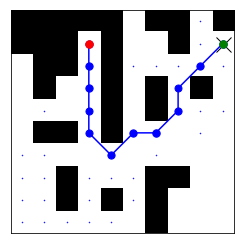

471
Prediction time:  0.0702061470000217
Reconstruction time:  0.0006040999999754604
ground truth path
predicted path


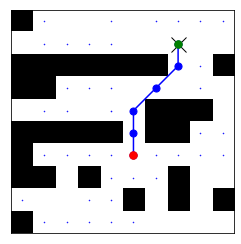

472
Prediction time:  0.07285324900004753
Reconstruction time:  0.0010732630000234167
ground truth path
predicted path


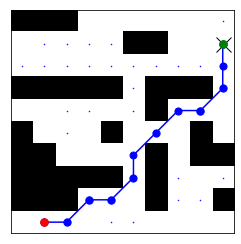

473
Prediction time:  0.07265604200000553
Reconstruction time:  0.0007434899999907429
ground truth path
predicted path


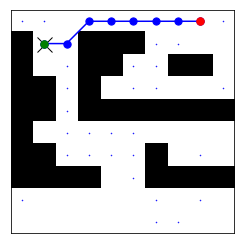

474
Prediction time:  0.0675618159999658
Reconstruction time:  0.0007075519999943936
ground truth path
predicted path


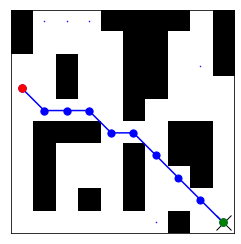

475
Prediction time:  0.06833480300002748
Reconstruction time:  0.0006407129999956851
ground truth path
predicted path


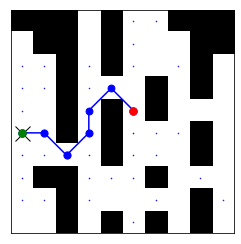

476
Prediction time:  0.06658523999999488
Reconstruction time:  0.0008212019999973563
ground truth path
predicted path


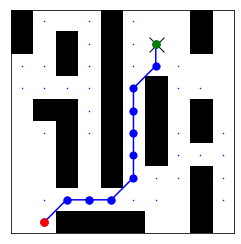

477
Prediction time:  0.0686571150000077
Reconstruction time:  0.0011502290000180437
ground truth path
predicted path


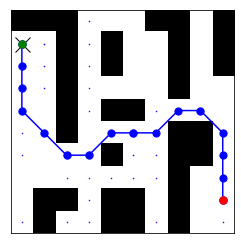

478
Prediction time:  0.07026864699997759
Reconstruction time:  0.0007239839999897413
ground truth path
predicted path


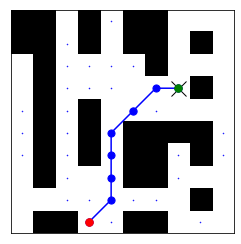

479
Prediction time:  0.07106756700000005
Reconstruction time:  0.001432012999998733
ground truth path
predicted path


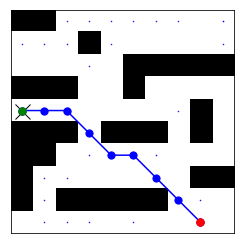

480
Prediction time:  0.07231690899999421
Reconstruction time:  0.0009309959999654893
ground truth path
predicted path


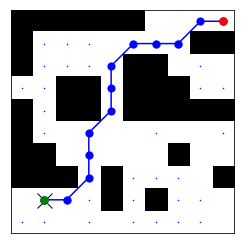

481
Prediction time:  0.31505418599999757
Reconstruction time:  0.0006462669999791615
ground truth path
predicted path


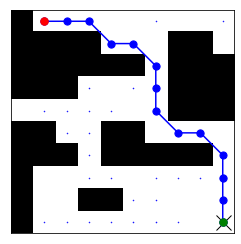

482
Prediction time:  0.06766300300000694
Reconstruction time:  0.000723897999989731
ground truth path
predicted path


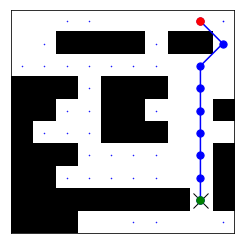

483
Prediction time:  0.06648599499999364
Reconstruction time:  0.0007429999999999382
ground truth path
predicted path


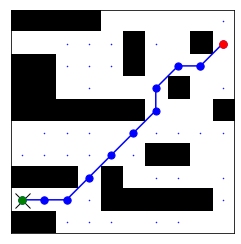

484
Prediction time:  0.07172905599998103
Reconstruction time:  0.0008015819999513951
ground truth path
predicted path


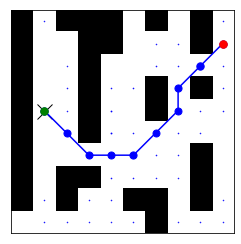

485
Prediction time:  0.07099876500001301
Reconstruction time:  0.0014712230000100135
ground truth path
predicted path


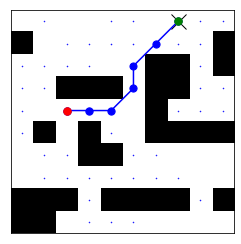

486
Prediction time:  0.06980101499999591
Reconstruction time:  0.0007432749999907173
ground truth path
predicted path


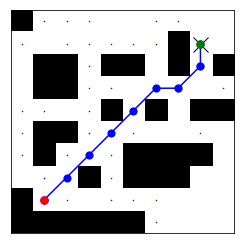

487
Prediction time:  0.07071271600000273
Reconstruction time:  0.00084445400000277
ground truth path
predicted path


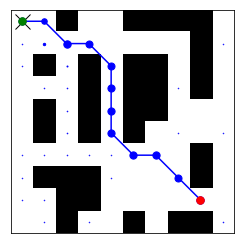

488
Prediction time:  0.07105109600001924
Reconstruction time:  0.0007796300000109113
ground truth path
predicted path


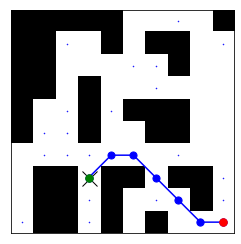

489
Prediction time:  0.07121642799995698
Reconstruction time:  0.0007785059999605437
ground truth path
predicted path


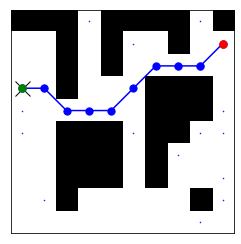

490
Prediction time:  0.07175224099995603
Reconstruction time:  0.0009418519999826458
ground truth path
predicted path


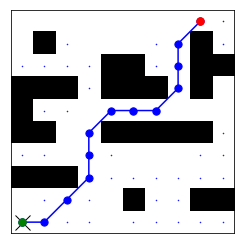

491
Prediction time:  0.06875404600003776
Reconstruction time:  0.0007291869999903611
ground truth path
predicted path


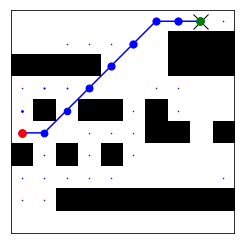

492
Prediction time:  0.07024654700001065
Reconstruction time:  0.0008309689999919101
ground truth path
predicted path


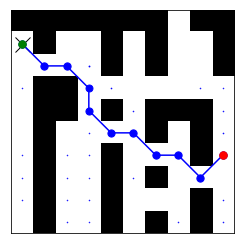

493
Prediction time:  0.07342165699998304
Reconstruction time:  0.0006592579999846748
ground truth path
predicted path


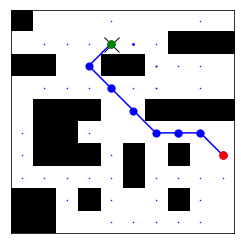

494
Prediction time:  0.07738363099997514
Reconstruction time:  0.0006223789999921792
ground truth path
predicted path


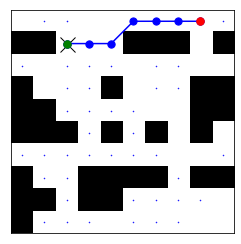

495
Prediction time:  0.07378087600000072
Reconstruction time:  0.0007715479999887975
ground truth path
predicted path


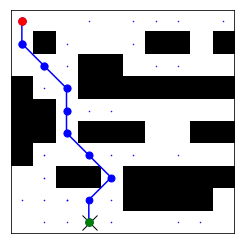

496
Prediction time:  0.06839451600001212
Reconstruction time:  0.0007335679999869171
ground truth path
predicted path


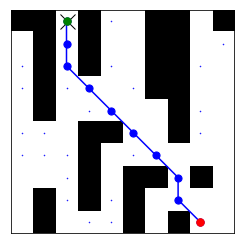

497
Prediction time:  0.07771934800001645
Reconstruction time:  0.0009260890000177824
ground truth path
predicted path


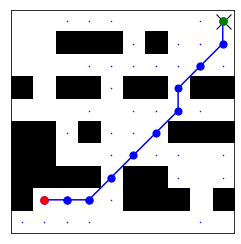

498
Prediction time:  0.07200684499997578
Reconstruction time:  0.0006535809999945741
ground truth path
predicted path


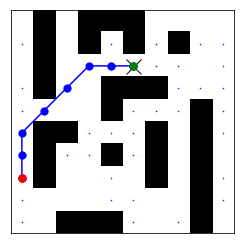

499
Prediction time:  0.34273509100000865
Reconstruction time:  0.0011230920000002698
ground truth path
predicted path


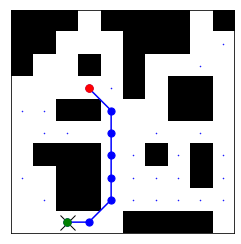

500
Prediction time:  0.067109548000019
Reconstruction time:  0.0007409359999996923
ground truth path
predicted path


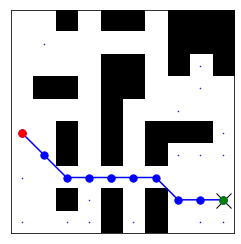

501
Prediction time:  0.07326992200000859
Reconstruction time:  0.0008500490000074024
ground truth path
predicted path


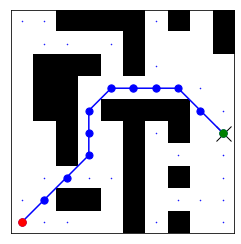

502
Prediction time:  0.07427195999997593
Reconstruction time:  0.0011037779999583108
ground truth path
predicted path


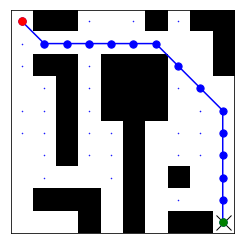

503
Prediction time:  0.07267677999999478
Reconstruction time:  0.001075829999990674
ground truth path
predicted path


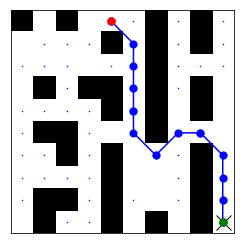

504
Prediction time:  0.07059357600002159
Reconstruction time:  0.000694962000011401
ground truth path
predicted path


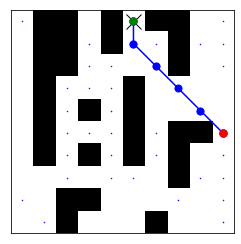

505
Prediction time:  0.07254950199995847
Reconstruction time:  0.0020591530000046987
ground truth path
predicted path


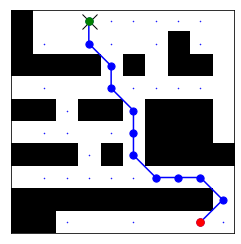

506
Prediction time:  0.0721164629999862
Reconstruction time:  0.0009222809999869241
ground truth path
predicted path


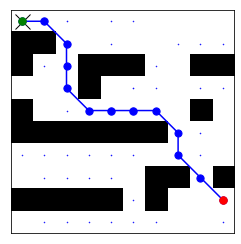

507
Prediction time:  0.06736422700004141
Reconstruction time:  0.0009786599999870305
ground truth path
predicted path


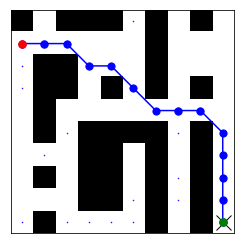

508
Prediction time:  0.0681086559999926
Reconstruction time:  0.0007669249999935346
ground truth path
predicted path


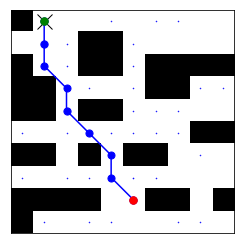

509
Prediction time:  0.07132948500003522
Reconstruction time:  0.0019226729999672898
ground truth path
predicted path


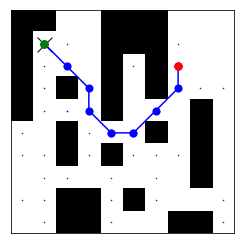

510
Prediction time:  0.06929252100002259
Reconstruction time:  0.0009045720000244728
ground truth path
predicted path


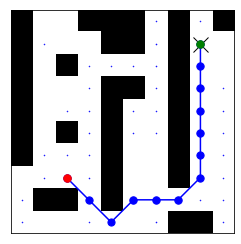

511
Prediction time:  0.06788193799997089
Reconstruction time:  0.0006243950000452969
ground truth path
predicted path


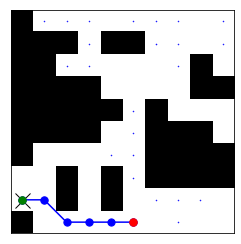

512
Prediction time:  0.07564069900001869
Reconstruction time:  0.0009728599999903054
ground truth path
predicted path


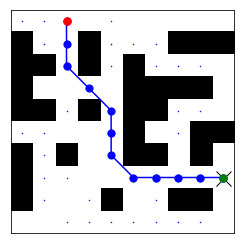

513
Prediction time:  0.07542499799995994
Reconstruction time:  0.000628222999978334
ground truth path
predicted path


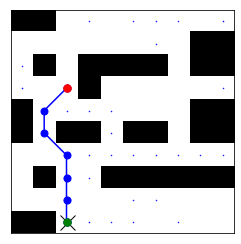

514
Prediction time:  0.07301652000001013
Reconstruction time:  0.0008224099999551981
ground truth path
predicted path


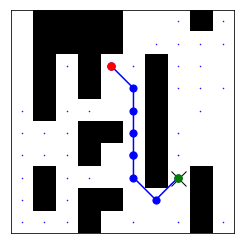

515
Prediction time:  0.0718724669999915
Reconstruction time:  0.0010423339999761083
ground truth path
predicted path


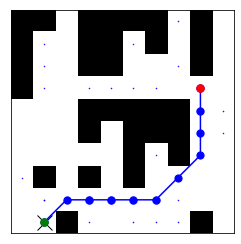

516
Prediction time:  0.07068926100004091
Reconstruction time:  0.0009506359999704728
ground truth path
predicted path


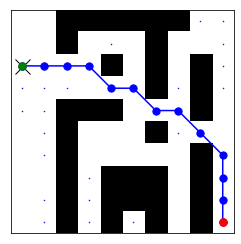

517
Prediction time:  0.3255451900000139
Reconstruction time:  0.0017917899999702058
ground truth path
predicted path


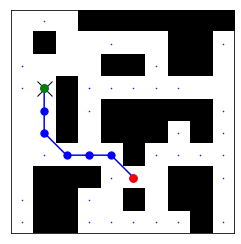

518
Prediction time:  0.0699956029999953
Reconstruction time:  0.0009233180000478569
ground truth path
predicted path


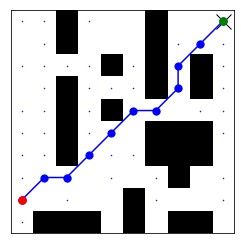

519
Prediction time:  0.06959586400000717
Reconstruction time:  0.0006460079999897061
ground truth path
predicted path


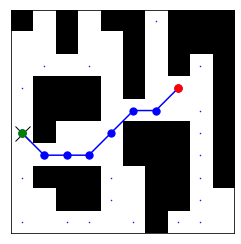

520
Prediction time:  0.07010188200001721
Reconstruction time:  0.0007343730000002324
ground truth path
predicted path


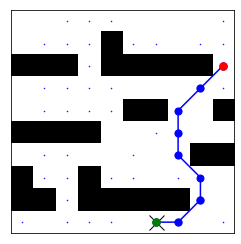

521
Prediction time:  0.07417881999998599
Reconstruction time:  0.001635866999947666
ground truth path
predicted path


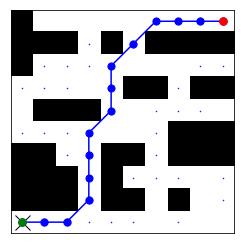

522
Prediction time:  0.07324018799999976
Reconstruction time:  0.0009323830000198541
ground truth path
predicted path


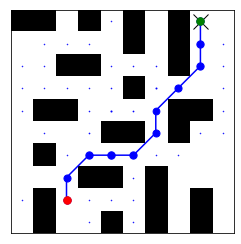

523
Prediction time:  0.0700961530000086
Reconstruction time:  0.0009244350000017221
ground truth path
predicted path


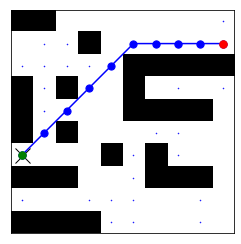

524
Prediction time:  0.07159428899996101
Reconstruction time:  0.0006650199999853612
ground truth path
predicted path


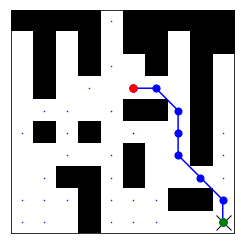

525
Prediction time:  0.07584168599998975
Reconstruction time:  0.002163649000010537
ground truth path
predicted path


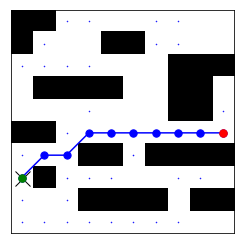

526
Prediction time:  0.06934370200002604
Reconstruction time:  0.000721203000011883
ground truth path
predicted path


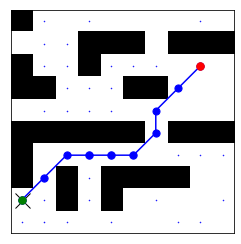

527
Prediction time:  0.07451830000002246
Reconstruction time:  0.0008386000000086824
ground truth path
predicted path


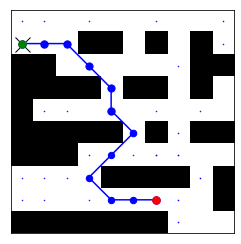

528
Prediction time:  0.0733355309999979
Reconstruction time:  0.0009291569999732019
ground truth path
predicted path


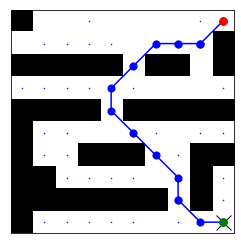

529
Prediction time:  0.07425700800001778
Reconstruction time:  0.0006056409999928292
ground truth path
predicted path


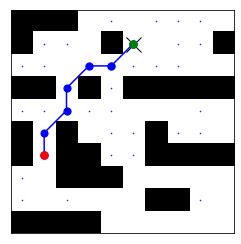

530
Prediction time:  0.06961161499998525
Reconstruction time:  0.0008506610000154069
ground truth path
predicted path


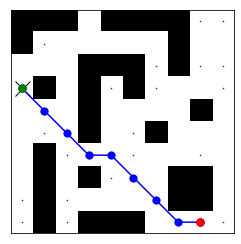

531
Prediction time:  0.06722409100001414
Reconstruction time:  0.0007615540000074361
ground truth path
predicted path


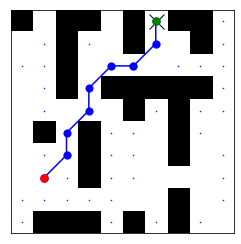

532
Prediction time:  0.0679781399999797
Reconstruction time:  0.0007313859999840133
ground truth path
predicted path


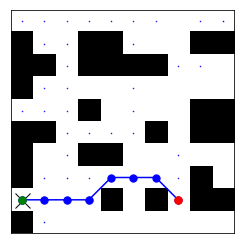

533
Prediction time:  0.0699769139999944
Reconstruction time:  0.0006595920000336264
ground truth path
predicted path


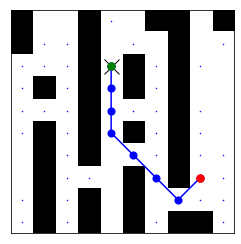

534
Prediction time:  0.3165652040000282
Reconstruction time:  0.0027065659999720992
ground truth path
predicted path


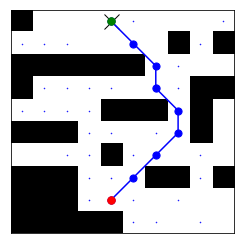

535
Prediction time:  0.06813517200004071
Reconstruction time:  0.0006304990000103317
ground truth path
predicted path


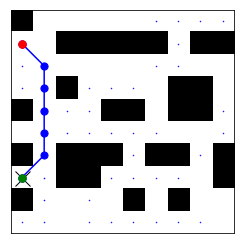

536
Prediction time:  0.07167389799997181
Reconstruction time:  0.0006613130000232559
ground truth path
predicted path


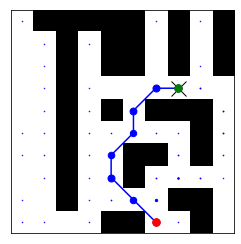

537
Prediction time:  0.07133760700003222
Reconstruction time:  0.000858080999989852
ground truth path
predicted path


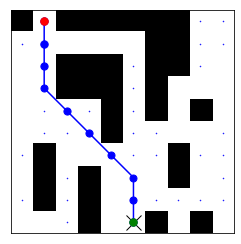

538
Prediction time:  0.07410883899996179
Reconstruction time:  0.0012229050000200914
ground truth path
predicted path


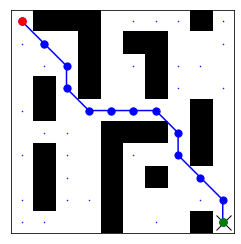

539
Prediction time:  0.07408405099999982
Reconstruction time:  0.0008077950000142664
ground truth path
predicted path


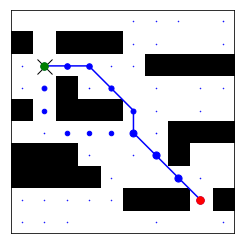

540
Prediction time:  0.07161567600002172
Reconstruction time:  0.0011704810000310317
ground truth path
predicted path


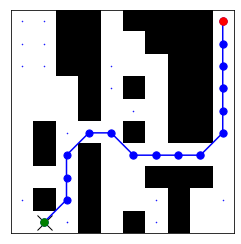

541
Prediction time:  0.069979753000041
Reconstruction time:  0.0007301709999865125
ground truth path
predicted path


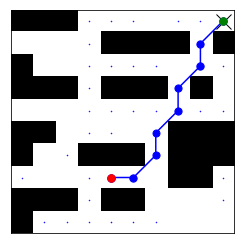

542
Prediction time:  0.07286857700000837
Reconstruction time:  0.0006730690000154027
ground truth path
predicted path


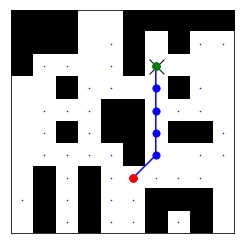

543
Prediction time:  0.06738813599997684
Reconstruction time:  0.0008412149999799112
ground truth path
predicted path


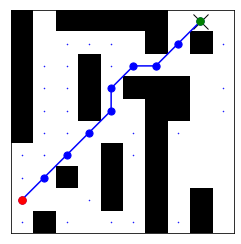

544
Prediction time:  0.0685545819999902
Reconstruction time:  0.0005958200000009128
ground truth path
predicted path


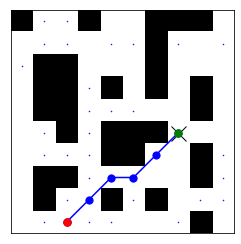

545
Prediction time:  0.0700223129999813
Reconstruction time:  0.002307258000030288
ground truth path
predicted path


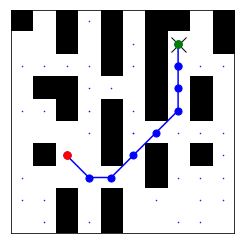

546
Prediction time:  0.06873790399998825
Reconstruction time:  0.0013365479999833951
ground truth path
predicted path


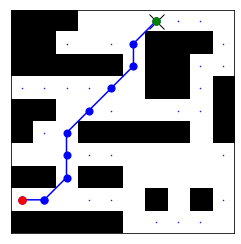

547
Prediction time:  0.07602785599999606
Reconstruction time:  0.0008668489999763551
ground truth path
predicted path


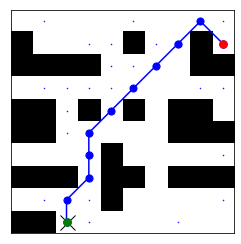

548
Prediction time:  0.07192142700000659
Reconstruction time:  0.0012199180000038723
ground truth path
predicted path


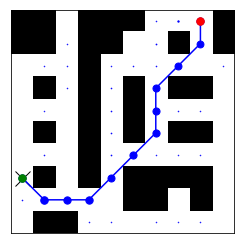

549
Prediction time:  0.07070700200000601
Reconstruction time:  0.0008823790000178633
ground truth path
predicted path


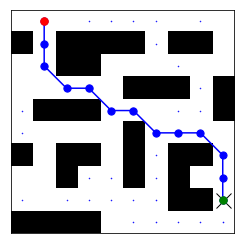

550
Prediction time:  0.07369230799997695
Reconstruction time:  0.0008001179999723718
ground truth path
predicted path


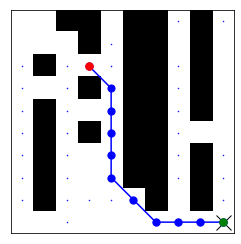

551
Prediction time:  0.33514115700000957
Reconstruction time:  0.00039012000002003333
ground truth path
predicted path


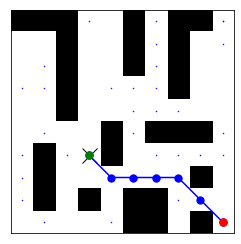

552
Prediction time:  0.0710913340000161
Reconstruction time:  0.0017087010000409464
ground truth path
predicted path


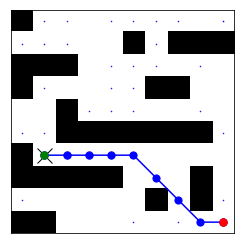

553
Prediction time:  0.06828306200003453
Reconstruction time:  0.0007081760000460235
ground truth path
predicted path


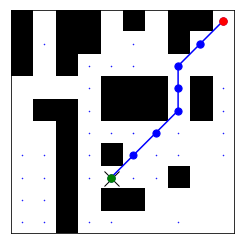

554
Prediction time:  0.07081600999998727
Reconstruction time:  0.0008929999999622851
ground truth path
predicted path


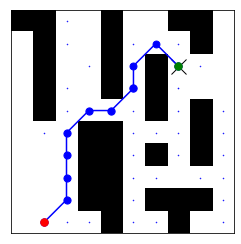

555
Prediction time:  0.07029252900002803
Reconstruction time:  0.0006375340000204233
ground truth path
predicted path


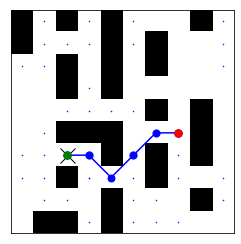

556
Prediction time:  0.06789752299999918
Reconstruction time:  0.0006048359999795139
ground truth path
predicted path


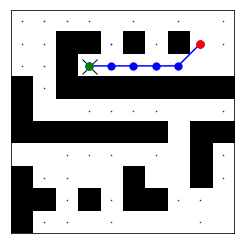

557
Prediction time:  0.06723005500003865
Reconstruction time:  0.0008647599999562772
ground truth path
predicted path


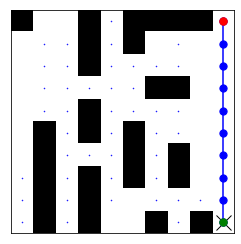

558
Prediction time:  0.07187334100001408
Reconstruction time:  0.000786702000027617
ground truth path
predicted path


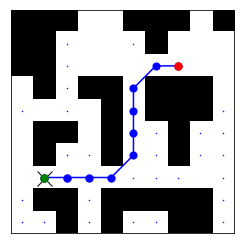

559
Prediction time:  0.07047831700003826
Reconstruction time:  0.0017657710000094085
ground truth path
predicted path


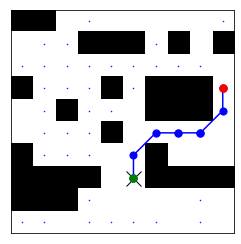

560
Prediction time:  0.07197840299994596
Reconstruction time:  0.000757841999984521
ground truth path
predicted path


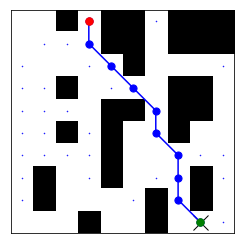

561
Prediction time:  0.06964946599998711
Reconstruction time:  0.000835312999981852
ground truth path
predicted path


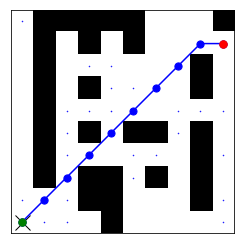

562
Prediction time:  0.07163095300001032
Reconstruction time:  0.0007284419999677993
ground truth path
predicted path


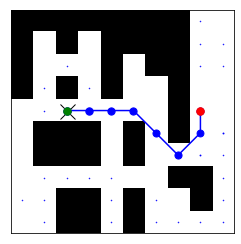

563
Prediction time:  0.0780340310000156
Reconstruction time:  0.0008029400000282294
ground truth path
predicted path


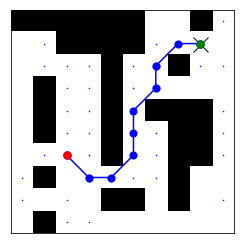

564
Prediction time:  0.06803804800000535
Reconstruction time:  0.00076068599997825
ground truth path
predicted path


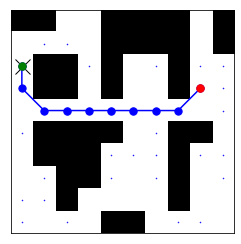

565
Prediction time:  0.07014324099998248
Reconstruction time:  0.001032072999976208
ground truth path
predicted path


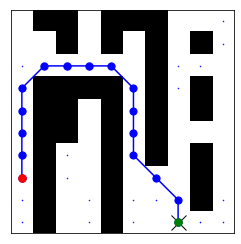

566
Prediction time:  0.07006425499997704
Reconstruction time:  0.0006051999999954205
ground truth path
predicted path


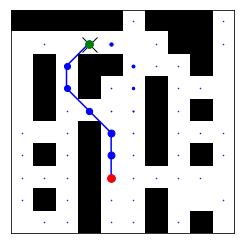

567
Prediction time:  0.07644124699999111
Reconstruction time:  0.0005624880000141275
ground truth path
predicted path


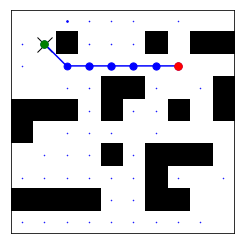

568
Prediction time:  0.32773228499996776
Reconstruction time:  0.00043443600003456595
ground truth path
predicted path


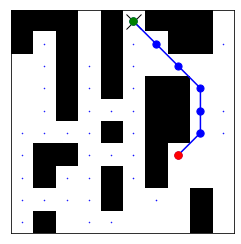

569
Prediction time:  0.07240638899997975
Reconstruction time:  0.0016528470000025663
ground truth path
predicted path


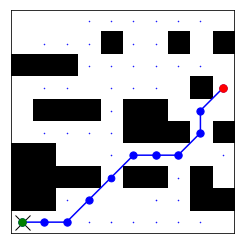

570
Prediction time:  0.0709981629999561
Reconstruction time:  0.0005713440000363335
ground truth path
predicted path


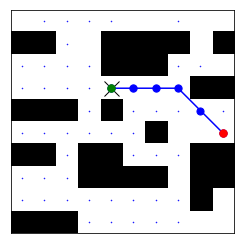

571
Prediction time:  0.06994968499998322
Reconstruction time:  0.0006817450000085046
ground truth path
predicted path


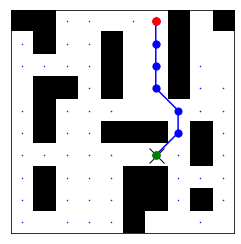

572
Prediction time:  0.07234180099999321
Reconstruction time:  0.0010199779999879865
ground truth path
predicted path


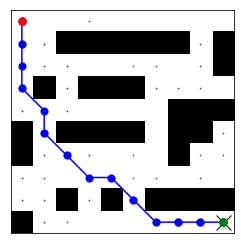

573
Prediction time:  0.07098723099994686
Reconstruction time:  0.001004125000008571
ground truth path
predicted path


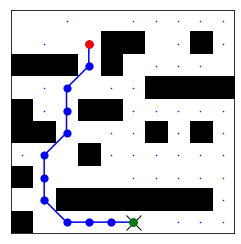

574
Prediction time:  0.07534268900002417
Reconstruction time:  0.0012686510000321505
ground truth path
predicted path


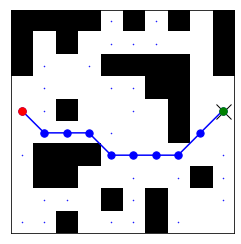

575
Prediction time:  0.07624832699997341
Reconstruction time:  0.0006541520000382661
ground truth path
predicted path


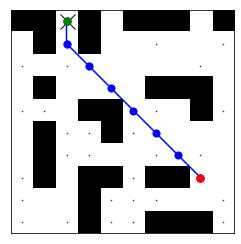

576
Prediction time:  0.07355372800003579
Reconstruction time:  0.0021667390000175146
ground truth path
predicted path


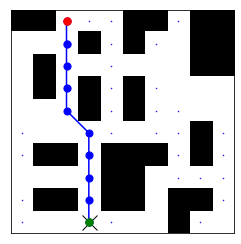

577
Prediction time:  0.07401214999998729
Reconstruction time:  0.002282508999996935
ground truth path
predicted path


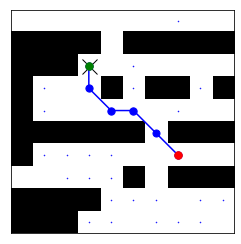

578
Prediction time:  0.07161752700000079
Reconstruction time:  0.0011416429999826505
ground truth path
predicted path


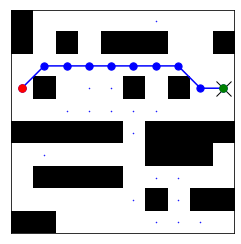

579
Prediction time:  0.07090047899998808
Reconstruction time:  0.0008267810000006648
ground truth path
predicted path


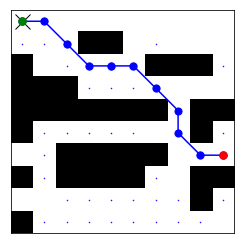

580
Prediction time:  0.0698590339999896
Reconstruction time:  0.0019480790000443449
ground truth path
predicted path


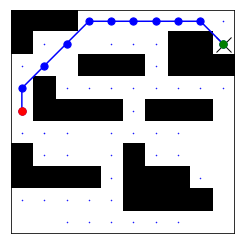

581
Prediction time:  0.06955356700001403
Reconstruction time:  0.0006119169999578844
ground truth path
predicted path


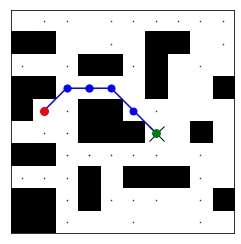

582
Prediction time:  0.06726902899998777
Reconstruction time:  0.0006600309999953424
ground truth path
predicted path


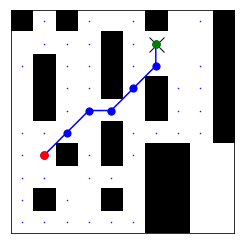

583
Prediction time:  0.07192749500001128
Reconstruction time:  0.0008823679999636624
ground truth path
predicted path


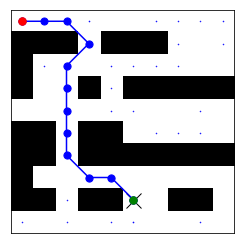

584
Prediction time:  0.07339827999999216
Reconstruction time:  0.0008933309999861194
ground truth path
predicted path


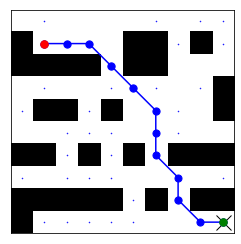

585
Prediction time:  0.35012990500001706
Reconstruction time:  0.0022831079999718895
ground truth path
predicted path


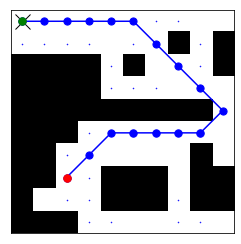

586
Prediction time:  0.06984265300002335
Reconstruction time:  0.000822354999968411
ground truth path
predicted path


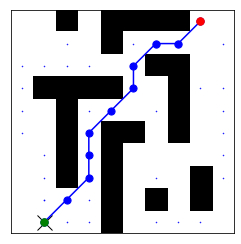

587
Prediction time:  0.06644178400000555
Reconstruction time:  0.000856811000005564
ground truth path
predicted path


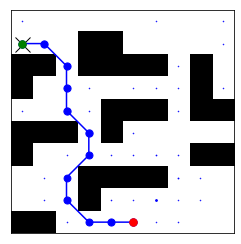

588
Prediction time:  0.07030978699998514
Reconstruction time:  0.0007989429999497588
ground truth path
predicted path


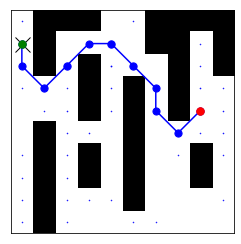

589
Prediction time:  0.07282094000004236
Reconstruction time:  0.0005935759999715629
ground truth path
predicted path


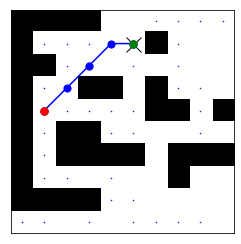

590
Prediction time:  0.0749153349999574
Reconstruction time:  0.0007232300000055147
ground truth path
predicted path


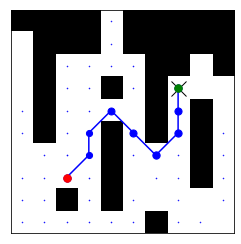

591
Prediction time:  0.07183256799999072
Reconstruction time:  0.001292143999990003
ground truth path
predicted path


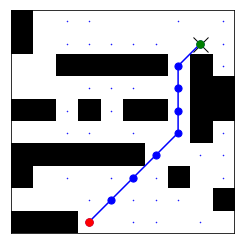

592
Prediction time:  0.0720575710000162
Reconstruction time:  0.0007890320000001338
ground truth path
predicted path


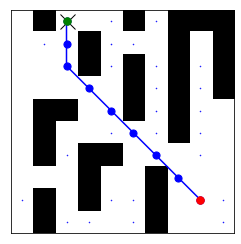

593
Prediction time:  0.0726832860000286
Reconstruction time:  0.0009507049999797346
ground truth path
predicted path


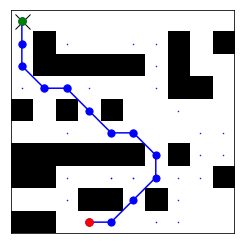

594
Prediction time:  0.06888800899997705
Reconstruction time:  0.003239511999993283
ground truth path
predicted path


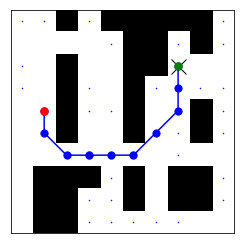

595
Prediction time:  0.06861829400003217
Reconstruction time:  0.0004911049999805073
ground truth path
predicted path


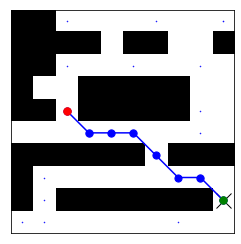

596
Prediction time:  0.07972860900002843
Reconstruction time:  0.0005995750000238331
ground truth path
predicted path


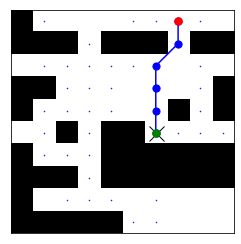

597
Prediction time:  0.07057300400003896
Reconstruction time:  0.0009212329999854774
ground truth path
predicted path


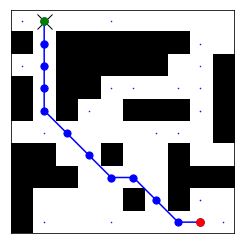

598
Prediction time:  0.07205333499996414
Reconstruction time:  0.0008880729999987125
ground truth path
predicted path


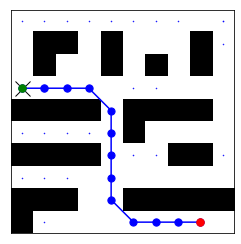

599
Prediction time:  0.0739466249999623
Reconstruction time:  0.0008761199999867131
ground truth path
predicted path


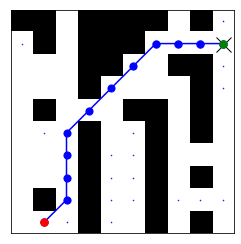

600
Prediction time:  0.07243327300000146
Reconstruction time:  0.0027142679999769825
ground truth path
predicted path


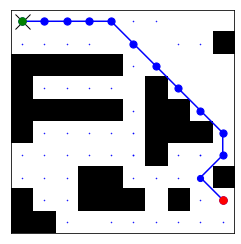

601
Prediction time:  0.07038287100004936
Reconstruction time:  0.0010328739999749814
ground truth path
predicted path


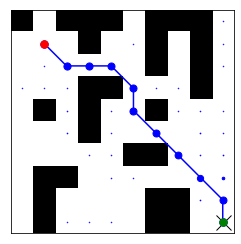

602
Prediction time:  0.07162062500003685
Reconstruction time:  0.0006499520000033954
ground truth path
predicted path


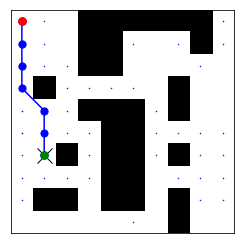

603
Prediction time:  0.3317751639999642
Reconstruction time:  0.0006723679999822707
ground truth path
predicted path


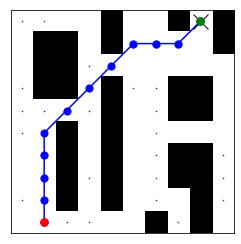

604
Prediction time:  0.0714618349999796
Reconstruction time:  0.0010784090000015567
ground truth path
predicted path


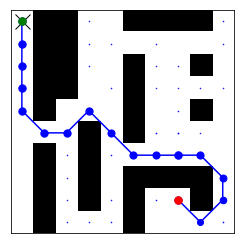

605
Prediction time:  0.06996775699997215
Reconstruction time:  0.0007207239999615922
ground truth path
predicted path


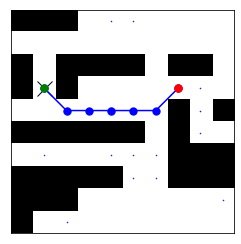

606
Prediction time:  0.07374250700001994
Reconstruction time:  0.0008429540000065572
ground truth path
predicted path


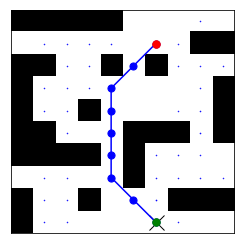

607
Prediction time:  0.07196206899999424
Reconstruction time:  0.0009836699999823395
ground truth path
predicted path


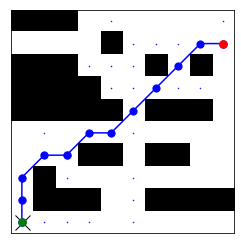

608
Prediction time:  0.07030740900000865
Reconstruction time:  0.0009266620000403236
ground truth path
predicted path


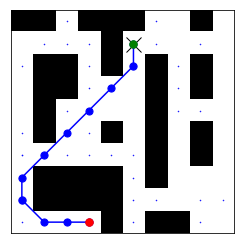

609
Prediction time:  0.06948584000002711
Reconstruction time:  0.0008308210000222971
ground truth path
predicted path


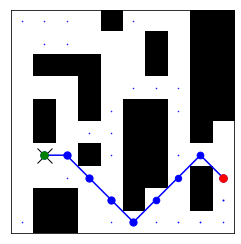

610
Prediction time:  0.07066609000003155
Reconstruction time:  0.0007207680000078653
ground truth path
predicted path


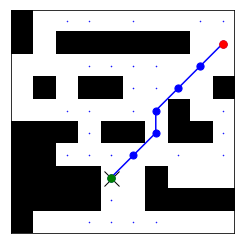

611
Prediction time:  0.06501854600003298
Reconstruction time:  0.0005018530000029386
ground truth path
predicted path


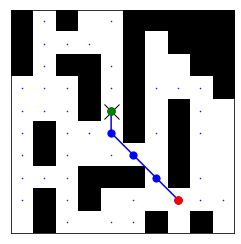

612
Prediction time:  0.07085031900004424
Reconstruction time:  0.0008281039999928907
ground truth path
predicted path


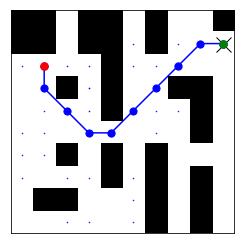

613
Prediction time:  0.07426993199999288
Reconstruction time:  0.0008151660000521588
ground truth path
predicted path


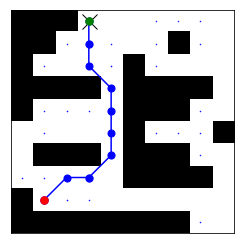

614
Prediction time:  0.08101970299998129
Reconstruction time:  0.0006618649999836634
ground truth path
predicted path


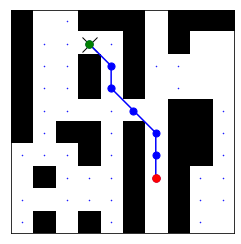

615
Prediction time:  0.07168160199995555
Reconstruction time:  0.0006090580000090995
ground truth path
predicted path


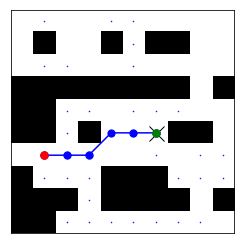

616
Prediction time:  0.07068575400001009
Reconstruction time:  0.0006486999999992804
ground truth path
predicted path


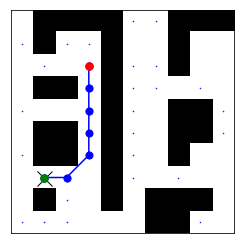

617
Prediction time:  0.06811445900001445
Reconstruction time:  0.0009393339999519412
ground truth path
predicted path


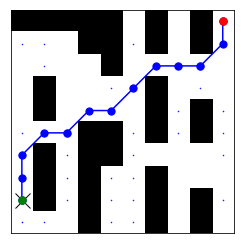

618
Prediction time:  0.06926699599995345
Reconstruction time:  0.0007150739999701727
ground truth path
predicted path


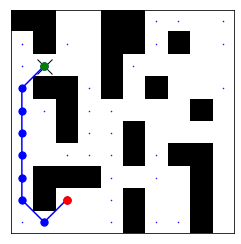

619
Prediction time:  0.07089105900001869
Reconstruction time:  0.0008359559999462363
ground truth path
predicted path


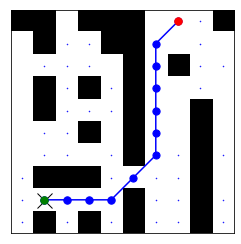

620
Prediction time:  0.07048251300000175
Reconstruction time:  0.001436974000000646
ground truth path
predicted path


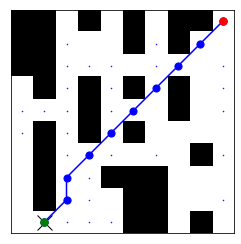

621
Prediction time:  0.34689952700000504
Reconstruction time:  0.0023898229999872456
ground truth path
predicted path


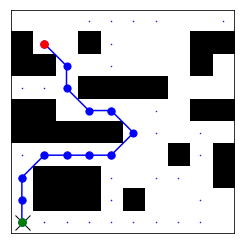

622
Prediction time:  0.07233442900002274
Reconstruction time:  0.0009217429999921478
ground truth path
predicted path


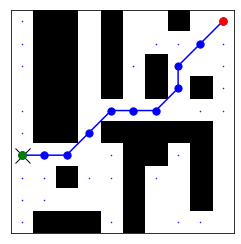

623
Prediction time:  0.06716519900004414
Reconstruction time:  0.0010750729999813302
ground truth path
predicted path


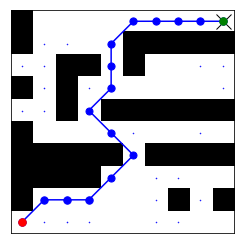

624
Prediction time:  0.06841364100000646
Reconstruction time:  0.0008657900000343943
ground truth path
predicted path


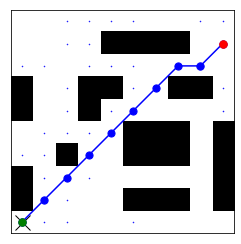

625
Prediction time:  0.06825946000003569
Reconstruction time:  0.0008167619999994713
ground truth path
predicted path


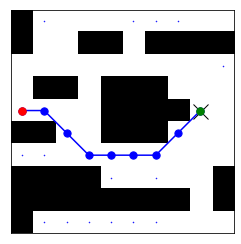

626
Prediction time:  0.06842864699996198
Reconstruction time:  0.0008603249999623586
ground truth path
predicted path


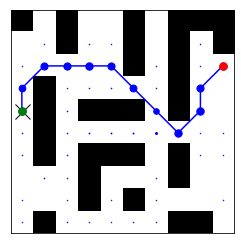

627
Prediction time:  0.07748257000002923
Reconstruction time:  0.000887545000011869
ground truth path
predicted path


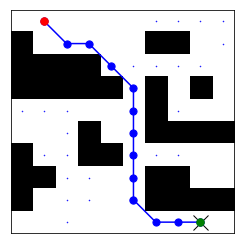

628
Prediction time:  0.07279843499998151
Reconstruction time:  0.0007852989999719284
ground truth path
predicted path


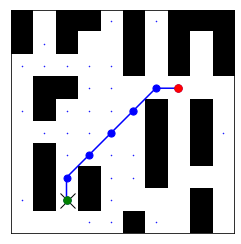

629
Prediction time:  0.07073465000001988
Reconstruction time:  0.0007852460000208339
ground truth path
predicted path


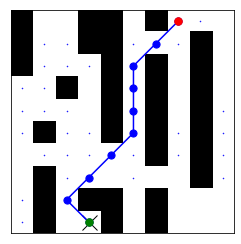

630
Prediction time:  0.07157726899998806
Reconstruction time:  0.0007043640000006235
ground truth path
predicted path


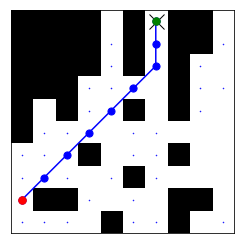

631
Prediction time:  0.0694936900000016
Reconstruction time:  0.0006708149999781199
ground truth path
predicted path


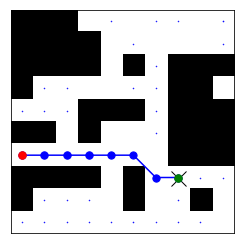

632
Prediction time:  0.06746304700004657
Reconstruction time:  0.0007435599999894293
ground truth path
predicted path


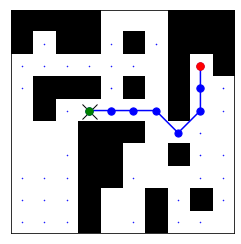

633
Prediction time:  0.0698212670000089
Reconstruction time:  0.0009180740000260812
ground truth path
predicted path


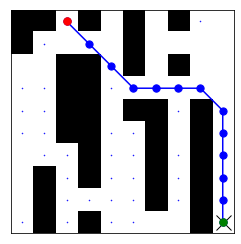

634
Prediction time:  0.06633130999995274
Reconstruction time:  0.0016332280000028732
ground truth path
predicted path


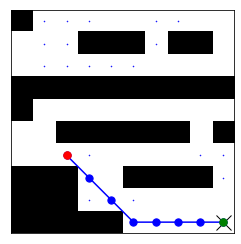

635
Prediction time:  0.07127005000000963
Reconstruction time:  0.0005664290000026995
ground truth path
predicted path


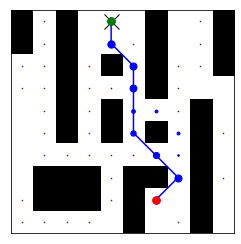

636
Prediction time:  0.07061506399998052
Reconstruction time:  0.0007430580000118425
ground truth path
predicted path


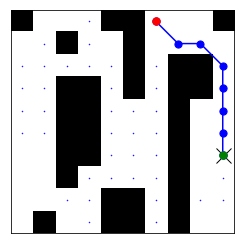

637
Prediction time:  0.07047297999997681
Reconstruction time:  0.0007228640000107589
ground truth path
predicted path


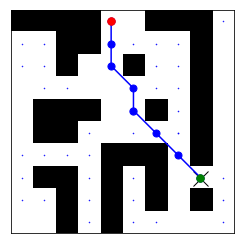

638
Prediction time:  0.07203237700002774
Reconstruction time:  0.0008849250000366737
ground truth path
predicted path


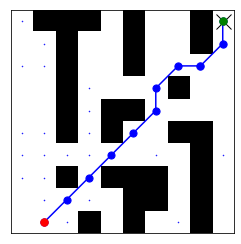

639
Prediction time:  0.3519756819999884
Reconstruction time:  0.002801291000025685
ground truth path
predicted path


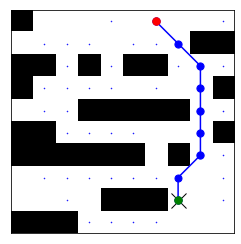

640
Prediction time:  0.06891847200000711
Reconstruction time:  0.0005639780000024075
ground truth path
predicted path


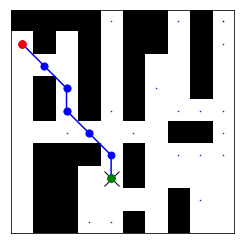

641
Prediction time:  0.06798966999997447
Reconstruction time:  0.0007618410000418407
ground truth path
predicted path


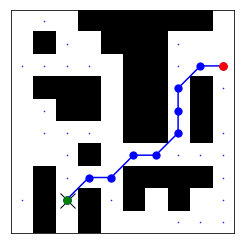

642
Prediction time:  0.06662562799999705
Reconstruction time:  0.0016314060000013342
ground truth path
predicted path


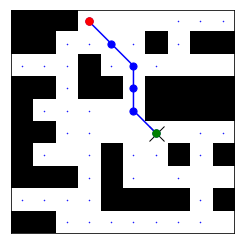

643
Prediction time:  0.07332752700000356
Reconstruction time:  0.001271138000049632
ground truth path
predicted path


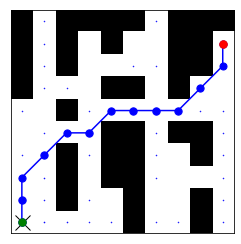

644
Prediction time:  0.06919081000000915
Reconstruction time:  0.0007966389999864987
ground truth path
predicted path


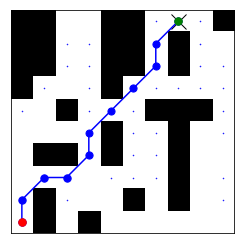

645
Prediction time:  0.06517358600001444
Reconstruction time:  0.0006521189999943999
ground truth path
predicted path


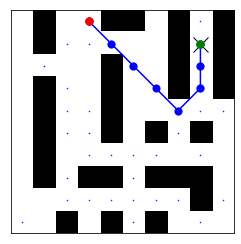

646
Prediction time:  0.07258545000001959
Reconstruction time:  0.0009683220000056281
ground truth path
predicted path


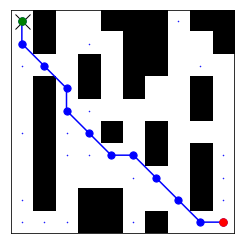

647
Prediction time:  0.07212671000002047
Reconstruction time:  0.0018582320000177788
ground truth path
predicted path


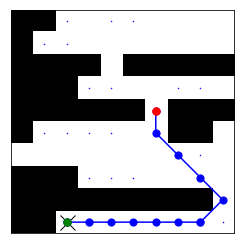

648
Prediction time:  0.07054317700004731
Reconstruction time:  0.0007634670000129518
ground truth path
predicted path


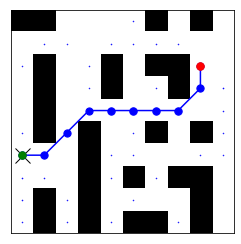

649
Prediction time:  0.07368151499997566
Reconstruction time:  0.0008175229999665135
ground truth path
predicted path


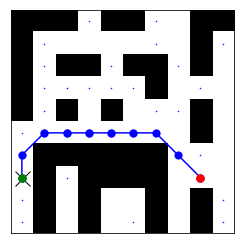

650
Prediction time:  0.07068487499998355
Reconstruction time:  0.0027774910000175623
ground truth path
predicted path


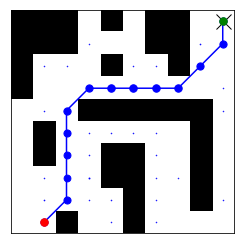

651
Prediction time:  0.07189191000003348
Reconstruction time:  0.0009843009999599417
ground truth path
predicted path


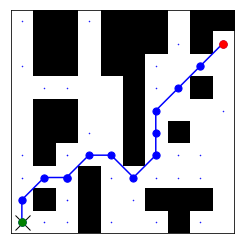

652
Prediction time:  0.07130316800004266
Reconstruction time:  0.0007818110000243905
ground truth path
predicted path


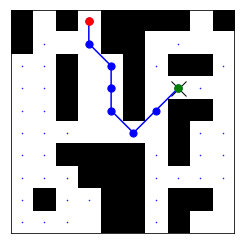

653
Prediction time:  0.07506398900000022
Reconstruction time:  0.0011209520000079465
ground truth path
predicted path


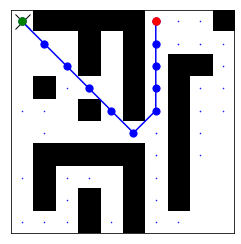

654
Prediction time:  0.07100175600004377
Reconstruction time:  0.0007366840000031516
ground truth path
predicted path


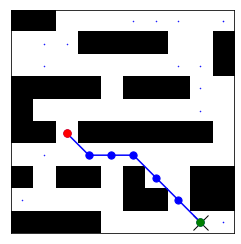

655
Prediction time:  0.07088465900000074
Reconstruction time:  0.0007533469999998488
ground truth path
predicted path


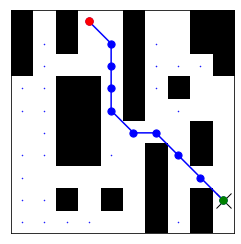

656
Prediction time:  0.0685055810000108
Reconstruction time:  0.0008601140000337182
ground truth path
predicted path


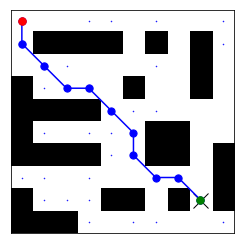

657
Prediction time:  0.3445336650000286
Reconstruction time:  0.0019087680000211549
ground truth path
predicted path


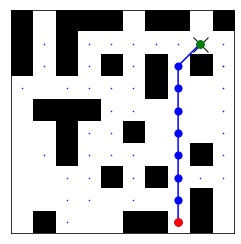

658
Prediction time:  0.0727427040000066
Reconstruction time:  0.0011263040000244473
ground truth path
predicted path


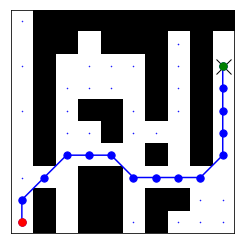

659
Prediction time:  0.06855200399996875
Reconstruction time:  0.0007850960000155283
ground truth path
predicted path


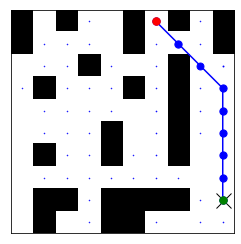

660
Prediction time:  0.06788447600001746
Reconstruction time:  0.0008348659999910524
ground truth path
predicted path


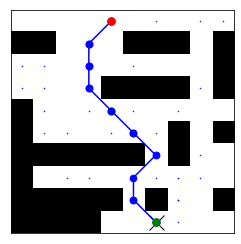

661
Prediction time:  0.07697691699996767
Reconstruction time:  0.0006267020000336743
ground truth path
predicted path


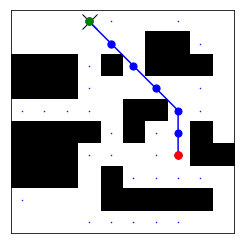

662
Prediction time:  0.06850141199998916
Reconstruction time:  0.0010046529999954146
ground truth path
predicted path


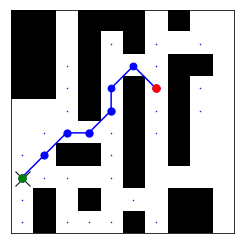

663
Prediction time:  0.06802202099999022
Reconstruction time:  0.0007708470000125089
ground truth path
predicted path


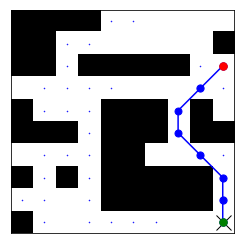

664
Prediction time:  0.07216115700003911
Reconstruction time:  0.0005585330000030808
ground truth path
predicted path


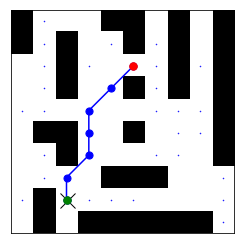

665
Prediction time:  0.07319070400001237
Reconstruction time:  0.0007120199999803845
ground truth path
predicted path


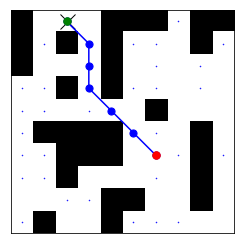

666
Prediction time:  0.07115102700004172
Reconstruction time:  0.0007949169999506012
ground truth path
predicted path


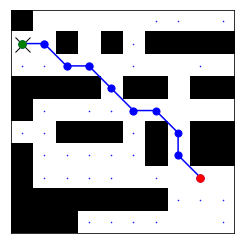

667
Prediction time:  0.07349523999999974
Reconstruction time:  0.0013798620000216033
ground truth path
predicted path


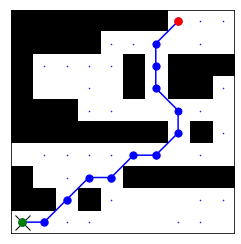

668
Prediction time:  0.07294381299999486
Reconstruction time:  0.0006427740000276572
ground truth path
predicted path


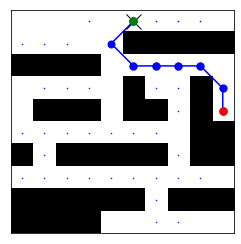

669
Prediction time:  0.07270162500003607
Reconstruction time:  0.0006415540000261899
ground truth path
predicted path


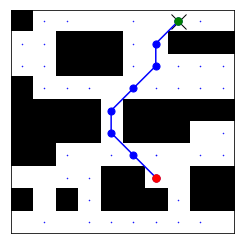

670
Prediction time:  0.07317869700000301
Reconstruction time:  0.0008821350000403072
ground truth path
predicted path


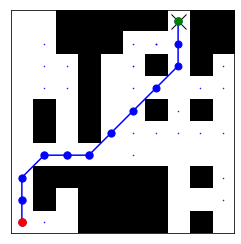

671
Prediction time:  0.06851520300000402
Reconstruction time:  0.0015866630000118676
ground truth path
predicted path


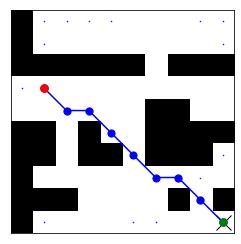

672
Prediction time:  0.07091207899998153
Reconstruction time:  0.0007002890000080697
ground truth path
predicted path


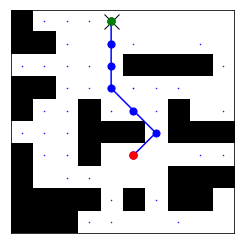

673
Prediction time:  0.07029613100002052
Reconstruction time:  0.0008158480000020063
ground truth path
predicted path


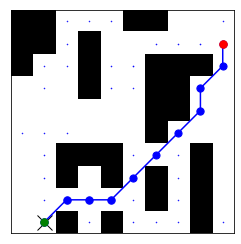

674
Prediction time:  0.06987985600000002
Reconstruction time:  0.0009424160000435222
ground truth path
predicted path


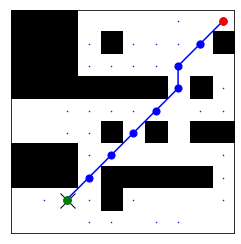

675
Prediction time:  0.3393438479999986
Reconstruction time:  0.00046890900000562397
ground truth path
predicted path


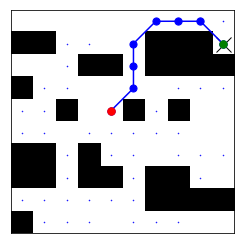

676
Prediction time:  0.07843166500003917
Reconstruction time:  0.0009345060000214289
ground truth path
predicted path


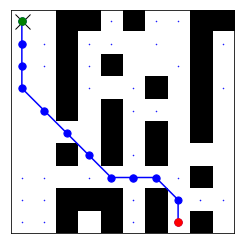

677
Prediction time:  0.0716395739999598
Reconstruction time:  0.0006990929999801665
ground truth path
predicted path


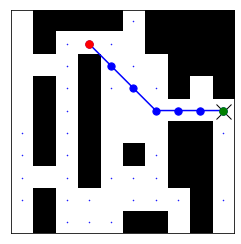

678
Prediction time:  0.07128454700000475
Reconstruction time:  0.0016265180000232249
ground truth path
predicted path


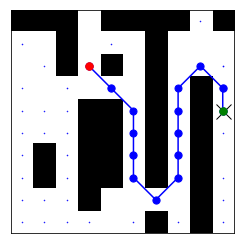

679
Prediction time:  0.07576784700000871
Reconstruction time:  0.0009094079999840687
ground truth path
predicted path


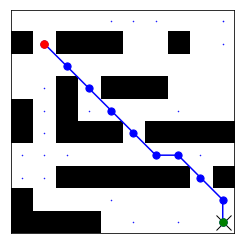

680
Prediction time:  0.06987719400001424
Reconstruction time:  0.0019061130000181947
ground truth path
predicted path


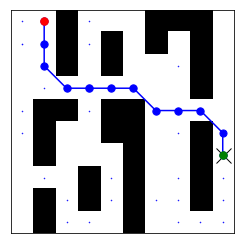

681
Prediction time:  0.06949353799996061
Reconstruction time:  0.000896835000048668
ground truth path
predicted path


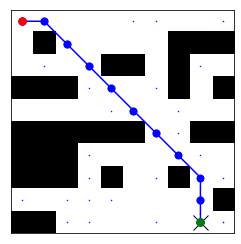

682
Prediction time:  0.07270662900003799
Reconstruction time:  0.0009678330000042479
ground truth path
predicted path


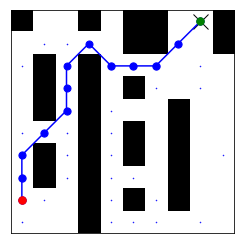

683
Prediction time:  0.07001361199996836
Reconstruction time:  0.0009031980000031581
ground truth path
predicted path


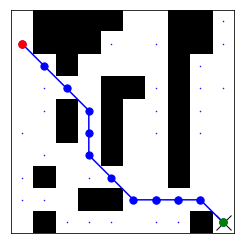

684
Prediction time:  0.06733811799995237
Reconstruction time:  0.0009506869999995615
ground truth path
predicted path


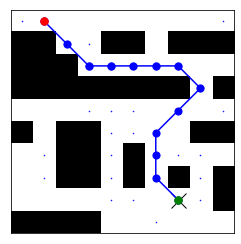

685
Prediction time:  0.07162346699999489
Reconstruction time:  0.0009645210000144289
ground truth path
predicted path


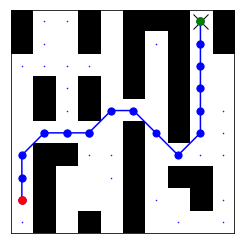

686
Prediction time:  0.06917597200003911
Reconstruction time:  0.0009788170000319951
ground truth path
predicted path


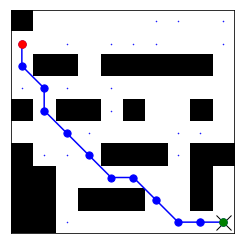

687
Prediction time:  0.06629142200000615
Reconstruction time:  0.001025303000005806
ground truth path
predicted path


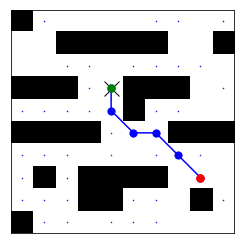

688
Prediction time:  0.06760768300000564
Reconstruction time:  0.0007668559999842728
ground truth path
predicted path


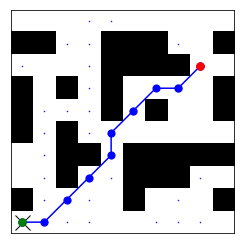

689
Prediction time:  0.0703979459999573
Reconstruction time:  0.0012390769999797158
ground truth path
predicted path


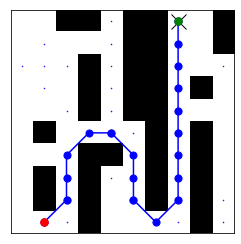

690
Prediction time:  0.07092281400002776
Reconstruction time:  0.0006691390000241881
ground truth path
predicted path


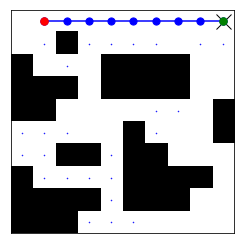

691
Prediction time:  0.06786970000001702
Reconstruction time:  0.0007888999999750013
ground truth path
predicted path


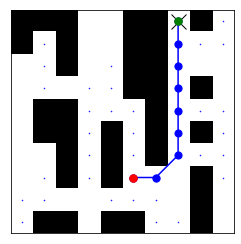

692
Prediction time:  0.07149245200002952
Reconstruction time:  0.00192013000003044
ground truth path
predicted path


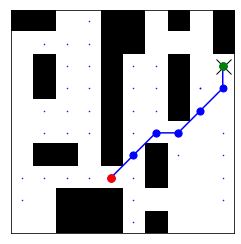

693
Prediction time:  0.34862490699998716
Reconstruction time:  0.0005278470000007474
ground truth path
predicted path


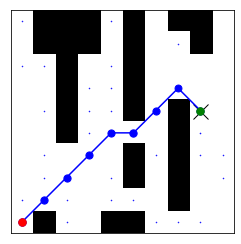

694
Prediction time:  0.07274577800001225
Reconstruction time:  0.0008667949999789926
ground truth path
predicted path


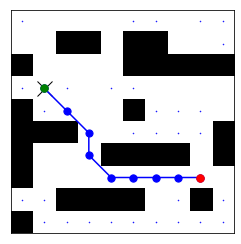

695
Prediction time:  0.06786753899996256
Reconstruction time:  0.0009301660000460288
ground truth path
predicted path


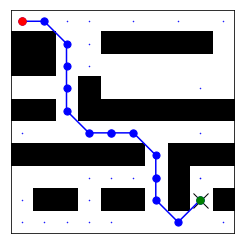

696
Prediction time:  0.06839708699999392
Reconstruction time:  0.0006972570000129963
ground truth path
predicted path


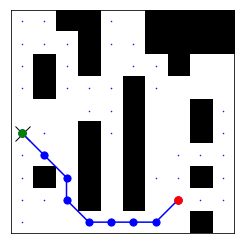

697
Prediction time:  0.07099480400000857
Reconstruction time:  0.0006883300000026793
ground truth path
predicted path


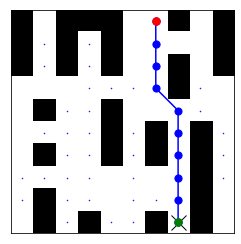

698
Prediction time:  0.07186065399997688
Reconstruction time:  0.0008180529999890496
ground truth path
predicted path


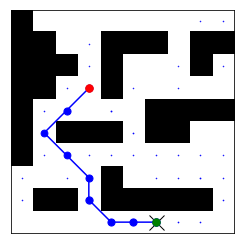

699
Prediction time:  0.06991445800002793
Reconstruction time:  0.0007434010000224589
ground truth path
predicted path


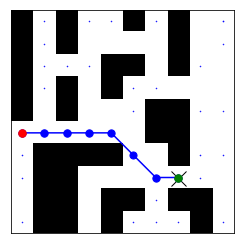

700
Prediction time:  0.07185947300001772
Reconstruction time:  0.0008414509999852271
ground truth path
predicted path


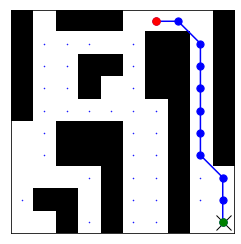

701
Prediction time:  0.06798447099998839
Reconstruction time:  0.0008356560000493118
ground truth path
predicted path


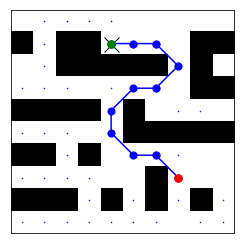

702
Prediction time:  0.07144430799996826
Reconstruction time:  0.0007808679999925516
ground truth path
predicted path


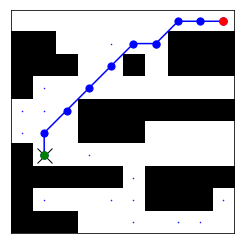

703
Prediction time:  0.06976721600000246
Reconstruction time:  0.0008775819999868872
ground truth path
predicted path


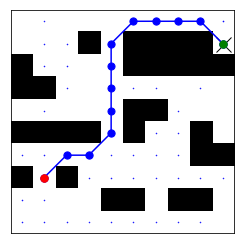

704
Prediction time:  0.06961414499994589
Reconstruction time:  0.0008091909999734526
ground truth path
predicted path


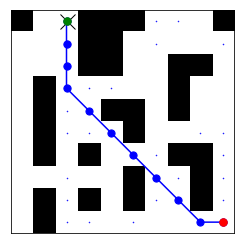

705
Prediction time:  0.06823460199996134
Reconstruction time:  0.0009357389999991028
ground truth path
predicted path


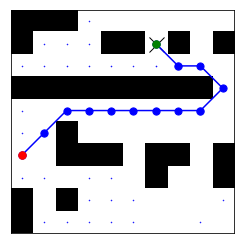

706
Prediction time:  0.07246663299997635
Reconstruction time:  0.0011261970000191468
ground truth path
predicted path


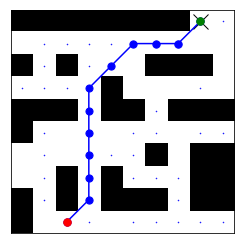

707
Prediction time:  0.06818539199997531
Reconstruction time:  0.0009049290000007204
ground truth path
predicted path


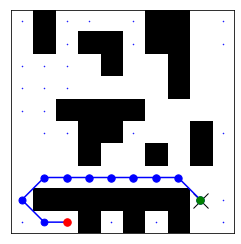

708
Prediction time:  0.0685590310000066
Reconstruction time:  0.0010540630000264173
ground truth path
predicted path


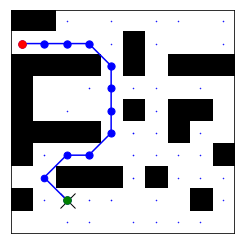

709
Prediction time:  0.0724608430000444
Reconstruction time:  0.0010425849999933234
ground truth path
predicted path


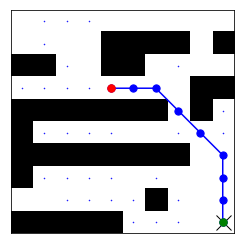

710
Prediction time:  0.33968237599998474
Reconstruction time:  0.000565771000026416
ground truth path
predicted path


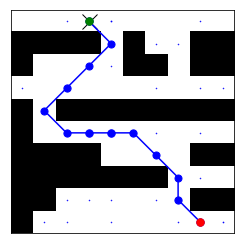

711
Prediction time:  0.07022600799996326
Reconstruction time:  0.0008986400000026151
ground truth path
predicted path


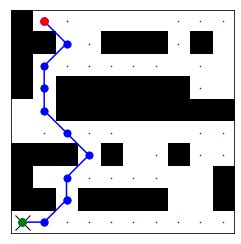

712
Prediction time:  0.06966938300001857
Reconstruction time:  0.00047133499998608386
ground truth path
predicted path


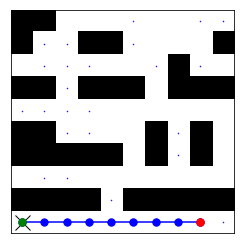

713
Prediction time:  0.07205660300002137
Reconstruction time:  0.0005611870000166164
ground truth path
predicted path


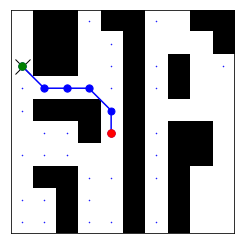

714
Prediction time:  0.06869666699998334
Reconstruction time:  0.0005450950000067678
ground truth path
predicted path


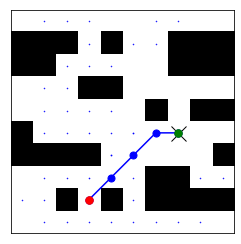

715
Prediction time:  0.07012465899998688
Reconstruction time:  0.0009531489999972109
ground truth path
predicted path


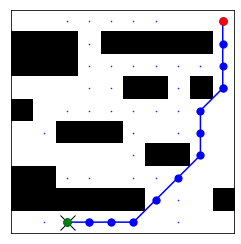

716
Prediction time:  0.06776252499997781
Reconstruction time:  0.001774148000038167
ground truth path
predicted path


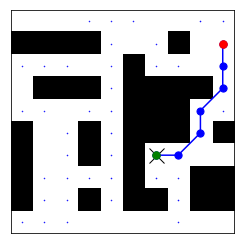

717
Prediction time:  0.07121454000002814
Reconstruction time:  0.0010153609999861146
ground truth path
predicted path


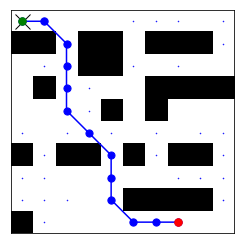

718
Prediction time:  0.07486193699998012
Reconstruction time:  0.0009710709999808387
ground truth path
predicted path


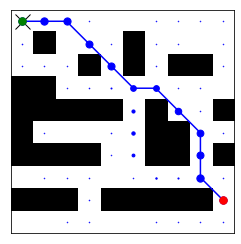

719
Prediction time:  0.07272911200004728
Reconstruction time:  0.0007646120000117662
ground truth path
predicted path


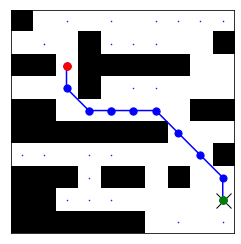

720
Prediction time:  0.07047167199999649
Reconstruction time:  0.0008017700000095829
ground truth path
predicted path


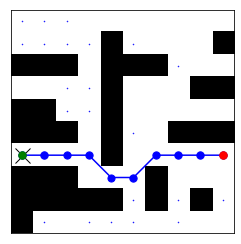

721
Prediction time:  0.06804112999998324
Reconstruction time:  0.0007673009999962233
ground truth path
predicted path


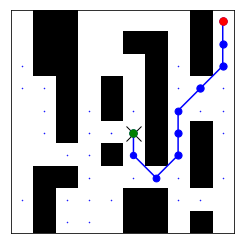

722
Prediction time:  0.0751226169999768
Reconstruction time:  0.0012517090000301323
ground truth path
predicted path


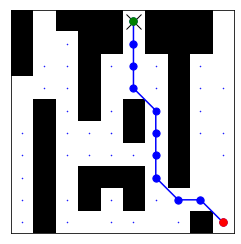

723
Prediction time:  0.07240534499999285
Reconstruction time:  0.000899285000002692
ground truth path
predicted path


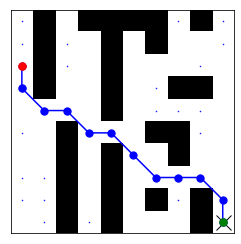

724
Prediction time:  0.07554719899997053
Reconstruction time:  0.0007407390000366831
ground truth path
predicted path


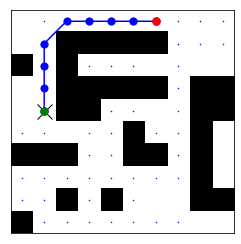

725
Prediction time:  0.07217268699997703
Reconstruction time:  0.0010219399999868983
ground truth path
predicted path


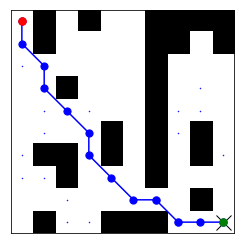

726
Prediction time:  0.07081120599997348
Reconstruction time:  0.0028142020000245793
ground truth path
predicted path


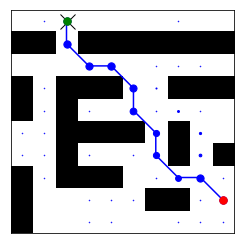

727
Prediction time:  0.3326765819999764
Reconstruction time:  0.0004028809999567784
ground truth path
predicted path


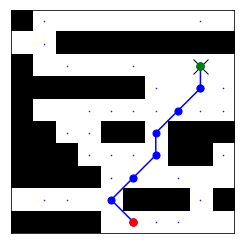

728
Prediction time:  0.06887724900002468
Reconstruction time:  0.0005379230000244206
ground truth path
predicted path


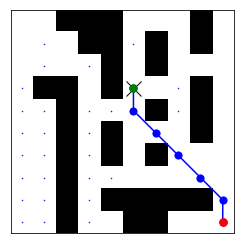

729
Prediction time:  0.06681364000002077
Reconstruction time:  0.0021669200000360433
ground truth path
predicted path


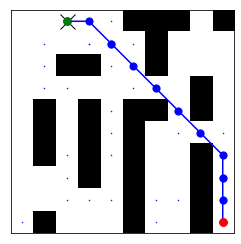

730
Prediction time:  0.07648991799999294
Reconstruction time:  0.002030985999965651
ground truth path
predicted path


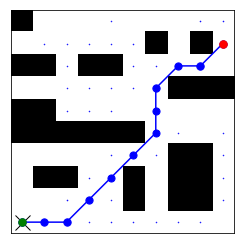

731
Prediction time:  0.08373187899996992
Reconstruction time:  0.000910824000015964
ground truth path
predicted path


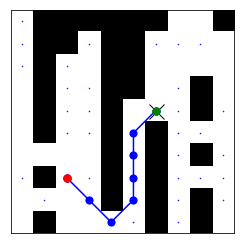

732
Prediction time:  0.07009292800000821
Reconstruction time:  0.0008463629999937439
ground truth path
predicted path


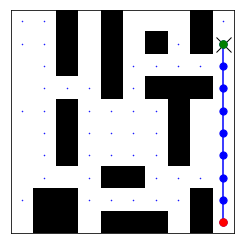

733
Prediction time:  0.07143579799998179
Reconstruction time:  0.000772295999979633
ground truth path
predicted path


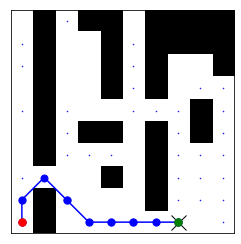

734
Prediction time:  0.07299996699998701
Reconstruction time:  0.0008391960000153631
ground truth path
predicted path


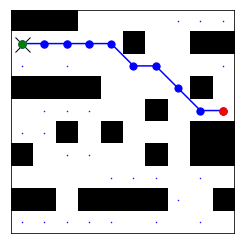

735
Prediction time:  0.07435690700003761
Reconstruction time:  0.0011333289999697627
ground truth path
predicted path


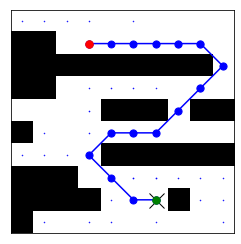

736
Prediction time:  0.0714167080000152
Reconstruction time:  0.0008757929999774205
ground truth path
predicted path


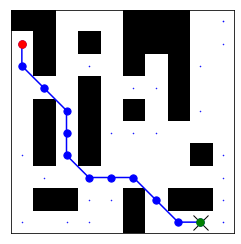

737
Prediction time:  0.07111564999996745
Reconstruction time:  0.0009756340000421915
ground truth path
predicted path


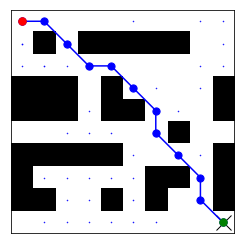

738
Prediction time:  0.07012924599996495
Reconstruction time:  0.0010271920000377577
ground truth path
predicted path


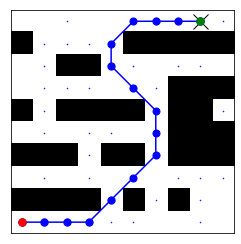

739
Prediction time:  0.0739113649999581
Reconstruction time:  0.0009577469999726418
ground truth path
predicted path


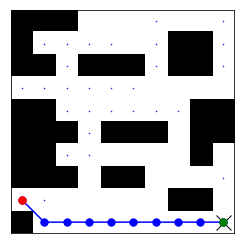

740
Prediction time:  0.06998464899999135
Reconstruction time:  0.000810591000004024
ground truth path
predicted path


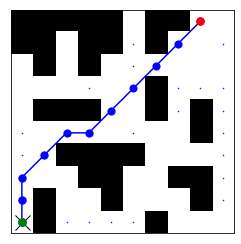

741
Prediction time:  0.06990459999997256
Reconstruction time:  0.0009484230000111893
ground truth path
predicted path


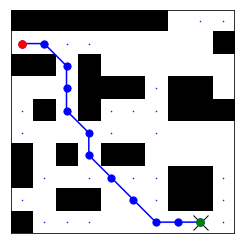

742
Prediction time:  0.06915149299999257
Reconstruction time:  0.0009368720000111352
ground truth path
predicted path


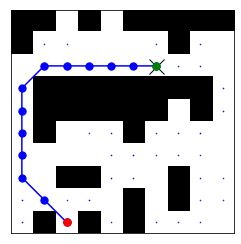

743
Prediction time:  0.07188611999998784
Reconstruction time:  0.0005931510000323215
ground truth path
predicted path


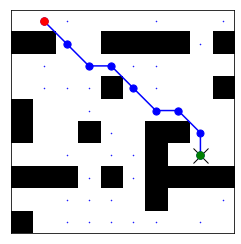

744
Prediction time:  0.06838099499998407
Reconstruction time:  0.0008786820000068474
ground truth path
predicted path


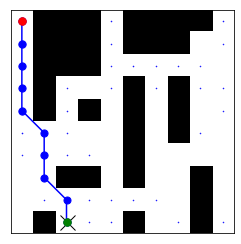

745
Prediction time:  0.3389624370000206
Reconstruction time:  0.0019775669999830825
ground truth path
predicted path


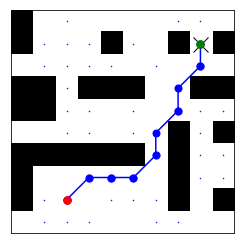

746
Prediction time:  0.06816448699999
Reconstruction time:  0.0006471979999673749
ground truth path
predicted path


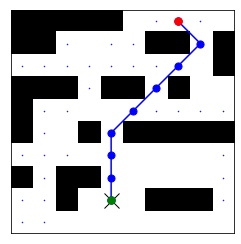

747
Prediction time:  0.0687264410000239
Reconstruction time:  0.001004347999980837
ground truth path
predicted path


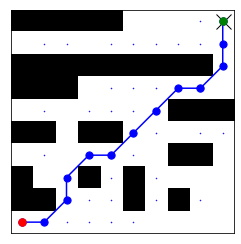

748
Prediction time:  0.0707663679999655
Reconstruction time:  0.0016974740000250677
ground truth path
predicted path


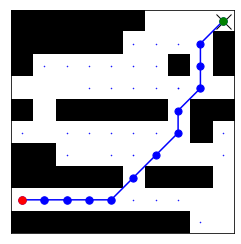

749
Prediction time:  0.07040021700004218
Reconstruction time:  0.0007947049999756928
ground truth path
predicted path


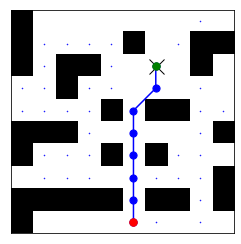

750
Prediction time:  0.07041864199999281
Reconstruction time:  0.0009273350000285063
ground truth path
predicted path


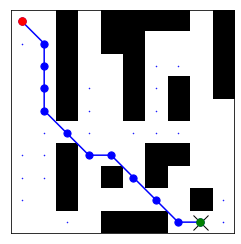

751
Prediction time:  0.07245205700002089
Reconstruction time:  0.0009489120000125695
ground truth path
predicted path


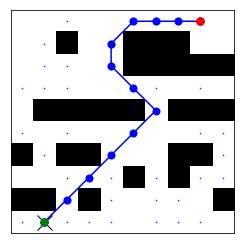

752
Prediction time:  0.06815875400002369
Reconstruction time:  0.000726710999970237
ground truth path
predicted path


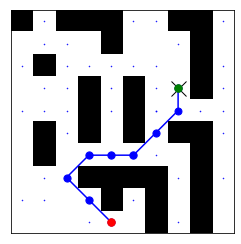

753
Prediction time:  0.07110010100001318
Reconstruction time:  0.0006314240000051541
ground truth path
predicted path


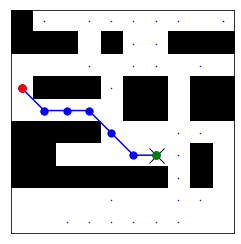

754
Prediction time:  0.06870858499996757
Reconstruction time:  0.000829378000048564
ground truth path
predicted path


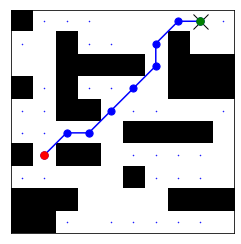

755
Prediction time:  0.07211441399999785
Reconstruction time:  0.0008618240000259902
ground truth path
predicted path


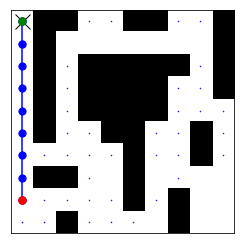

756
Prediction time:  0.07075308700001415
Reconstruction time:  0.0007605979999993906
ground truth path
predicted path


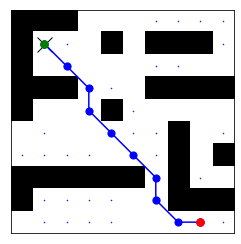

757
Prediction time:  0.07057476400001406
Reconstruction time:  0.0004933479999635892
ground truth path
predicted path


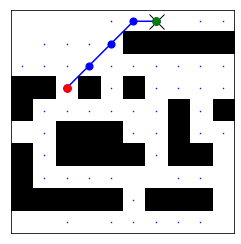

758
Prediction time:  0.06855866700004754
Reconstruction time:  0.002084738999997171
ground truth path
predicted path


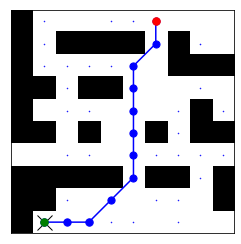

759
Prediction time:  0.07138133399996605
Reconstruction time:  0.0009806339999727243
ground truth path
predicted path


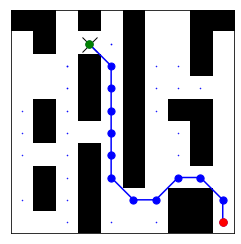

760
Prediction time:  0.0759977230000004
Reconstruction time:  0.0021457500000110485
ground truth path
predicted path


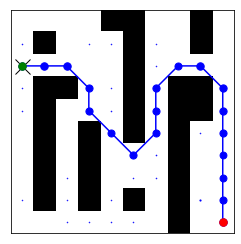

761
Prediction time:  0.06761354100001427
Reconstruction time:  0.0006438929999603715
ground truth path
predicted path


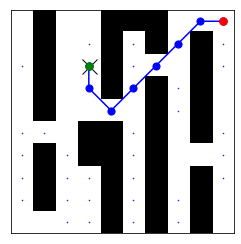

762
Prediction time:  0.33314335899996195
Reconstruction time:  0.0012028649999820118
ground truth path
predicted path


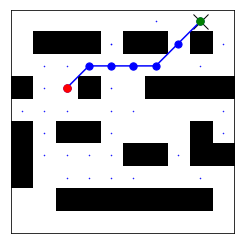

763
Prediction time:  0.07484973699996544
Reconstruction time:  0.000800958000013452
ground truth path
predicted path


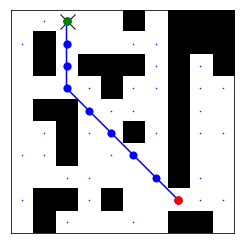

764
Prediction time:  0.06968595999995841
Reconstruction time:  0.0008556149999776608
ground truth path
predicted path


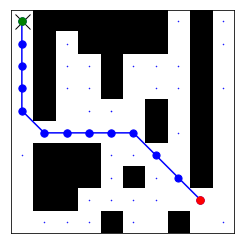

765
Prediction time:  0.06813274000001002
Reconstruction time:  0.0008079159999851981
ground truth path
predicted path


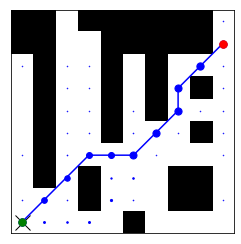

766
Prediction time:  0.06811868699998058
Reconstruction time:  0.0009972479999760253
ground truth path
predicted path


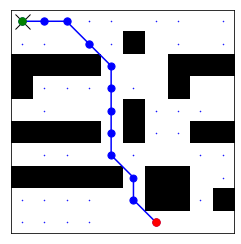

767
Prediction time:  0.06925534399999833
Reconstruction time:  0.0007899600000200735
ground truth path
predicted path


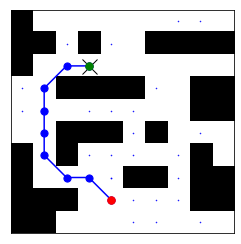

768
Prediction time:  0.06892930200001501
Reconstruction time:  0.0009509429999638996
ground truth path
predicted path


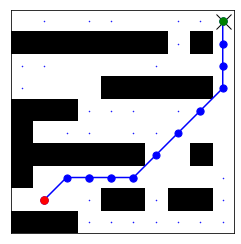

769
Prediction time:  0.06662248200001386
Reconstruction time:  0.0010675110000306631
ground truth path
predicted path


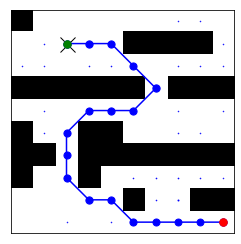

770
Prediction time:  0.06964918400001352
Reconstruction time:  0.0007825220000086119
ground truth path
predicted path


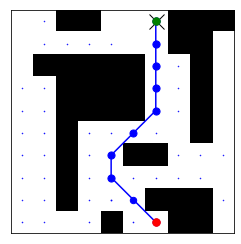

771
Prediction time:  0.07069483800000853
Reconstruction time:  0.0006558359999644381
ground truth path
predicted path


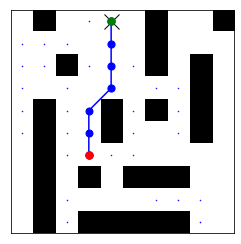

772
Prediction time:  0.06953865400004133
Reconstruction time:  0.0005401789999837092
ground truth path
predicted path


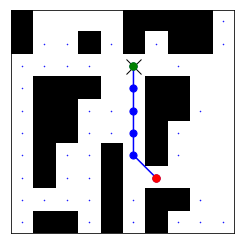

773
Prediction time:  0.07101905900003658
Reconstruction time:  0.0006121600000028593
ground truth path
predicted path


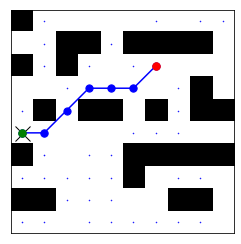

774
Prediction time:  0.06985628399996813
Reconstruction time:  0.0007314739999628728
ground truth path
predicted path


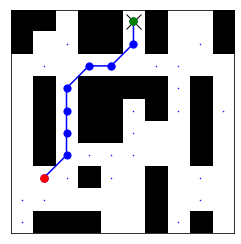

775
Prediction time:  0.06888855599999033
Reconstruction time:  0.0007704370000283234
ground truth path
predicted path


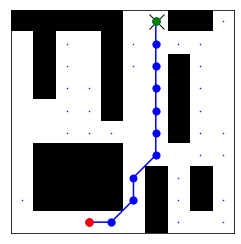

776
Prediction time:  0.07024921999999378
Reconstruction time:  0.0009246859999620938
ground truth path
predicted path


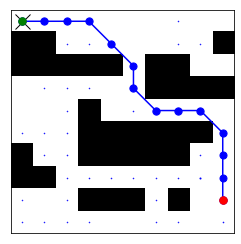

777
Prediction time:  0.07087779799996952
Reconstruction time:  0.0008364070000084212
ground truth path
predicted path


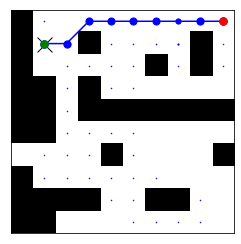

778
Prediction time:  0.07270151999995278
Reconstruction time:  0.0007897599999751037
ground truth path
predicted path


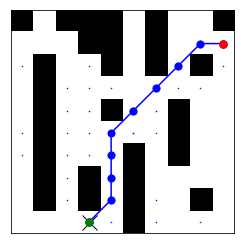

779
Prediction time:  0.34946934599997803
Reconstruction time:  0.0030168540000090616
ground truth path
predicted path


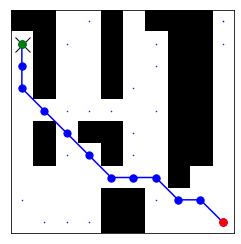

780
Prediction time:  0.07003051899999946
Reconstruction time:  0.0007311649999905967
ground truth path
predicted path


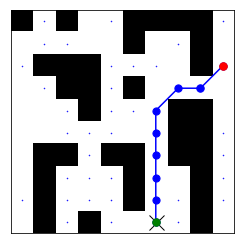

781
Prediction time:  0.0677126119999798
Reconstruction time:  0.0006876069999748324
ground truth path
predicted path


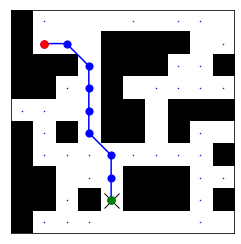

782
Prediction time:  0.07273617800001375
Reconstruction time:  0.0009006129999988843
ground truth path
predicted path


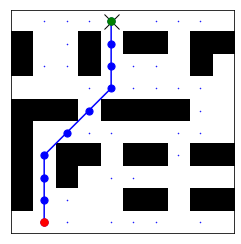

783
Prediction time:  0.07110152399997105
Reconstruction time:  0.0024781179999990854
ground truth path
predicted path


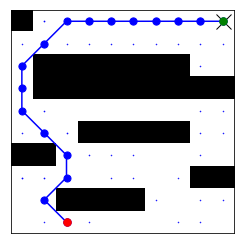

784
Prediction time:  0.07281201900002543
Reconstruction time:  0.0007730689999903007
ground truth path
predicted path


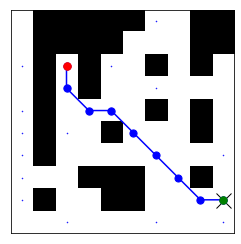

785
Prediction time:  0.06902094400004444
Reconstruction time:  0.0005853719999890927
ground truth path
predicted path


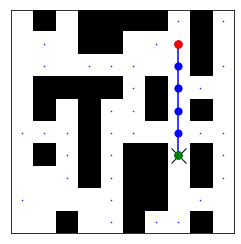

786
Prediction time:  0.0687224579999679
Reconstruction time:  0.0007552310000278339
ground truth path
predicted path


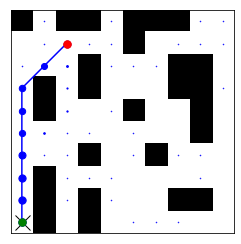

787
Prediction time:  0.0728107189999605
Reconstruction time:  0.0008554510000067239
ground truth path
predicted path


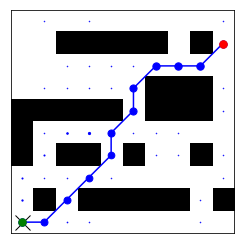

788
Prediction time:  0.07330507200003922
Reconstruction time:  0.0008110699999974713
ground truth path
predicted path


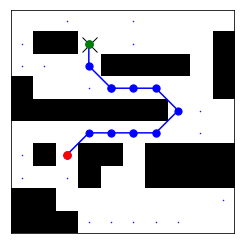

789
Prediction time:  0.06815300400000979
Reconstruction time:  0.0008016279999765175
ground truth path
predicted path


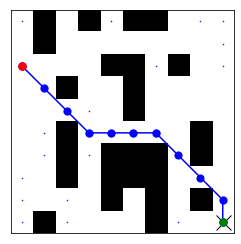

790
Prediction time:  0.0688497269999857
Reconstruction time:  0.0006132190000016635
ground truth path
predicted path


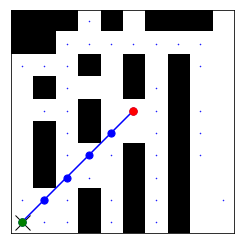

791
Prediction time:  0.06943056500000466
Reconstruction time:  0.0010944649999942158
ground truth path
predicted path


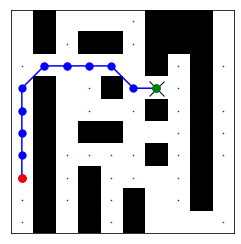

792
Prediction time:  0.06838574900001504
Reconstruction time:  0.0005633030000353756
ground truth path
predicted path


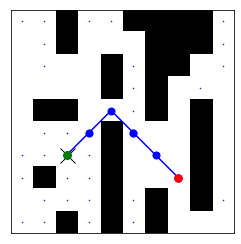

793
Prediction time:  0.07153314699996827
Reconstruction time:  0.0006952119999823481
ground truth path
predicted path


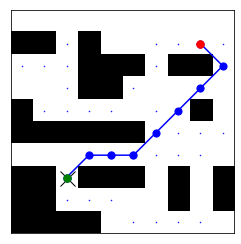

794
Prediction time:  0.07200802299996667
Reconstruction time:  0.0007547220000105881
ground truth path
predicted path


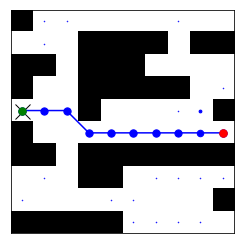

795
Prediction time:  0.06727340300000151
Reconstruction time:  0.0006422809999548917
ground truth path
predicted path


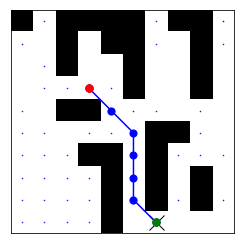

796
Prediction time:  0.07153167400002758
Reconstruction time:  0.0007960840000009739
ground truth path
predicted path


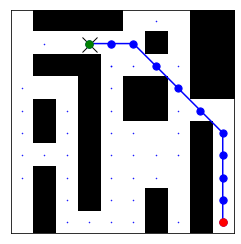

797
Prediction time:  0.3400440789999948
Reconstruction time:  0.000526455000056103
ground truth path
predicted path


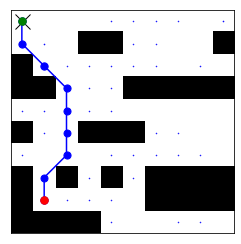

798
Prediction time:  0.06973601200002122
Reconstruction time:  0.001026608000017859
ground truth path
predicted path


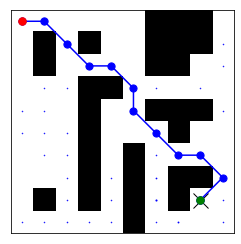

799
Prediction time:  0.0715360300000043
Reconstruction time:  0.0016071349999720042
ground truth path
predicted path


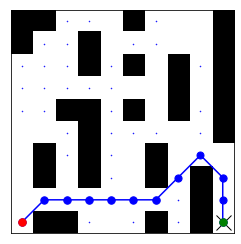

800
Prediction time:  0.07130587599999672
Reconstruction time:  0.0009924590000309763
ground truth path
predicted path


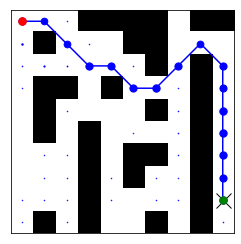

801
Prediction time:  0.0726491869999677
Reconstruction time:  0.0005695450000189339
ground truth path
predicted path


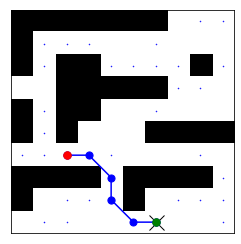

802
Prediction time:  0.07436445999996977
Reconstruction time:  0.0023898719999806417
ground truth path
predicted path


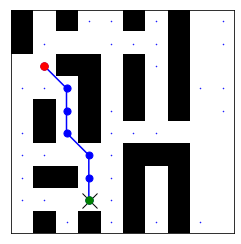

803
Prediction time:  0.06994166999999152
Reconstruction time:  0.0008279220000417808
ground truth path
predicted path


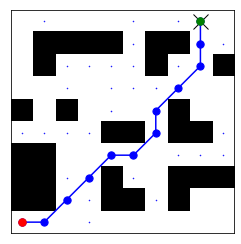

804
Prediction time:  0.07188549899996133
Reconstruction time:  0.0009875559999841244
ground truth path
predicted path


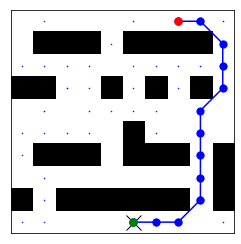

805
Prediction time:  0.071175616000005
Reconstruction time:  0.0009729079999942769
ground truth path
predicted path


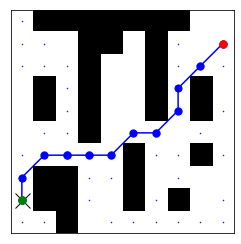

806
Prediction time:  0.0711967350000009
Reconstruction time:  0.0006999869999617658
ground truth path
predicted path


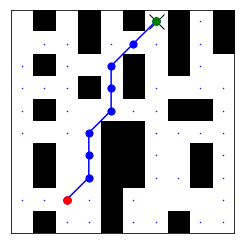

807
Prediction time:  0.07436372299997629
Reconstruction time:  0.0008050399999888214
ground truth path
predicted path


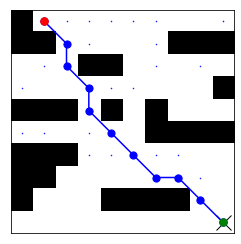

808
Prediction time:  0.0736983830000213
Reconstruction time:  0.0018312569999920925
ground truth path
predicted path


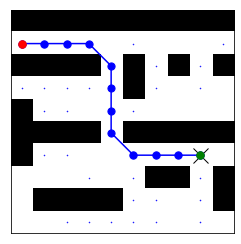

809
Prediction time:  0.07218517100000099
Reconstruction time:  0.0010034150000137743
ground truth path
predicted path


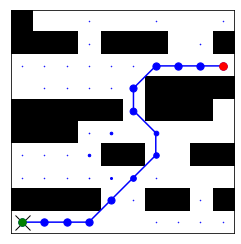

810
Prediction time:  0.07174550100000943
Reconstruction time:  0.0009062149999863323
ground truth path
predicted path


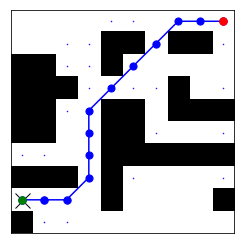

811
Prediction time:  0.07796756699997331
Reconstruction time:  0.0008317180000290136
ground truth path
predicted path


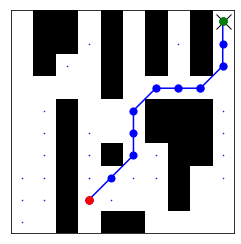

812
Prediction time:  0.07078050199999097
Reconstruction time:  0.0021335360000307446
ground truth path
predicted path


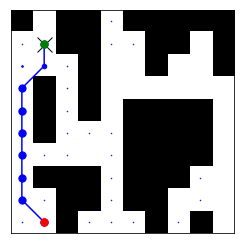

813
Prediction time:  0.07109950699998535
Reconstruction time:  0.0007324339999854601
ground truth path
predicted path


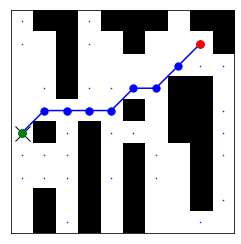

814
Prediction time:  0.34712360800000397
Reconstruction time:  0.0026213319999897067
ground truth path
predicted path


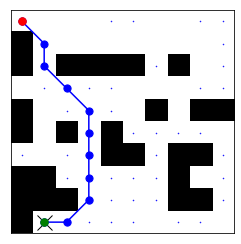

815
Prediction time:  0.07447012500000483
Reconstruction time:  0.0008880050000357187
ground truth path
predicted path


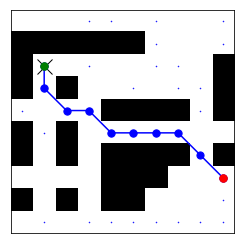

816
Prediction time:  0.07044723400002795
Reconstruction time:  0.0007667410000067321
ground truth path
predicted path


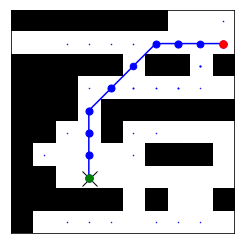

817
Prediction time:  0.0707608860000164
Reconstruction time:  0.0007785669999975653
ground truth path
predicted path


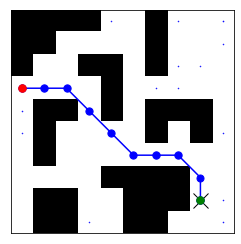

818
Prediction time:  0.07076963600002273
Reconstruction time:  0.0007473240000308579
ground truth path
predicted path


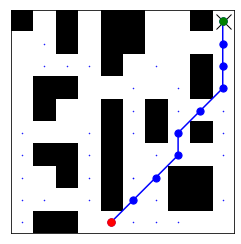

819
Prediction time:  0.07054501100003563
Reconstruction time:  0.0018999060000055579
ground truth path
predicted path


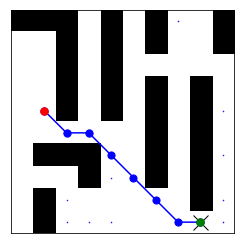

820
Prediction time:  0.06851144500001283
Reconstruction time:  0.0010782449999737764
ground truth path
predicted path


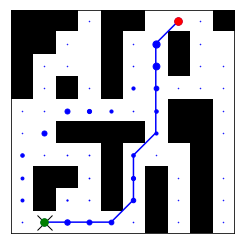

821
Prediction time:  0.07431814599999598
Reconstruction time:  0.0006331139999815605
ground truth path
predicted path


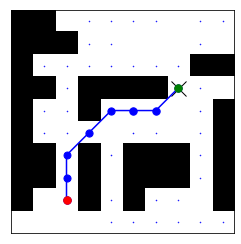

822
Prediction time:  0.08353499800000463
Reconstruction time:  0.0016533520000052704
ground truth path
predicted path


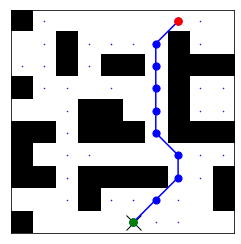

823
Prediction time:  0.07196986000002425
Reconstruction time:  0.0006946899999888956
ground truth path
predicted path


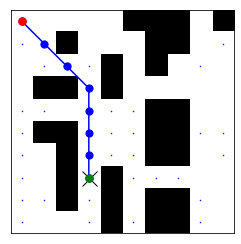

824
Prediction time:  0.07180349499998329
Reconstruction time:  0.0006292830000234062
ground truth path
predicted path


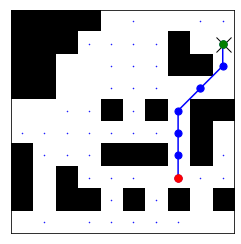

825
Prediction time:  0.07510211099997832
Reconstruction time:  0.000681488999987323
ground truth path
predicted path


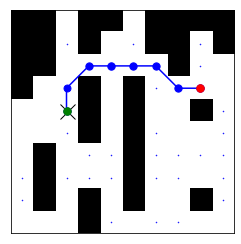

826
Prediction time:  0.07263598999998067
Reconstruction time:  0.0010070390000009866
ground truth path
predicted path


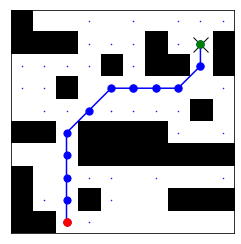

827
Prediction time:  0.07569396799999595
Reconstruction time:  0.0007232350000094812
ground truth path
predicted path


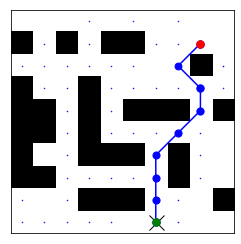

828
Prediction time:  0.07799684400004026
Reconstruction time:  0.000985842999966735
ground truth path
predicted path


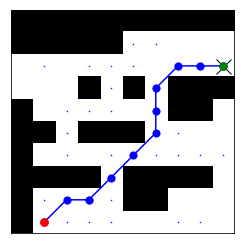

829
Prediction time:  0.07794354399999293
Reconstruction time:  0.0009350839999910932
ground truth path
predicted path


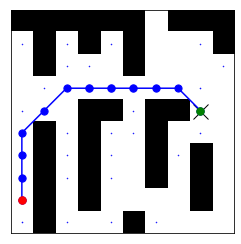

830
Prediction time:  0.07445901099998764
Reconstruction time:  0.0008078969999587571
ground truth path
predicted path


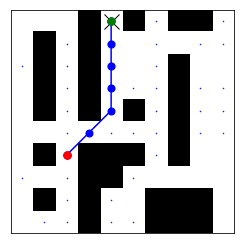

831
Prediction time:  0.3334211079999818
Reconstruction time:  0.001519661999964228
ground truth path
predicted path


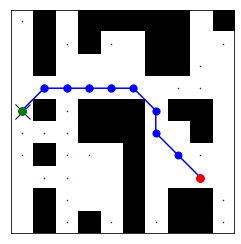

832
Prediction time:  0.06882795100000294
Reconstruction time:  0.0007261630000243713
ground truth path
predicted path


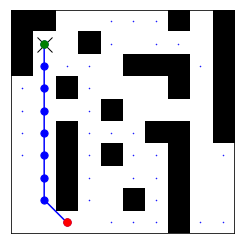

833
Prediction time:  0.07147897900000544
Reconstruction time:  0.0005714979999993375
ground truth path
predicted path


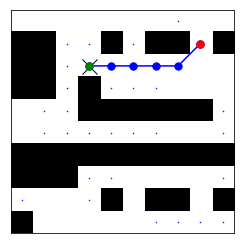

834
Prediction time:  0.06874874900000805
Reconstruction time:  0.0005925849999925958
ground truth path
predicted path


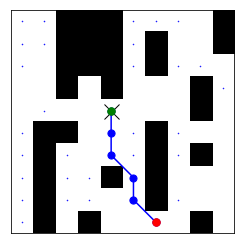

835
Prediction time:  0.07156869900001084
Reconstruction time:  0.0007018330000505557
ground truth path
predicted path


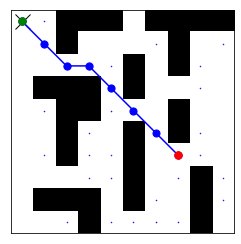

836
Prediction time:  0.07490509199999451
Reconstruction time:  0.0008677769999962948
ground truth path
predicted path


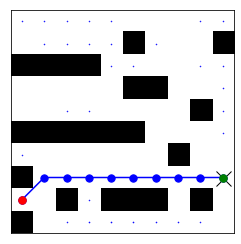

837
Prediction time:  0.07361751999997068
Reconstruction time:  0.002605556999981218
ground truth path
predicted path


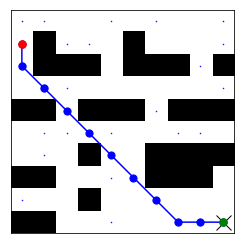

838
Prediction time:  0.07119446899997683
Reconstruction time:  0.000798876000033033
ground truth path
predicted path


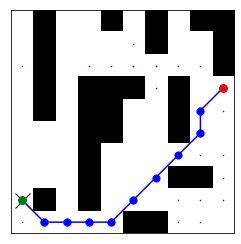

839
Prediction time:  0.07112520900000163
Reconstruction time:  0.0009092920000171034
ground truth path
predicted path


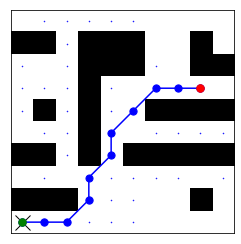

840
Prediction time:  0.07059832499999175
Reconstruction time:  0.0010247640000216052
ground truth path
predicted path


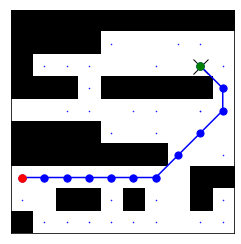

841
Prediction time:  0.07095060400001785
Reconstruction time:  0.0007590010000058101
ground truth path
predicted path


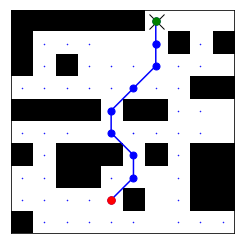

842
Prediction time:  0.06929129599996031
Reconstruction time:  0.0008130720000281144
ground truth path
predicted path


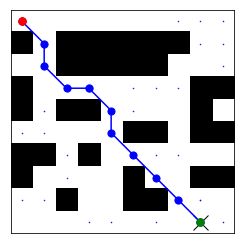

843
Prediction time:  0.07191093400001591
Reconstruction time:  0.0006841160000021773
ground truth path
predicted path


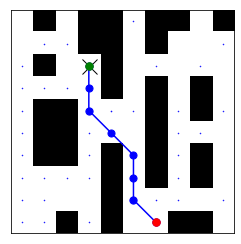

844
Prediction time:  0.07198827199999869
Reconstruction time:  0.0009843830000022535
ground truth path
predicted path


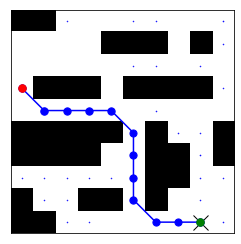

845
Prediction time:  0.06983547099997622
Reconstruction time:  0.0008931809999808138
ground truth path
predicted path


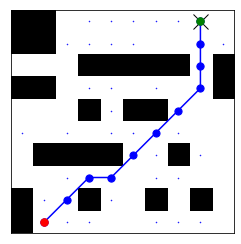

846
Prediction time:  0.07170495700000856
Reconstruction time:  0.0009466779999911523
ground truth path
predicted path


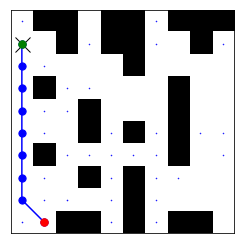

847
Prediction time:  0.074148474000026
Reconstruction time:  0.0007606460000033621
ground truth path
predicted path


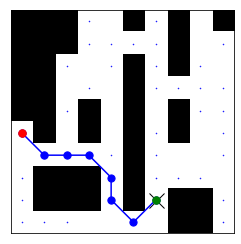

848
Prediction time:  0.07409240700002329
Reconstruction time:  0.0007746410000208925
ground truth path
predicted path


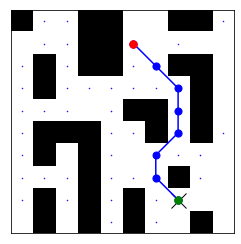

849
Prediction time:  0.36747859799999105
Reconstruction time:  0.0023025680000046123
ground truth path
predicted path


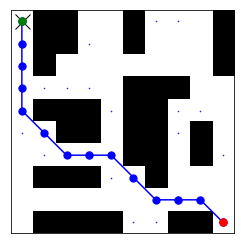

850
Prediction time:  0.07202937499999962
Reconstruction time:  0.0006572579999897243
ground truth path
predicted path


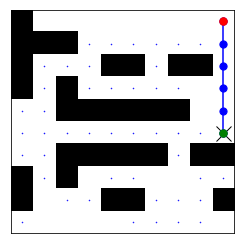

851
Prediction time:  0.0733359160000191
Reconstruction time:  0.002032479999968473
ground truth path
predicted path


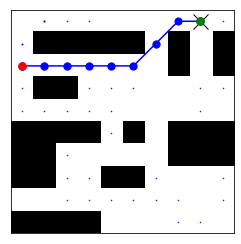

852
Prediction time:  0.07175019300001395
Reconstruction time:  0.0007014939999976377
ground truth path
predicted path


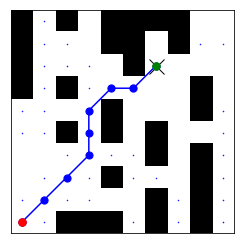

853
Prediction time:  0.07822317199997997
Reconstruction time:  0.0009631710000235216
ground truth path
predicted path


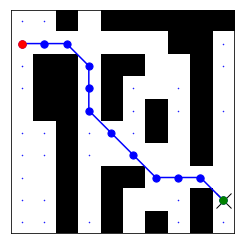

854
Prediction time:  0.0708744030000048
Reconstruction time:  0.0009815500000058819
ground truth path
predicted path


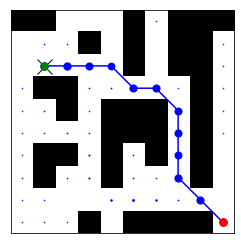

855
Prediction time:  0.07975651199996037
Reconstruction time:  0.0006928509999966082
ground truth path
predicted path


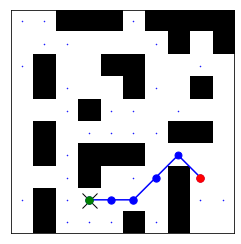

856
Prediction time:  0.07173574199998711
Reconstruction time:  0.0010029270000018187
ground truth path
predicted path


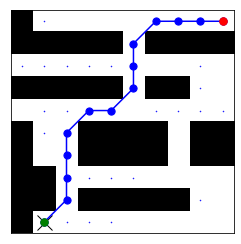

857
Prediction time:  0.07199832600002765
Reconstruction time:  0.0008070249999718726
ground truth path
predicted path


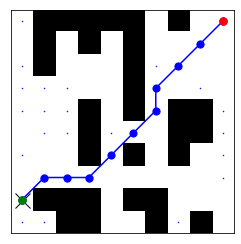

858
Prediction time:  0.07296396800001048
Reconstruction time:  0.0006948980000061056
ground truth path
predicted path


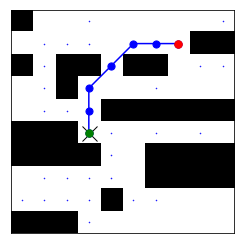

859
Prediction time:  0.07675084599998172
Reconstruction time:  0.0008696429999872635
ground truth path
predicted path


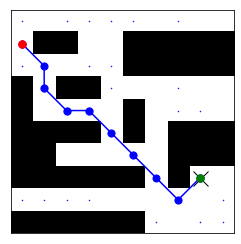

860
Prediction time:  0.07021342199999481
Reconstruction time:  0.0008326990000000478
ground truth path
predicted path


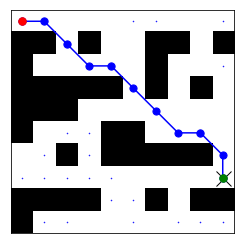

861
Prediction time:  0.06999742800002196
Reconstruction time:  0.0008049460000165709
ground truth path
predicted path


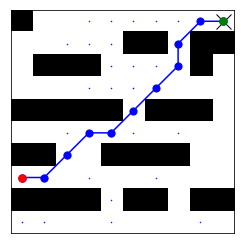

862
Prediction time:  0.07230352400000584
Reconstruction time:  0.0010024550000480303
ground truth path
predicted path


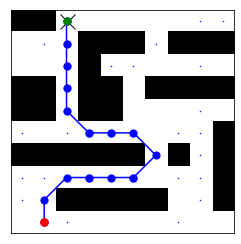

863
Prediction time:  0.07224750599999652
Reconstruction time:  0.0008887089999802811
ground truth path
predicted path


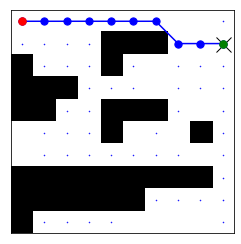

864
Prediction time:  0.073421575999987
Reconstruction time:  0.0007604529999980514
ground truth path
predicted path


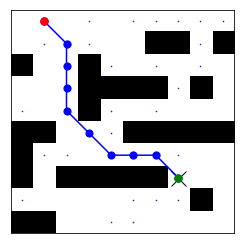

865
Prediction time:  0.07262618499999007
Reconstruction time:  0.0007781049999948664
ground truth path
predicted path


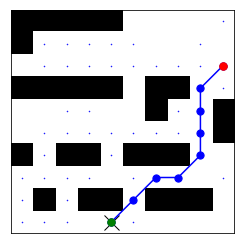

866
Prediction time:  0.0704330799999866
Reconstruction time:  0.0010079369999971277
ground truth path
predicted path


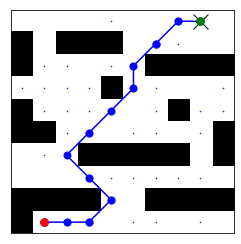

867
Prediction time:  0.35872451300002695
Reconstruction time:  0.001265582000030463
ground truth path
predicted path


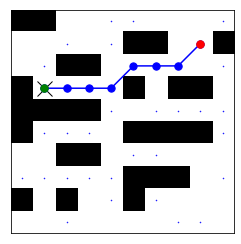

868
Prediction time:  0.06940955299995721
Reconstruction time:  0.0007979249999721105
ground truth path
predicted path


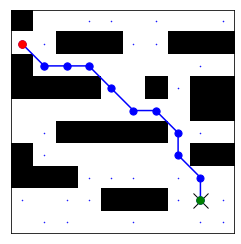

869
Prediction time:  0.07117464899999959
Reconstruction time:  0.0008575279999831764
ground truth path
predicted path


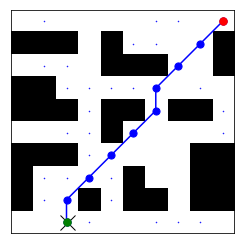

870
Prediction time:  0.07010964100004458
Reconstruction time:  0.0008172010000180308
ground truth path
predicted path


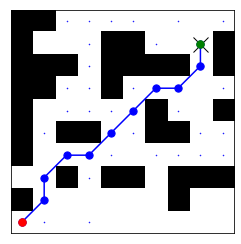

871
Prediction time:  0.06938625500004036
Reconstruction time:  0.000683796999965125
ground truth path
predicted path


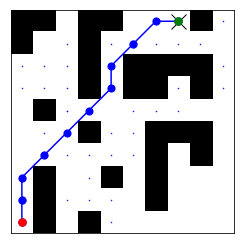

872
Prediction time:  0.07407392900000787
Reconstruction time:  0.0008508899999810637
ground truth path
predicted path


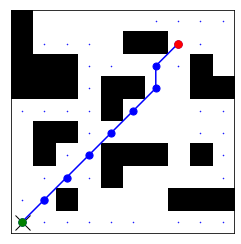

873
Prediction time:  0.07315709300002027
Reconstruction time:  0.0009352399999897898
ground truth path
predicted path


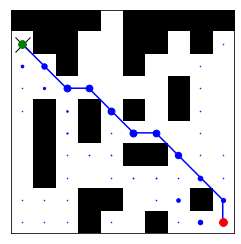

874
Prediction time:  0.07097180300002037
Reconstruction time:  0.0009211519999894335
ground truth path
predicted path


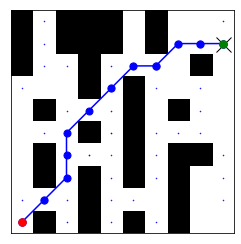

875
Prediction time:  0.0688418679999927
Reconstruction time:  0.0007527309999773024
ground truth path
predicted path


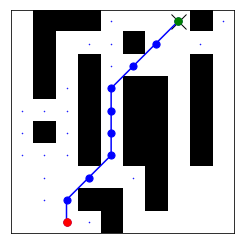

876
Prediction time:  0.07154586300003984
Reconstruction time:  0.0008560840000200187
ground truth path
predicted path


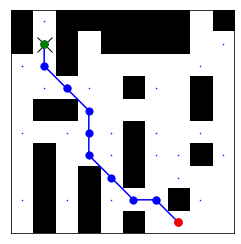

877
Prediction time:  0.0732229209999673
Reconstruction time:  0.0007241939999858005
ground truth path
predicted path


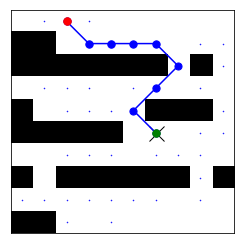

878
Prediction time:  0.07256562499998154
Reconstruction time:  0.0008350850000056198
ground truth path
predicted path


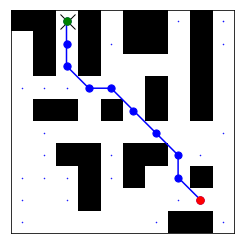

879
Prediction time:  0.07097375400002193
Reconstruction time:  0.0010997870000437615
ground truth path
predicted path


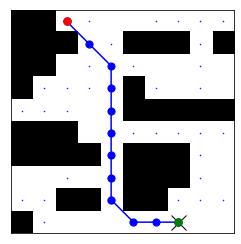

880
Prediction time:  0.07065167900003644
Reconstruction time:  0.0009368519999952696
ground truth path
predicted path


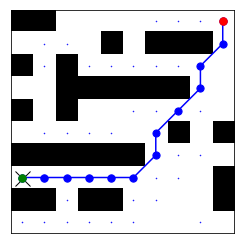

881
Prediction time:  0.06688070300003801
Reconstruction time:  0.0008643379999853096
ground truth path
predicted path


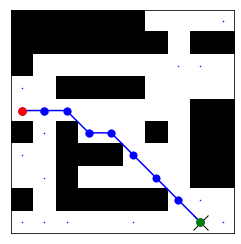

882
Prediction time:  0.07200279299996737
Reconstruction time:  0.0018575359999886132
ground truth path
predicted path


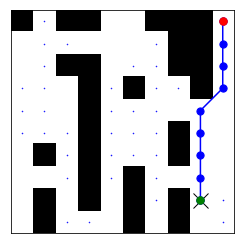

883
Prediction time:  0.07404269999994995
Reconstruction time:  0.0006356650000043373
ground truth path
predicted path


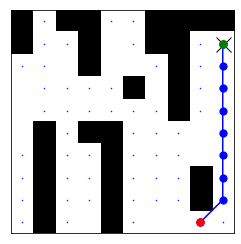

884
Prediction time:  0.3715148440000462
Reconstruction time:  0.00139043999996602
ground truth path
predicted path


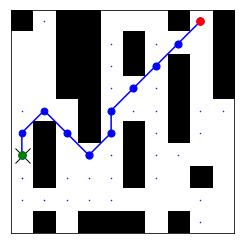

885
Prediction time:  0.07162544600004139
Reconstruction time:  0.0006960160000062388
ground truth path
predicted path


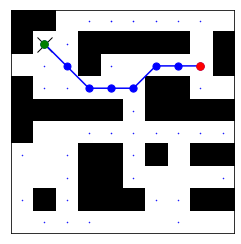

886
Prediction time:  0.07086237600003642
Reconstruction time:  0.0007604819999755819
ground truth path
predicted path


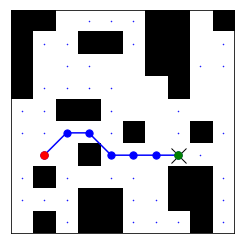

887
Prediction time:  0.07537024099997325
Reconstruction time:  0.0011258699999530108
ground truth path
predicted path


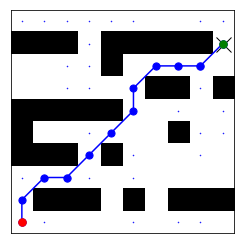

888
Prediction time:  0.07286809900000435
Reconstruction time:  0.0012147220000429115
ground truth path
predicted path


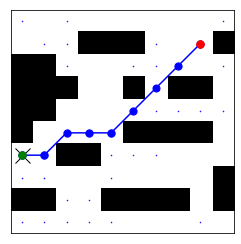

889
Prediction time:  0.07019898900000499
Reconstruction time:  0.0006698480000295604
ground truth path
predicted path


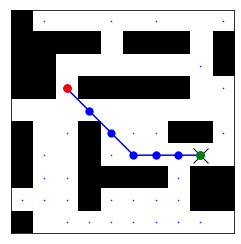

890
Prediction time:  0.07435751100001653
Reconstruction time:  0.00115992000002052
ground truth path
predicted path


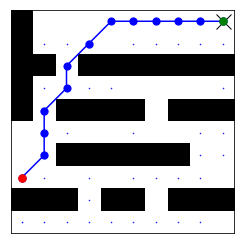

891
Prediction time:  0.07004569499997615
Reconstruction time:  0.0009225260000107482
ground truth path
predicted path


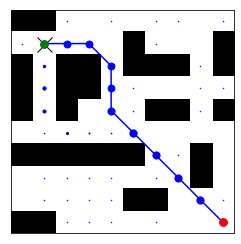

892
Prediction time:  0.0709980309999878
Reconstruction time:  0.0007440290000317873
ground truth path
predicted path


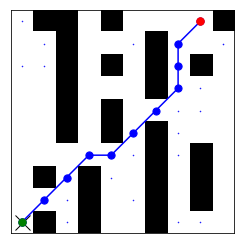

893
Prediction time:  0.068207593000011
Reconstruction time:  0.0008062609999797132
ground truth path
predicted path


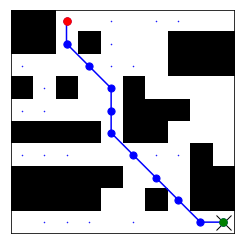

894
Prediction time:  0.070314011999983
Reconstruction time:  0.0007445520000146644
ground truth path
predicted path


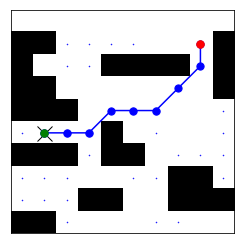

895
Prediction time:  0.06946646100004727
Reconstruction time:  0.000508295999964048
ground truth path
predicted path


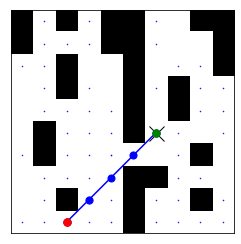

896
Prediction time:  0.06873591200002238
Reconstruction time:  0.000784937999981139
ground truth path
predicted path


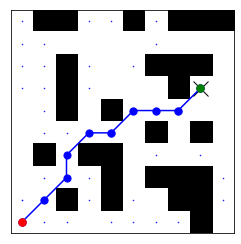

897
Prediction time:  0.06809258200001977
Reconstruction time:  0.0007240520000095785
ground truth path
predicted path


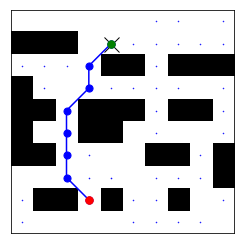

898
Prediction time:  0.07034326299998384
Reconstruction time:  0.0006132860000320761
ground truth path
predicted path


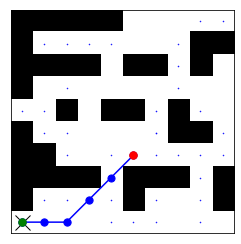

899
Prediction time:  0.06830497599997898
Reconstruction time:  0.00057581900000514
ground truth path
predicted path


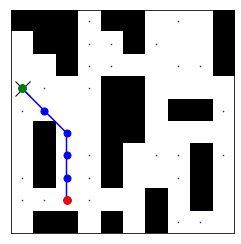

900
Prediction time:  0.07401056700001618
Reconstruction time:  0.0007940110000390632
ground truth path
predicted path


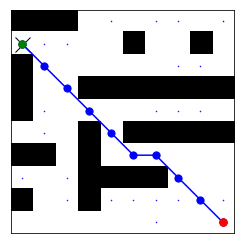

901
Prediction time:  0.07139332100001639
Reconstruction time:  0.0010355559999766228
ground truth path
predicted path


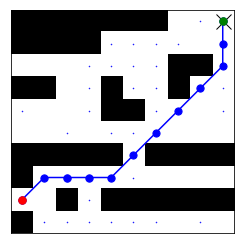

902
Prediction time:  0.37622760499999686
Reconstruction time:  0.0004379069999913554
ground truth path
predicted path


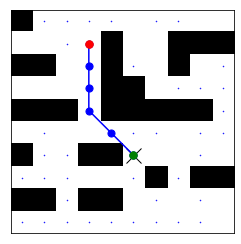

903
Prediction time:  0.06995656200001577
Reconstruction time:  0.0008190589999799158
ground truth path
predicted path


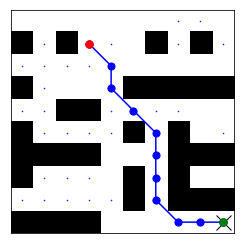

904
Prediction time:  0.07288080699999
Reconstruction time:  0.0017188479999958872
ground truth path
predicted path


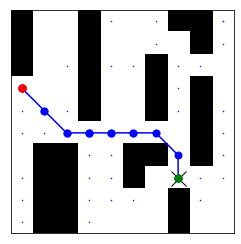

905
Prediction time:  0.07492111800002021
Reconstruction time:  0.0012210620000132621
ground truth path
predicted path


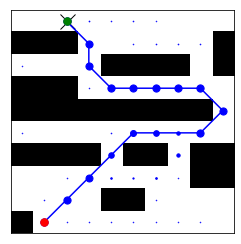

906
Prediction time:  0.0693865690000166
Reconstruction time:  0.0006648770000197146
ground truth path
predicted path


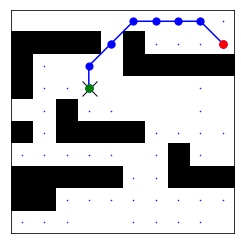

907
Prediction time:  0.07166044299998475
Reconstruction time:  0.0010736469999983456
ground truth path
predicted path


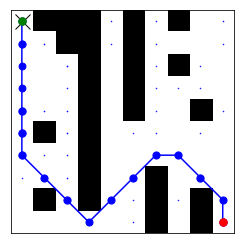

908
Prediction time:  0.07372117699998171
Reconstruction time:  0.0008678320000399253
ground truth path
predicted path


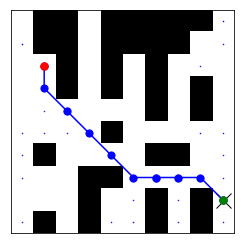

909
Prediction time:  0.07179920000004358
Reconstruction time:  0.0006586419999621285
ground truth path
predicted path


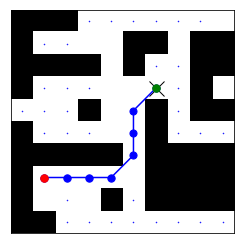

910
Prediction time:  0.07753998399999773
Reconstruction time:  0.0009466870000096606
ground truth path
predicted path


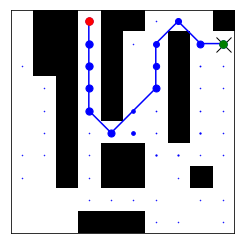

911
Prediction time:  0.07229330799998479
Reconstruction time:  0.0006614750000153435
ground truth path
predicted path


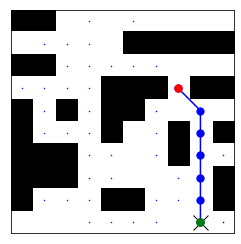

912
Prediction time:  0.0704201409999996
Reconstruction time:  0.0006839389999981904
ground truth path
predicted path


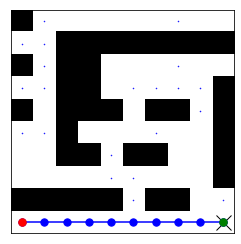

913
Prediction time:  0.07227101500001254
Reconstruction time:  0.002289469000004374
ground truth path
predicted path


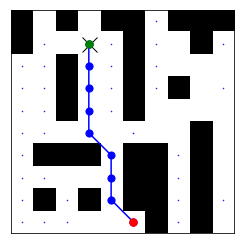

914
Prediction time:  0.07078168700002152
Reconstruction time:  0.0007102420000251186
ground truth path
predicted path


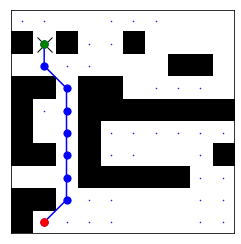

915
Prediction time:  0.07269858400002249
Reconstruction time:  0.0006658239999524085
ground truth path
predicted path


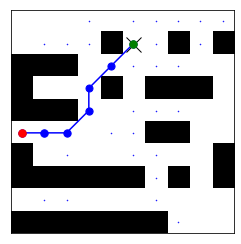

916
Prediction time:  0.0707125010000027
Reconstruction time:  0.0010256370000547577
ground truth path
predicted path


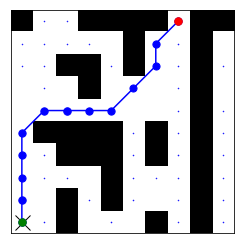

917
Prediction time:  0.07194326100000126
Reconstruction time:  0.0008224829999790018
ground truth path
predicted path


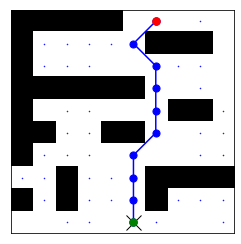

918
Prediction time:  0.07207600100002765
Reconstruction time:  0.0008319080000092072
ground truth path
predicted path


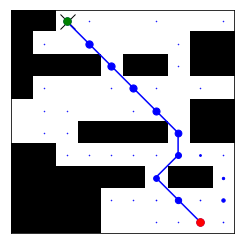

919
Prediction time:  0.3838530579999997
Reconstruction time:  0.0009963219999917783
ground truth path
predicted path


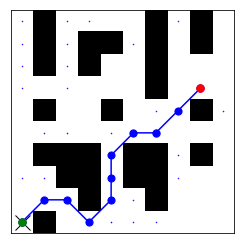

920
Prediction time:  0.0732783539999673
Reconstruction time:  0.000709978999964278
ground truth path
predicted path


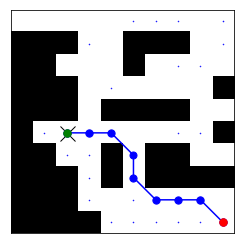

921
Prediction time:  0.07447232799995618
Reconstruction time:  0.0008702719999860165
ground truth path
predicted path


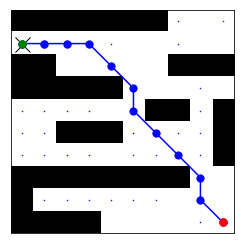

922
Prediction time:  0.07388733999999886
Reconstruction time:  0.0008839630000352372
ground truth path
predicted path


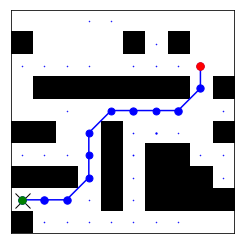

923
Prediction time:  0.0727232259999937
Reconstruction time:  0.0009972539999694163
ground truth path
predicted path


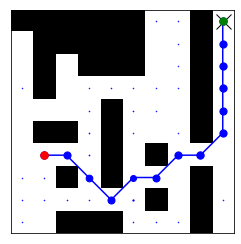

924
Prediction time:  0.07286032700000078
Reconstruction time:  0.0009324580000225069
ground truth path
predicted path


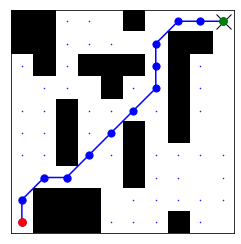

925
Prediction time:  0.0774377860000186
Reconstruction time:  0.0008299190000116141
ground truth path
predicted path


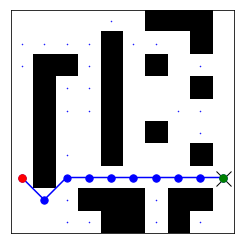

926
Prediction time:  0.07176855099999102
Reconstruction time:  0.0012578429999621221
ground truth path
predicted path


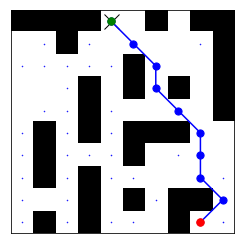

927
Prediction time:  0.06912454100000787
Reconstruction time:  0.0008799880000083249
ground truth path
predicted path


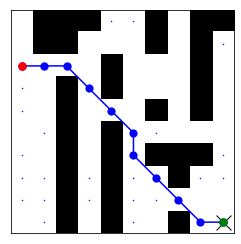

928
Prediction time:  0.07171731300002193
Reconstruction time:  0.0008733590000247204
ground truth path
predicted path


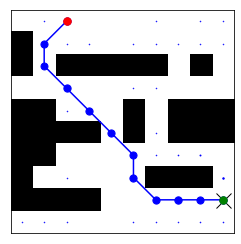

929
Prediction time:  0.07146362399998907
Reconstruction time:  0.002350455999987844
ground truth path
predicted path


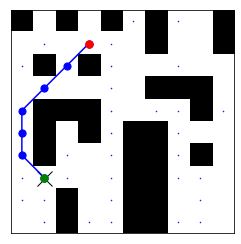

930
Prediction time:  0.07383367300002419
Reconstruction time:  0.0009539959999642633
ground truth path
predicted path


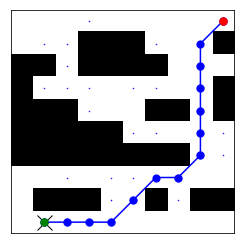

931
Prediction time:  0.07340815699996028
Reconstruction time:  0.0008874459999788087
ground truth path
predicted path


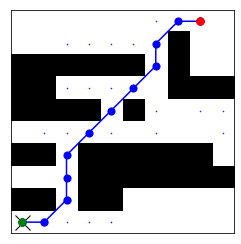

932
Prediction time:  0.07342987999999195
Reconstruction time:  0.0020235039999647597
ground truth path
predicted path


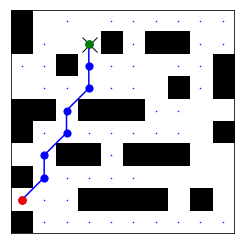

933
Prediction time:  0.07022322900002109
Reconstruction time:  0.0009020690000056675
ground truth path
predicted path


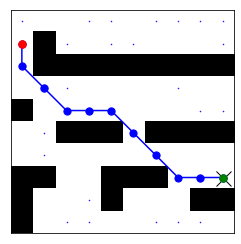

934
Prediction time:  0.0763652269999966
Reconstruction time:  0.0020305200000052537
ground truth path
predicted path


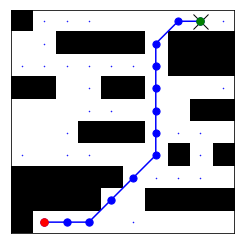

935
Prediction time:  0.06809686700000839
Reconstruction time:  0.001022701000010784
ground truth path
predicted path


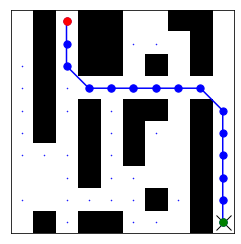

936
Prediction time:  0.33838848800002097
Reconstruction time:  0.0014507749999665975
ground truth path
predicted path


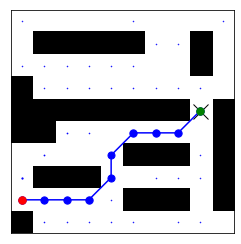

937
Prediction time:  0.07025608000003558
Reconstruction time:  0.002565079000021342
ground truth path
predicted path


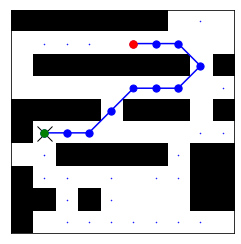

938
Prediction time:  0.06813300700002856
Reconstruction time:  0.0006057549999809453
ground truth path
predicted path


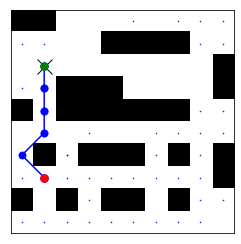

939
Prediction time:  0.06801757899995664
Reconstruction time:  0.0022398410000050717
ground truth path
predicted path


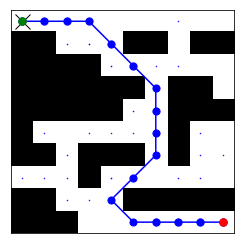

940
Prediction time:  0.07752680900000541
Reconstruction time:  0.0008014339999817821
ground truth path
predicted path


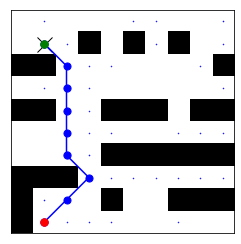

941
Prediction time:  0.07254806299999927
Reconstruction time:  0.0009963649999917834
ground truth path
predicted path


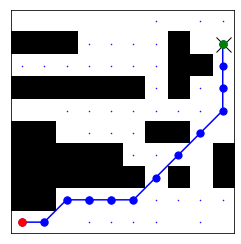

942
Prediction time:  0.06986995099998694
Reconstruction time:  0.0007263420000072074
ground truth path
predicted path


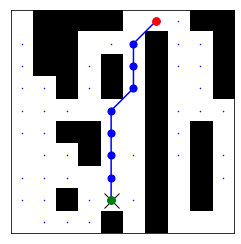

943
Prediction time:  0.07140684499995587
Reconstruction time:  0.0005868929999905959
ground truth path
predicted path


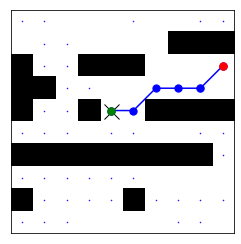

944
Prediction time:  0.07072877200005223
Reconstruction time:  0.0004412720000459558
ground truth path
predicted path


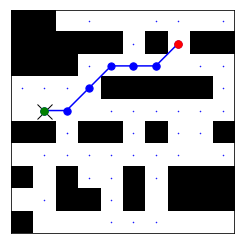

945
Prediction time:  0.0720106020000344
Reconstruction time:  0.0006176470000127665
ground truth path
predicted path


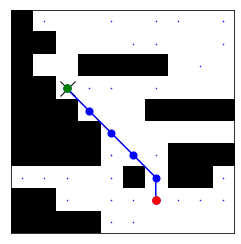

946
Prediction time:  0.0694445450000103
Reconstruction time:  0.0008401819999903637
ground truth path
predicted path


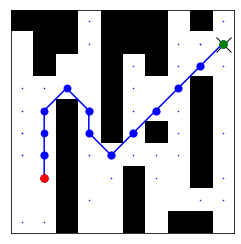

947
Prediction time:  0.0705047079999872
Reconstruction time:  0.0006832729999928233
ground truth path
predicted path


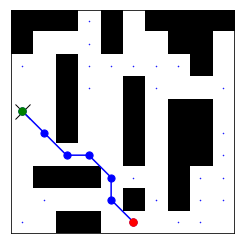

948
Prediction time:  0.07145305799997459
Reconstruction time:  0.0007036789999688153
ground truth path
predicted path


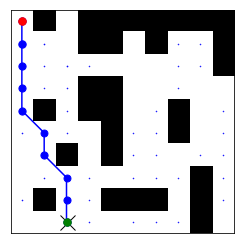

949
Prediction time:  0.06935125399996878
Reconstruction time:  0.0008874549999973169
ground truth path
predicted path


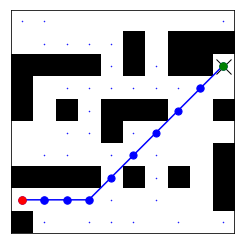

950
Prediction time:  0.07021249500002114
Reconstruction time:  0.0011651300000039555
ground truth path
predicted path


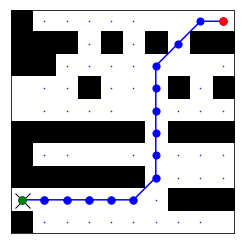

951
Prediction time:  0.07250274700004411
Reconstruction time:  0.0007272129999478238
ground truth path
predicted path


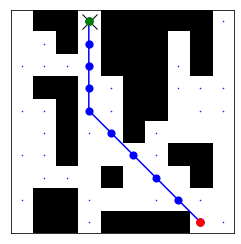

952
Prediction time:  0.07167633299997078
Reconstruction time:  0.000733027000023867
ground truth path
predicted path


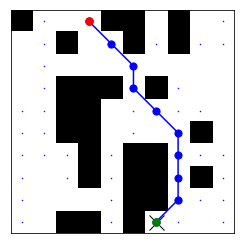

953
Prediction time:  0.37759256300000743
Reconstruction time:  0.0007842960000061794
ground truth path
predicted path


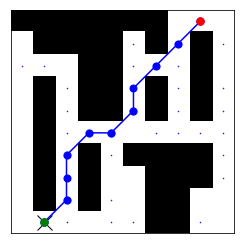

954
Prediction time:  0.07187572799995223
Reconstruction time:  0.0005791700000372657
ground truth path
predicted path


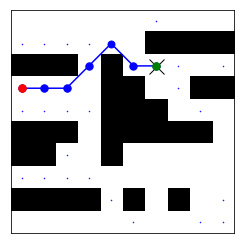

955
Prediction time:  0.07200443599998607
Reconstruction time:  0.0008808129999806624
ground truth path
predicted path


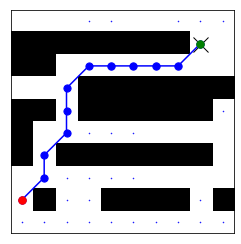

956
Prediction time:  0.07275132600000234
Reconstruction time:  0.0008784900000478046
ground truth path
predicted path


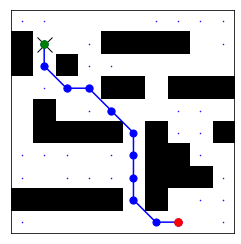

957
Prediction time:  0.07100417399999515
Reconstruction time:  0.0007549659999881442
ground truth path
predicted path


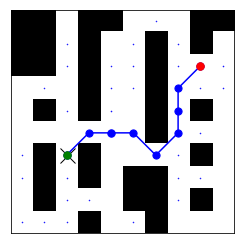

958
Prediction time:  0.07170805500004462
Reconstruction time:  0.0009312429999681626
ground truth path
predicted path


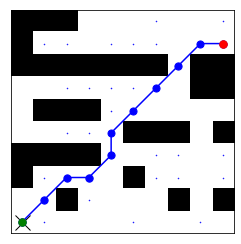

959
Prediction time:  0.0711926430000176
Reconstruction time:  0.0008299840000063341
ground truth path
predicted path


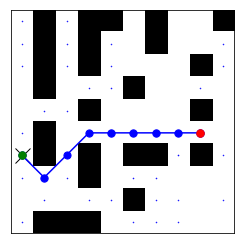

960
Prediction time:  0.0738844709999853
Reconstruction time:  0.0009356249999541433
ground truth path
predicted path


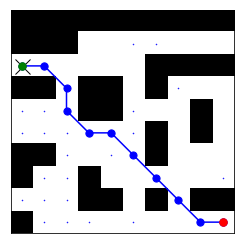

961
Prediction time:  0.07097022700003208
Reconstruction time:  0.002320972999996229
ground truth path
predicted path


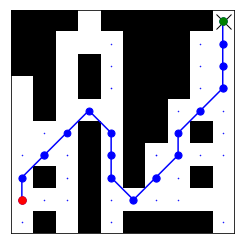

962
Prediction time:  0.0706747980000273
Reconstruction time:  0.0019271549999757553
ground truth path
predicted path


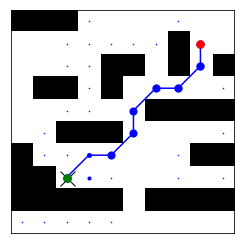

963
Prediction time:  0.07552445700002863
Reconstruction time:  0.0021025099999860686
ground truth path
predicted path


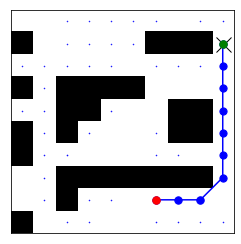

964
Prediction time:  0.06933349000001954
Reconstruction time:  0.0006786199999737619
ground truth path
predicted path


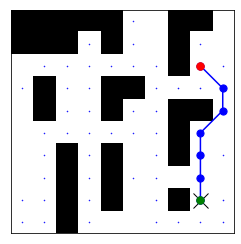

965
Prediction time:  0.06864068199996609
Reconstruction time:  0.0005885859999921195
ground truth path
predicted path


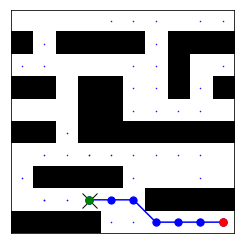

966
Prediction time:  0.06661282600003915
Reconstruction time:  0.0006322730000078991
ground truth path
predicted path


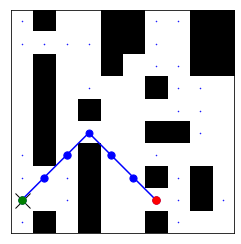

967
Prediction time:  0.06648088000002872
Reconstruction time:  0.0010007370000266747
ground truth path
predicted path


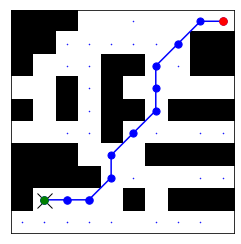

968
Prediction time:  0.06544324899999765
Reconstruction time:  0.0007407420000049569
ground truth path
predicted path


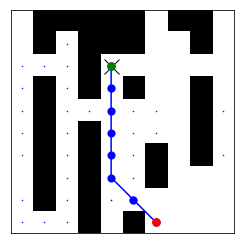

969
Prediction time:  0.06770958999999266
Reconstruction time:  0.000797522000027584
ground truth path
predicted path


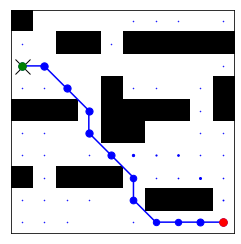

970
Prediction time:  0.3730710239999553
Reconstruction time:  0.0007694749999700434
ground truth path
predicted path


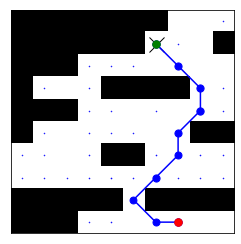

971
Prediction time:  0.06978910899999846
Reconstruction time:  0.0007920080000189955
ground truth path
predicted path


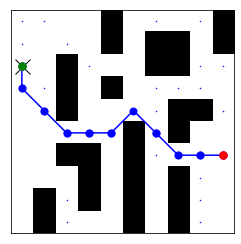

972
Prediction time:  0.06858497699994359
Reconstruction time:  0.0007581940000136456
ground truth path
predicted path


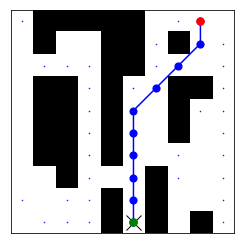

973
Prediction time:  0.06999893700003668
Reconstruction time:  0.0006380030000059378
ground truth path
predicted path


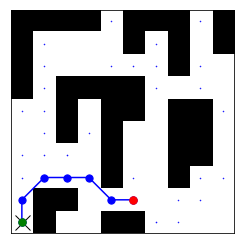

974
Prediction time:  0.06723767799996949
Reconstruction time:  0.0007234509999989314
ground truth path
predicted path


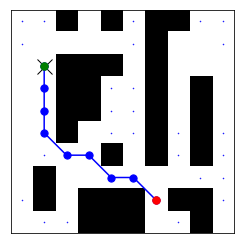

975
Prediction time:  0.07853171400000747
Reconstruction time:  0.0008018749999791908
ground truth path
predicted path


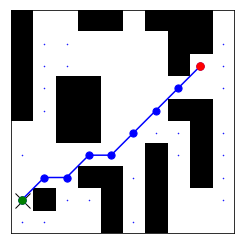

976
Prediction time:  0.06929329199999756
Reconstruction time:  0.0007524260000195682
ground truth path
predicted path


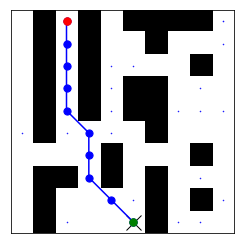

977
Prediction time:  0.0711011970000186
Reconstruction time:  0.0007938950000152545
ground truth path
predicted path


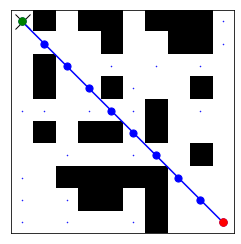

978
Prediction time:  0.07134607799997639
Reconstruction time:  0.0007179749999863816
ground truth path
predicted path


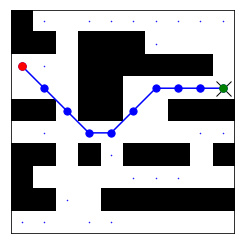

979
Prediction time:  0.06936863600003562
Reconstruction time:  0.0008836619999783579
ground truth path
predicted path


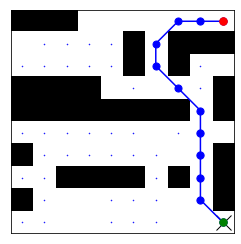

980
Prediction time:  0.06806490200000326
Reconstruction time:  0.0005332160000079966
ground truth path
predicted path


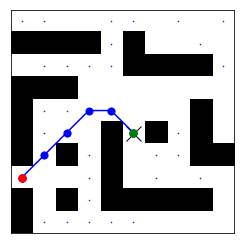

981
Prediction time:  0.07076877800000148
Reconstruction time:  0.0007682749999844418
ground truth path
predicted path


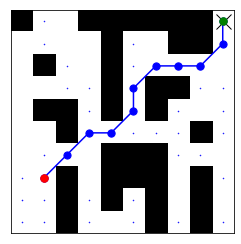

982
Prediction time:  0.0683155760000318
Reconstruction time:  0.000774876999969365
ground truth path
predicted path


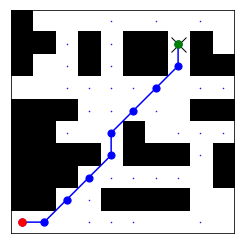

983
Prediction time:  0.06837167599996974
Reconstruction time:  0.0009291869999970004
ground truth path
predicted path


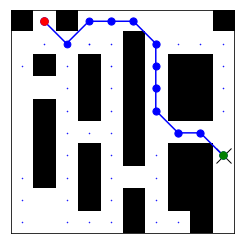

984
Prediction time:  0.06969592899997679
Reconstruction time:  0.0007267330000217953
ground truth path
predicted path


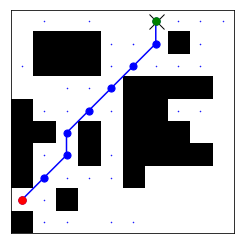

985
Prediction time:  0.06702788299998019
Reconstruction time:  0.002073697000014363
ground truth path
predicted path


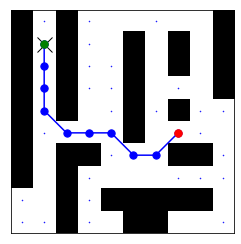

986
Prediction time:  0.07029767800003128
Reconstruction time:  0.0006658749999814972
ground truth path
predicted path


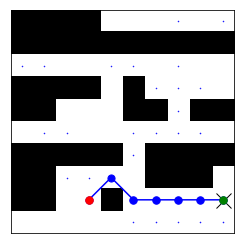

987
Prediction time:  0.07115486300000384
Reconstruction time:  0.0009143280000216691
ground truth path
predicted path


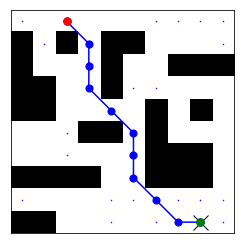

988
Prediction time:  0.3749559569999974
Reconstruction time:  0.000739146000000801
ground truth path
predicted path


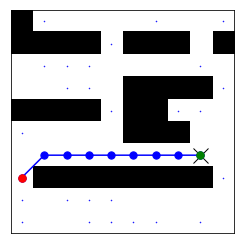

989
Prediction time:  0.07324679399999923
Reconstruction time:  0.0007210340000369797
ground truth path
predicted path


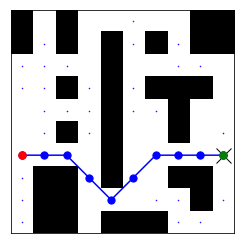

990
Prediction time:  0.07339340400000083
Reconstruction time:  0.0007356660000255033
ground truth path
predicted path


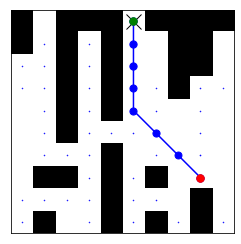

991
Prediction time:  0.07091412599999103
Reconstruction time:  0.0007047810000244681
ground truth path
predicted path


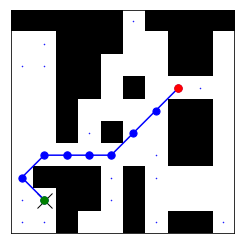

992
Prediction time:  0.07244267400000126
Reconstruction time:  0.0007281560000365062
ground truth path
predicted path


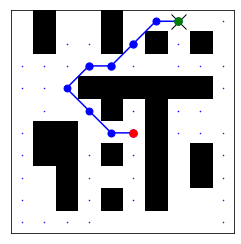

993
Prediction time:  0.06710795299994743
Reconstruction time:  0.0009210839999695963
ground truth path
predicted path


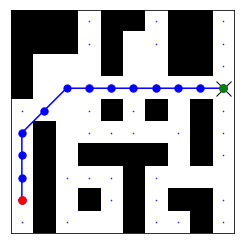

994
Prediction time:  0.07287915299997394
Reconstruction time:  0.000950503000012759
ground truth path
predicted path


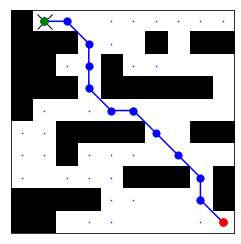

995
Prediction time:  0.07041098199999851
Reconstruction time:  0.001882511000019349
ground truth path
predicted path


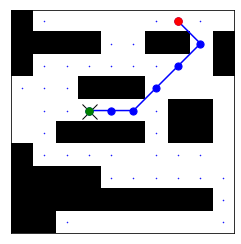

996
Prediction time:  0.07409338599995863
Reconstruction time:  0.0015687520000255972
ground truth path
predicted path


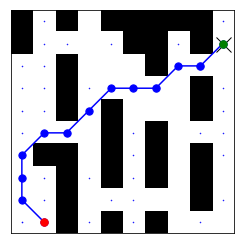

997
Prediction time:  0.06906069799998704
Reconstruction time:  0.0007689090000440046
ground truth path
predicted path


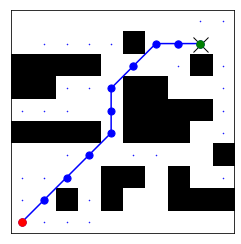

998
Prediction time:  0.08288515699996424
Reconstruction time:  0.0010295350000433245
ground truth path
predicted path


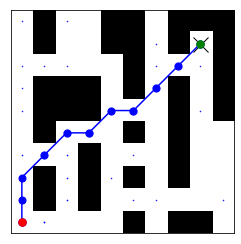

999
Prediction time:  0.07323372799999106
Reconstruction time:  0.0006410880000089492
ground truth path
predicted path


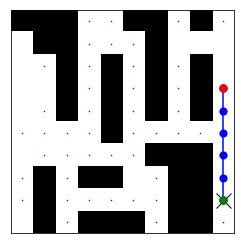

1000
Prediction time:  0.07411868299999469
Reconstruction time:  0.0007879219999722409
ground truth path
predicted path


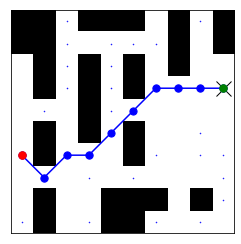

1001
Prediction time:  0.06806322099998852
Reconstruction time:  0.00226607399997647
ground truth path
predicted path


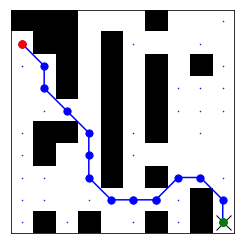

1002
Prediction time:  0.06970692999999528
Reconstruction time:  0.000820027999964168
ground truth path
predicted path


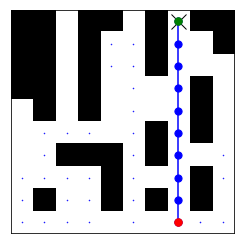

1003
Prediction time:  0.06932020000004968
Reconstruction time:  0.0006615799999849514
ground truth path
predicted path


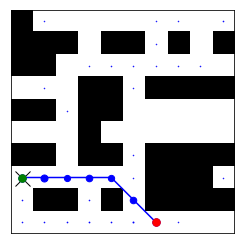

1004
Prediction time:  0.07107143899997936
Reconstruction time:  0.0009495059999835576
ground truth path
predicted path


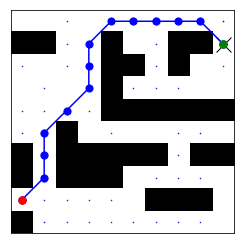

1005
Prediction time:  0.07061436099996854
Reconstruction time:  0.0009114100000147118
ground truth path
predicted path


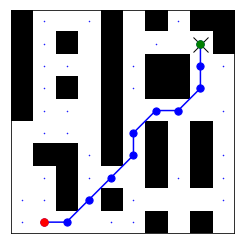

1006
Prediction time:  0.3583773240000028
Reconstruction time:  0.0010840990000247075
ground truth path
predicted path


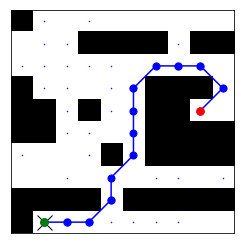

1007
Prediction time:  0.06892849199999773
Reconstruction time:  0.0006513739999718382
ground truth path
predicted path


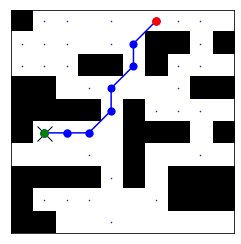

1008
Prediction time:  0.06798945699995329
Reconstruction time:  0.000843895999992128
ground truth path
predicted path


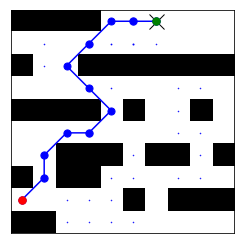

1009
Prediction time:  0.07323824600001672
Reconstruction time:  0.001194336999958523
ground truth path
predicted path


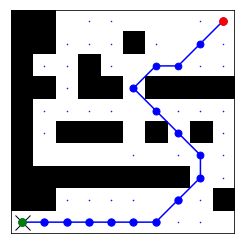

1010
Prediction time:  0.07057512399995858
Reconstruction time:  0.0010375690000046234
ground truth path
predicted path


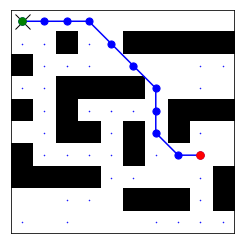

1011
Prediction time:  0.07334762599998612
Reconstruction time:  0.0007377360000191402
ground truth path
predicted path


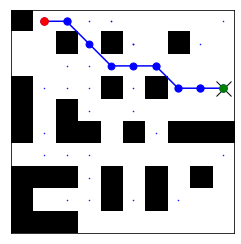

1012
Prediction time:  0.0683492059999935
Reconstruction time:  0.0006697540000004665
ground truth path
predicted path


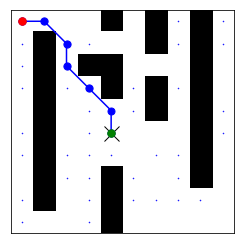

1013
Prediction time:  0.06758616000001894
Reconstruction time:  0.0008928409999953146
ground truth path
predicted path


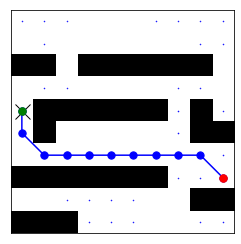

1014
Prediction time:  0.06905552099999568
Reconstruction time:  0.000759700999992674
ground truth path
predicted path


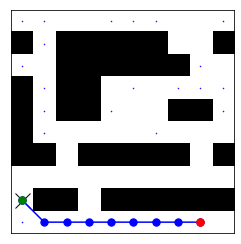

1015
Prediction time:  0.0744055100000196
Reconstruction time:  0.0006777980000265416
ground truth path
predicted path


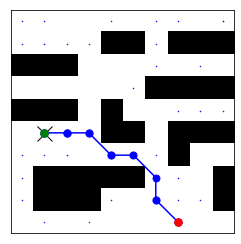

1016
Prediction time:  0.0699566490000052
Reconstruction time:  0.0005853590000128861
ground truth path
predicted path


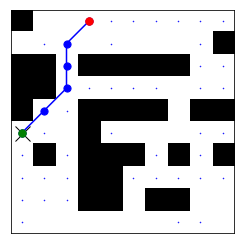

1017
Prediction time:  0.06814135199999782
Reconstruction time:  0.0009650490000012724
ground truth path
predicted path


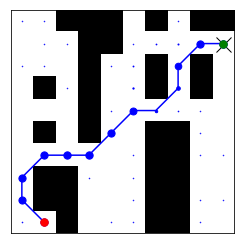

1018
Prediction time:  0.06922416800000519
Reconstruction time:  0.0008921419999978752
ground truth path
predicted path


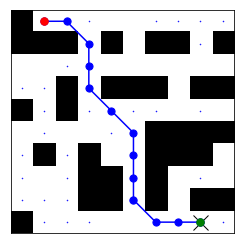

1019
Prediction time:  0.07109513099999276
Reconstruction time:  0.001137522999954399
ground truth path
predicted path


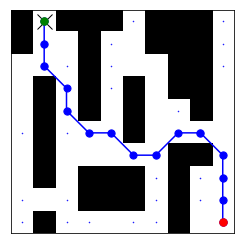

1020
Prediction time:  0.07250733300003276
Reconstruction time:  0.001906067999982497
ground truth path
predicted path


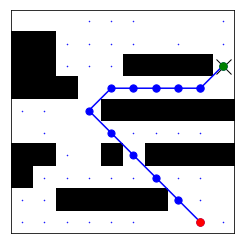

1021
Prediction time:  0.07419868700003462
Reconstruction time:  0.0005249030000413768
ground truth path
predicted path


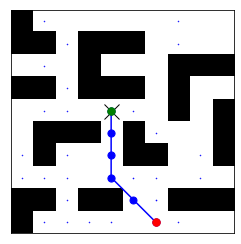

1022
Prediction time:  0.0715965030000234
Reconstruction time:  0.001926280000020597
ground truth path
predicted path


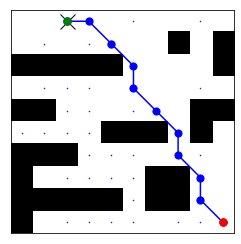

1023
Prediction time:  0.5033755590000055
Reconstruction time:  0.0011147360000336448
ground truth path
predicted path


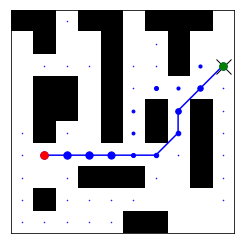

1024
Prediction time:  0.0736406850000435
Reconstruction time:  0.0024110830000267924
ground truth path
predicted path


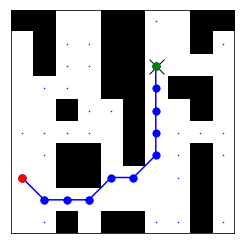

1025
Prediction time:  0.07244527199998174
Reconstruction time:  0.0008054299999571413
ground truth path
predicted path


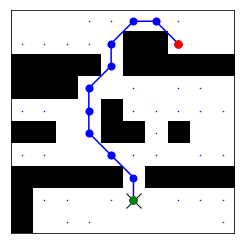

1026
Prediction time:  0.07154094800000621
Reconstruction time:  0.0009357729999805997
ground truth path
predicted path


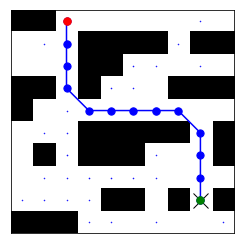

1027
Prediction time:  0.06983252999998513
Reconstruction time:  0.0010472479999634743
ground truth path
predicted path


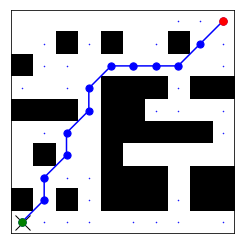

1028
Prediction time:  0.07244172700001172
Reconstruction time:  0.0021452299999964453
ground truth path
predicted path


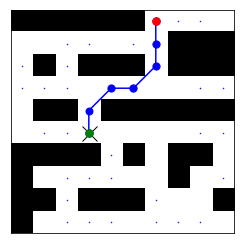

1029
Prediction time:  0.07407524499996043
Reconstruction time:  0.0006546630000343612
ground truth path
predicted path


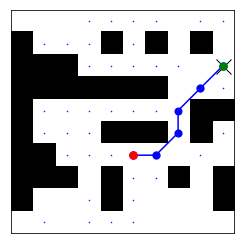

1030
Prediction time:  0.07168242000000191
Reconstruction time:  0.0007030289999647721
ground truth path
predicted path


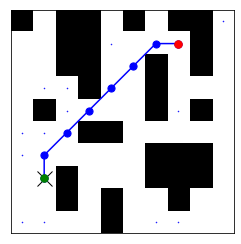

1031
Prediction time:  0.07505892799997582
Reconstruction time:  0.0007721900000206006
ground truth path
predicted path


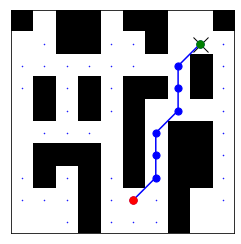

1032
Prediction time:  0.07213628400000971
Reconstruction time:  0.000943683000002693
ground truth path
predicted path


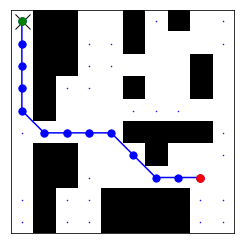

1033
Prediction time:  0.07333779600003254
Reconstruction time:  0.0010083760000156872
ground truth path
predicted path


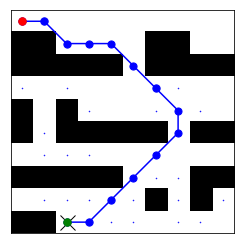

1034
Prediction time:  0.07443057800003317
Reconstruction time:  0.0006828930000324362
ground truth path
predicted path


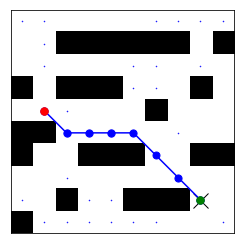

1035
Prediction time:  0.0712782350000225
Reconstruction time:  0.0012070089999838274
ground truth path
predicted path


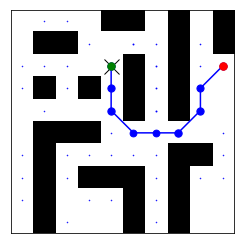

1036
Prediction time:  0.07495899999997846
Reconstruction time:  0.0007391729999994823
ground truth path
predicted path


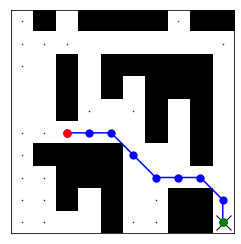

1037
Prediction time:  0.07802684099999624
Reconstruction time:  0.0008081089999905089
ground truth path
predicted path


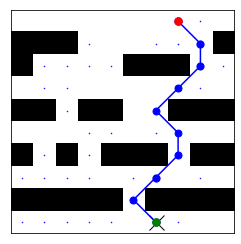

1038
Prediction time:  0.07200023699999747
Reconstruction time:  0.0007188729999825227
ground truth path
predicted path


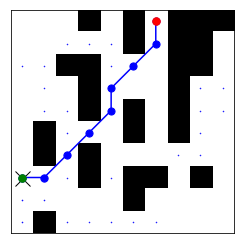

1039
Prediction time:  0.07181913299996268
Reconstruction time:  0.0010462080000479546
ground truth path
predicted path


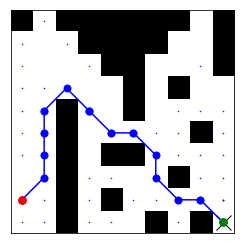

1040
Prediction time:  0.07082545700001219
Reconstruction time:  0.0008843300000194176
ground truth path
predicted path


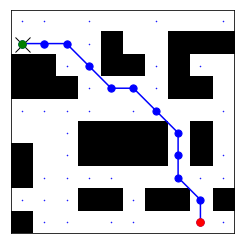

1041
Prediction time:  0.3818329140000287
Reconstruction time:  0.0006657200000290686
ground truth path
predicted path


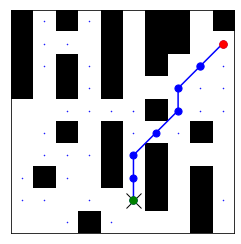

1042
Prediction time:  0.07090125300004502
Reconstruction time:  0.0007119809999949211
ground truth path
predicted path


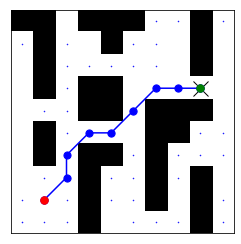

1043
Prediction time:  0.07212614600001643
Reconstruction time:  0.0008985090000237506
ground truth path
predicted path


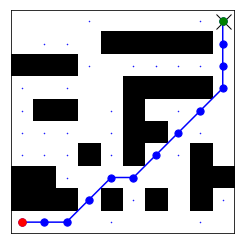

1044
Prediction time:  0.07183410700002923
Reconstruction time:  0.0006611160000034033
ground truth path
predicted path


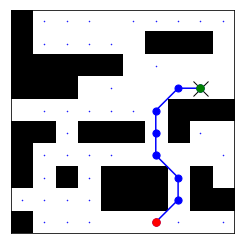

1045
Prediction time:  0.07331521899999416
Reconstruction time:  0.0007750880000116922
ground truth path
predicted path


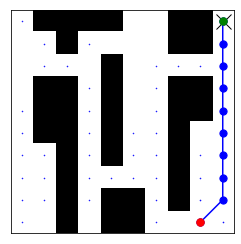

1046
Prediction time:  0.06930183600002238
Reconstruction time:  0.0007832250000205931
ground truth path
predicted path


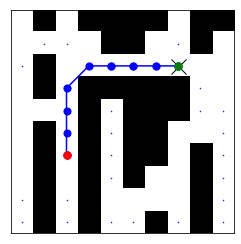

1047
Prediction time:  0.07613898800002517
Reconstruction time:  0.0006093430000078115
ground truth path
predicted path


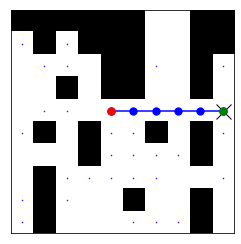

1048
Prediction time:  0.07292445500002032
Reconstruction time:  0.0005050660000165408
ground truth path
predicted path


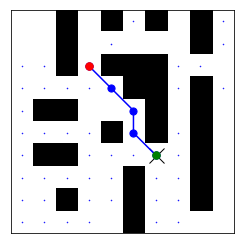

1049
Prediction time:  0.07162426600001481
Reconstruction time:  0.0008789689999844086
ground truth path
predicted path


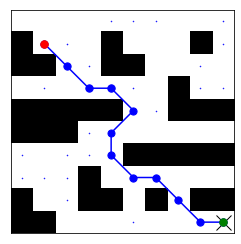

1050
Prediction time:  0.06975376399998368
Reconstruction time:  0.00061241800000289
ground truth path
predicted path


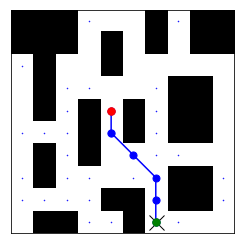

1051
Prediction time:  0.07065179200003513
Reconstruction time:  0.0007360760000096889
ground truth path
predicted path


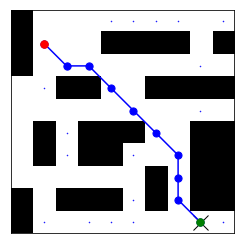

1052
Prediction time:  0.06964123800003108
Reconstruction time:  0.0008617359999902874
ground truth path
predicted path


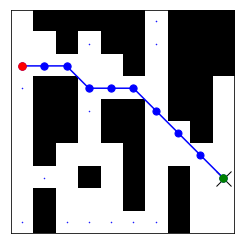

1053
Prediction time:  0.07434146499997496
Reconstruction time:  0.0008244560000321144
ground truth path
predicted path


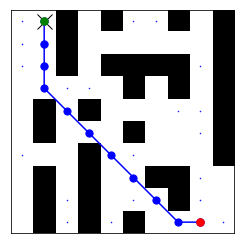

1054
Prediction time:  0.07201601200000596
Reconstruction time:  0.0006619089999730932
ground truth path
predicted path


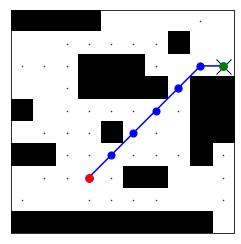

1055
Prediction time:  0.07298785999995516
Reconstruction time:  0.0007638749999614447
ground truth path
predicted path


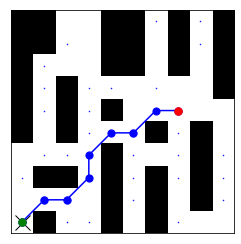

1056
Prediction time:  0.07532223300000851
Reconstruction time:  0.0009097119999523784
ground truth path
predicted path


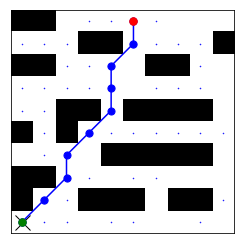

1057
Prediction time:  0.08052713000000722
Reconstruction time:  0.000764602999993258
ground truth path
predicted path


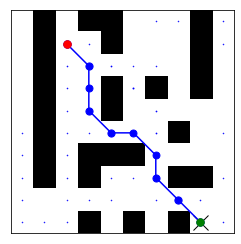

1058
Prediction time:  0.07066669900001443
Reconstruction time:  0.0006347970000319947
ground truth path
predicted path


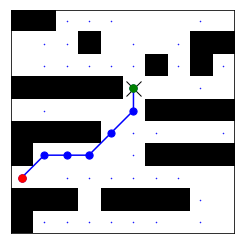

1059
Prediction time:  0.3848019419999673
Reconstruction time:  0.000976691000005303
ground truth path
predicted path


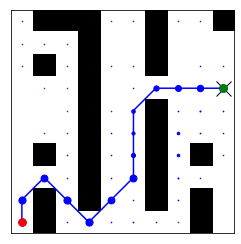

1060
Prediction time:  0.07377914500000315
Reconstruction time:  0.0008755609999866465
ground truth path
predicted path


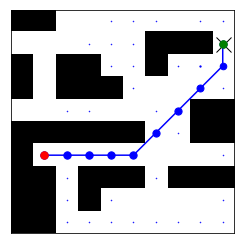

1061
Prediction time:  0.07259078800001362
Reconstruction time:  0.0012658929999815882
ground truth path
predicted path


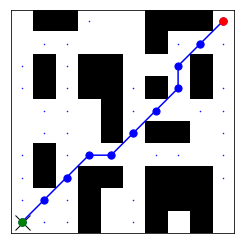

1062
Prediction time:  0.0703927700000122
Reconstruction time:  0.0007075409999970361
ground truth path
predicted path


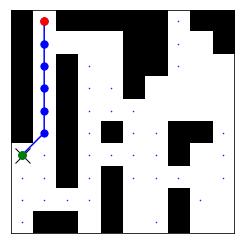

1063
Prediction time:  0.071201230999975
Reconstruction time:  0.0008532089999562231
ground truth path
predicted path


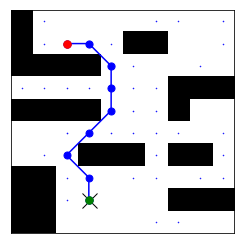

1064
Prediction time:  0.07003309499998522
Reconstruction time:  0.0007812989999820275
ground truth path
predicted path


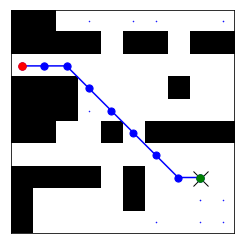

1065
Prediction time:  0.07494553800000858
Reconstruction time:  0.0009724739999796839
ground truth path
predicted path


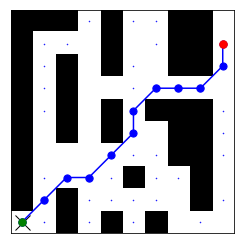

1066
Prediction time:  0.07489020100001653
Reconstruction time:  0.0006590999999502856
ground truth path
predicted path


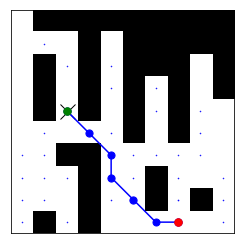

1067
Prediction time:  0.0731812120000086
Reconstruction time:  0.0008991180000066379
ground truth path
predicted path


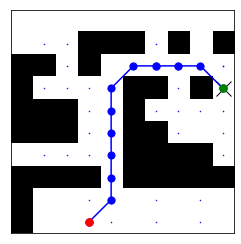

1068
Prediction time:  0.0712989749999906
Reconstruction time:  0.0009442740000054073
ground truth path
predicted path


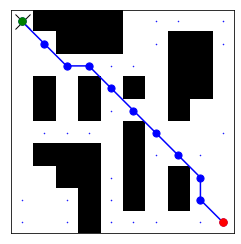

1069
Prediction time:  0.07068723599996929
Reconstruction time:  0.000991587999976673
ground truth path
predicted path


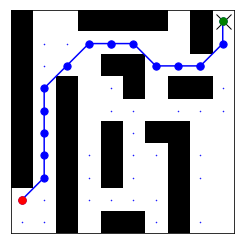

1070
Prediction time:  0.07513052500002004
Reconstruction time:  0.0006210060000171325
ground truth path
predicted path


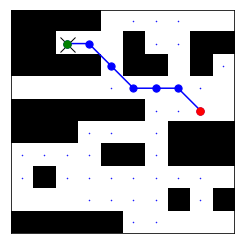

1071
Prediction time:  0.06988173199999892
Reconstruction time:  0.0007274410000377429
ground truth path
predicted path


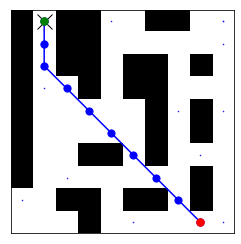

1072
Prediction time:  0.06877974099995754
Reconstruction time:  0.001322188000017377
ground truth path
predicted path


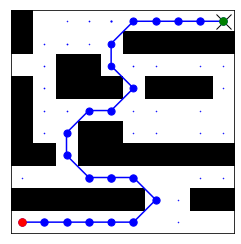

1073
Prediction time:  0.0745136809999849
Reconstruction time:  0.0008905100000333732
ground truth path
predicted path


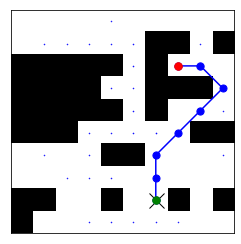

1074
Prediction time:  0.06818907399997443
Reconstruction time:  0.000656358000014734
ground truth path
predicted path


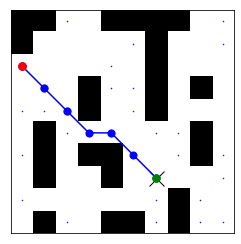

1075
Prediction time:  0.06968051900003047
Reconstruction time:  0.0009139280000454164
ground truth path
predicted path


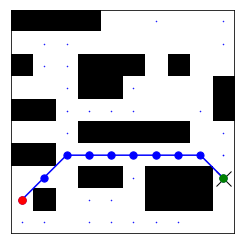

1076
Prediction time:  0.0703346500000066
Reconstruction time:  0.0008173209999995379
ground truth path
predicted path


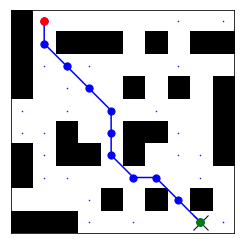

1077
Prediction time:  0.37833558799997036
Reconstruction time:  0.0007476409999753741
ground truth path
predicted path


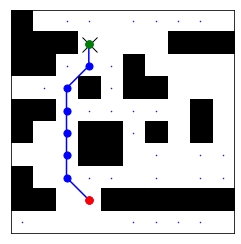

1078
Prediction time:  0.07284010099999705
Reconstruction time:  0.000586312999985239
ground truth path
predicted path


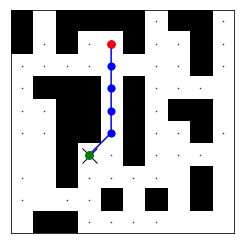

1079
Prediction time:  0.0795132659999922
Reconstruction time:  0.0011048700000060308
ground truth path
predicted path


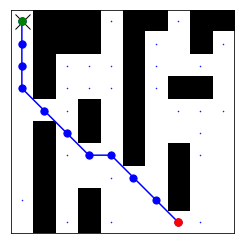

1080
Prediction time:  0.07189295599999923
Reconstruction time:  0.0006340410000120755
ground truth path
predicted path


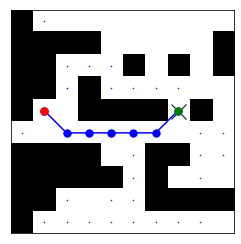

1081
Prediction time:  0.07090168600001334
Reconstruction time:  0.0009466749999660351
ground truth path
predicted path


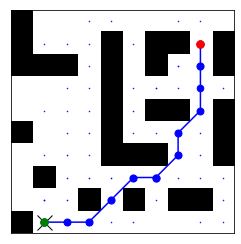

1082
Prediction time:  0.07015287500001932
Reconstruction time:  0.0006861489999892001
ground truth path
predicted path


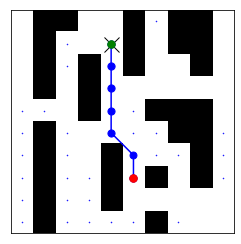

1083
Prediction time:  0.0712377790000005
Reconstruction time:  0.000891908000028252
ground truth path
predicted path


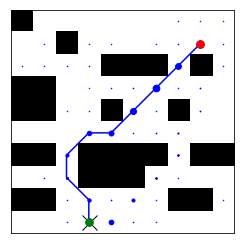

1084
Prediction time:  0.07038777100001425
Reconstruction time:  0.0009551219999934801
ground truth path
predicted path


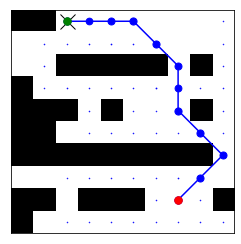

1085
Prediction time:  0.06946144500000173
Reconstruction time:  0.0005593639999688094
ground truth path
predicted path


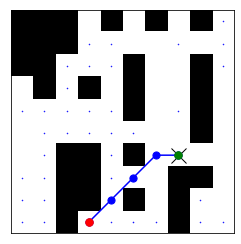

1086
Prediction time:  0.07123839600001247
Reconstruction time:  0.0008184719999917434
ground truth path
predicted path


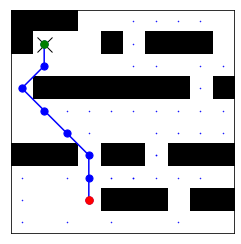

1087
Prediction time:  0.07354881200001273
Reconstruction time:  0.0011526270000103978
ground truth path
predicted path


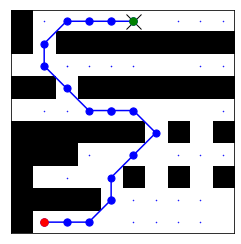

1088
Prediction time:  0.07135718300003191
Reconstruction time:  0.0007693510000308379
ground truth path
predicted path


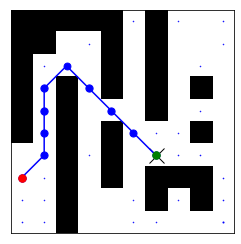

1089
Prediction time:  0.07562044299999116
Reconstruction time:  0.0007645339999839962
ground truth path
predicted path


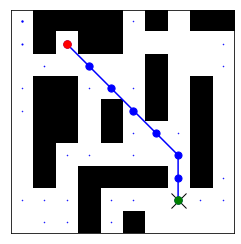

1090
Prediction time:  0.07226478600000519
Reconstruction time:  0.0007994350000330996
ground truth path
predicted path


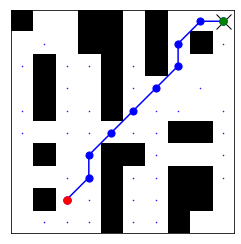

1091
Prediction time:  0.07074823499999638
Reconstruction time:  0.000912243000016133
ground truth path
predicted path


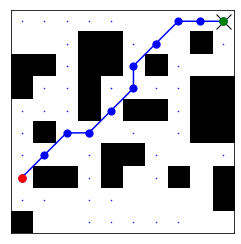

1092
Prediction time:  0.07133754399995951
Reconstruction time:  0.0008432089999814707
ground truth path
predicted path


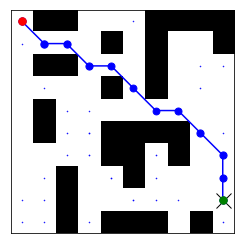

1093
Prediction time:  0.0717340670000226
Reconstruction time:  0.001131967999981498
ground truth path
predicted path


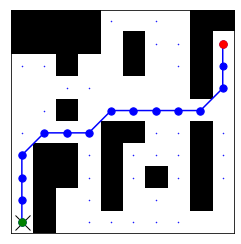

1094
Prediction time:  0.3901650980000113
Reconstruction time:  0.000969011000051978
ground truth path
predicted path


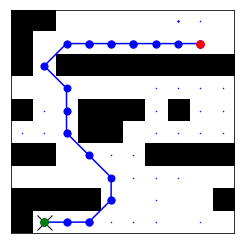

1095
Prediction time:  0.07181624600002579
Reconstruction time:  0.0008508330000154274
ground truth path
predicted path


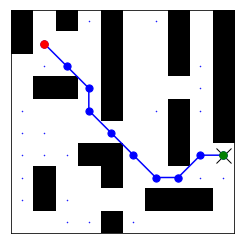

1096
Prediction time:  0.07132283400000006
Reconstruction time:  0.0008161210000139363
ground truth path
predicted path


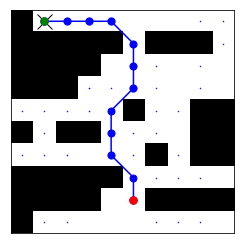

1097
Prediction time:  0.0725371080000059
Reconstruction time:  0.001243435999981557
ground truth path
predicted path


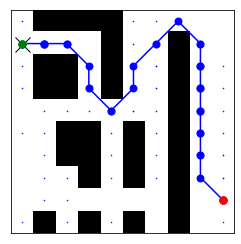

1098
Prediction time:  0.08422196099996881
Reconstruction time:  0.0014594389999729174
ground truth path
predicted path


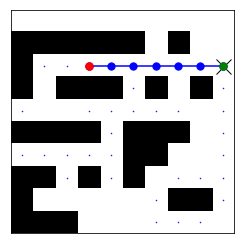

1099
Prediction time:  0.07215326500005403
Reconstruction time:  0.0009700109999926099
ground truth path
predicted path


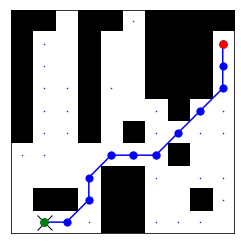

1100
Prediction time:  0.07214410300002783
Reconstruction time:  0.000646515999960684
ground truth path
predicted path


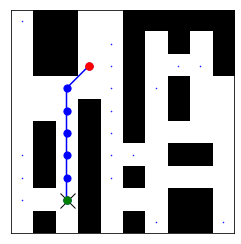

1101
Prediction time:  0.0702762690000327
Reconstruction time:  0.00063911500001268
ground truth path
predicted path


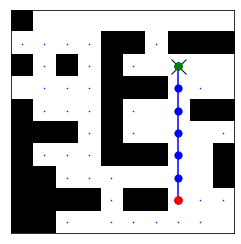

1102
Prediction time:  0.07100504300001376
Reconstruction time:  0.0022485860000074354
ground truth path
predicted path


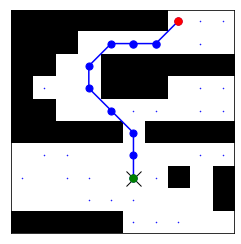

1103
Prediction time:  0.07329400200001146
Reconstruction time:  0.0008962509999719259
ground truth path
predicted path


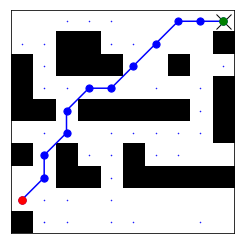

1104
Prediction time:  0.0774306670000442
Reconstruction time:  0.0009456520000412638
ground truth path
predicted path


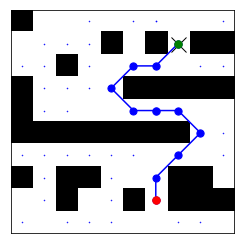

1105
Prediction time:  0.07103618100001086
Reconstruction time:  0.000609652000036931
ground truth path
predicted path


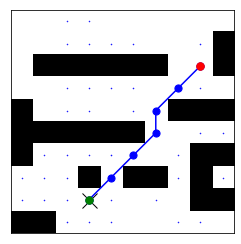

1106
Prediction time:  0.06991801200001646
Reconstruction time:  0.0006995989999722951
ground truth path
predicted path


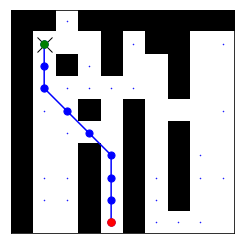

1107
Prediction time:  0.07266760099997782
Reconstruction time:  0.0006516970000234323
ground truth path
predicted path


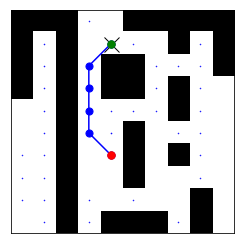

1108
Prediction time:  0.0695323999999573
Reconstruction time:  0.0007094910000091659
ground truth path
predicted path


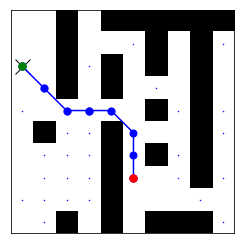

1109
Prediction time:  0.07135722599997507
Reconstruction time:  0.000779298999987077
ground truth path
predicted path


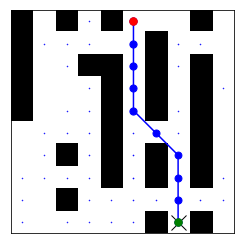

1110
Prediction time:  0.06920310700002119
Reconstruction time:  0.0010156239999901118
ground truth path
predicted path


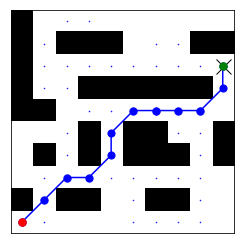

1111
Prediction time:  0.3758860460000051
Reconstruction time:  0.0006294469999943431
ground truth path
predicted path


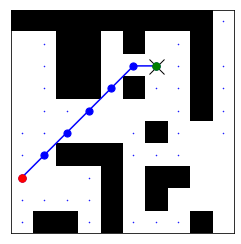

1112
Prediction time:  0.07032343400004493
Reconstruction time:  0.0006414190000327835
ground truth path
predicted path


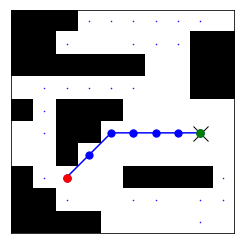

1113
Prediction time:  0.06927700099998901
Reconstruction time:  0.0007837530000074366
ground truth path
predicted path


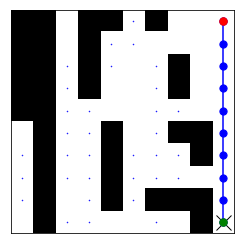

1114
Prediction time:  0.07156386600001952
Reconstruction time:  0.0008562169999777325
ground truth path
predicted path


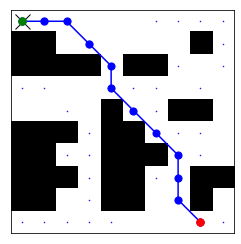

1115
Prediction time:  0.07034458399999721
Reconstruction time:  0.000632676000009269
ground truth path
predicted path


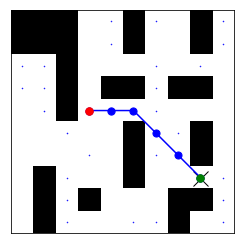

1116
Prediction time:  0.07668566899997131
Reconstruction time:  0.0007562590000134151
ground truth path
predicted path


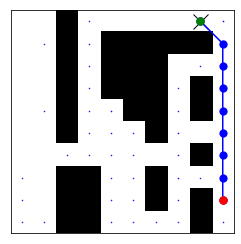

1117
Prediction time:  0.07119222099998979
Reconstruction time:  0.0007514459999811152
ground truth path
predicted path


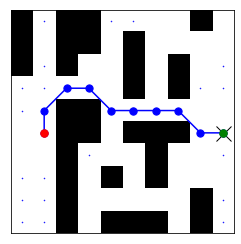

1118
Prediction time:  0.07117437799996651
Reconstruction time:  0.0007027300000004288
ground truth path
predicted path


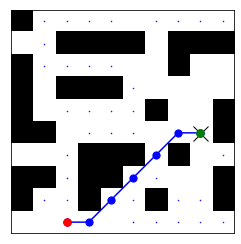

1119
Prediction time:  0.07153520499997512
Reconstruction time:  0.0007524559999865232
ground truth path
predicted path


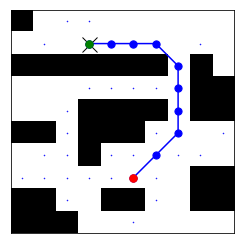

1120
Prediction time:  0.07066286499997432
Reconstruction time:  0.0008199439999998503
ground truth path
predicted path


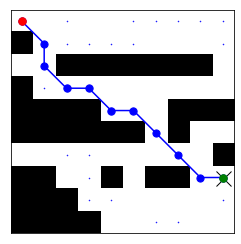

1121
Prediction time:  0.07122691000000714
Reconstruction time:  0.0006311949999826538
ground truth path
predicted path


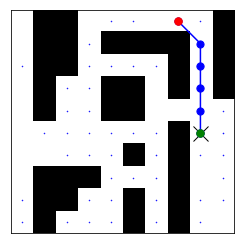

1122
Prediction time:  0.06951541100005443
Reconstruction time:  0.00096506799997087
ground truth path
predicted path


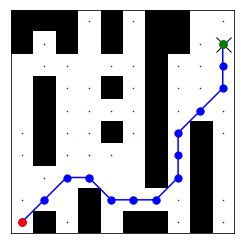

1123
Prediction time:  0.07087762800000519
Reconstruction time:  0.0006971130000010817
ground truth path
predicted path


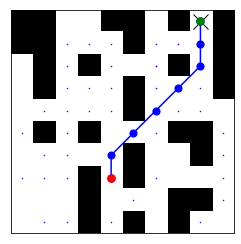

1124
Prediction time:  0.07113745499998458
Reconstruction time:  0.0016494930000021668
ground truth path
predicted path


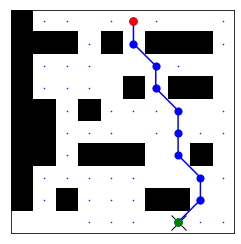

1125
Prediction time:  0.07031075099996542
Reconstruction time:  0.0008048180000059801
ground truth path
predicted path


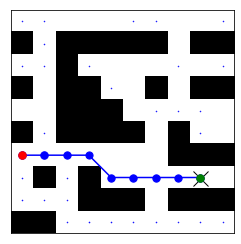

1126
Prediction time:  0.0718514589999586
Reconstruction time:  0.0007978529999945749
ground truth path
predicted path


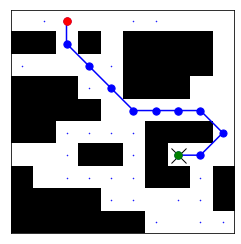

1127
Prediction time:  0.07200274000001627
Reconstruction time:  0.0008516069999586762
ground truth path
predicted path


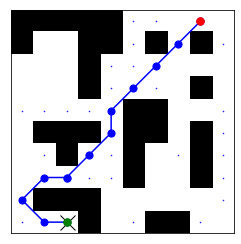

1128
Prediction time:  0.3732224500000143
Reconstruction time:  0.00234710899997026
ground truth path
predicted path


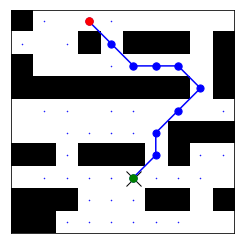

1129
Prediction time:  0.07450771200001327
Reconstruction time:  0.0012334420000001955
ground truth path
predicted path


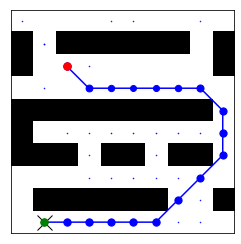

1130
Prediction time:  0.07126538699998264
Reconstruction time:  0.0006092860000421751
ground truth path
predicted path


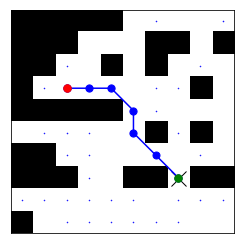

1131
Prediction time:  0.07184315099999594
Reconstruction time:  0.0009711019999940618
ground truth path
predicted path


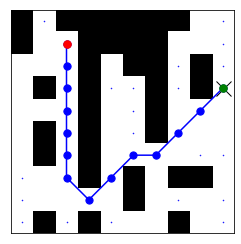

1132
Prediction time:  0.08126974300000711
Reconstruction time:  0.0010760159999563257
ground truth path
predicted path


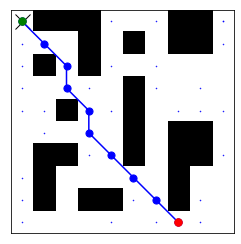

1133
Prediction time:  0.0732820719999836
Reconstruction time:  0.0006447389999948427
ground truth path
predicted path


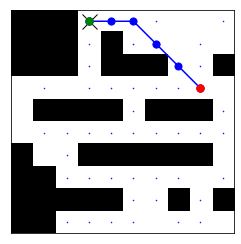

1134
Prediction time:  0.07611752499997237
Reconstruction time:  0.0009620760000075279
ground truth path
predicted path


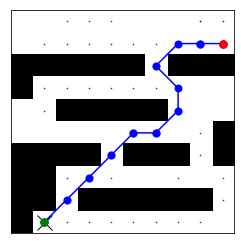

1135
Prediction time:  0.07857401299997946
Reconstruction time:  0.0006287819999784006
ground truth path
predicted path


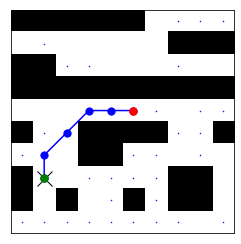

1136
Prediction time:  0.07008310999998457
Reconstruction time:  0.0007004779999988386
ground truth path
predicted path


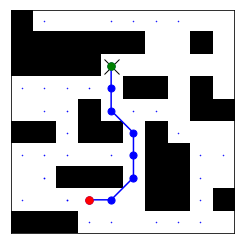

1137
Prediction time:  0.07113927099999273
Reconstruction time:  0.0009502350000047954
ground truth path
predicted path


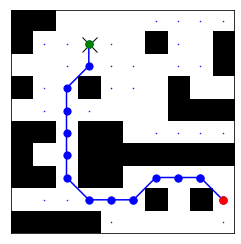

1138
Prediction time:  0.0701054299999555
Reconstruction time:  0.0010815810000508463
ground truth path
predicted path


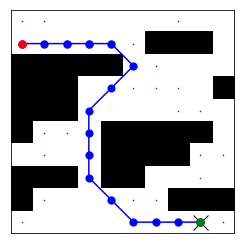

1139
Prediction time:  0.07038922899999989
Reconstruction time:  0.0007783369999856404
ground truth path
predicted path


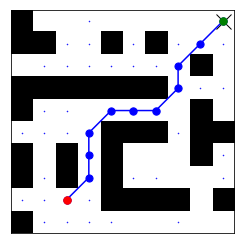

1140
Prediction time:  0.0784865709999849
Reconstruction time:  0.0007858039999746325
ground truth path
predicted path


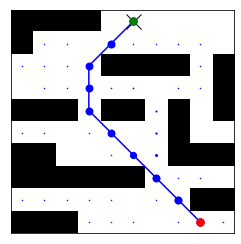

1141
Prediction time:  0.07168772900001841
Reconstruction time:  0.0008444190000318486
ground truth path
predicted path


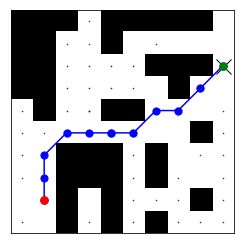

1142
Prediction time:  0.07190656199998102
Reconstruction time:  0.0007338550000213218
ground truth path
predicted path


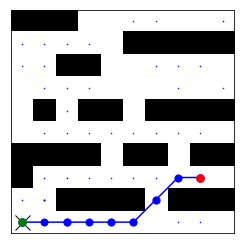

1143
Prediction time:  0.07033011800001532
Reconstruction time:  0.000879537999992408
ground truth path
predicted path


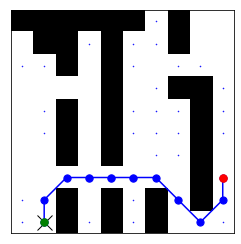

1144
Prediction time:  0.0717032389999872
Reconstruction time:  0.0006354729999884512
ground truth path
predicted path


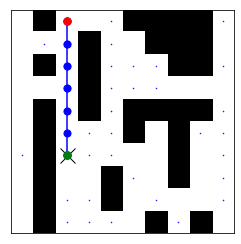

1145
Prediction time:  0.3733168489999912
Reconstruction time:  0.0009254010000177004
ground truth path
predicted path


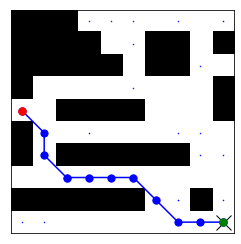

1146
Prediction time:  0.07083123299997851
Reconstruction time:  0.0007750500000156535
ground truth path
predicted path


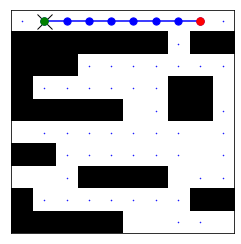

1147
Prediction time:  0.07299627700001565
Reconstruction time:  0.0020963520000236713
ground truth path
predicted path


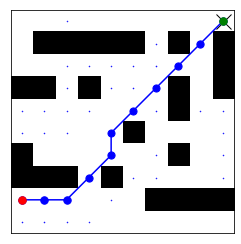

1148
Prediction time:  0.07094435200002636
Reconstruction time:  0.0009959949999824858
ground truth path
predicted path


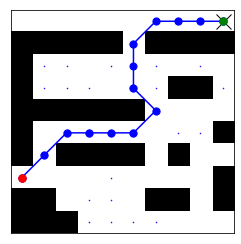

1149
Prediction time:  0.07061940400001276
Reconstruction time:  0.0009200979999945957
ground truth path
predicted path


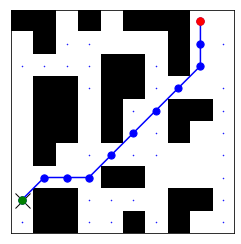

1150
Prediction time:  0.06982635399998571
Reconstruction time:  0.000485937999997077
ground truth path
predicted path


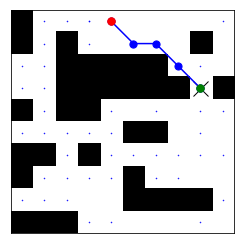

1151
Prediction time:  0.07670812899999646
Reconstruction time:  0.0006366750000097454
ground truth path
predicted path


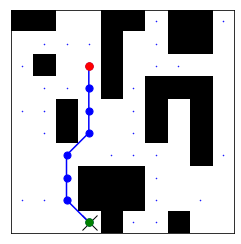

1152
Prediction time:  0.07281883600001038
Reconstruction time:  0.0006448329999670932
ground truth path
predicted path


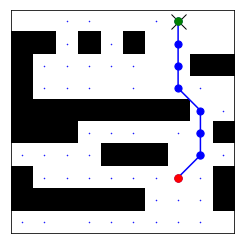

1153
Prediction time:  0.07007650299999568
Reconstruction time:  0.000822991000006823
ground truth path
predicted path


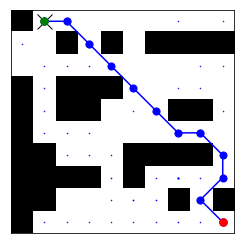

1154
Prediction time:  0.06927173299999367
Reconstruction time:  0.0007861120000143274
ground truth path
predicted path


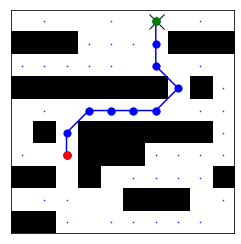

1155
Prediction time:  0.07204761200000576
Reconstruction time:  0.0005697349999991275
ground truth path
predicted path


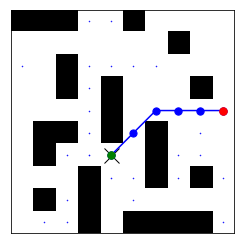

1156
Prediction time:  0.06932862200000045
Reconstruction time:  0.0006699209999965205
ground truth path
predicted path


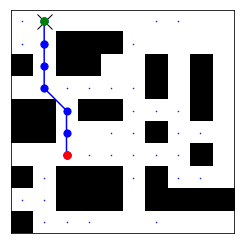

1157
Prediction time:  0.07232575099999394
Reconstruction time:  0.0006128730000227733
ground truth path
predicted path


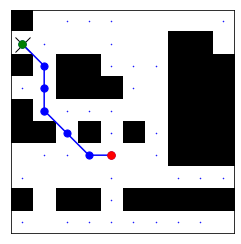

1158
Prediction time:  0.06999920600003406
Reconstruction time:  0.0005949910000140335
ground truth path
predicted path


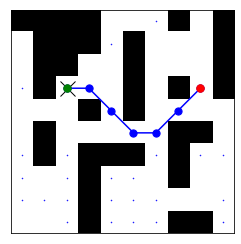

1159
Prediction time:  0.08186180299998114
Reconstruction time:  0.0007096520000118289
ground truth path
predicted path


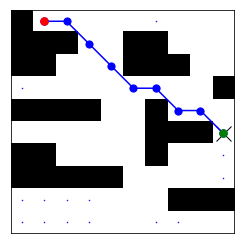

1160
Prediction time:  0.07339907800002266
Reconstruction time:  0.0006209390000435633
ground truth path
predicted path


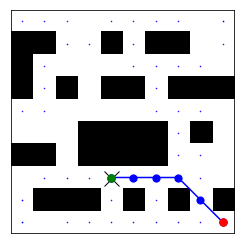

1161
Prediction time:  0.07119324299998198
Reconstruction time:  0.0006143079999674228
ground truth path
predicted path


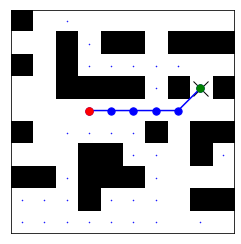

1162
Prediction time:  0.3711050459999683
Reconstruction time:  0.0007695269999885568
ground truth path
predicted path


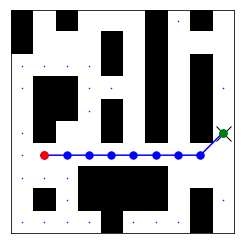

1163
Prediction time:  0.07414931100004196
Reconstruction time:  0.0009340340000107972
ground truth path
predicted path


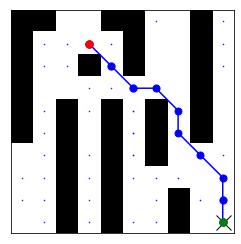

1164
Prediction time:  0.07068144900000561
Reconstruction time:  0.0007947379999677651
ground truth path
predicted path


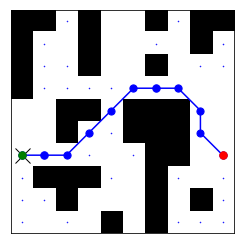

1165
Prediction time:  0.07009344000005058
Reconstruction time:  0.0020340560000136065
ground truth path
predicted path


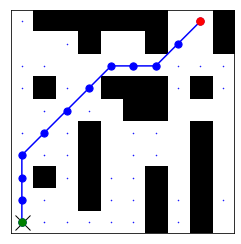

1166
Prediction time:  0.06842207400001143
Reconstruction time:  0.0008249109999951543
ground truth path
predicted path


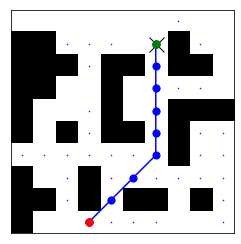

1167
Prediction time:  0.07029678499998226
Reconstruction time:  0.0008756700000276396
ground truth path
predicted path


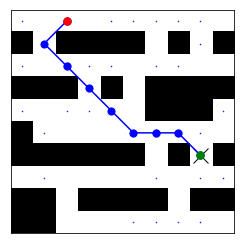

1168
Prediction time:  0.07661683400004904
Reconstruction time:  0.0020634570000197527
ground truth path
predicted path


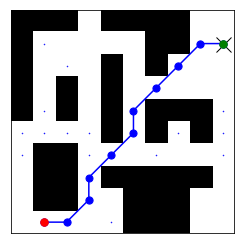

1169
Prediction time:  0.0669992910000019
Reconstruction time:  0.0029103440000426417
ground truth path
predicted path


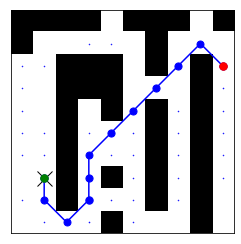

1170
Prediction time:  0.07092175200000383
Reconstruction time:  0.00092298499998833
ground truth path
predicted path


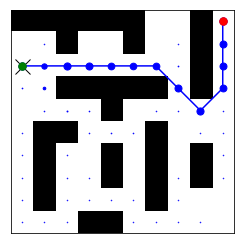

1171
Prediction time:  0.07036139699999922
Reconstruction time:  0.000646998000036092
ground truth path
predicted path


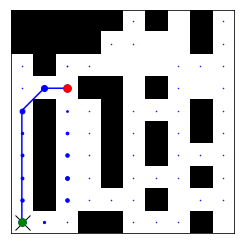

1172
Prediction time:  0.06799374600001329
Reconstruction time:  0.0008297179999772197
ground truth path
predicted path


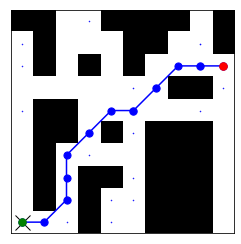

1173
Prediction time:  0.07963620800001081
Reconstruction time:  0.0006645289999482884
ground truth path
predicted path


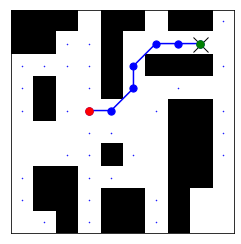

1174
Prediction time:  0.07135408400000642
Reconstruction time:  0.0007479559999978846
ground truth path
predicted path


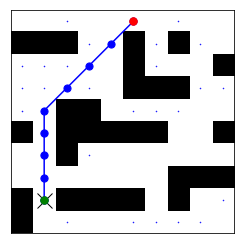

1175
Prediction time:  0.0691653960000167
Reconstruction time:  0.000956478999967203
ground truth path
predicted path


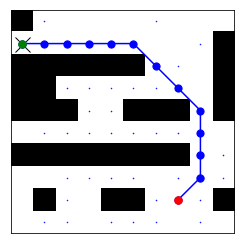

1176
Prediction time:  0.06856739900001685
Reconstruction time:  0.0008047819999887906
ground truth path
predicted path


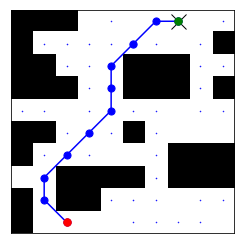

1177
Prediction time:  0.06930666599998858
Reconstruction time:  0.0008251579999978276
ground truth path
predicted path


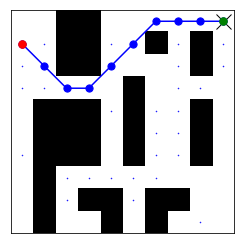

1178
Prediction time:  0.06784267299997282
Reconstruction time:  0.0008100960000092527
ground truth path
predicted path


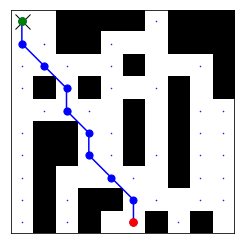

1179
Prediction time:  0.3771769900000095
Reconstruction time:  0.0006871539999906418
ground truth path
predicted path


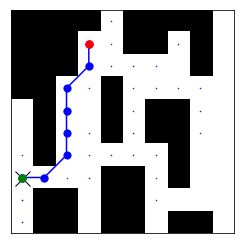

1180
Prediction time:  0.080486838000013
Reconstruction time:  0.0007369049999965682
ground truth path
predicted path


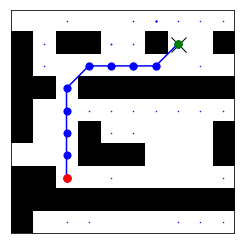

1181
Prediction time:  0.08029826299997467
Reconstruction time:  0.0007272990000046775
ground truth path
predicted path


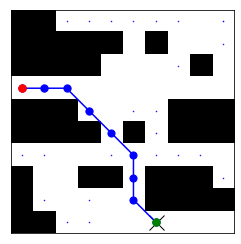

1182
Prediction time:  0.07054681099998561
Reconstruction time:  0.0008549390000212043
ground truth path
predicted path


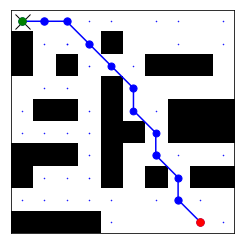

1183
Prediction time:  0.06979065000001583
Reconstruction time:  0.0007846550000181196
ground truth path
predicted path


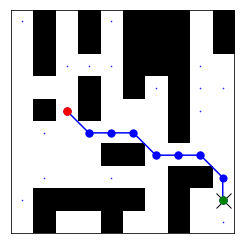

1184
Prediction time:  0.06956448900001533
Reconstruction time:  0.000721838000004027
ground truth path
predicted path


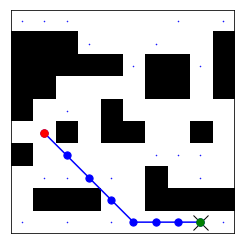

1185
Prediction time:  0.07106818099998691
Reconstruction time:  0.0010267240000416678
ground truth path
predicted path


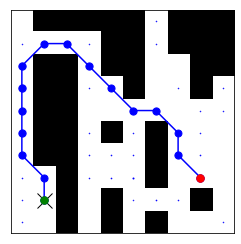

1186
Prediction time:  0.0706790550000278
Reconstruction time:  0.0007050990000152524
ground truth path
predicted path


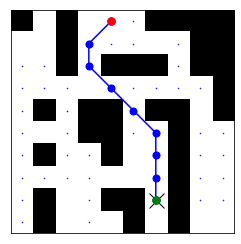

1187
Prediction time:  0.06991764599996486
Reconstruction time:  0.0009217310000053658
ground truth path
predicted path


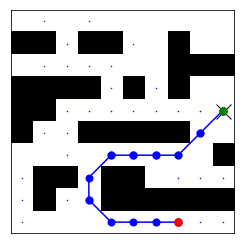

1188
Prediction time:  0.07016524100004062
Reconstruction time:  0.0009071999999719083
ground truth path
predicted path


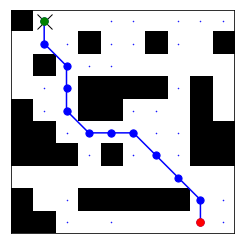

1189
Prediction time:  0.0700439579999852
Reconstruction time:  0.0005615800000100535
ground truth path
predicted path


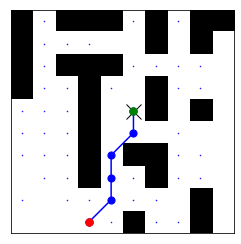

1190
Prediction time:  0.07537986800002727
Reconstruction time:  0.0010396600000035505
ground truth path
predicted path


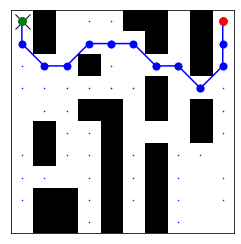

1191
Prediction time:  0.0713182260000167
Reconstruction time:  0.0006983630000263474
ground truth path
predicted path


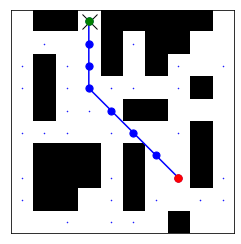

1192
Prediction time:  0.07327836199999638
Reconstruction time:  0.0017125939999687034
ground truth path
predicted path


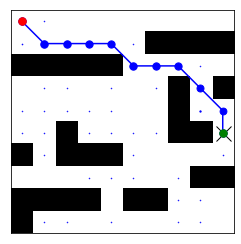

1193
Prediction time:  0.07197227000000339
Reconstruction time:  0.0009742319999759275
ground truth path
predicted path


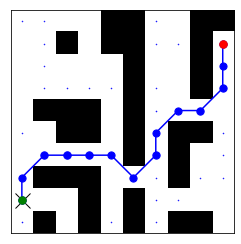

1194
Prediction time:  0.0728597589999822
Reconstruction time:  0.0007926079999833746
ground truth path
predicted path


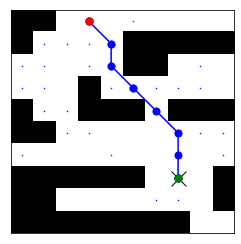

1195
Prediction time:  0.0720920669999714
Reconstruction time:  0.0006753490000050988
ground truth path
predicted path


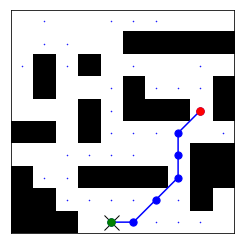

1196
Prediction time:  0.07538089199999831
Reconstruction time:  0.0019935500000087814
ground truth path
predicted path


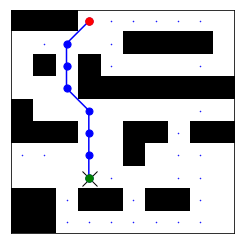

1197
Prediction time:  0.38693578099997694
Reconstruction time:  0.0006094180000104643
ground truth path
predicted path


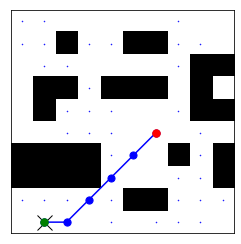

1198
Prediction time:  0.07307264400003533
Reconstruction time:  0.0009812389999979132
ground truth path
predicted path


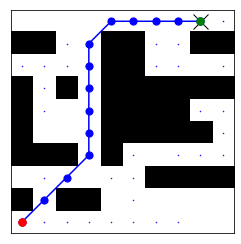

1199
Prediction time:  0.07354724900000065
Reconstruction time:  0.0006821320000085507
ground truth path
predicted path


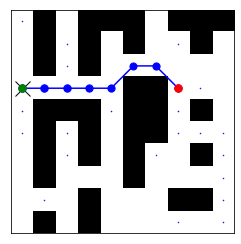

1200
Prediction time:  0.07211500200003229
Reconstruction time:  0.0006018050000307085
ground truth path
predicted path


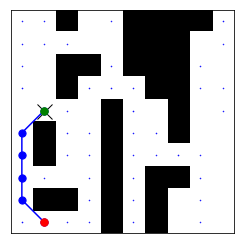

1201
Prediction time:  0.07399952899999107
Reconstruction time:  0.0007204020000131095
ground truth path
predicted path


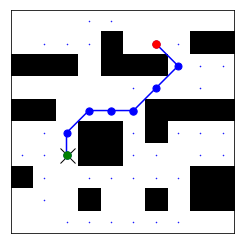

1202
Prediction time:  0.06905383700001266
Reconstruction time:  0.0007449319999750514
ground truth path
predicted path


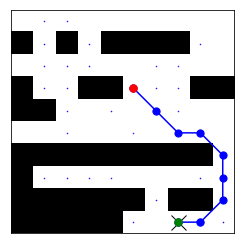

1203
Prediction time:  0.07074167199999692
Reconstruction time:  0.0007497599999624072
ground truth path
predicted path


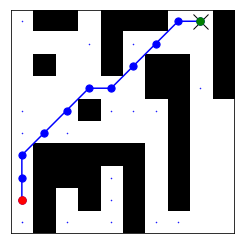

1204
Prediction time:  0.08182129099998292
Reconstruction time:  0.0008100770000396551
ground truth path
predicted path


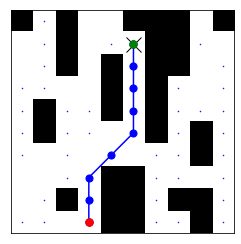

1205
Prediction time:  0.07117827199999738
Reconstruction time:  0.0008089320000408406
ground truth path
predicted path


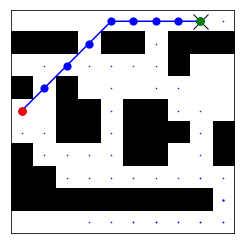

1206
Prediction time:  0.06955681099998401
Reconstruction time:  0.000830723999968086
ground truth path
predicted path


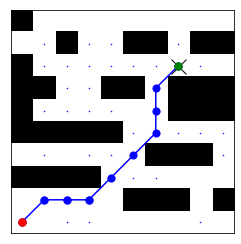

1207
Prediction time:  0.07019269899996061
Reconstruction time:  0.000803304000044136
ground truth path
predicted path


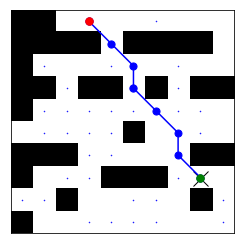

1208
Prediction time:  0.0716892560000133
Reconstruction time:  0.0008980879999853641
ground truth path
predicted path


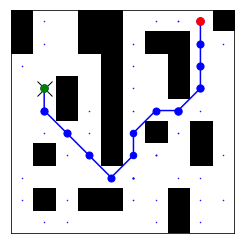

1209
Prediction time:  0.0730760779999855
Reconstruction time:  0.0007144620000190116
ground truth path
predicted path


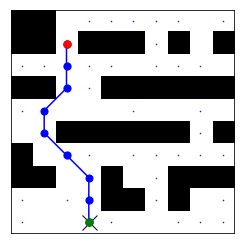

1210
Prediction time:  0.07069563400000334
Reconstruction time:  0.0007488649999913832
ground truth path
predicted path


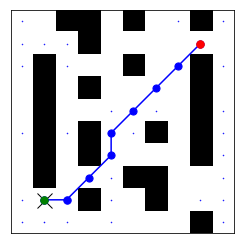

1211
Prediction time:  0.07166116700000202
Reconstruction time:  0.0011236429999712527
ground truth path
predicted path


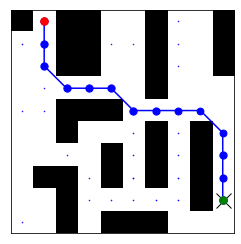

1212
Prediction time:  0.06759588800002803
Reconstruction time:  0.0008679499999857399
ground truth path
predicted path


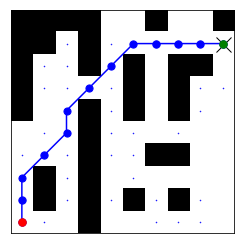

1213
Prediction time:  0.07348809499995923
Reconstruction time:  0.0006023340000069766
ground truth path
predicted path


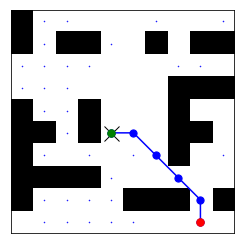

1214
Prediction time:  0.3694840360000171
Reconstruction time:  0.0008123560000399266
ground truth path
predicted path


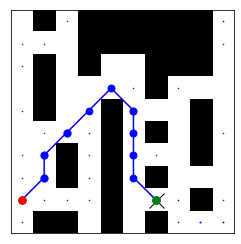

1215
Prediction time:  0.07304082600001038
Reconstruction time:  0.0005656849999695623
ground truth path
predicted path


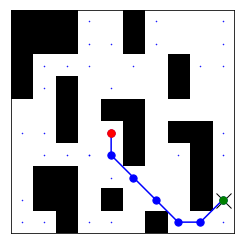

1216
Prediction time:  0.07068830899999057
Reconstruction time:  0.0007662840000079996
ground truth path
predicted path


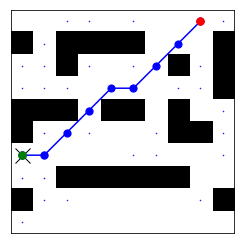

1217
Prediction time:  0.06870216099997606
Reconstruction time:  0.0008180160000392789
ground truth path
predicted path


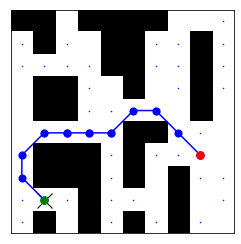

1218
Prediction time:  0.07032287800001313
Reconstruction time:  0.000535546999969938
ground truth path
predicted path


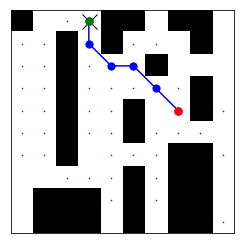

1219
Prediction time:  0.07151840500000617
Reconstruction time:  0.0009199210000474523
ground truth path
predicted path


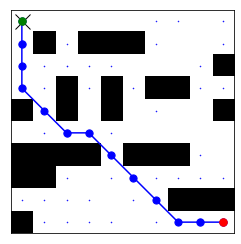

1220
Prediction time:  0.07063661299997648
Reconstruction time:  0.0008381810000059886
ground truth path
predicted path


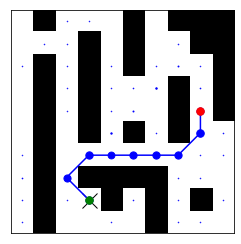

1221
Prediction time:  0.07061384399997905
Reconstruction time:  0.001048741000033715
ground truth path
predicted path


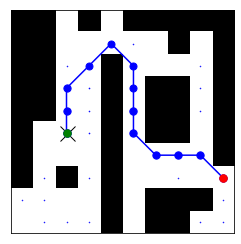

1222
Prediction time:  0.07105168300000742
Reconstruction time:  0.0005767239999840967
ground truth path
predicted path


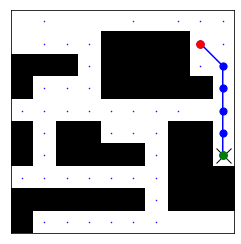

1223
Prediction time:  0.07310502600000746
Reconstruction time:  0.0018119629999659992
ground truth path
predicted path


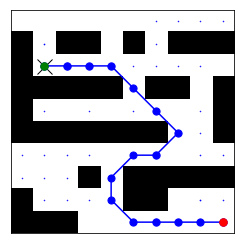

1224
Prediction time:  0.07227477300000373
Reconstruction time:  0.0008110210000040752
ground truth path
predicted path


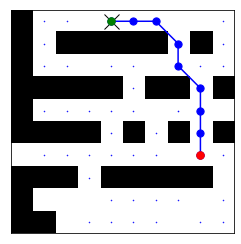

1225
Prediction time:  0.07146483700000772
Reconstruction time:  0.0010840580000035516
ground truth path
predicted path


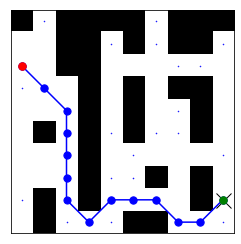

1226
Prediction time:  0.07054934500001764
Reconstruction time:  0.0005412589999878037
ground truth path
predicted path


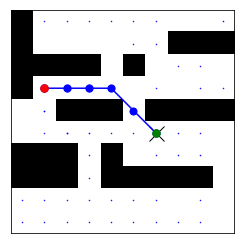

1227
Prediction time:  0.07271627700004046
Reconstruction time:  0.0021735799999760275
ground truth path
predicted path


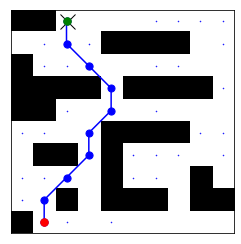

1228
Prediction time:  0.06979842000004055
Reconstruction time:  0.0020067830000130016
ground truth path
predicted path


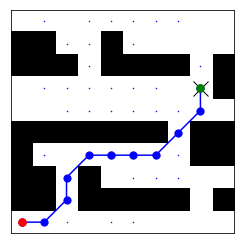

1229
Prediction time:  0.06845162999997001
Reconstruction time:  0.000880445999996482
ground truth path
predicted path


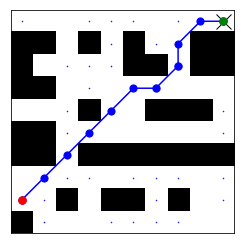

1230
Prediction time:  0.08101164499998958
Reconstruction time:  0.001862966000032884
ground truth path
predicted path


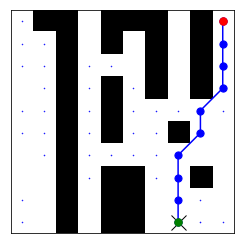

1231
Prediction time:  0.3835071870000206
Reconstruction time:  0.0006717029999663282
ground truth path
predicted path


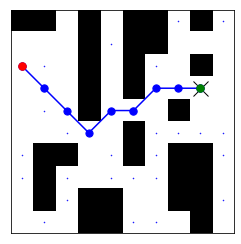

1232
Prediction time:  0.06947216800000433
Reconstruction time:  0.0007409500000221669
ground truth path
predicted path


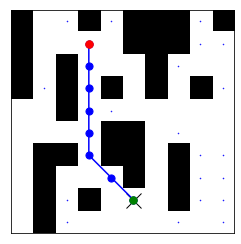

1233
Prediction time:  0.07148755499997606
Reconstruction time:  0.0009791239999685786
ground truth path
predicted path


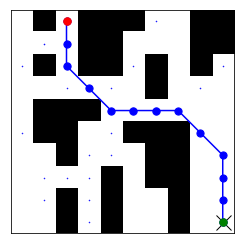

1234
Prediction time:  0.06929351200000156
Reconstruction time:  0.0007459770000082244
ground truth path
predicted path


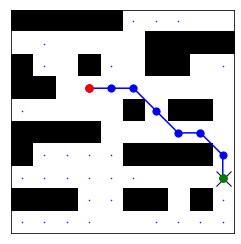

1235
Prediction time:  0.07064916699999912
Reconstruction time:  0.0010430010000277434
ground truth path
predicted path


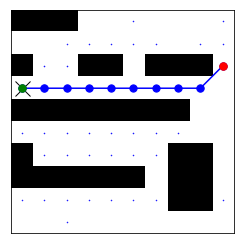

1236
Prediction time:  0.06696085600003698
Reconstruction time:  0.0006051189999993767
ground truth path
predicted path


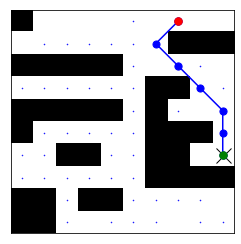

1237
Prediction time:  0.07734483300004058
Reconstruction time:  0.0009666050000305404
ground truth path
predicted path


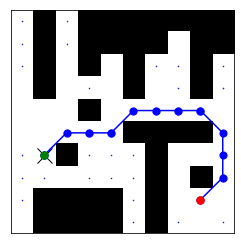

1238
Prediction time:  0.07109311099998195
Reconstruction time:  0.0006106810000119367
ground truth path
predicted path


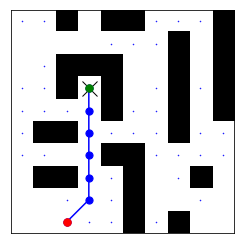

1239
Prediction time:  0.07724093899997797
Reconstruction time:  0.0010245979999581323
ground truth path
predicted path


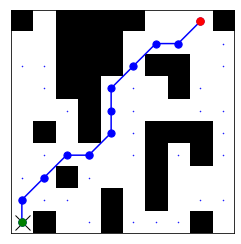

1240
Prediction time:  0.07141958100004331
Reconstruction time:  0.002182873999970525
ground truth path
predicted path


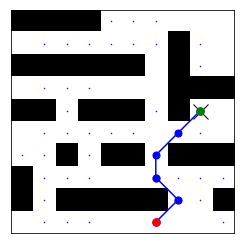

1241
Prediction time:  0.07058120499999632
Reconstruction time:  0.0006986779999920145
ground truth path
predicted path


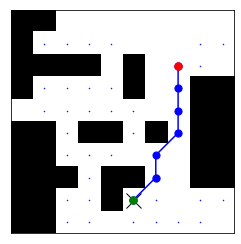

1242
Prediction time:  0.07509944599996743
Reconstruction time:  0.0009482229999662195
ground truth path
predicted path


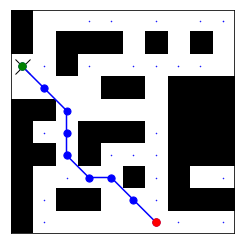

1243
Prediction time:  0.0729213459999869
Reconstruction time:  0.0009867450000342615
ground truth path
predicted path


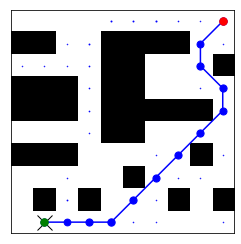

1244
Prediction time:  0.07055558400003292
Reconstruction time:  0.0008320139999682397
ground truth path
predicted path


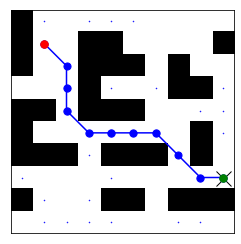

1245
Prediction time:  0.07144163100002743
Reconstruction time:  0.0009756030000289684
ground truth path
predicted path


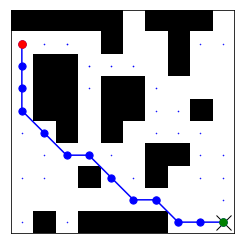

1246
Prediction time:  0.07102151700001968
Reconstruction time:  0.0007371479999846997
ground truth path
predicted path


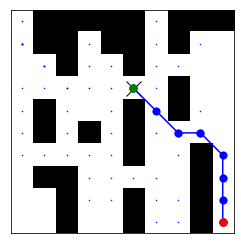

1247
Prediction time:  0.07151371899999504
Reconstruction time:  0.0009550980000199161
ground truth path
predicted path


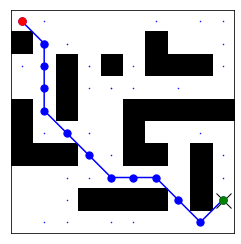

1248
Prediction time:  0.07185422600002767
Reconstruction time:  0.00075214399998913
ground truth path
predicted path


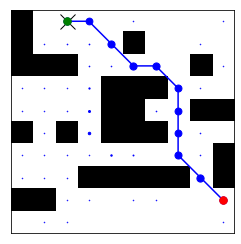

1249
Prediction time:  0.38539145199996483
Reconstruction time:  0.000752086000034069
ground truth path
predicted path


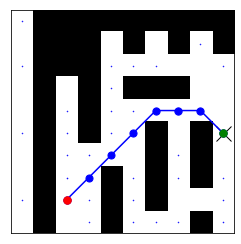

1250
Prediction time:  0.07487027900003795
Reconstruction time:  0.0006272820000390311
ground truth path
predicted path


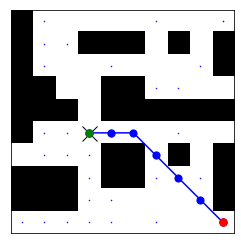

1251
Prediction time:  0.07130583200000729
Reconstruction time:  0.0008845570000062253
ground truth path
predicted path


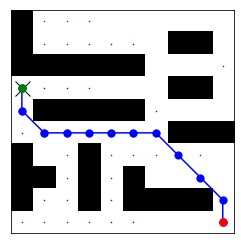

1252
Prediction time:  0.07134063099999821
Reconstruction time:  0.0008155749999900763
ground truth path
predicted path


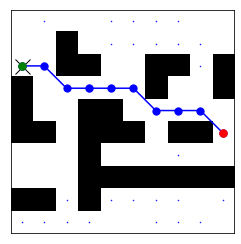

1253
Prediction time:  0.07010105099999464
Reconstruction time:  0.0007700639999939085
ground truth path
predicted path


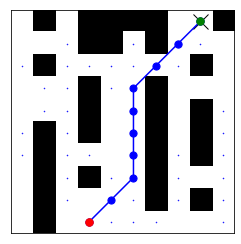

1254
Prediction time:  0.07415679600001113
Reconstruction time:  0.0008568659999923511
ground truth path
predicted path


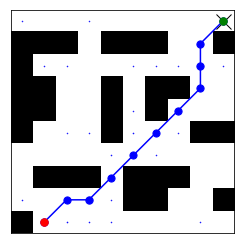

1255
Prediction time:  0.07237586100001181
Reconstruction time:  0.0008887609999987944
ground truth path
predicted path


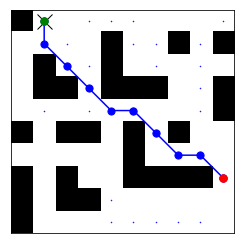

1256
Prediction time:  0.0744717279999918
Reconstruction time:  0.000991143000021566
ground truth path
predicted path


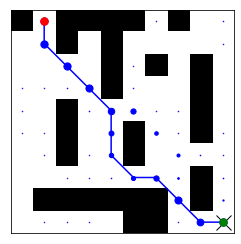

1257
Prediction time:  0.07006632500002752
Reconstruction time:  0.0009598000000323736
ground truth path
predicted path


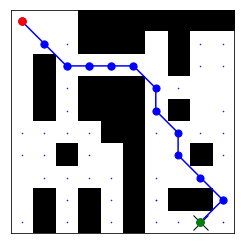

1258
Prediction time:  0.07351595799997312
Reconstruction time:  0.0010254110000005312
ground truth path
predicted path


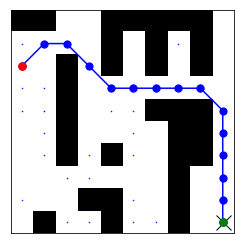

1259
Prediction time:  0.07004333200001156
Reconstruction time:  0.0009382650000020476
ground truth path
predicted path


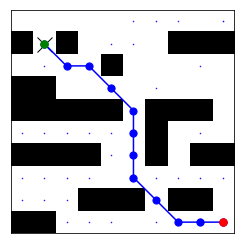

1260
Prediction time:  0.07066839899999877
Reconstruction time:  0.0006799590000241551
ground truth path
predicted path


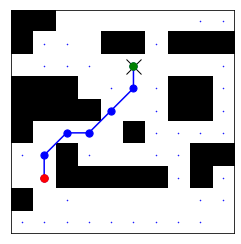

1261
Prediction time:  0.07018268800004535
Reconstruction time:  0.0007034739999767226
ground truth path
predicted path


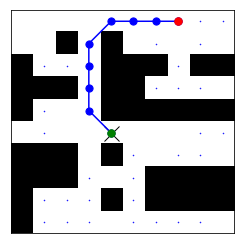

1262
Prediction time:  0.07939095099999349
Reconstruction time:  0.0026093360000345456
ground truth path
predicted path


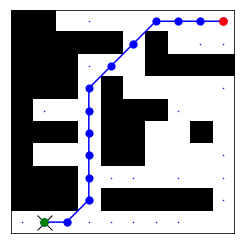

1263
Prediction time:  0.07393489899999395
Reconstruction time:  0.0024449849999541584
ground truth path
predicted path


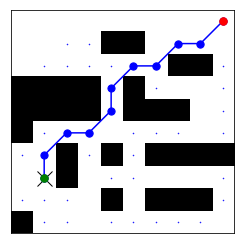

1264
Prediction time:  0.07184651799997255
Reconstruction time:  0.0005577239999752237
ground truth path
predicted path


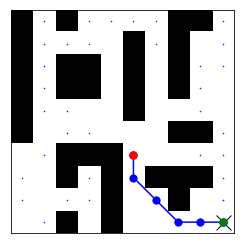

1265
Prediction time:  0.07436249699998143
Reconstruction time:  0.0006176840000193806
ground truth path
predicted path


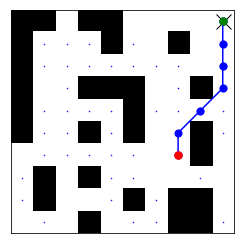

1266
Prediction time:  0.07565145400002393
Reconstruction time:  0.0006897079999816924
ground truth path
predicted path


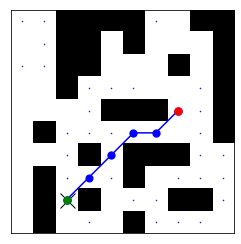

1267
Prediction time:  0.3805424909999715
Reconstruction time:  0.0007960869999692477
ground truth path
predicted path


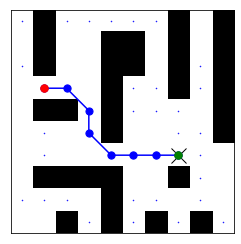

1268
Prediction time:  0.06871955600001911
Reconstruction time:  0.0010921979999807263
ground truth path
predicted path


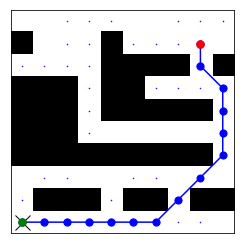

1269
Prediction time:  0.07395769200002178
Reconstruction time:  0.0005992680000304063
ground truth path
predicted path


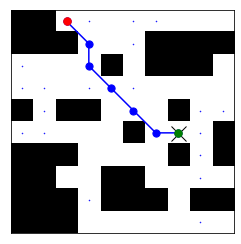

1270
Prediction time:  0.07138216399999919
Reconstruction time:  0.0020693509999887283
ground truth path
predicted path


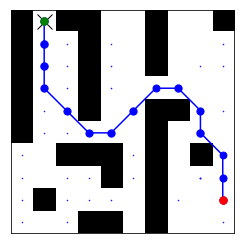

1271
Prediction time:  0.07195890599996346
Reconstruction time:  0.0010258379999754652
ground truth path
predicted path


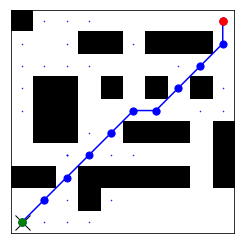

1272
Prediction time:  0.07123395899998286
Reconstruction time:  0.0006165140000007341
ground truth path
predicted path


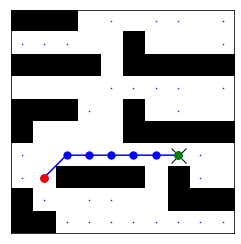

1273
Prediction time:  0.07263543700003083
Reconstruction time:  0.0009403079999970032
ground truth path
predicted path


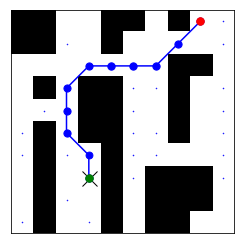

1274
Prediction time:  0.06864442699998108
Reconstruction time:  0.0008452259999671696
ground truth path
predicted path


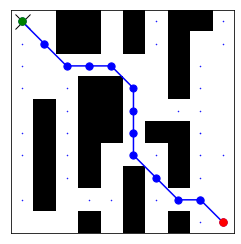

1275
Prediction time:  0.07008497999999008
Reconstruction time:  0.0006927080000309616
ground truth path
predicted path


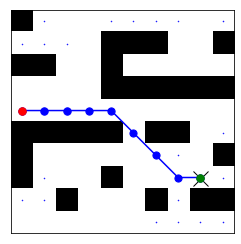

1276
Prediction time:  0.07468023399997037
Reconstruction time:  0.0010493789999941328
ground truth path
predicted path


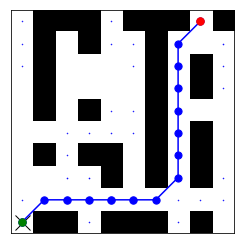

1277
Prediction time:  0.07086313699994662
Reconstruction time:  0.0007072040000366542
ground truth path
predicted path


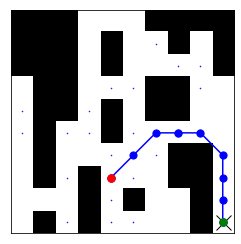

1278
Prediction time:  0.07186812999998438
Reconstruction time:  0.0010828320000086933
ground truth path
predicted path


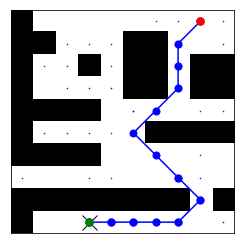

1279
Prediction time:  0.06978273400000035
Reconstruction time:  0.0013975800000025629
ground truth path
predicted path


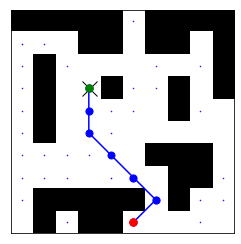

1280
Prediction time:  0.07058863399998927
Reconstruction time:  0.0009646679999946173
ground truth path
predicted path


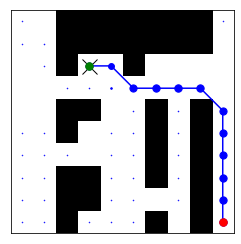

1281
Prediction time:  0.07170643099999552
Reconstruction time:  0.0007685589999937292
ground truth path
predicted path


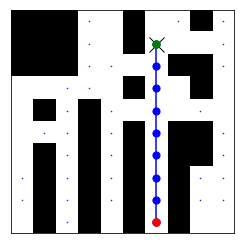

1282
Prediction time:  0.07029417799998328
Reconstruction time:  0.000621539999997367
ground truth path
predicted path


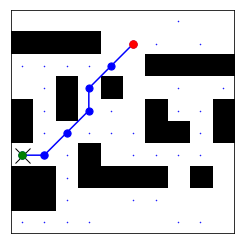

1283
Prediction time:  0.07024110399999017
Reconstruction time:  0.0005909429999633176
ground truth path
predicted path


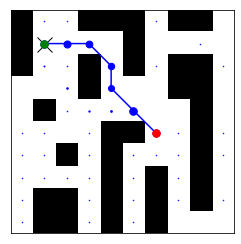

1284
Prediction time:  0.06916532499997174
Reconstruction time:  0.0006982650000395552
ground truth path
predicted path


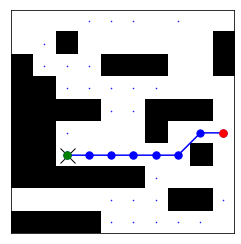

1285
Prediction time:  0.3748104290000356
Reconstruction time:  0.0006271420000416583
ground truth path
predicted path


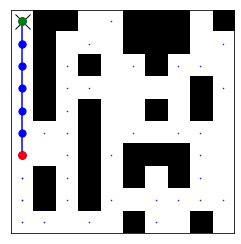

1286
Prediction time:  0.07482246900002565
Reconstruction time:  0.0008650980000197706
ground truth path
predicted path


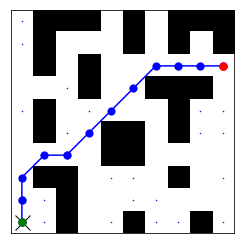

1287
Prediction time:  0.06857068899995511
Reconstruction time:  0.0007758880000210411
ground truth path
predicted path


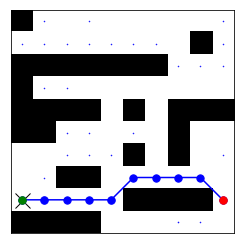

1288
Prediction time:  0.07211940500002356
Reconstruction time:  0.0005234690000293085
ground truth path
predicted path


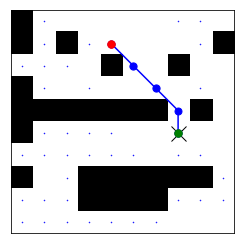

1289
Prediction time:  0.07429543400002103
Reconstruction time:  0.0007823139999914019
ground truth path
predicted path


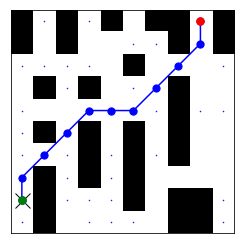

1290
Prediction time:  0.0707985949999852
Reconstruction time:  0.0006246990000136066
ground truth path
predicted path


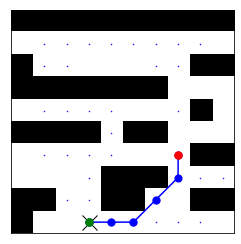

1291
Prediction time:  0.07909826299999168
Reconstruction time:  0.000928126000019347
ground truth path
predicted path


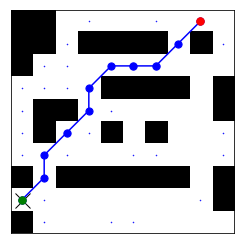

1292
Prediction time:  0.07162669399997412
Reconstruction time:  0.000759618000017781
ground truth path
predicted path


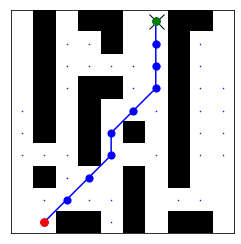

1293
Prediction time:  0.06877862999999707
Reconstruction time:  0.0010346880000042802
ground truth path
predicted path


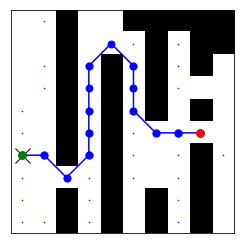

1294
Prediction time:  0.07299626100001433
Reconstruction time:  0.0007831180000152926
ground truth path
predicted path


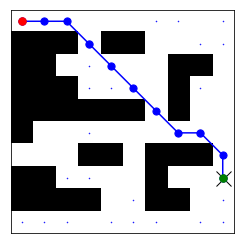

1295
Prediction time:  0.07204284699997743
Reconstruction time:  0.0008139550000123563
ground truth path
predicted path


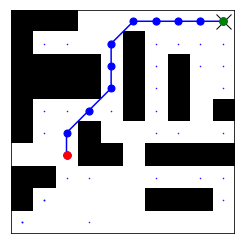

1296
Prediction time:  0.0727803489999701
Reconstruction time:  0.000908438000010392
ground truth path
predicted path


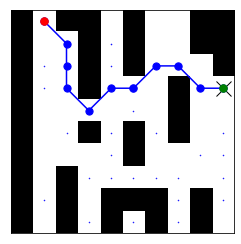

1297
Prediction time:  0.07304095900002494
Reconstruction time:  0.0023035309999954734
ground truth path
predicted path


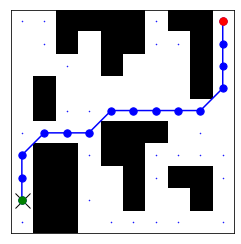

1298
Prediction time:  0.07202818899997965
Reconstruction time:  0.0008589770000071439
ground truth path
predicted path


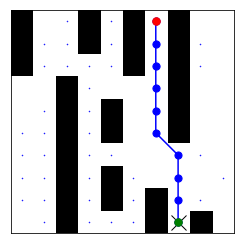

1299
Prediction time:  0.07234495500000548
Reconstruction time:  0.0010267929999940861
ground truth path
predicted path


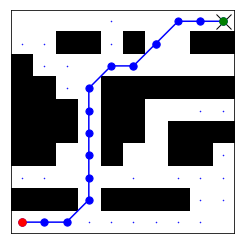

1300
Prediction time:  0.07147749599999997
Reconstruction time:  0.0006883059999722718
ground truth path
predicted path


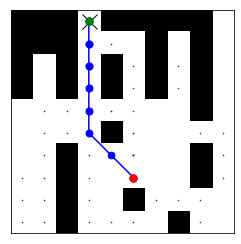

1301
Prediction time:  0.07456654500003879
Reconstruction time:  0.0007205829999747948
ground truth path
predicted path


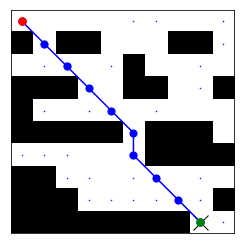

1302
Prediction time:  0.06861581700002262
Reconstruction time:  0.0008636530000103448
ground truth path
predicted path


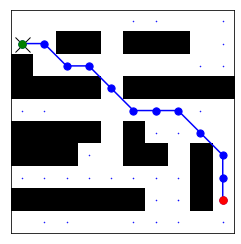

1303
Prediction time:  0.36412359100000913
Reconstruction time:  0.0007620519999704811
ground truth path
predicted path


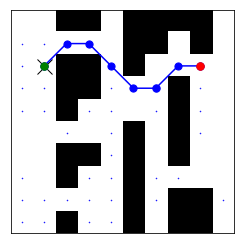

1304
Prediction time:  0.06975601400000642
Reconstruction time:  0.0010455119999619455
ground truth path
predicted path


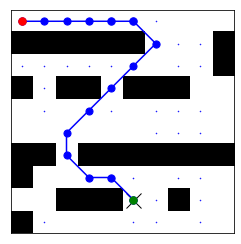

1305
Prediction time:  0.06603256299996474
Reconstruction time:  0.0010440410000001066
ground truth path
predicted path


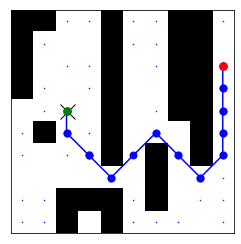

1306
Prediction time:  0.0706327359999932
Reconstruction time:  0.0005913649999911286
ground truth path
predicted path


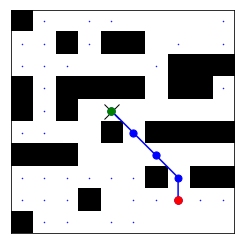

1307
Prediction time:  0.07404778800002987
Reconstruction time:  0.0008217089999789096
ground truth path
predicted path


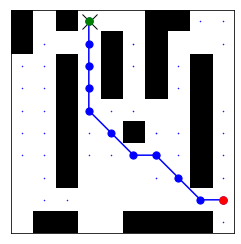

1308
Prediction time:  0.07591616700000259
Reconstruction time:  0.0007855489999997189
ground truth path
predicted path


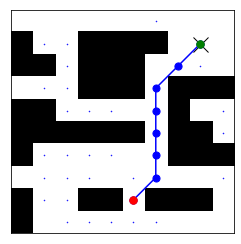

1309
Prediction time:  0.0711245960000042
Reconstruction time:  0.00081322200003342
ground truth path
predicted path


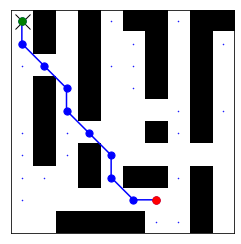

1310
Prediction time:  0.07420295899999019
Reconstruction time:  0.0008854790000327739
ground truth path
predicted path


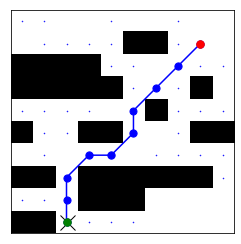

1311
Prediction time:  0.07285916099999667
Reconstruction time:  0.0006080900000142719
ground truth path
predicted path


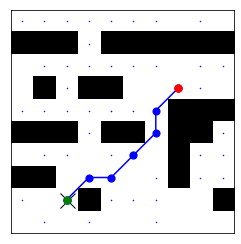

1312
Prediction time:  0.07087393299997302
Reconstruction time:  0.0009112170000094011
ground truth path
predicted path


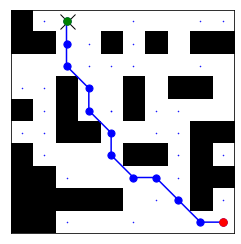

1313
Prediction time:  0.07166100599999936
Reconstruction time:  0.0010340199999632205
ground truth path
predicted path


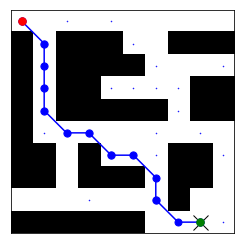

1314
Prediction time:  0.07604771299997992
Reconstruction time:  0.0009279220000166788
ground truth path
predicted path


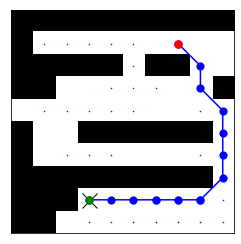

1315
Prediction time:  0.07052070299999968
Reconstruction time:  0.0006794450000029428
ground truth path
predicted path


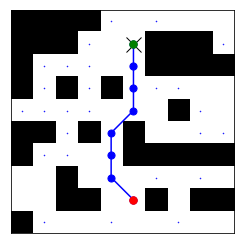

1316
Prediction time:  0.07250987999998415
Reconstruction time:  0.0010290029999850958
ground truth path
predicted path


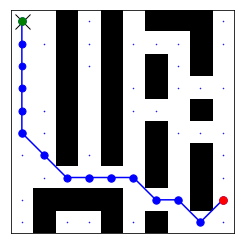

1317
Prediction time:  0.07201561900001252
Reconstruction time:  0.0006223670000053971
ground truth path
predicted path


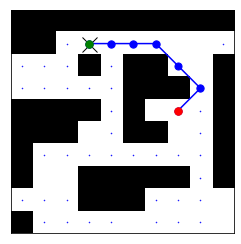

1318
Prediction time:  0.07209469399998625
Reconstruction time:  0.0009350430000267806
ground truth path
predicted path


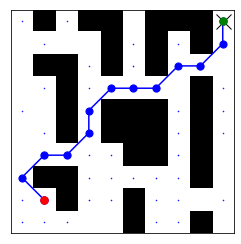

1319
Prediction time:  0.07696849299998121
Reconstruction time:  0.0008223149999935231
ground truth path
predicted path


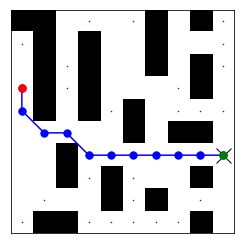

1320
Prediction time:  0.37548994999997376
Reconstruction time:  0.0011408780000010665
ground truth path
predicted path


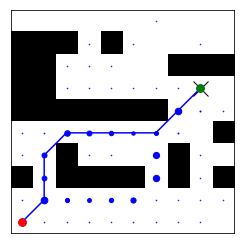

1321
Prediction time:  0.0725088379999761
Reconstruction time:  0.0006140220000361296
ground truth path
predicted path


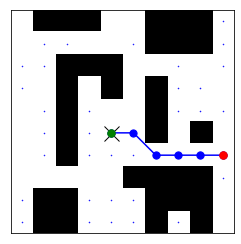

1322
Prediction time:  0.07204879500000061
Reconstruction time:  0.0005574609999712266
ground truth path
predicted path


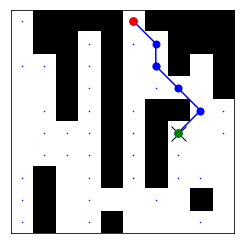

1323
Prediction time:  0.07345030999999835
Reconstruction time:  0.00096968600001901
ground truth path
predicted path


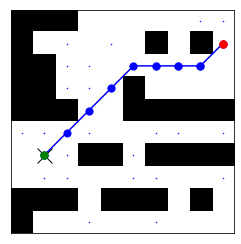

1324
Prediction time:  0.07045588700003691
Reconstruction time:  0.0009283669999717858
ground truth path
predicted path


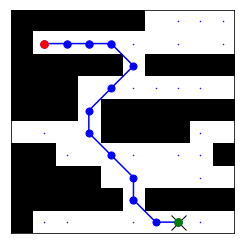

1325
Prediction time:  0.07323710899999014
Reconstruction time:  0.0007740670000089267
ground truth path
predicted path


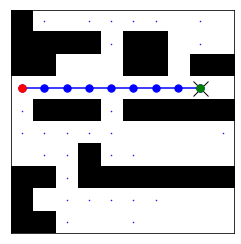

1326
Prediction time:  0.07428894800000307
Reconstruction time:  0.0007897930000240194
ground truth path
predicted path


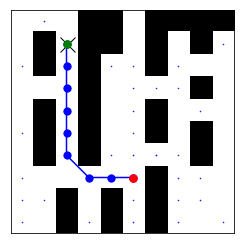

1327
Prediction time:  0.07157711499996822
Reconstruction time:  0.0007272859999716275
ground truth path
predicted path


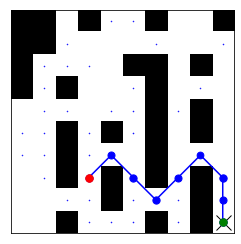

1328
Prediction time:  0.07097826299997223
Reconstruction time:  0.0006587650000255962
ground truth path
predicted path


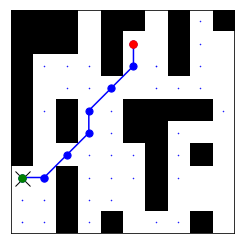

1329
Prediction time:  0.07164840299998332
Reconstruction time:  0.0007475259999978334
ground truth path
predicted path


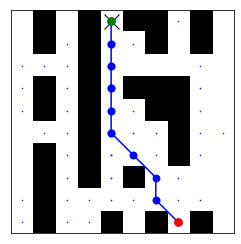

1330
Prediction time:  0.07248189699998875
Reconstruction time:  0.0006412120000049981
ground truth path
predicted path


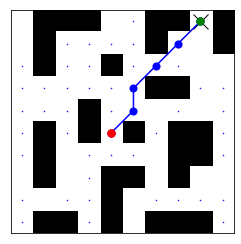

1331
Prediction time:  0.07254734999997936
Reconstruction time:  0.0006379370000217932
ground truth path
predicted path


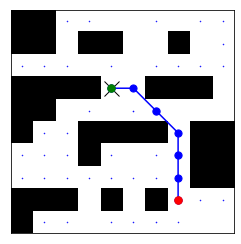

1332
Prediction time:  0.07445286499995518
Reconstruction time:  0.001024939999979324
ground truth path
predicted path


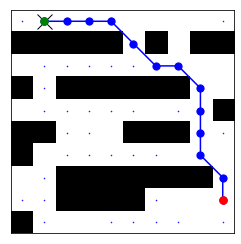

1333
Prediction time:  0.07053756199996997
Reconstruction time:  0.0006106099999669823
ground truth path
predicted path


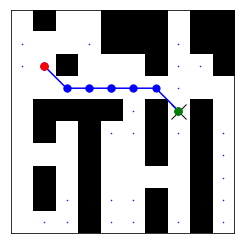

1334
Prediction time:  0.07152053499999056
Reconstruction time:  0.0012139190000084454
ground truth path
predicted path


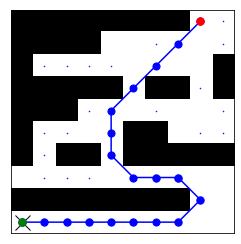

1335
Prediction time:  0.06976623599996401
Reconstruction time:  0.0007294119999983195
ground truth path
predicted path


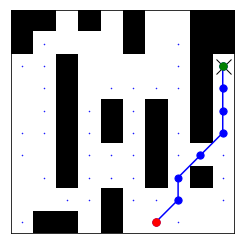

1336
Prediction time:  0.06902027199998884
Reconstruction time:  0.0007183150000287242
ground truth path
predicted path


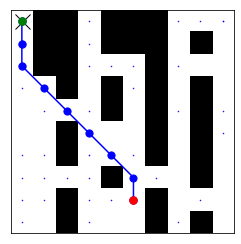

1337
Prediction time:  0.3673662950000107
Reconstruction time:  0.0005493620000152077
ground truth path
predicted path


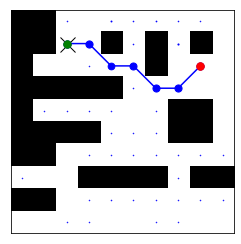

1338
Prediction time:  0.07037769700002627
Reconstruction time:  0.0009196290000090812
ground truth path
predicted path


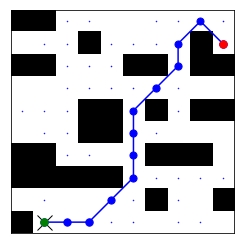

1339
Prediction time:  0.06979923399995869
Reconstruction time:  0.0008169110000153523
ground truth path
predicted path


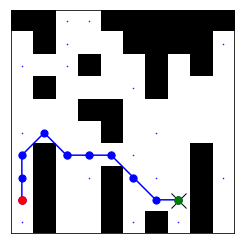

1340
Prediction time:  0.06683248199999525
Reconstruction time:  0.0010463099999924452
ground truth path
predicted path


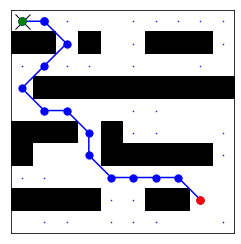

1341
Prediction time:  0.07007659700002478
Reconstruction time:  0.0007019770000056269
ground truth path
predicted path


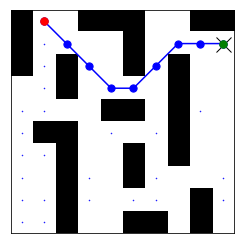

1342
Prediction time:  0.07256708599999229
Reconstruction time:  0.0006051870000192139
ground truth path
predicted path


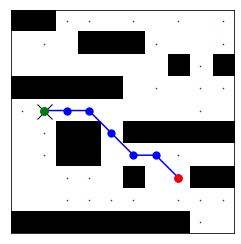

1343
Prediction time:  0.06863744300000008
Reconstruction time:  0.0008243610000135959
ground truth path
predicted path


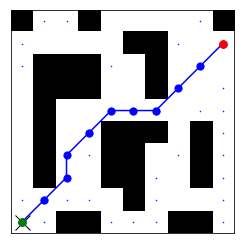

1344
Prediction time:  0.0701439630000209
Reconstruction time:  0.0007451739999737583
ground truth path
predicted path


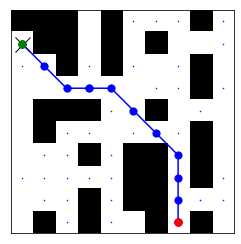

1345
Prediction time:  0.06864635999994562
Reconstruction time:  0.0006967159999931027
ground truth path
predicted path


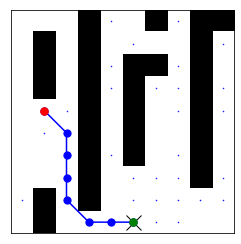

1346
Prediction time:  0.0700590110000121
Reconstruction time:  0.0008158020000337274
ground truth path
predicted path


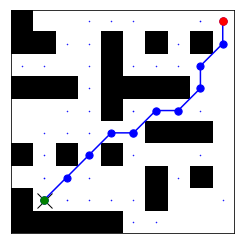

1347
Prediction time:  0.07053668100002142
Reconstruction time:  0.0006253280000123596
ground truth path
predicted path


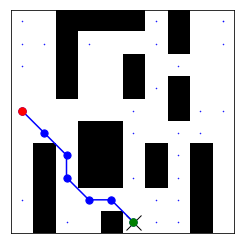

1348
Prediction time:  0.07304637000004277
Reconstruction time:  0.0008366750000163847
ground truth path
predicted path


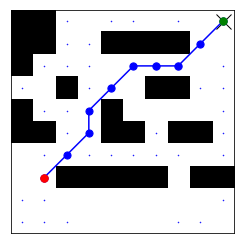

1349
Prediction time:  0.06948397899998326
Reconstruction time:  0.0007586579999951937
ground truth path
predicted path


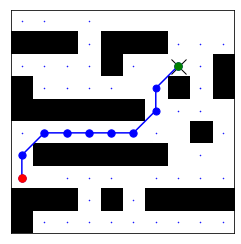

1350
Prediction time:  0.07173468999997112
Reconstruction time:  0.0006049090000033175
ground truth path
predicted path


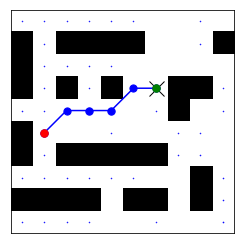

1351
Prediction time:  0.07138530800000353
Reconstruction time:  0.0007460620000188101
ground truth path
predicted path


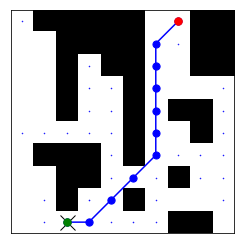

1352
Prediction time:  0.06889429400001745
Reconstruction time:  0.0007964580000248134
ground truth path
predicted path


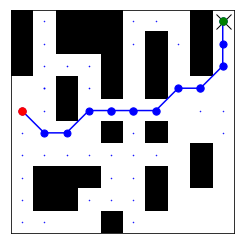

1353
Prediction time:  0.07048165700001618
Reconstruction time:  0.0009012820000293686
ground truth path
predicted path


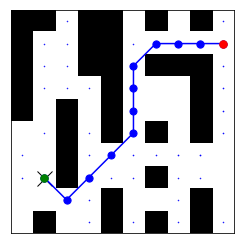

1354
Prediction time:  0.37365557300000773
Reconstruction time:  0.0006837380000206394
ground truth path
predicted path


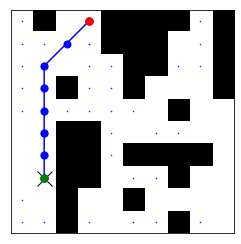

1355
Prediction time:  0.07123544700004913
Reconstruction time:  0.002160505999995621
ground truth path
predicted path


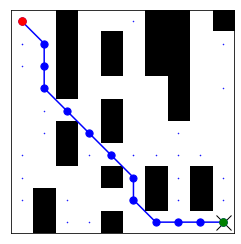

1356
Prediction time:  0.06744283100005077
Reconstruction time:  0.0008373410000217518
ground truth path
predicted path


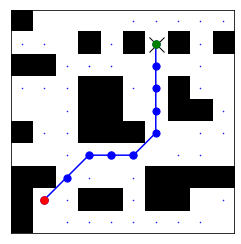

1357
Prediction time:  0.07184655300000031
Reconstruction time:  0.0006184630000234392
ground truth path
predicted path


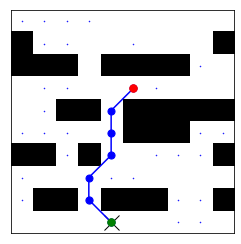

1358
Prediction time:  0.07025397000001021
Reconstruction time:  0.000972803000024669
ground truth path
predicted path


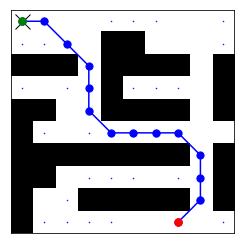

1359
Prediction time:  0.07241097399997898
Reconstruction time:  0.0008279159999915464
ground truth path
predicted path


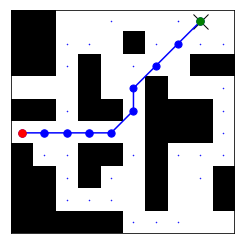

1360
Prediction time:  0.07118682700001955
Reconstruction time:  0.0007104860000026747
ground truth path
predicted path


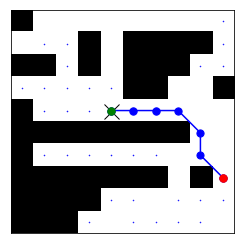

1361
Prediction time:  0.0730025270000283
Reconstruction time:  0.00138923600002272
ground truth path
predicted path


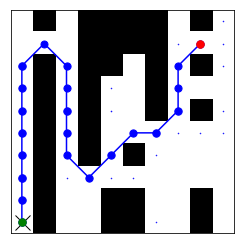

1362
Prediction time:  0.06977251500001103
Reconstruction time:  0.0005488150000019232
ground truth path
predicted path


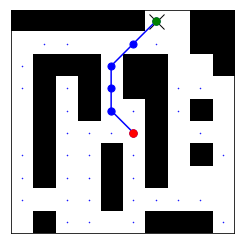

1363
Prediction time:  0.07477223500001173
Reconstruction time:  0.0010194669999918915
ground truth path
predicted path


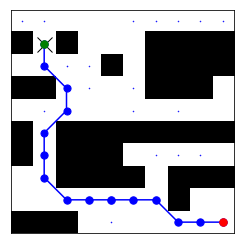

1364
Prediction time:  0.07592394599998897
Reconstruction time:  0.0009201799999800642
ground truth path
predicted path


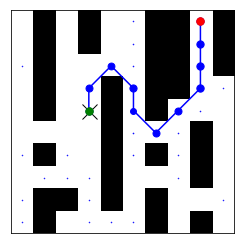

1365
Prediction time:  0.07219111599999906
Reconstruction time:  0.00070749200000364
ground truth path
predicted path


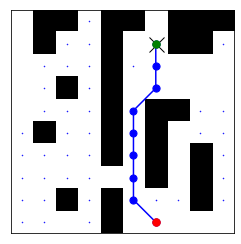

1366
Prediction time:  0.07536775399995577
Reconstruction time:  0.0007669440000199756
ground truth path
predicted path


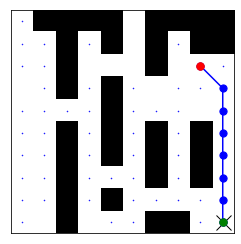

1367
Prediction time:  0.06833109699999795
Reconstruction time:  0.000639981999995598
ground truth path
predicted path


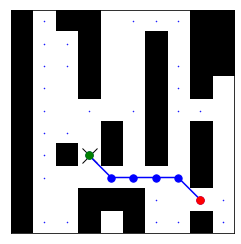

1368
Prediction time:  0.07051423000001478
Reconstruction time:  0.0008606990000430415
ground truth path
predicted path


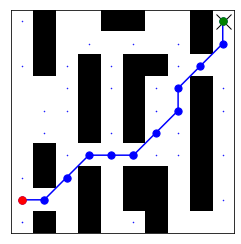

1369
Prediction time:  0.07135560500000793
Reconstruction time:  0.0007634190000089802
ground truth path
predicted path


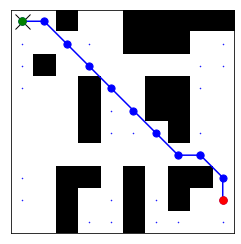

1370
Prediction time:  0.06647453099998302
Reconstruction time:  0.0005263209999952778
ground truth path
predicted path


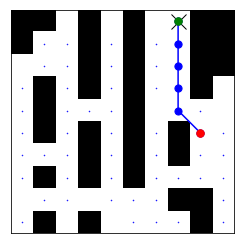

1371
Prediction time:  0.3649564980000264
Reconstruction time:  0.0006715680000297652
ground truth path
predicted path


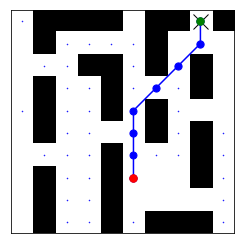

1372
Prediction time:  0.07282900699999573
Reconstruction time:  0.0010364799999820207
ground truth path
predicted path


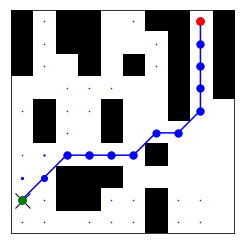

1373
Prediction time:  0.07151320400004124
Reconstruction time:  0.0009782019999988734
ground truth path
predicted path


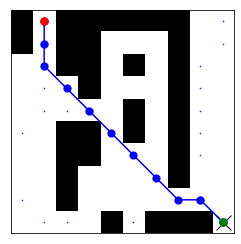

1374
Prediction time:  0.07216525000001184
Reconstruction time:  0.0020005239999818514
ground truth path
predicted path


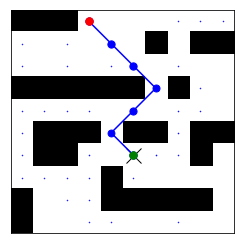

1375
Prediction time:  0.07080275199996322
Reconstruction time:  0.0007170270000074197
ground truth path
predicted path


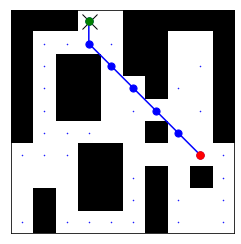

1376
Prediction time:  0.0712878410000144
Reconstruction time:  0.0007655559999761863
ground truth path
predicted path


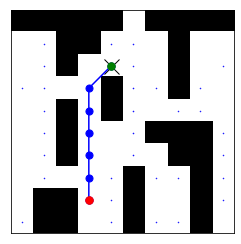

1377
Prediction time:  0.0673471759999984
Reconstruction time:  0.0007664049999789313
ground truth path
predicted path


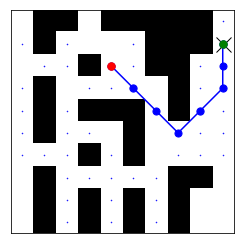

1378
Prediction time:  0.07079038900002388
Reconstruction time:  0.0007345860000214088
ground truth path
predicted path


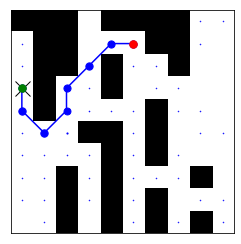

1379
Prediction time:  0.06714225300004273
Reconstruction time:  0.0007425420000117811
ground truth path
predicted path


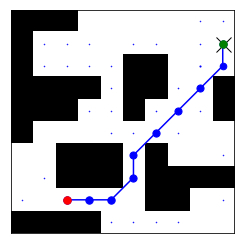

1380
Prediction time:  0.07140834699998777
Reconstruction time:  0.0008235720000016045
ground truth path
predicted path


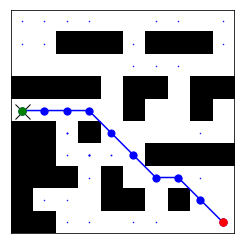

1381
Prediction time:  0.08158095299995693
Reconstruction time:  0.0007253219999938665
ground truth path
predicted path


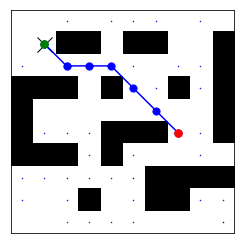

1382
Prediction time:  0.07137935000002926
Reconstruction time:  0.000695526000015434
ground truth path
predicted path


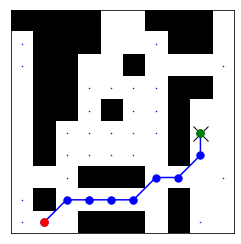

1383
Prediction time:  0.07237669099998811
Reconstruction time:  0.000780937999991238
ground truth path
predicted path


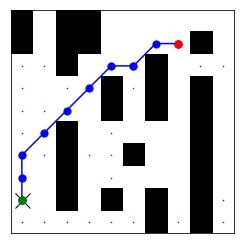

1384
Prediction time:  0.06846962899999198
Reconstruction time:  0.000585897999997087
ground truth path
predicted path


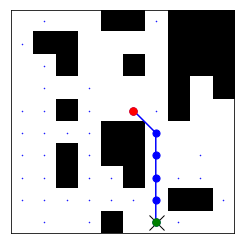

1385
Prediction time:  0.06770113199996786
Reconstruction time:  0.0007915789999515255
ground truth path
predicted path


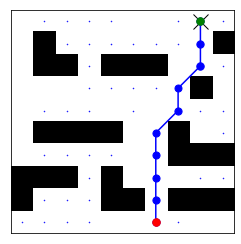

1386
Prediction time:  0.06907895599999847
Reconstruction time:  0.0005597429999966153
ground truth path
predicted path


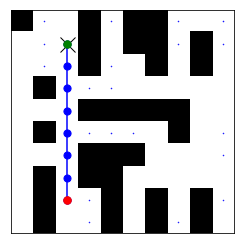

1387
Prediction time:  0.07255053599999428
Reconstruction time:  0.0010196100000143815
ground truth path
predicted path


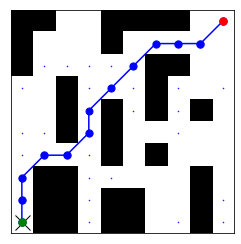

1388
Prediction time:  0.06873159600002055
Reconstruction time:  0.0009865030000355546
ground truth path
predicted path


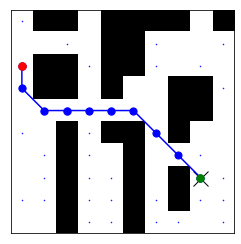

1389
Prediction time:  0.3793701110000143
Reconstruction time:  0.0010548999999855369
ground truth path
predicted path


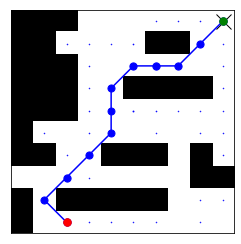

1390
Prediction time:  0.06864240300001256
Reconstruction time:  0.0008283570000457985
ground truth path
predicted path


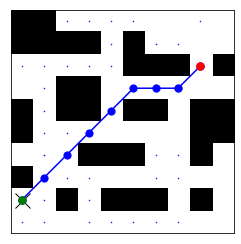

1391
Prediction time:  0.069153024000002
Reconstruction time:  0.002637182999990273
ground truth path
predicted path


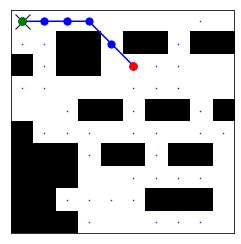

1392
Prediction time:  0.06872646699997631
Reconstruction time:  0.0007694029999925078
ground truth path
predicted path


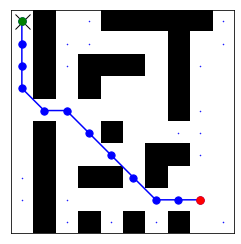

1393
Prediction time:  0.06763800699997091
Reconstruction time:  0.0008674100000121143
ground truth path
predicted path


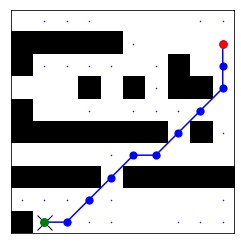

1394
Prediction time:  0.06913753100002396
Reconstruction time:  0.001127160000010008
ground truth path
predicted path


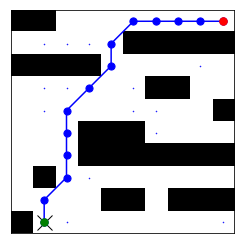

1395
Prediction time:  0.06845959100002119
Reconstruction time:  0.0007361719999607885
ground truth path
predicted path


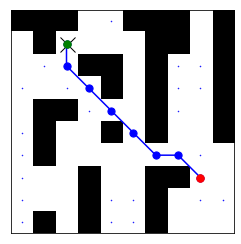

1396
Prediction time:  0.0688368670000159
Reconstruction time:  0.0008169309999743746
ground truth path
predicted path


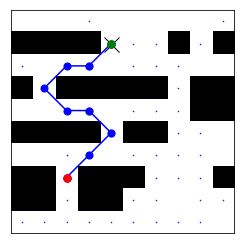

1397
Prediction time:  0.06751013399997419
Reconstruction time:  0.00098534500000369
ground truth path
predicted path


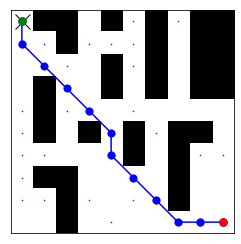

1398
Prediction time:  0.06787534900001901
Reconstruction time:  0.0018200720000436377
ground truth path
predicted path


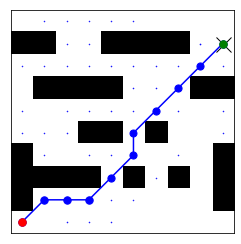

1399
Prediction time:  0.07134753200000432
Reconstruction time:  0.0007484600000111641
ground truth path
predicted path


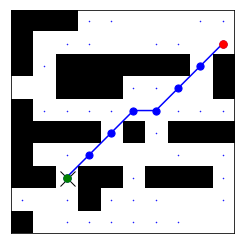

1400
Prediction time:  0.0704440079999813
Reconstruction time:  0.0007084800000143332
ground truth path
predicted path


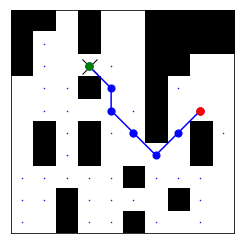

1401
Prediction time:  0.07437711500000432
Reconstruction time:  0.0008089959999892926
ground truth path
predicted path


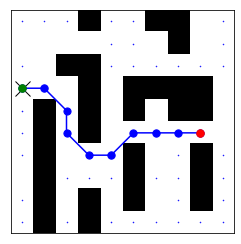

1402
Prediction time:  0.06767904299999827
Reconstruction time:  0.0005780429999617809
ground truth path
predicted path


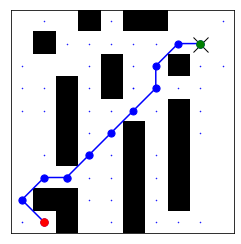

1403
Prediction time:  0.07139595400002463
Reconstruction time:  0.0006487420000098609
ground truth path
predicted path


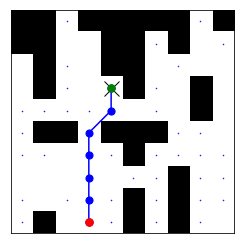

1404
Prediction time:  0.07959049300001197
Reconstruction time:  0.0030509929999880114
ground truth path
predicted path


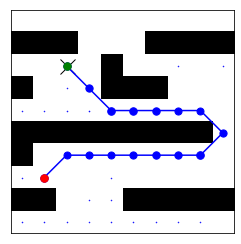

1405
Prediction time:  0.07009171799995784
Reconstruction time:  0.0006459129999711877
ground truth path
predicted path


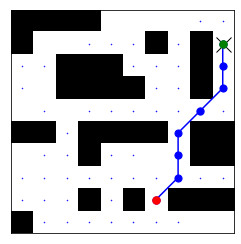

1406
Prediction time:  0.36424823599998035
Reconstruction time:  0.0006530510000288814
ground truth path
predicted path


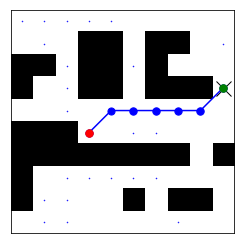

1407
Prediction time:  0.07243330099998957
Reconstruction time:  0.0006702669999754107
ground truth path
predicted path


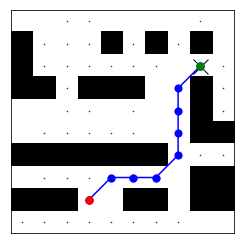

1408
Prediction time:  0.06797936800001025
Reconstruction time:  0.0008699210000031599
ground truth path
predicted path


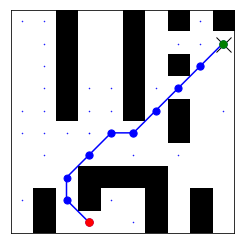

1409
Prediction time:  0.07028323299999784
Reconstruction time:  0.0008251919999793245
ground truth path
predicted path


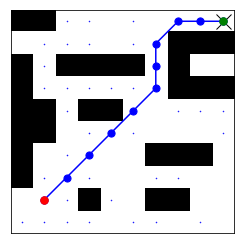

1410
Prediction time:  0.0706870399999957
Reconstruction time:  0.0007989429999497588
ground truth path
predicted path


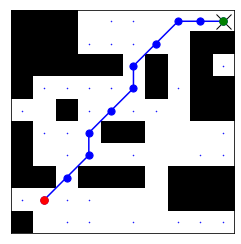

1411
Prediction time:  0.07007783900002096
Reconstruction time:  0.0006551640000225234
ground truth path
predicted path


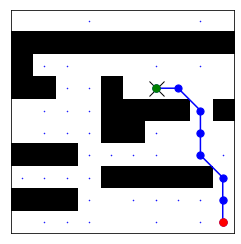

1412
Prediction time:  0.06886343899998337
Reconstruction time:  0.0007980889999998908
ground truth path
predicted path


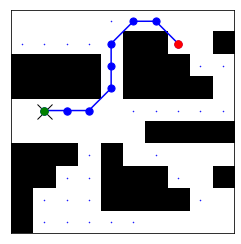

1413
Prediction time:  0.0678160260000027
Reconstruction time:  0.0010424550000038835
ground truth path
predicted path


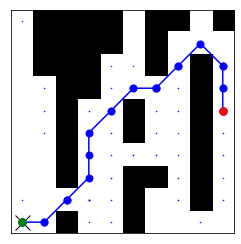

1414
Prediction time:  0.06922398300002897
Reconstruction time:  0.0006815589999860094
ground truth path
predicted path


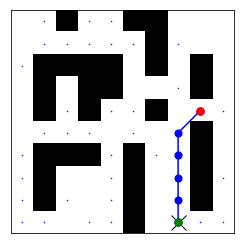

1415
Prediction time:  0.07136621500001183
Reconstruction time:  0.0014586899999926572
ground truth path
predicted path


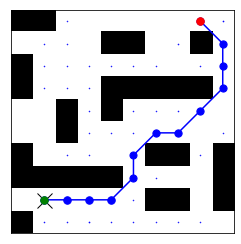

1416
Prediction time:  0.06791330099997595
Reconstruction time:  0.0009790529999804676
ground truth path
predicted path


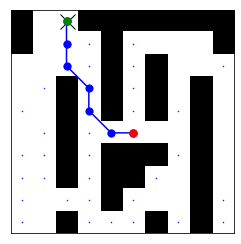

1417
Prediction time:  0.07188629799998125
Reconstruction time:  0.0008647810000184109
ground truth path
predicted path


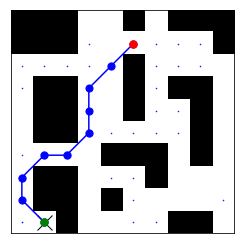

1418
Prediction time:  0.06623938500001714
Reconstruction time:  0.0008579849999819089
ground truth path
predicted path


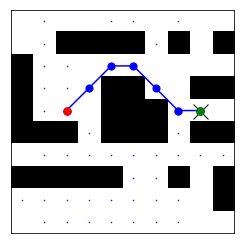

1419
Prediction time:  0.0678844160000267
Reconstruction time:  0.000664292999999816
ground truth path
predicted path


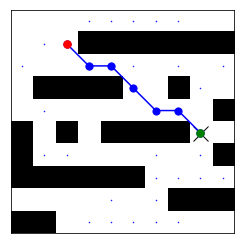

1420
Prediction time:  0.0699712989999739
Reconstruction time:  0.001035932000036155
ground truth path
predicted path


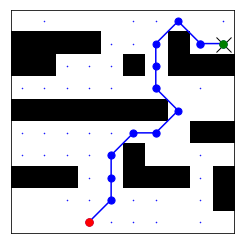

1421
Prediction time:  0.07177171500001123
Reconstruction time:  0.0008495659999994132
ground truth path
predicted path


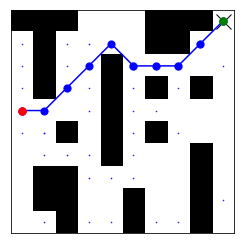

1422
Prediction time:  0.06777821299999687
Reconstruction time:  0.0006922329999952126
ground truth path
predicted path


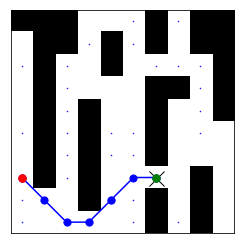

1423
Prediction time:  0.38545535599996583
Reconstruction time:  0.0005927029999952538
ground truth path
predicted path


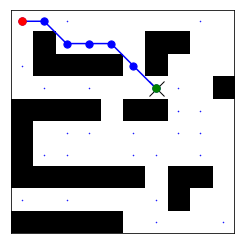

1424
Prediction time:  0.07191202100000282
Reconstruction time:  0.0009128280000254563
ground truth path
predicted path


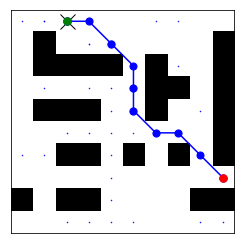

1425
Prediction time:  0.06680876699999772
Reconstruction time:  0.0019857969999748093
ground truth path
predicted path


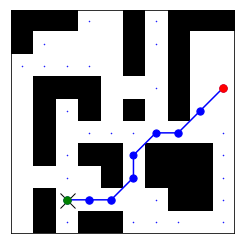

1426
Prediction time:  0.07508723000000828
Reconstruction time:  0.0007587960000137173
ground truth path
predicted path


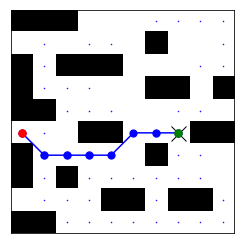

1427
Prediction time:  0.07680852699996876
Reconstruction time:  0.0009643149999760681
ground truth path
predicted path


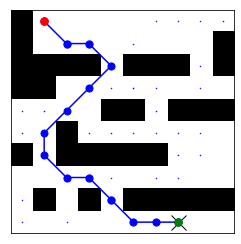

1428
Prediction time:  0.07064495700001316
Reconstruction time:  0.0008730210000180705
ground truth path
predicted path


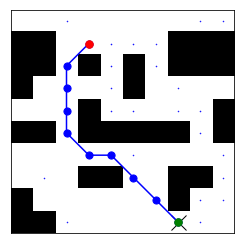

1429
Prediction time:  0.07328694800003177
Reconstruction time:  0.0007859789999997702
ground truth path
predicted path


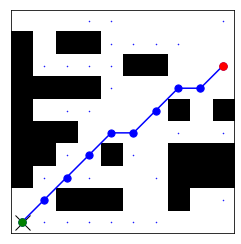

1430
Prediction time:  0.07431270799997947
Reconstruction time:  0.0011671210000372412
ground truth path
predicted path


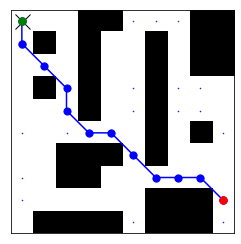

1431
Prediction time:  0.07511199599997553
Reconstruction time:  0.0006907220000016423
ground truth path
predicted path


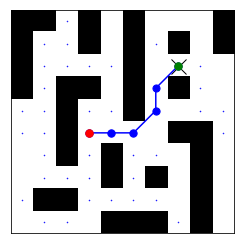

1432
Prediction time:  0.07111241699999482
Reconstruction time:  0.0006767959999933737
ground truth path
predicted path


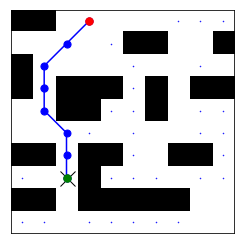

1433
Prediction time:  0.07132624300004409
Reconstruction time:  0.0007257480000362193
ground truth path
predicted path


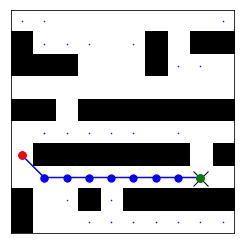

1434
Prediction time:  0.07361430800000335
Reconstruction time:  0.0011645330000078502
ground truth path
predicted path


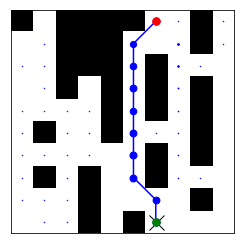

1435
Prediction time:  0.07177278400001796
Reconstruction time:  0.0008306219999667519
ground truth path
predicted path


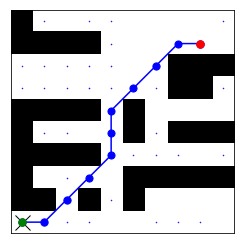

1436
Prediction time:  0.06923396500002355
Reconstruction time:  0.000941705999991882
ground truth path
predicted path


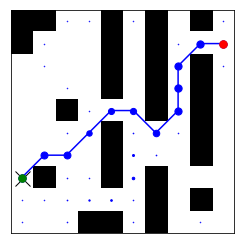

1437
Prediction time:  0.07293455100000301
Reconstruction time:  0.0009106429999974353
ground truth path
predicted path


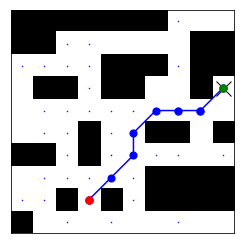

1438
Prediction time:  0.07379980799998975
Reconstruction time:  0.0007050250000020242
ground truth path
predicted path


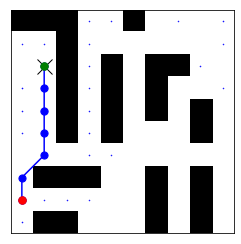

1439
Prediction time:  0.07339941200001476
Reconstruction time:  0.0008239279999884275
ground truth path
predicted path


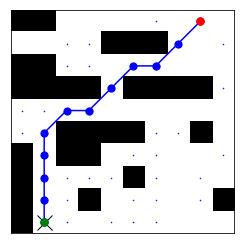

1440
Prediction time:  0.07225365299996156
Reconstruction time:  0.0010838480000074924
ground truth path
predicted path


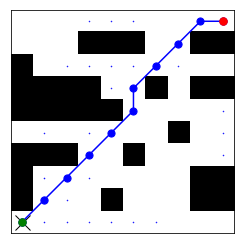

1441
Prediction time:  0.38765277899995
Reconstruction time:  0.0006774189999987357
ground truth path
predicted path


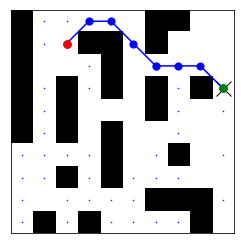

1442
Prediction time:  0.07225894699996616
Reconstruction time:  0.0009564389999923151
ground truth path
predicted path


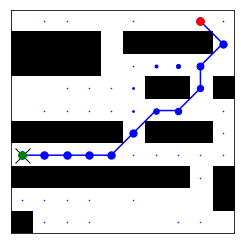

1443
Prediction time:  0.07184841499997674
Reconstruction time:  0.0008475309999766978
ground truth path
predicted path


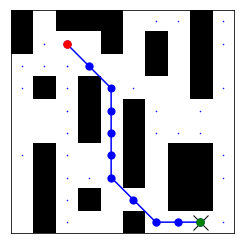

1444
Prediction time:  0.07246071099996243
Reconstruction time:  0.0008799340000678058
ground truth path
predicted path


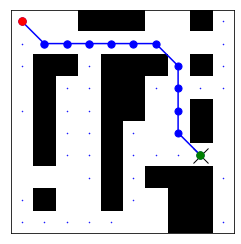

1445
Prediction time:  0.0753638559999672
Reconstruction time:  0.0007328740000502876
ground truth path
predicted path


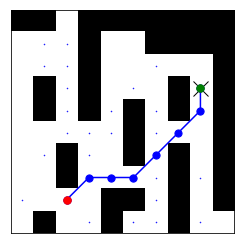

1446
Prediction time:  0.07215049499995985
Reconstruction time:  0.0006436149999444751
ground truth path
predicted path


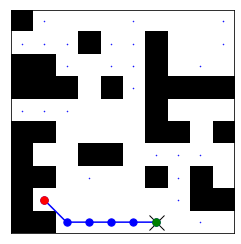

1447
Prediction time:  0.06983020100005888
Reconstruction time:  0.0006376290000389417
ground truth path
predicted path


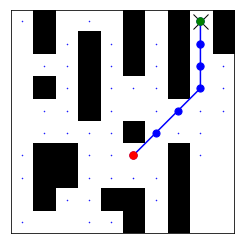

1448
Prediction time:  0.07498781599997528
Reconstruction time:  0.0006035659999952259
ground truth path
predicted path


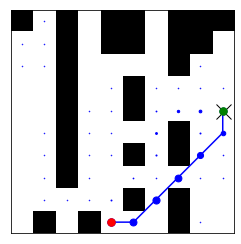

1449
Prediction time:  0.07346745600000304
Reconstruction time:  0.0006564940000544084
ground truth path
predicted path


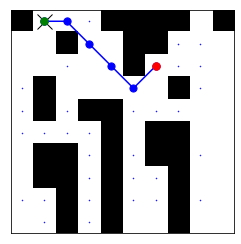

1450
Prediction time:  0.07289789200001451
Reconstruction time:  0.0006940609999901426
ground truth path
predicted path


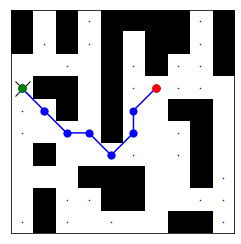

1451
Prediction time:  0.07132393199992748
Reconstruction time:  0.0008083940000460643
ground truth path
predicted path


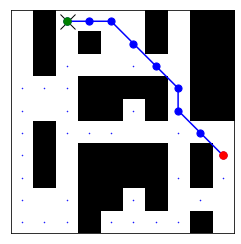

1452
Prediction time:  0.07029403000001366
Reconstruction time:  0.0009707829999570095
ground truth path
predicted path


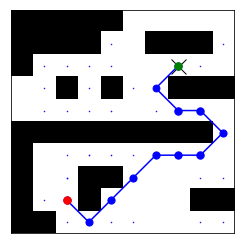

1453
Prediction time:  0.07171086500000001
Reconstruction time:  0.0009342619999870294
ground truth path
predicted path


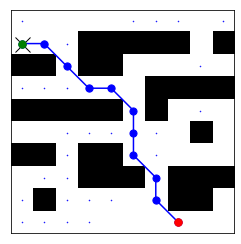

1454
Prediction time:  0.07512149199999385
Reconstruction time:  0.001020245000063369
ground truth path
predicted path


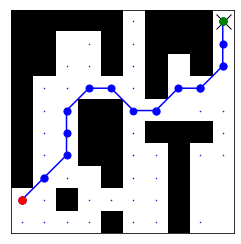

1455
Prediction time:  0.06970087700005934
Reconstruction time:  0.0006849260000763024
ground truth path
predicted path


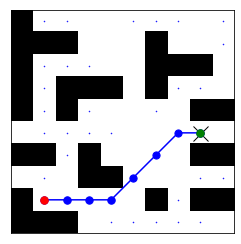

1456
Prediction time:  0.07204051099995468
Reconstruction time:  0.0006134879999990517
ground truth path
predicted path


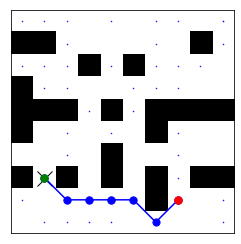

1457
Prediction time:  0.07230076799999097
Reconstruction time:  0.000632543999927293
ground truth path
predicted path


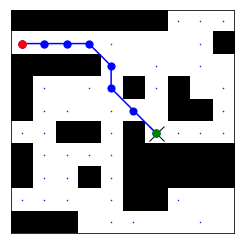

1458
Prediction time:  0.3792124539999122
Reconstruction time:  0.001120678000006592
ground truth path
predicted path


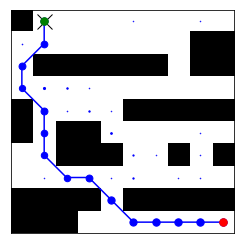

1459
Prediction time:  0.07550048200005222
Reconstruction time:  0.0006584330000123373
ground truth path
predicted path


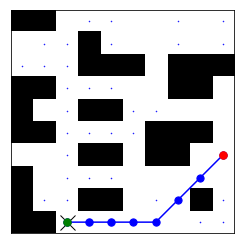

1460
Prediction time:  0.07291240799997922
Reconstruction time:  0.0006485990001010578
ground truth path
predicted path


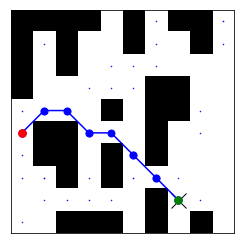

1461
Prediction time:  0.07372924399999192
Reconstruction time:  0.0021473219999279536
ground truth path
predicted path


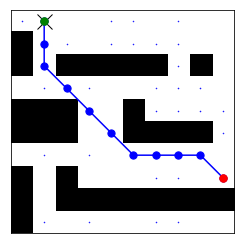

1462
Prediction time:  0.07342869999990853
Reconstruction time:  0.0009168450000061057
ground truth path
predicted path


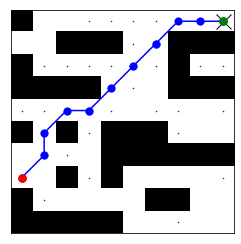

1463
Prediction time:  0.07167881600003057
Reconstruction time:  0.0007822750000059386
ground truth path
predicted path


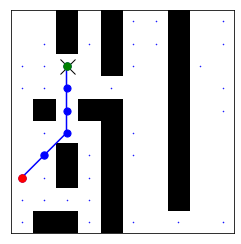

1464
Prediction time:  0.07109842800002752
Reconstruction time:  0.0006909109999924112
ground truth path
predicted path


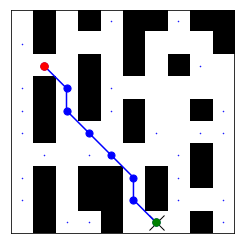

1465
Prediction time:  0.07168605600008959
Reconstruction time:  0.0009317490000739781
ground truth path
predicted path


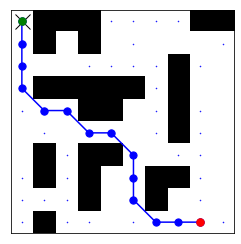

1466
Prediction time:  0.07305434699992475
Reconstruction time:  0.0009702880000759251
ground truth path
predicted path


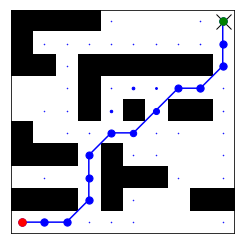

1467
Prediction time:  0.06999293599994871
Reconstruction time:  0.0007394560000193451
ground truth path
predicted path


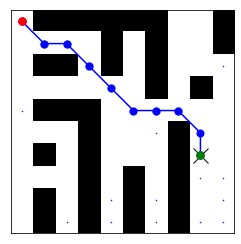

1468
Prediction time:  0.06850447299996176
Reconstruction time:  0.0008127390000254309
ground truth path
predicted path


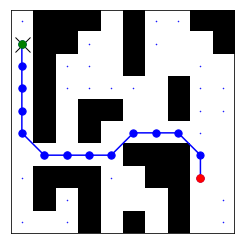

1469
Prediction time:  0.0736911210000244
Reconstruction time:  0.000815406000015173
ground truth path
predicted path


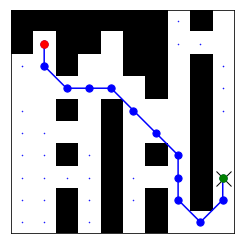

1470
Prediction time:  0.06921897400002308
Reconstruction time:  0.000569134999977905
ground truth path
predicted path


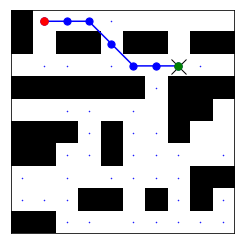

1471
Prediction time:  0.07175610000001598
Reconstruction time:  0.0006935879999900862
ground truth path
predicted path


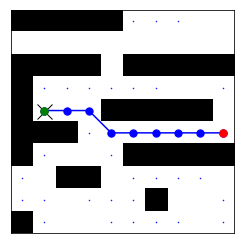

1472
Prediction time:  0.068893092000053
Reconstruction time:  0.0006703280000692757
ground truth path
predicted path


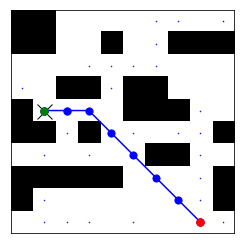

1473
Prediction time:  0.06881856200004677
Reconstruction time:  0.000860607999925378
ground truth path
predicted path


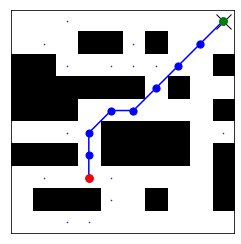

1474
Prediction time:  0.06962876900001902
Reconstruction time:  0.0006675629999790544
ground truth path
predicted path


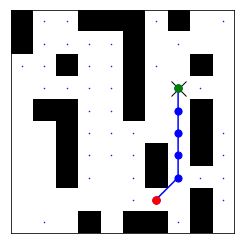

1475
Prediction time:  0.06865309600004821
Reconstruction time:  0.0006987440000330025
ground truth path
predicted path


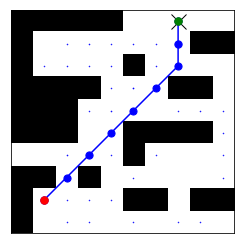

1476
Prediction time:  0.37477651500000775
Reconstruction time:  0.0008161859999518128
ground truth path
predicted path


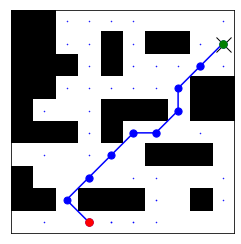

1477
Prediction time:  0.07050750300004438
Reconstruction time:  0.0008273800000324627
ground truth path
predicted path


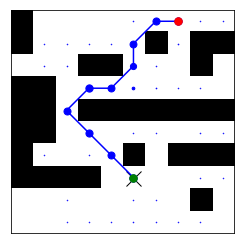

1478
Prediction time:  0.07101273999990099
Reconstruction time:  0.0007503629999519035
ground truth path
predicted path


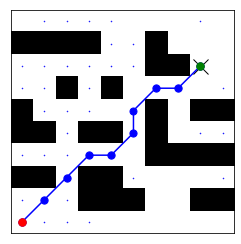

1479
Prediction time:  0.0711225470000727
Reconstruction time:  0.0009601400000747162
ground truth path
predicted path


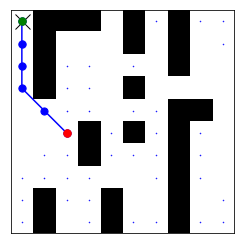

1480
Prediction time:  0.07160737200001677
Reconstruction time:  0.0006233379999684985
ground truth path
predicted path


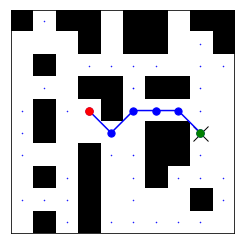

1481
Prediction time:  0.07048268599999119
Reconstruction time:  0.0007795399999395158
ground truth path
predicted path


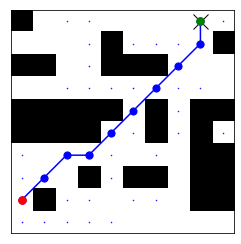

1482
Prediction time:  0.07142261299998154
Reconstruction time:  0.0008650040000475201
ground truth path
predicted path


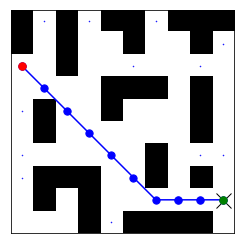

1483
Prediction time:  0.06762261700009731
Reconstruction time:  0.002283576999957404
ground truth path
predicted path


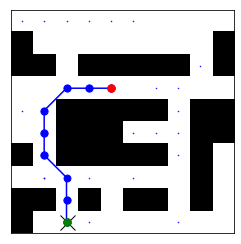

1484
Prediction time:  0.07333329000005051
Reconstruction time:  0.0007432449999669188
ground truth path
predicted path


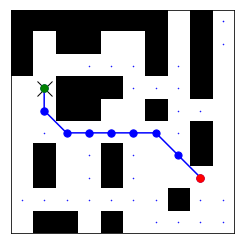

1485
Prediction time:  0.07432659099993089
Reconstruction time:  0.0009709170000178347
ground truth path
predicted path


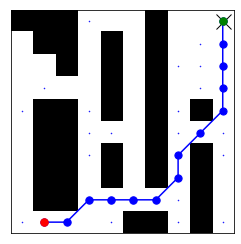

1486
Prediction time:  0.07045531300002494
Reconstruction time:  0.0009620739999718353
ground truth path
predicted path


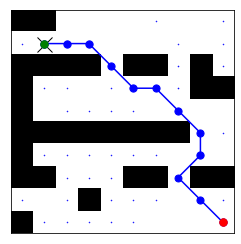

1487
Prediction time:  0.07476853200000733
Reconstruction time:  0.0006331270000146105
ground truth path
predicted path


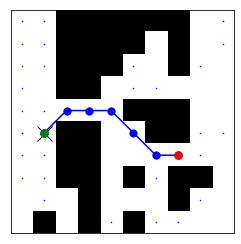

1488
Prediction time:  0.07162585899993701
Reconstruction time:  0.0010595449999755147
ground truth path
predicted path


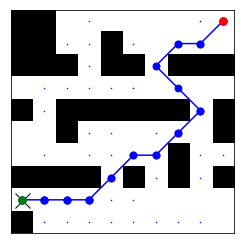

1489
Prediction time:  0.08293060800008334
Reconstruction time:  0.0009299490000103106
ground truth path
predicted path


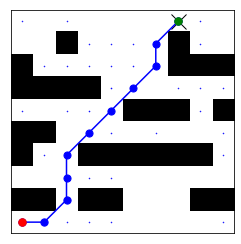

1490
Prediction time:  0.07170638000002327
Reconstruction time:  0.001995546000102877
ground truth path
predicted path


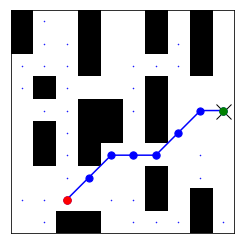

1491
Prediction time:  0.07150470900000983
Reconstruction time:  0.0008237819999976637
ground truth path
predicted path


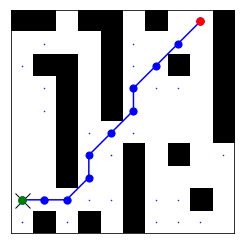

1492
Prediction time:  0.06850122200000897
Reconstruction time:  0.0007899470000438669
ground truth path
predicted path


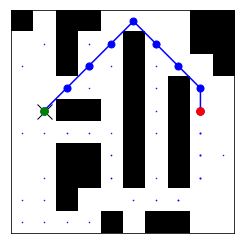

1493
Prediction time:  0.07091250700000273
Reconstruction time:  0.0008211780000237923
ground truth path
predicted path


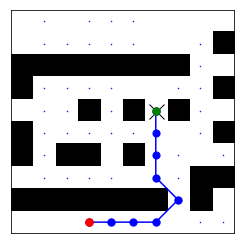

1494
Prediction time:  0.36996353299991824
Reconstruction time:  0.000819742999965456
ground truth path
predicted path


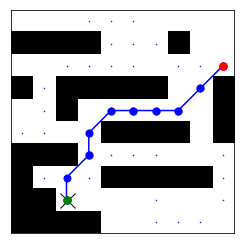

1495
Prediction time:  0.07075851699994473
Reconstruction time:  0.000933041000052981
ground truth path
predicted path


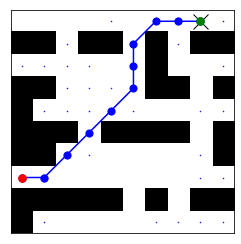

1496
Prediction time:  0.07030085200005942
Reconstruction time:  0.0007839939999030321
ground truth path
predicted path


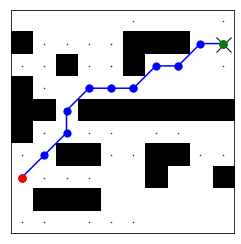

1497
Prediction time:  0.07075499600000512
Reconstruction time:  0.0006799460001047919
ground truth path
predicted path


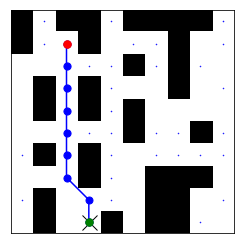

1498
Prediction time:  0.0706883340000104
Reconstruction time:  0.0004885280000053172
ground truth path
predicted path


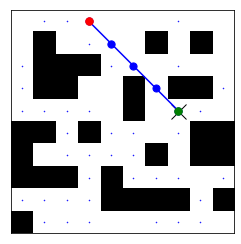

1499
Prediction time:  0.07191542900000059
Reconstruction time:  0.0009492299999465104
ground truth path
predicted path


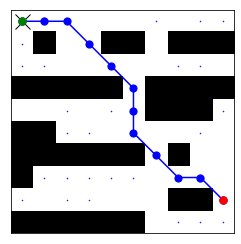

1500
Prediction time:  0.0701335989999734
Reconstruction time:  0.0007129829999712456
ground truth path
predicted path


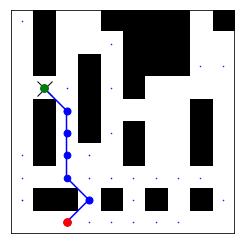

1501
Prediction time:  0.07230634199993347
Reconstruction time:  0.0009512579999864101
ground truth path
predicted path


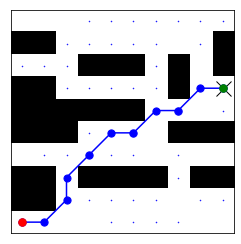

1502
Prediction time:  0.06955158599998867
Reconstruction time:  0.0011150650000217865
ground truth path
predicted path


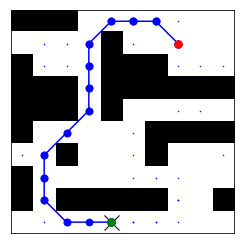

1503
Prediction time:  0.06912793000003603
Reconstruction time:  0.0008826400000998547
ground truth path
predicted path


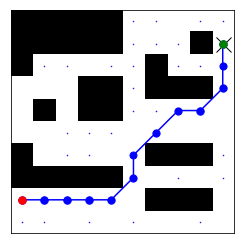

1504
Prediction time:  0.06973354800004472
Reconstruction time:  0.0008675689999790848
ground truth path
predicted path


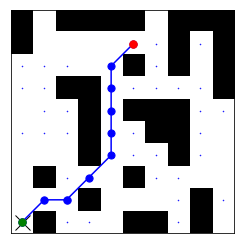

1505
Prediction time:  0.07543909799994708
Reconstruction time:  0.0024479149999478977
ground truth path
predicted path


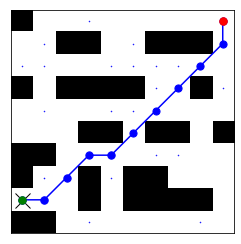

1506
Prediction time:  0.07200825799998256
Reconstruction time:  0.000768970999956764
ground truth path
predicted path


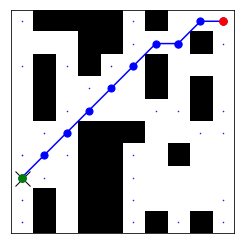

1507
Prediction time:  0.06997990899992601
Reconstruction time:  0.0006361189999779526
ground truth path
predicted path


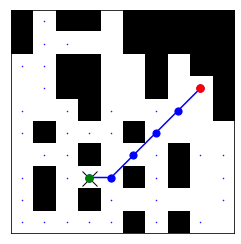

1508
Prediction time:  0.06934699800001454
Reconstruction time:  0.0009090470000501227
ground truth path
predicted path


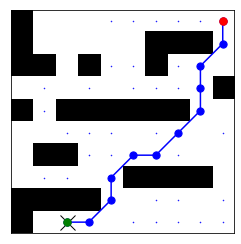

1509
Prediction time:  0.06804619499996534
Reconstruction time:  0.0006271889999425184
ground truth path
predicted path


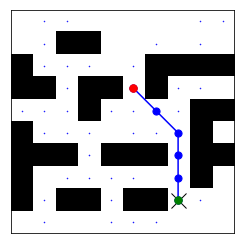

1510
Prediction time:  0.07601397700000234
Reconstruction time:  0.0006555879999723402
ground truth path
predicted path


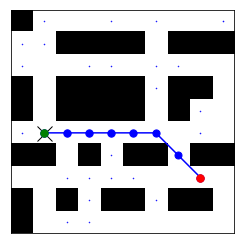

1511
Prediction time:  0.07529494000004888
Reconstruction time:  0.0007977019999998447
ground truth path
predicted path


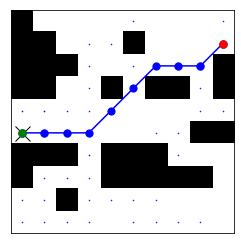

1512
Prediction time:  0.36732145799999216
Reconstruction time:  0.0009465279999858467
ground truth path
predicted path


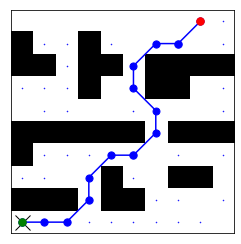

1513
Prediction time:  0.07533406599998216
Reconstruction time:  0.0008110489999353376
ground truth path
predicted path


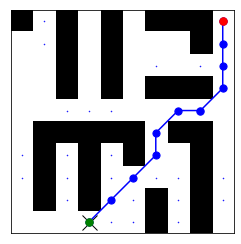

1514
Prediction time:  0.07135422399994695
Reconstruction time:  0.0007781550000345305
ground truth path
predicted path


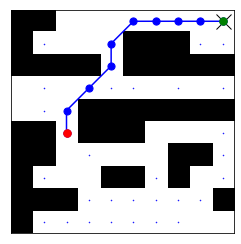

1515
Prediction time:  0.07107439300000351
Reconstruction time:  0.0008055079999849113
ground truth path
predicted path


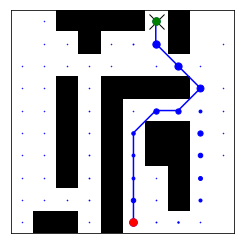

1516
Prediction time:  0.06931005000001278
Reconstruction time:  0.0008832869999650939
ground truth path
predicted path


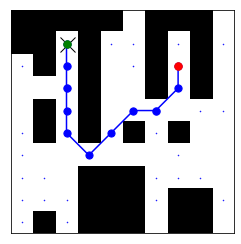

1517
Prediction time:  0.06927578600004836
Reconstruction time:  0.0008159950000390381
ground truth path
predicted path


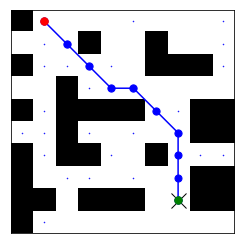

1518
Prediction time:  0.07316418200002772
Reconstruction time:  0.0009402819999877465
ground truth path
predicted path


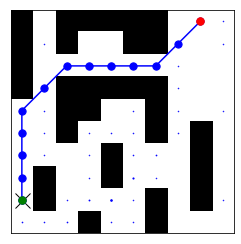

1519
Prediction time:  0.0698230139998941
Reconstruction time:  0.002261746999920433
ground truth path
predicted path


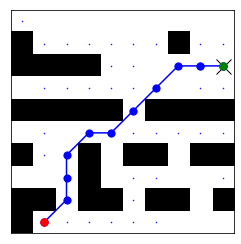

1520
Prediction time:  0.06929511900000307
Reconstruction time:  0.0006823230000918556
ground truth path
predicted path


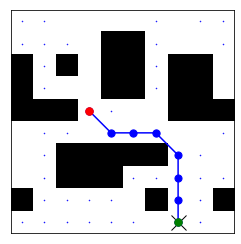

1521
Prediction time:  0.06857537200005481
Reconstruction time:  0.0008284950000643221
ground truth path
predicted path


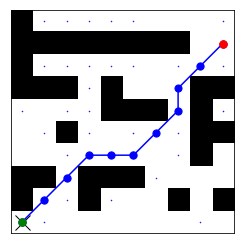

1522
Prediction time:  0.06785310400005073
Reconstruction time:  0.0008101229999510906
ground truth path
predicted path


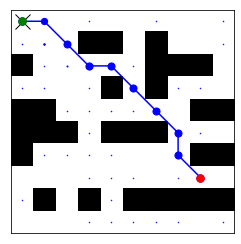

1523
Prediction time:  0.06950617600000442
Reconstruction time:  0.00088334899999154
ground truth path
predicted path


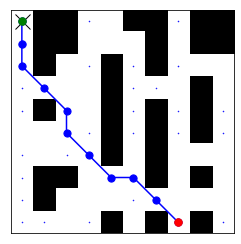

1524
Prediction time:  0.06864749700002903
Reconstruction time:  0.0008561390000068059
ground truth path
predicted path


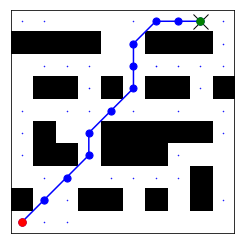

1525
Prediction time:  0.07169829899999058
Reconstruction time:  0.0007839669999611942
ground truth path
predicted path


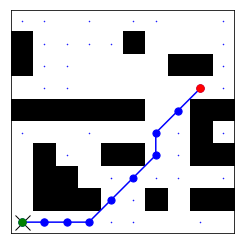

1526
Prediction time:  0.07124095100004979
Reconstruction time:  0.0005647799999906056
ground truth path
predicted path


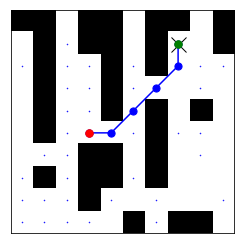

1527
Prediction time:  0.0697142230000054
Reconstruction time:  0.0008887260000847164
ground truth path
predicted path


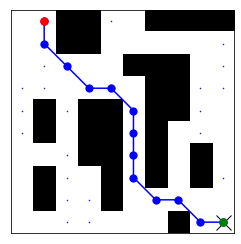

1528
Prediction time:  0.07439476000001832
Reconstruction time:  0.0007925679999516433
ground truth path
predicted path


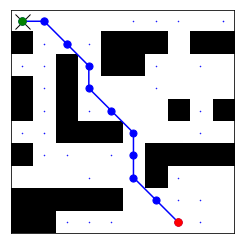

1529
Prediction time:  0.3860402250001016
Reconstruction time:  0.0020996189999777926
ground truth path
predicted path


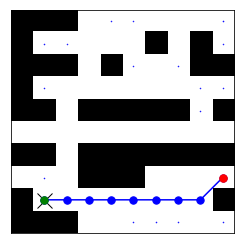

1530
Prediction time:  0.07320052099998975
Reconstruction time:  0.000837664000073346
ground truth path
predicted path


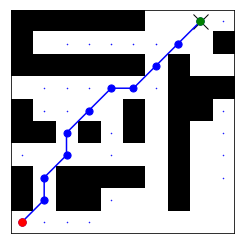

1531
Prediction time:  0.07469814000000952
Reconstruction time:  0.0006041440000217335
ground truth path
predicted path


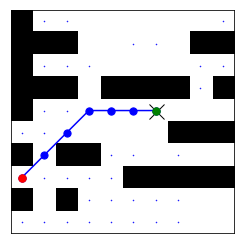

1532
Prediction time:  0.06900953500007745
Reconstruction time:  0.0008608230000390904
ground truth path
predicted path


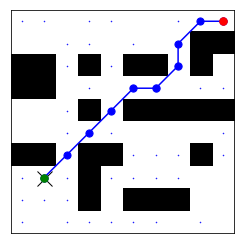

1533
Prediction time:  0.07225623899989841
Reconstruction time:  0.0009056199999122327
ground truth path
predicted path


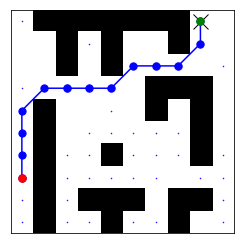

1534
Prediction time:  0.07311540799992144
Reconstruction time:  0.0010409079999362802
ground truth path
predicted path


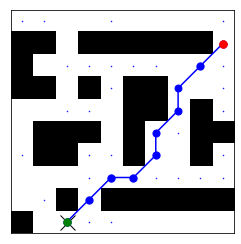

1535
Prediction time:  0.07307772599995133
Reconstruction time:  0.0007348560000082216
ground truth path
predicted path


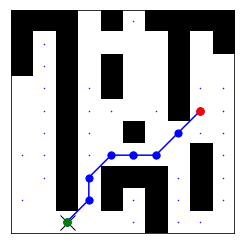

1536
Prediction time:  0.07807476300001781
Reconstruction time:  0.0008772529999987455
ground truth path
predicted path


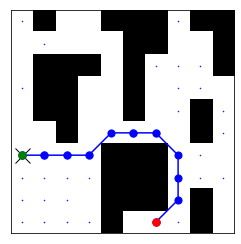

1537
Prediction time:  0.07053245999998126
Reconstruction time:  0.0016790530000889703
ground truth path
predicted path


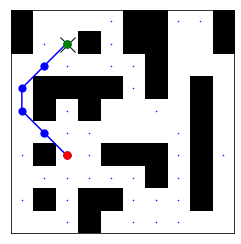

1538
Prediction time:  0.07702946500000962
Reconstruction time:  0.0009477029999516162
ground truth path
predicted path


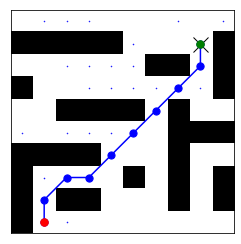

1539
Prediction time:  0.07265521300007549
Reconstruction time:  0.0008394890001000022
ground truth path
predicted path


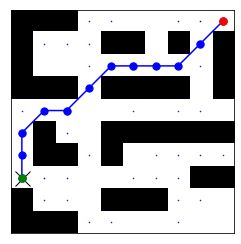

1540
Prediction time:  0.07305925799994384
Reconstruction time:  0.002135819000045558
ground truth path
predicted path


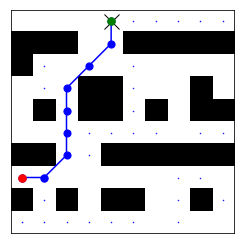

1541
Prediction time:  0.07148723700004211
Reconstruction time:  0.0007520369999838294
ground truth path
predicted path


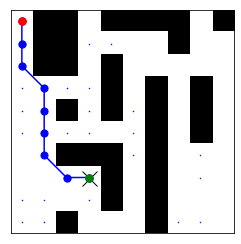

1542
Prediction time:  0.0722785059999751
Reconstruction time:  0.0008082470000090325
ground truth path
predicted path


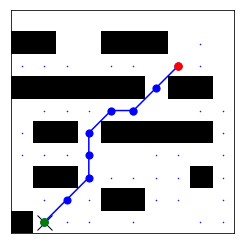

1543
Prediction time:  0.06824531500001285
Reconstruction time:  0.0007851809999692705
ground truth path
predicted path


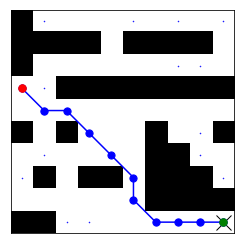

1544
Prediction time:  0.06786934600006589
Reconstruction time:  0.0007124480000584299
ground truth path
predicted path


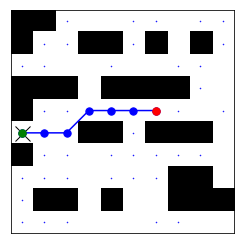

1545
Prediction time:  0.06792715400001725
Reconstruction time:  0.0020056859999613152
ground truth path
predicted path


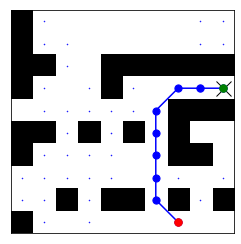

1546
Prediction time:  0.07253545899993696
Reconstruction time:  0.0007377639999504026
ground truth path
predicted path


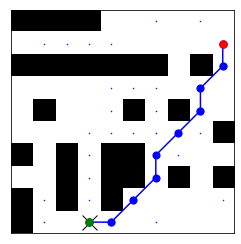

1547
Prediction time:  0.38955707200000234
Reconstruction time:  0.0008471109999845794
ground truth path
predicted path


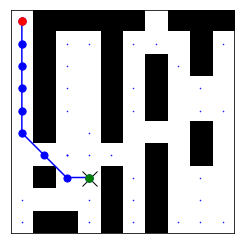

1548
Prediction time:  0.07238236400007736
Reconstruction time:  0.0011415270000725286
ground truth path
predicted path


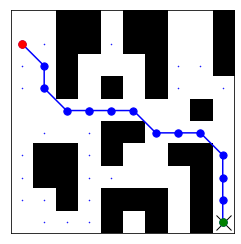

1549
Prediction time:  0.06963886599999114
Reconstruction time:  0.0009572379999553959
ground truth path
predicted path


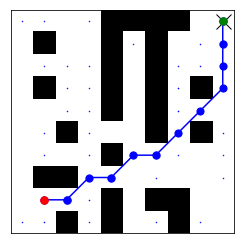

1550
Prediction time:  0.07041804099992532
Reconstruction time:  0.0007075160000340475
ground truth path
predicted path


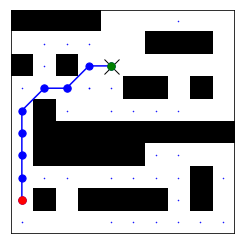

1551
Prediction time:  0.0701815870000928
Reconstruction time:  0.0009389950000695535
ground truth path
predicted path


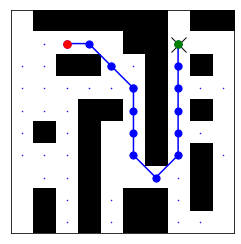

1552
Prediction time:  0.07233857200003513
Reconstruction time:  0.0006471479999845542
ground truth path
predicted path


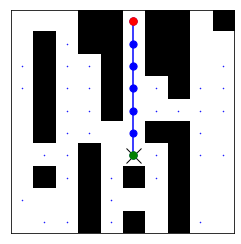

1553
Prediction time:  0.06869381500007421
Reconstruction time:  0.0007442340000807235
ground truth path
predicted path


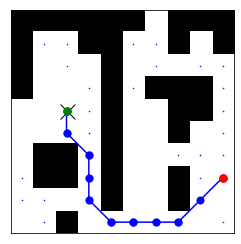

1554
Prediction time:  0.06958080399999744
Reconstruction time:  0.000853584000083174
ground truth path
predicted path


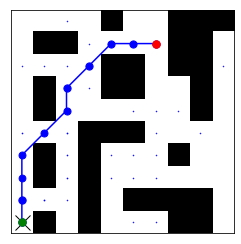

1555
Prediction time:  0.06866507099994124
Reconstruction time:  0.0009455590000015945
ground truth path
predicted path


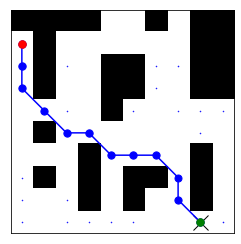

1556
Prediction time:  0.06835570299995197
Reconstruction time:  0.0008108499999934793
ground truth path
predicted path


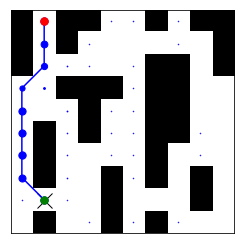

1557
Prediction time:  0.06710726799997246
Reconstruction time:  0.0007578890000559113
ground truth path
predicted path


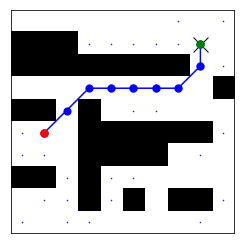

1558
Prediction time:  0.06773393299999952
Reconstruction time:  0.002012139999919782
ground truth path
predicted path


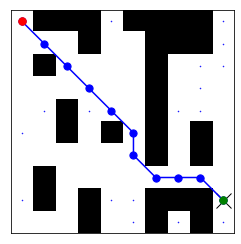

1559
Prediction time:  0.06607989600001929
Reconstruction time:  0.000615582000023096
ground truth path
predicted path


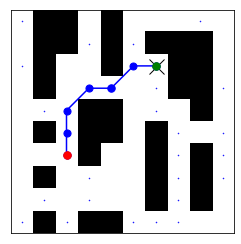

1560
Prediction time:  0.07135721999998168
Reconstruction time:  0.0005882979999114468
ground truth path
predicted path


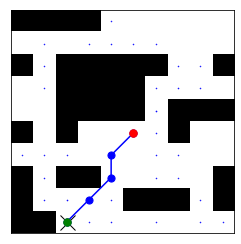

1561
Prediction time:  0.07457570599990504
Reconstruction time:  0.0005404400000088572
ground truth path
predicted path


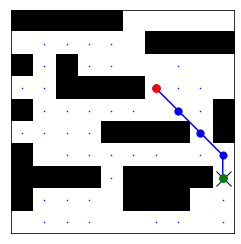

1562
Prediction time:  0.07009610199997951
Reconstruction time:  0.0008828109999967637
ground truth path
predicted path


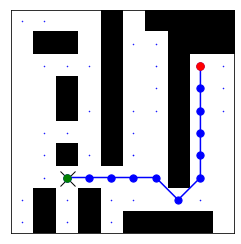

1563
Prediction time:  0.06905760400002237
Reconstruction time:  0.002088202999971145
ground truth path
predicted path


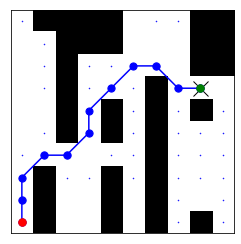

1564
Prediction time:  0.06869968900002732
Reconstruction time:  0.0006999580000410788
ground truth path
predicted path


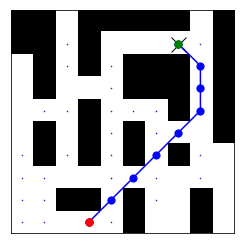

1565
Prediction time:  0.3692234750000125
Reconstruction time:  0.0007528920000368089
ground truth path
predicted path


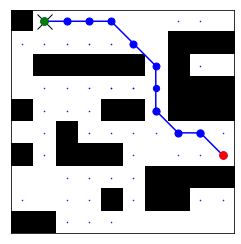

1566
Prediction time:  0.07148507100009738
Reconstruction time:  0.0006872870000051989
ground truth path
predicted path


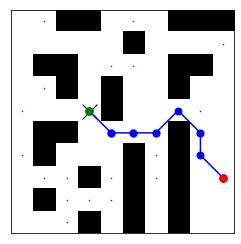

1567
Prediction time:  0.0689917569999352
Reconstruction time:  0.0009112960000265957
ground truth path
predicted path


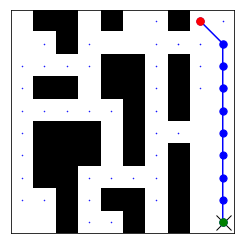

1568
Prediction time:  0.07221685800004707
Reconstruction time:  0.0010806049999700917
ground truth path
predicted path


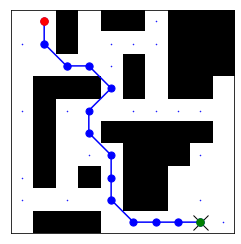

1569
Prediction time:  0.07030735199998617
Reconstruction time:  0.0009266100000786537
ground truth path
predicted path


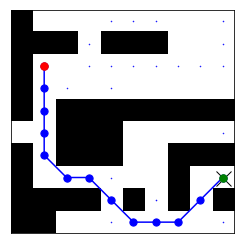

1570
Prediction time:  0.06822044800003368
Reconstruction time:  0.0005586660000744814
ground truth path
predicted path


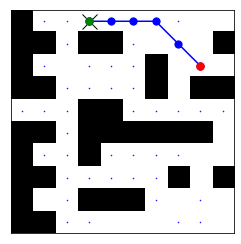

1571
Prediction time:  0.07010729000000993
Reconstruction time:  0.0008067349999691942
ground truth path
predicted path


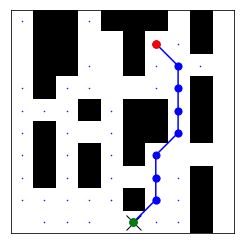

1572
Prediction time:  0.06978470499996092
Reconstruction time:  0.0008593049999490177
ground truth path
predicted path


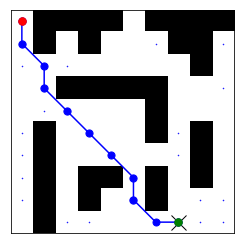

1573
Prediction time:  0.06973219399992558
Reconstruction time:  0.002281968000033885
ground truth path
predicted path


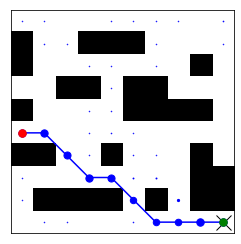

1574
Prediction time:  0.0686634099999992
Reconstruction time:  0.0006254899999476038
ground truth path
predicted path


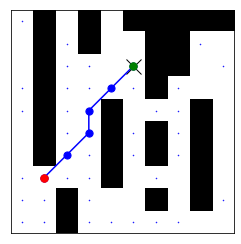

1575
Prediction time:  0.06968570699996235
Reconstruction time:  0.000820656999962921
ground truth path
predicted path


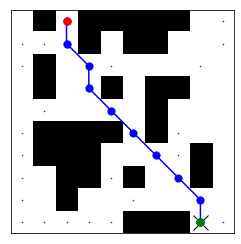

1576
Prediction time:  0.06790736699997524
Reconstruction time:  0.0005529459999706887
ground truth path
predicted path


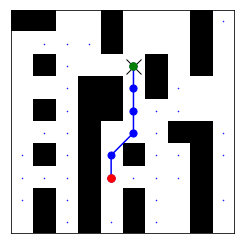

1577
Prediction time:  0.07051329700004771
Reconstruction time:  0.0005605300000297575
ground truth path
predicted path


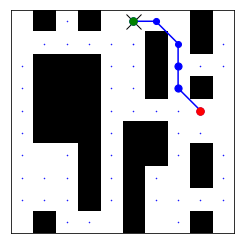

1578
Prediction time:  0.0716162029999623
Reconstruction time:  0.0006365609999647859
ground truth path
predicted path


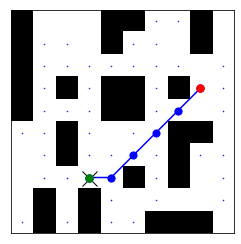

1579
Prediction time:  0.07352978000005805
Reconstruction time:  0.000898747000064759
ground truth path
predicted path


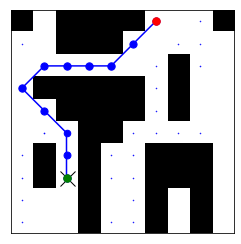

1580
Prediction time:  0.0725132620000295
Reconstruction time:  0.0008709989999715617
ground truth path
predicted path


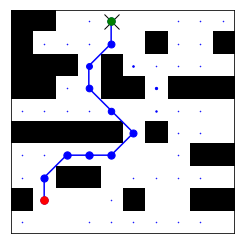

1581
Prediction time:  0.07061437599998044
Reconstruction time:  0.0008461200000056124
ground truth path
predicted path


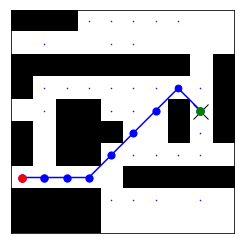

1582
Prediction time:  0.36394963400005054
Reconstruction time:  0.0008738669999956983
ground truth path
predicted path


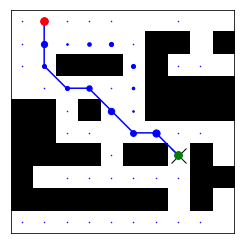

1583
Prediction time:  0.06986229800008914
Reconstruction time:  0.0007527120000077048
ground truth path
predicted path


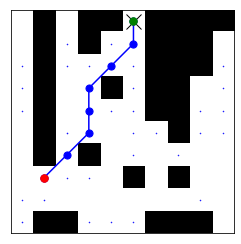

1584
Prediction time:  0.06861533400001463
Reconstruction time:  0.000805147999926703
ground truth path
predicted path


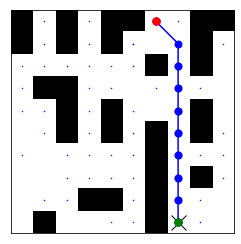

1585
Prediction time:  0.07678229400005421
Reconstruction time:  0.0009642420000091079
ground truth path
predicted path


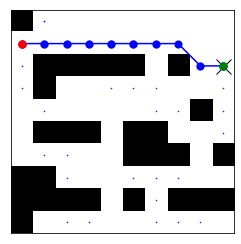

1586
Prediction time:  0.06786214900000687
Reconstruction time:  0.0008333939999829454
ground truth path
predicted path


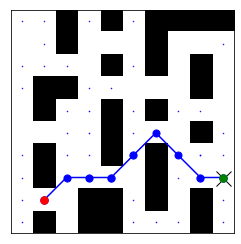

1587
Prediction time:  0.06633069999998042
Reconstruction time:  0.0008455390000108309
ground truth path
predicted path


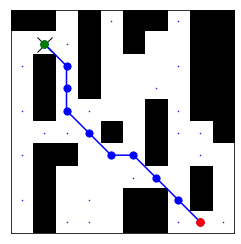

1588
Prediction time:  0.06811851800000568
Reconstruction time:  0.0008546469999828332
ground truth path
predicted path


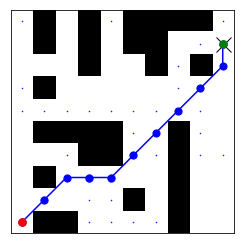

1589
Prediction time:  0.06701743499991153
Reconstruction time:  0.0008591829999886613
ground truth path
predicted path


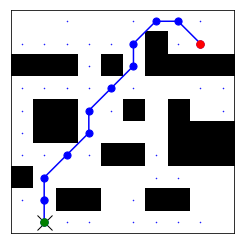

1590
Prediction time:  0.06575335600007293
Reconstruction time:  0.000624705000063841
ground truth path
predicted path


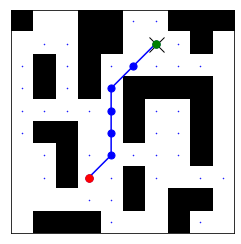

1591
Prediction time:  0.0659337870000627
Reconstruction time:  0.0009194169999773294
ground truth path
predicted path


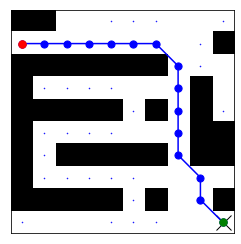

1592
Prediction time:  0.06994889400004922
Reconstruction time:  0.0008876510000845883
ground truth path
predicted path


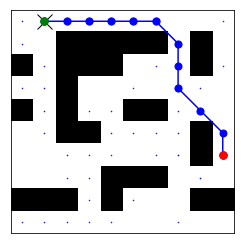

1593
Prediction time:  0.06465964599999552
Reconstruction time:  0.0007216220000145768
ground truth path
predicted path


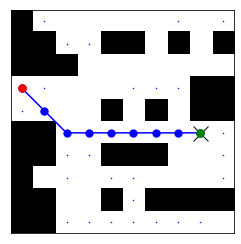

1594
Prediction time:  0.07032051900000624
Reconstruction time:  0.0009638090000407828
ground truth path
predicted path


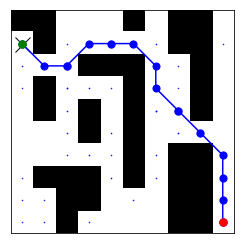

1595
Prediction time:  0.06889018999993368
Reconstruction time:  0.0005519960000128776
ground truth path
predicted path


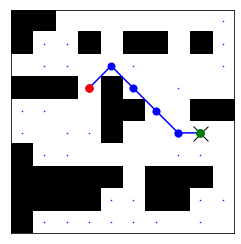

1596
Prediction time:  0.06903811600000154
Reconstruction time:  0.0007771610000872897
ground truth path
predicted path


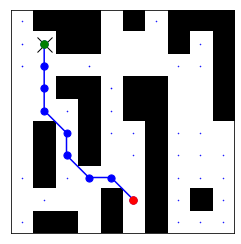

1597
Prediction time:  0.06384301600007802
Reconstruction time:  0.0007626139999956649
ground truth path
predicted path


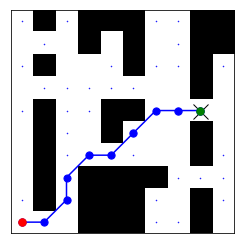

1598
Prediction time:  0.07120572899998479
Reconstruction time:  0.0014234330000135742
ground truth path
predicted path


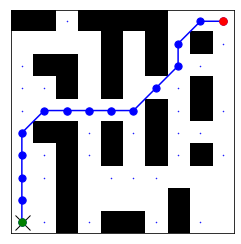

1599
Prediction time:  0.37127478799993696
Reconstruction time:  0.0006377640000891915
ground truth path
predicted path


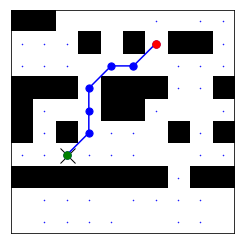

1600
Prediction time:  0.06786992599995756
Reconstruction time:  0.0006787910000412012
ground truth path
predicted path


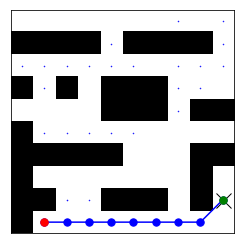

1601
Prediction time:  0.06741809699997248
Reconstruction time:  0.0008796289999963847
ground truth path
predicted path


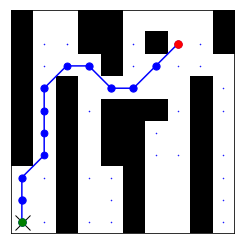

1602
Prediction time:  0.0665187419999711
Reconstruction time:  0.0006934540000429479
ground truth path
predicted path


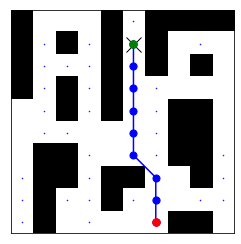

1603
Prediction time:  0.06645860599996922
Reconstruction time:  0.0009072589999732372
ground truth path
predicted path


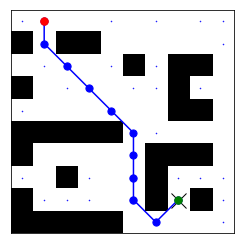

1604
Prediction time:  0.06879507899998316
Reconstruction time:  0.0006040680000296561
ground truth path
predicted path


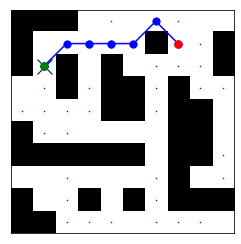

1605
Prediction time:  0.07114550200003578
Reconstruction time:  0.0007397409999612137
ground truth path
predicted path


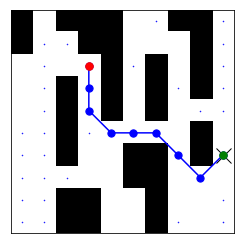

1606
Prediction time:  0.07332251500008624
Reconstruction time:  0.0007192030000169325
ground truth path
predicted path


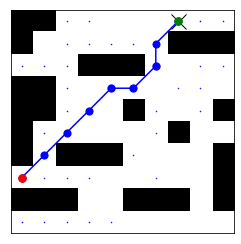

1607
Prediction time:  0.07434943900000235
Reconstruction time:  0.0006106350000436578
ground truth path
predicted path


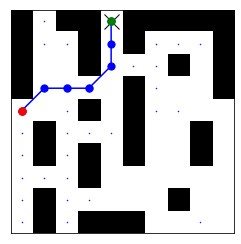

1608
Prediction time:  0.06979759699993338
Reconstruction time:  0.00058469900000091
ground truth path
predicted path


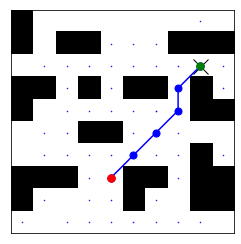

1609
Prediction time:  0.07332349099999647
Reconstruction time:  0.0007122759999447226
ground truth path
predicted path


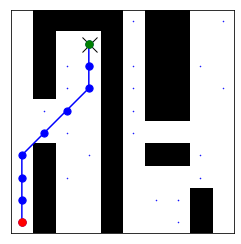

1610
Prediction time:  0.0741211970000677
Reconstruction time:  0.0007279270000708493
ground truth path
predicted path


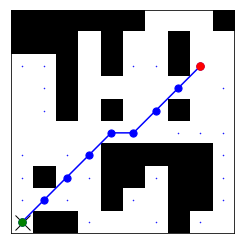

1611
Prediction time:  0.07618609500002549
Reconstruction time:  0.0009603409999954238
ground truth path
predicted path


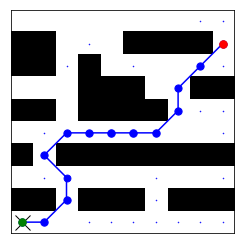

1612
Prediction time:  0.07117400200002066
Reconstruction time:  0.0006971349999957965
ground truth path
predicted path


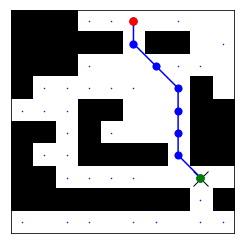

1613
Prediction time:  0.07057767000003423
Reconstruction time:  0.0007288409999546275
ground truth path
predicted path


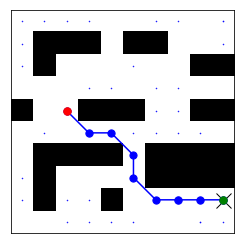

1614
Prediction time:  0.07573404799995842
Reconstruction time:  0.0006775979999247284
ground truth path
predicted path


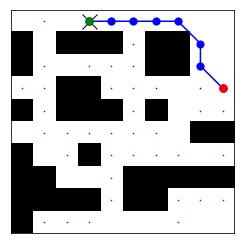

1615
Prediction time:  0.07370543700005783
Reconstruction time:  0.0008170190000100774
ground truth path
predicted path


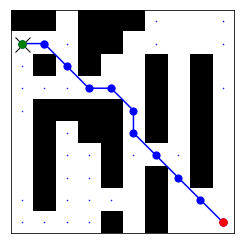

1616
Prediction time:  0.08499061600002733
Reconstruction time:  0.0006183950000604455
ground truth path
predicted path


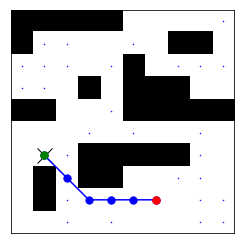

1617
Prediction time:  0.3919933150000361
Reconstruction time:  0.0008889709999948536
ground truth path
predicted path


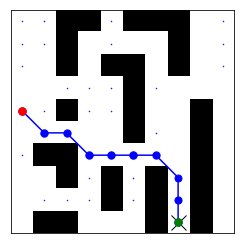

1618
Prediction time:  0.07493464100002711
Reconstruction time:  0.0009739710000076229
ground truth path
predicted path


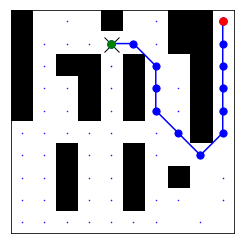

1619
Prediction time:  0.0653989789999514
Reconstruction time:  0.0008798409999144496
ground truth path
predicted path


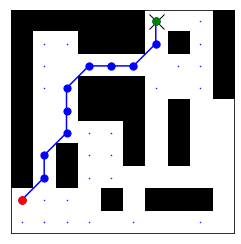

1620
Prediction time:  0.06504170499999873
Reconstruction time:  0.0005608999999822117
ground truth path
predicted path


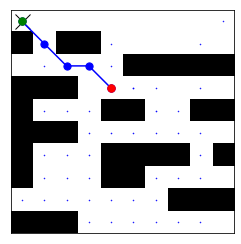

1621
Prediction time:  0.06625828200003525
Reconstruction time:  0.0008781139999882726
ground truth path
predicted path


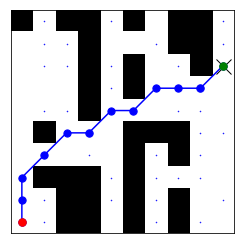

1622
Prediction time:  0.06894067500002166
Reconstruction time:  0.0008022369999025614
ground truth path
predicted path


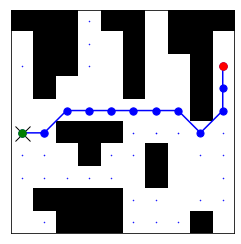

1623
Prediction time:  0.06444658199995956
Reconstruction time:  0.0008284489999823563
ground truth path
predicted path


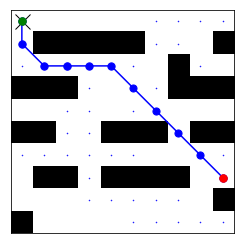

1624
Prediction time:  0.06798526299996865
Reconstruction time:  0.0005273059999808538
ground truth path
predicted path


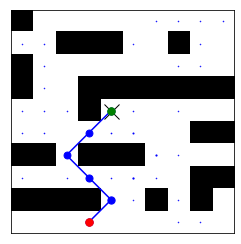

1625
Prediction time:  0.06642625200004204
Reconstruction time:  0.0007422289999112763
ground truth path
predicted path


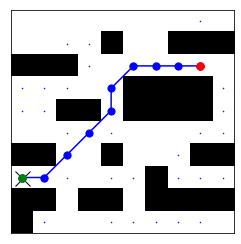

1626
Prediction time:  0.07102941200002988
Reconstruction time:  0.0007824140000138868
ground truth path
predicted path


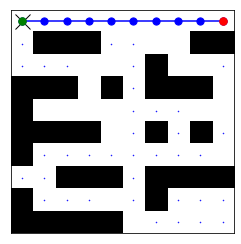

1627
Prediction time:  0.06836459700002706
Reconstruction time:  0.000886992999994618
ground truth path
predicted path


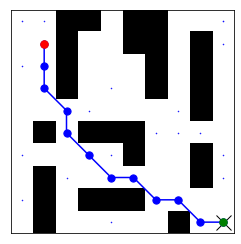

1628
Prediction time:  0.06796436299998732
Reconstruction time:  0.0005768629999920449
ground truth path
predicted path


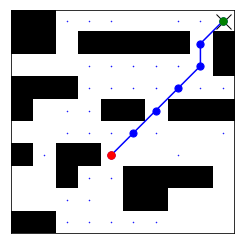

1629
Prediction time:  0.06952004300001136
Reconstruction time:  0.0008049730000720956
ground truth path
predicted path


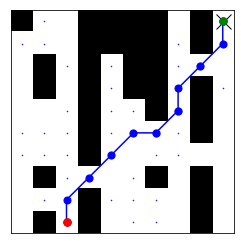

1630
Prediction time:  0.06633884199993645
Reconstruction time:  0.0008686919999263409
ground truth path
predicted path


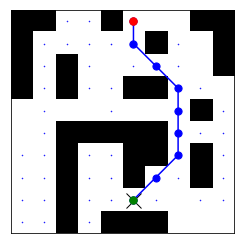

1631
Prediction time:  0.0725089449999814
Reconstruction time:  0.0011966619999839168
ground truth path
predicted path


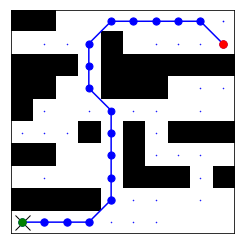

1632
Prediction time:  0.06648216700000376
Reconstruction time:  0.0008978969999589026
ground truth path
predicted path


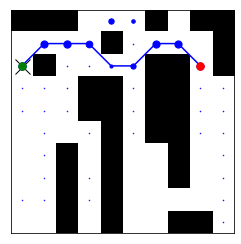

1633
Prediction time:  0.06728422100002263
Reconstruction time:  0.0008505509999849892
ground truth path
predicted path


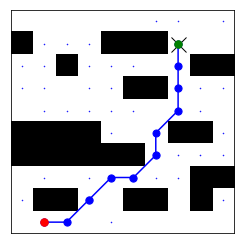

1634
Prediction time:  0.38108988499993757
Reconstruction time:  0.0007784480000054828
ground truth path
predicted path


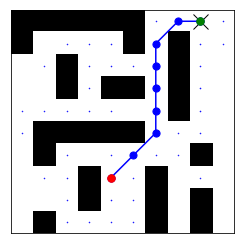

1635
Prediction time:  0.06898949300000368
Reconstruction time:  0.0006186120000393203
ground truth path
predicted path


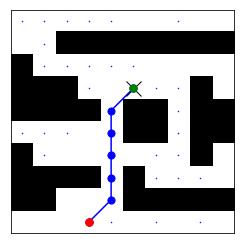

1636
Prediction time:  0.06854891899990889
Reconstruction time:  0.0008084720000169909
ground truth path
predicted path


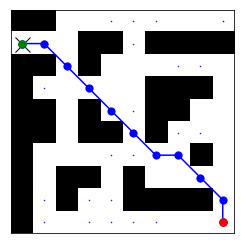

1637
Prediction time:  0.07377138699996522
Reconstruction time:  0.000646672000016224
ground truth path
predicted path


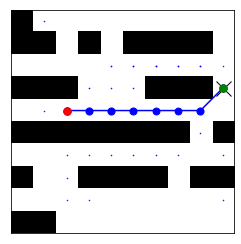

1638
Prediction time:  0.07504997399996682
Reconstruction time:  0.0008528959999694052
ground truth path
predicted path


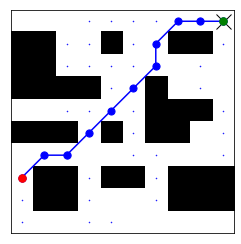

1639
Prediction time:  0.06759798099994896
Reconstruction time:  0.0007519129999309371
ground truth path
predicted path


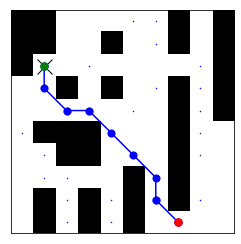

1640
Prediction time:  0.0701314390000789
Reconstruction time:  0.0008332419999987906
ground truth path
predicted path


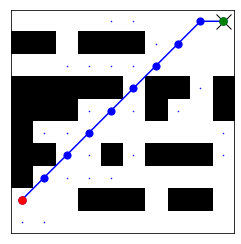

1641
Prediction time:  0.07324412200000552
Reconstruction time:  0.0008393460000206687
ground truth path
predicted path


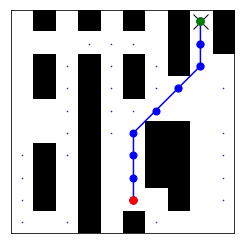

1642
Prediction time:  0.06994503999999324
Reconstruction time:  0.0006832829999439127
ground truth path
predicted path


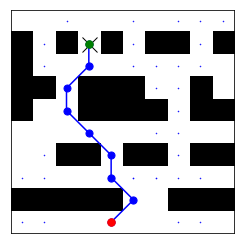

1643
Prediction time:  0.071493427000064
Reconstruction time:  0.0009408880000592035
ground truth path
predicted path


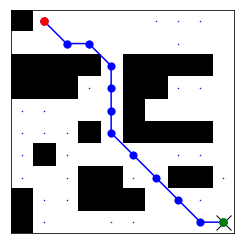

1644
Prediction time:  0.07080343500001618
Reconstruction time:  0.0008487510000350085
ground truth path
predicted path


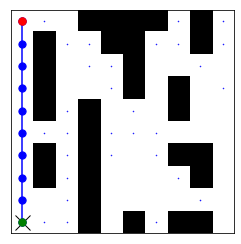

1645
Prediction time:  0.07076522099998783
Reconstruction time:  0.0008740929999930813
ground truth path
predicted path


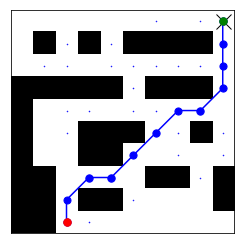

1646
Prediction time:  0.07252949900009753
Reconstruction time:  0.001011752000067645
ground truth path
predicted path


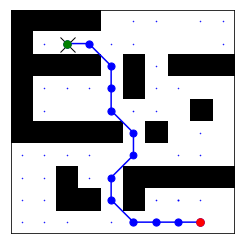

1647
Prediction time:  0.06748630899994623
Reconstruction time:  0.0011210500000515822
ground truth path
predicted path


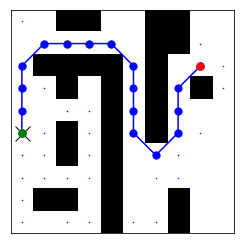

1648
Prediction time:  0.0706232769999815
Reconstruction time:  0.0007069400001000758
ground truth path
predicted path


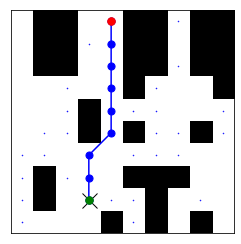

1649
Prediction time:  0.06888153500005956
Reconstruction time:  0.0007702049999807059
ground truth path
predicted path


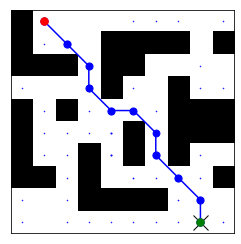

1650
Prediction time:  0.06935056800000439
Reconstruction time:  0.0006194369999548144
ground truth path
predicted path


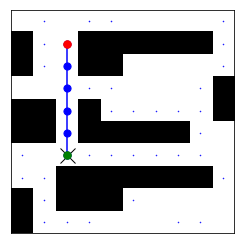

1651
Prediction time:  0.07426691499995286
Reconstruction time:  0.000675640999929783
ground truth path
predicted path


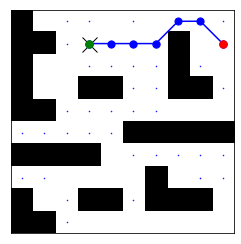

1652
Prediction time:  0.3683175819999178
Reconstruction time:  0.0008463929999606989
ground truth path
predicted path


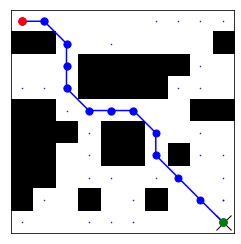

1653
Prediction time:  0.07026337599995713
Reconstruction time:  0.0006390140000576139
ground truth path
predicted path


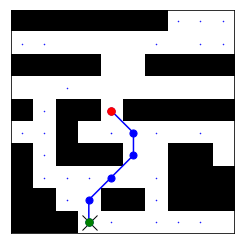

1654
Prediction time:  0.0696486609999738
Reconstruction time:  0.0008574490000228252
ground truth path
predicted path


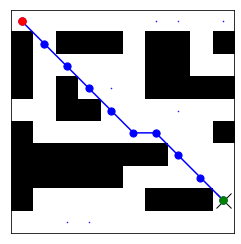

1655
Prediction time:  0.0668984779999846
Reconstruction time:  0.0010263409999424766
ground truth path
predicted path


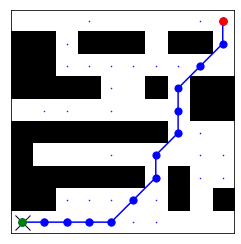

1656
Prediction time:  0.07426377900003445
Reconstruction time:  0.0005535109999073029
ground truth path
predicted path


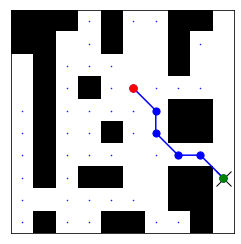

1657
Prediction time:  0.06919854799991754
Reconstruction time:  0.000813344999983201
ground truth path
predicted path


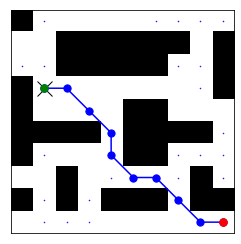

1658
Prediction time:  0.07879963400000634
Reconstruction time:  0.001073206000000937
ground truth path
predicted path


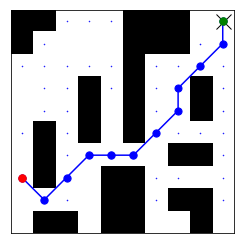

1659
Prediction time:  0.07094074799999817
Reconstruction time:  0.0005501079999703506
ground truth path
predicted path


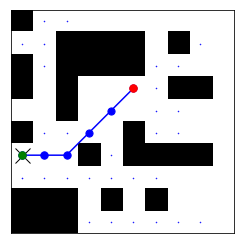

1660
Prediction time:  0.07084081000004971
Reconstruction time:  0.0007000980000384516
ground truth path
predicted path


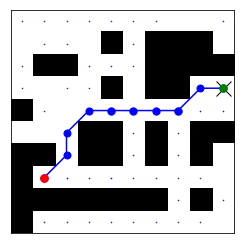

1661
Prediction time:  0.07565674599993599
Reconstruction time:  0.0009923269999490003
ground truth path
predicted path


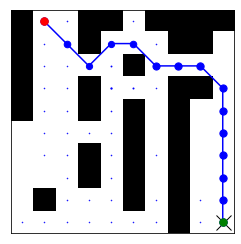

1662
Prediction time:  0.06991006799989918
Reconstruction time:  0.0007038410000177464
ground truth path
predicted path


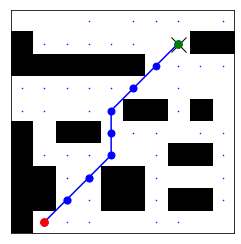

1663
Prediction time:  0.07390271899998879
Reconstruction time:  0.0007299379999494704
ground truth path
predicted path


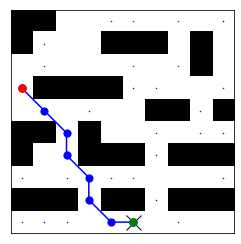

1664
Prediction time:  0.07014029699996627
Reconstruction time:  0.0006079859999772452
ground truth path
predicted path


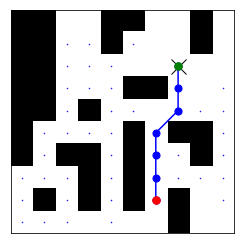

1665
Prediction time:  0.07324567800003479
Reconstruction time:  0.0008717380000007324
ground truth path
predicted path


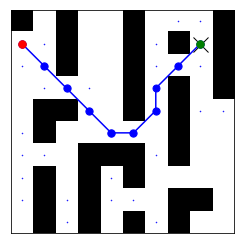

1666
Prediction time:  0.07413776700002472
Reconstruction time:  0.0007288799999969342
ground truth path
predicted path


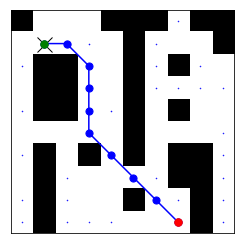

1667
Prediction time:  0.06884228399997028
Reconstruction time:  0.0009019289999514513
ground truth path
predicted path


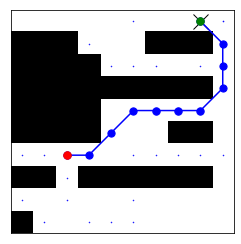

1668
Prediction time:  0.07290396999997029
Reconstruction time:  0.0007630479999534145
ground truth path
predicted path


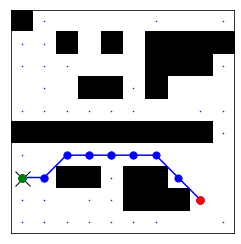

1669
Prediction time:  0.07534429800000453
Reconstruction time:  0.0008333079999829351
ground truth path
predicted path


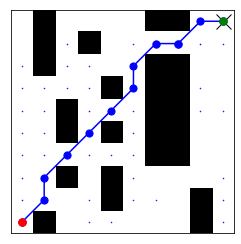

1670
Prediction time:  0.38549853899996833
Reconstruction time:  0.0005886810000674814
ground truth path
predicted path


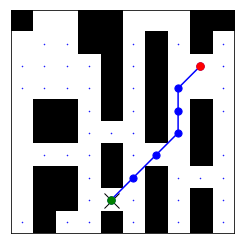

1671
Prediction time:  0.07131034599990471
Reconstruction time:  0.000606476000029943
ground truth path
predicted path


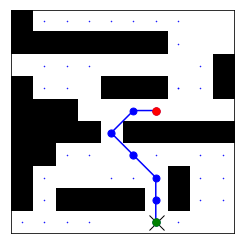

1672
Prediction time:  0.07129591000000346
Reconstruction time:  0.0018113649999804693
ground truth path
predicted path


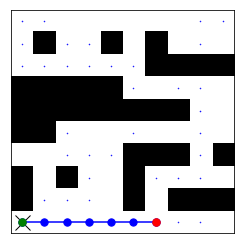

1673
Prediction time:  0.0690637659999993
Reconstruction time:  0.0009641120000196679
ground truth path
predicted path


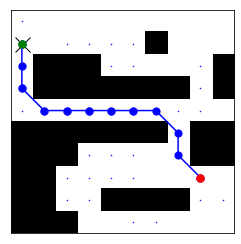

1674
Prediction time:  0.0669143919999442
Reconstruction time:  0.0020099380000146994
ground truth path
predicted path


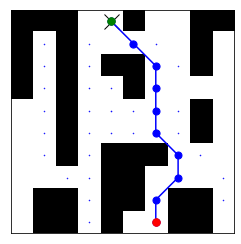

1675
Prediction time:  0.07892077900010008
Reconstruction time:  0.0008433230000264302
ground truth path
predicted path


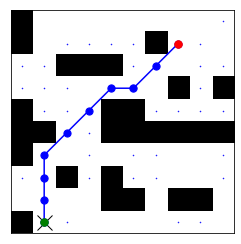

1676
Prediction time:  0.07358828699989317
Reconstruction time:  0.0008729269999321332
ground truth path
predicted path


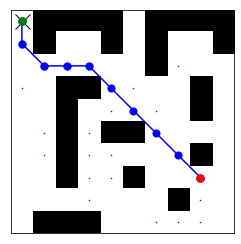

1677
Prediction time:  0.07190590999994129
Reconstruction time:  0.000661772000057681
ground truth path
predicted path


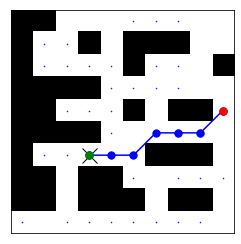

1678
Prediction time:  0.0682201529999702
Reconstruction time:  0.00084295099998144
ground truth path
predicted path


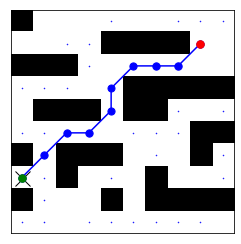

1679
Prediction time:  0.07135673699997369
Reconstruction time:  0.0008906549999210256
ground truth path
predicted path


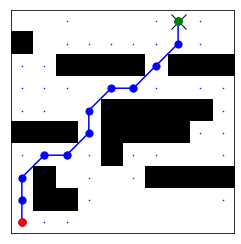

1680
Prediction time:  0.06857371199998852
Reconstruction time:  0.0027961829999867405
ground truth path
predicted path


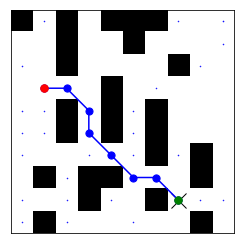

1681
Prediction time:  0.07404386899997917
Reconstruction time:  0.0009063630000127887
ground truth path
predicted path


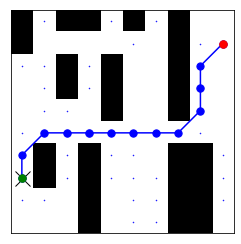

1682
Prediction time:  0.07104580099996838
Reconstruction time:  0.0008531019999509226
ground truth path
predicted path


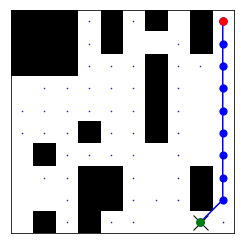

1683
Prediction time:  0.07135219799999959
Reconstruction time:  0.0007904870000174924
ground truth path
predicted path


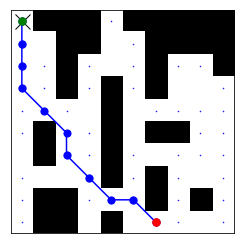

1684
Prediction time:  0.07022221700003684
Reconstruction time:  0.0007921989999886137
ground truth path
predicted path


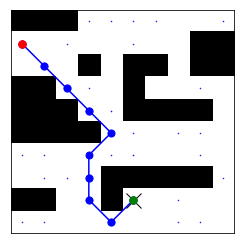

1685
Prediction time:  0.07067093400007707
Reconstruction time:  0.0005842000000484404
ground truth path
predicted path


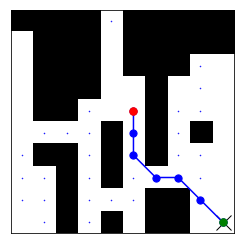

1686
Prediction time:  0.07192085100007262
Reconstruction time:  0.0009476440000071307
ground truth path
predicted path


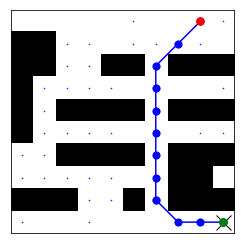

1687
Prediction time:  0.3739186330000166
Reconstruction time:  0.0010048489999689991
ground truth path
predicted path


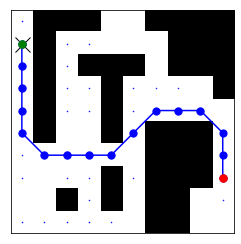

1688
Prediction time:  0.07354679399998076
Reconstruction time:  0.0006414059999997335
ground truth path
predicted path


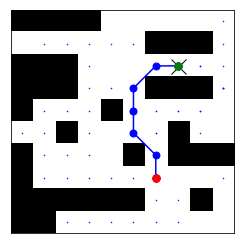

1689
Prediction time:  0.06735285399997792
Reconstruction time:  0.0007262350000019069
ground truth path
predicted path


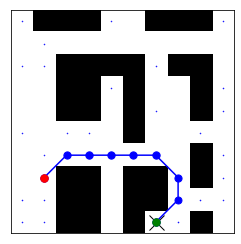

1690
Prediction time:  0.06884515399997326
Reconstruction time:  0.000779092000016135
ground truth path
predicted path


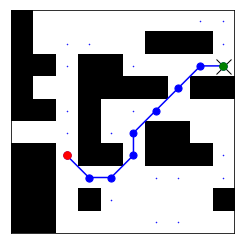

1691
Prediction time:  0.07052954699997827
Reconstruction time:  0.0008512960000643943
ground truth path
predicted path


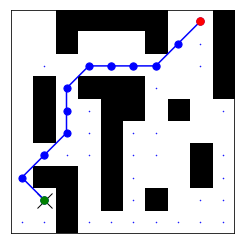

1692
Prediction time:  0.07244130999993104
Reconstruction time:  0.0009008499999936248
ground truth path
predicted path


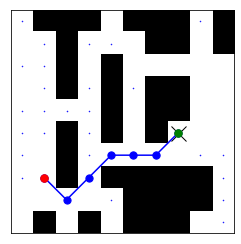

1693
Prediction time:  0.07223014099997727
Reconstruction time:  0.0021321399999578716
ground truth path
predicted path


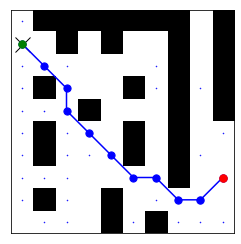

1694
Prediction time:  0.0700148780000518
Reconstruction time:  0.0005635889999666688
ground truth path
predicted path


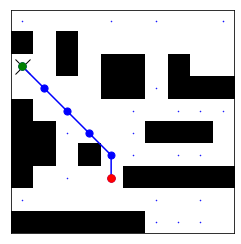

1695
Prediction time:  0.06896933899997748
Reconstruction time:  0.0009014370000386407
ground truth path
predicted path


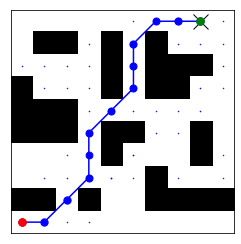

1696
Prediction time:  0.07163001900005384
Reconstruction time:  0.0012158879999333294
ground truth path
predicted path


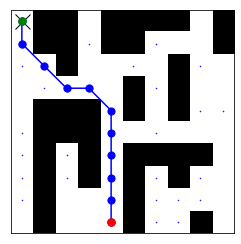

1697
Prediction time:  0.07264561900001354
Reconstruction time:  0.0008276909999267446
ground truth path
predicted path


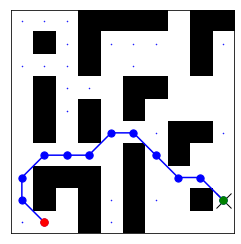

1698
Prediction time:  0.06788917599999422
Reconstruction time:  0.0007474330000150076
ground truth path
predicted path


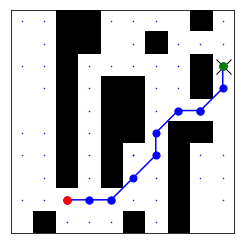

1699
Prediction time:  0.07151576199998999
Reconstruction time:  0.0009457730000121956
ground truth path
predicted path


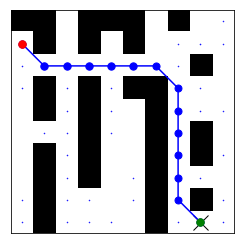

1700
Prediction time:  0.07031194699993648
Reconstruction time:  0.0008294950000617973
ground truth path
predicted path


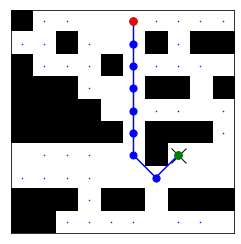

1701
Prediction time:  0.07112160400004086
Reconstruction time:  0.0008101160000251184
ground truth path
predicted path


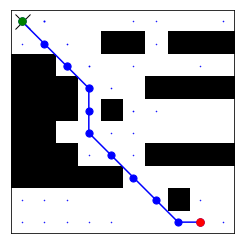

1702
Prediction time:  0.06899256899998818
Reconstruction time:  0.0006617359999836481
ground truth path
predicted path


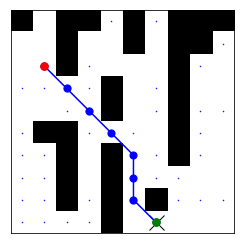

1703
Prediction time:  0.07384327199997642
Reconstruction time:  0.0007465740000043297
ground truth path
predicted path


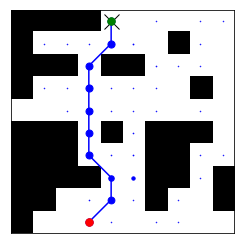

1704
Prediction time:  0.37249861999998757
Reconstruction time:  0.0008325269999431839
ground truth path
predicted path


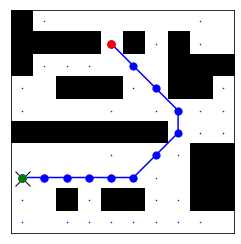

1705
Prediction time:  0.0721994560000212
Reconstruction time:  0.0006594749999067062
ground truth path
predicted path


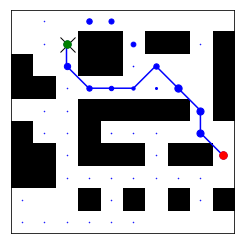

1706
Prediction time:  0.07121991100007108
Reconstruction time:  0.0008278359999849272
ground truth path
predicted path


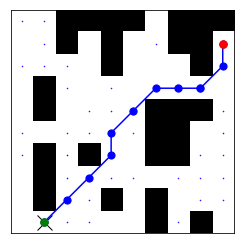

1707
Prediction time:  0.07383795100008683
Reconstruction time:  0.0008919160000004922
ground truth path
predicted path


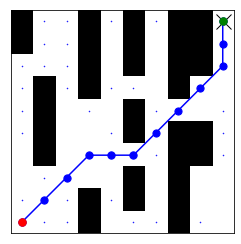

1708
Prediction time:  0.07260222800005067
Reconstruction time:  0.0009423819999483385
ground truth path
predicted path


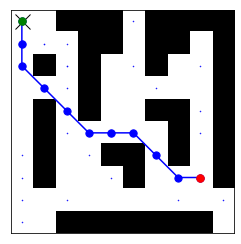

1709
Prediction time:  0.07033480699999473
Reconstruction time:  0.002019061999931182
ground truth path
predicted path


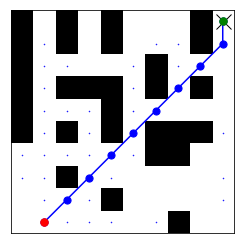

1710
Prediction time:  0.07268642499991529
Reconstruction time:  0.0007989939999788476
ground truth path
predicted path


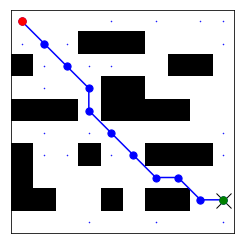

1711
Prediction time:  0.07677669200006676
Reconstruction time:  0.0008322060000409692
ground truth path
predicted path


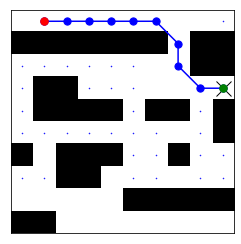

1712
Prediction time:  0.07159467500002847
Reconstruction time:  0.0008507889999691542
ground truth path
predicted path


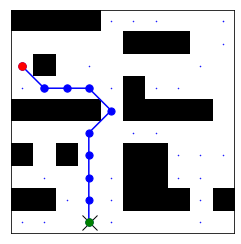

1713
Prediction time:  0.06857934799995746
Reconstruction time:  0.0007639940000672141
ground truth path
predicted path


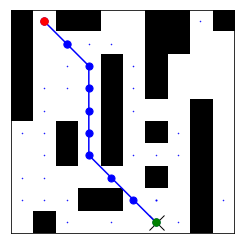

1714
Prediction time:  0.06917561299997033
Reconstruction time:  0.0007613620000483934
ground truth path
predicted path


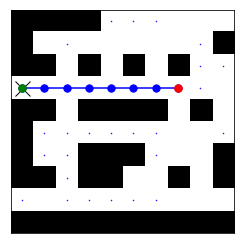

1715
Prediction time:  0.06727415199998177
Reconstruction time:  0.000556404000008115
ground truth path
predicted path


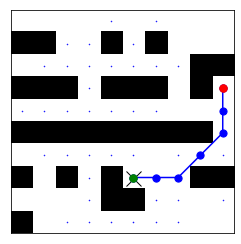

1716
Prediction time:  0.0696361819999538
Reconstruction time:  0.0007502820000127031
ground truth path
predicted path


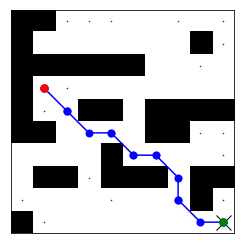

1717
Prediction time:  0.06705699899998763
Reconstruction time:  0.0007885869999881834
ground truth path
predicted path


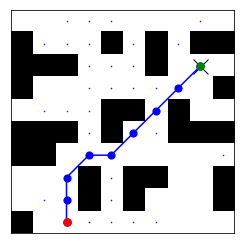

1718
Prediction time:  0.07022779599992646
Reconstruction time:  0.0009053800000629053
ground truth path
predicted path


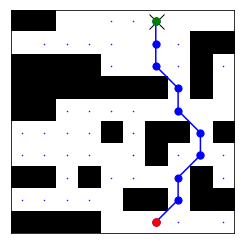

1719
Prediction time:  0.07115703900001336
Reconstruction time:  0.0006784400000015012
ground truth path
predicted path


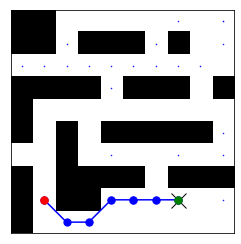

1720
Prediction time:  0.0750240309999981
Reconstruction time:  0.0006882999999788808
ground truth path
predicted path


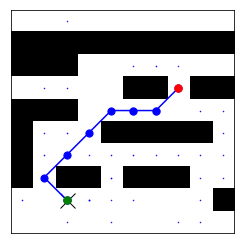

1721
Prediction time:  0.07127141699993444
Reconstruction time:  0.000727968999967743
ground truth path
predicted path


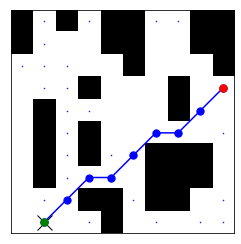

1722
Prediction time:  0.3743498169999384
Reconstruction time:  0.0007983350000131395
ground truth path
predicted path


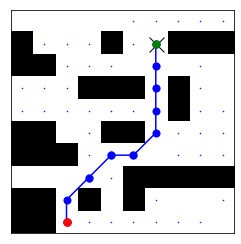

1723
Prediction time:  0.06988541199996234
Reconstruction time:  0.0007116969999287903
ground truth path
predicted path


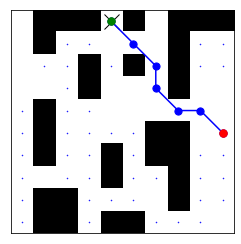

1724
Prediction time:  0.07102235500008192
Reconstruction time:  0.0007967770000050223
ground truth path
predicted path


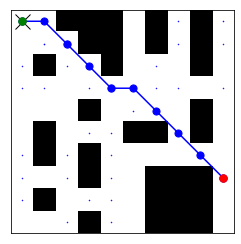

1725
Prediction time:  0.0705722859999014
Reconstruction time:  0.0007406680000485721
ground truth path
predicted path


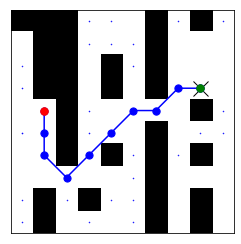

1726
Prediction time:  0.07294280199994319
Reconstruction time:  0.0009103889999551029
ground truth path
predicted path


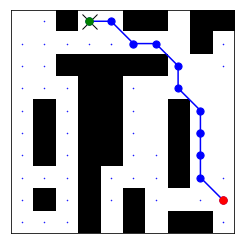

1727
Prediction time:  0.07184638700005053
Reconstruction time:  0.0008159820000628315
ground truth path
predicted path


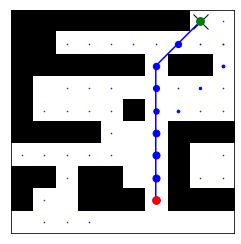

1728
Prediction time:  0.07041203999995105
Reconstruction time:  0.000850746000082836
ground truth path
predicted path


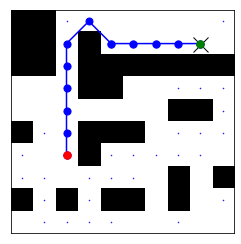

1729
Prediction time:  0.07154559200000676
Reconstruction time:  0.0008013829999526934
ground truth path
predicted path


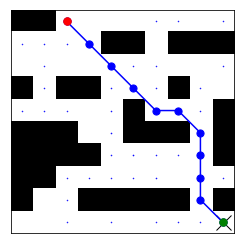

1730
Prediction time:  0.07193902999995316
Reconstruction time:  0.0005702670000573562
ground truth path
predicted path


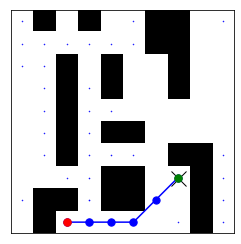

1731
Prediction time:  0.07063450800001192
Reconstruction time:  0.002066450000029363
ground truth path
predicted path


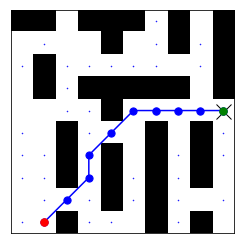

1732
Prediction time:  0.07105643399995643
Reconstruction time:  0.000878331999956572
ground truth path
predicted path


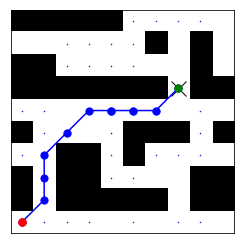

1733
Prediction time:  0.07027304200005347
Reconstruction time:  0.0008562809999830279
ground truth path
predicted path


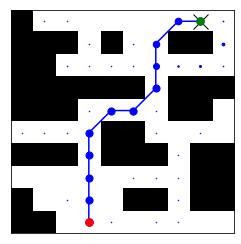

1734
Prediction time:  0.07103438599995116
Reconstruction time:  0.0012279430000035063
ground truth path
predicted path


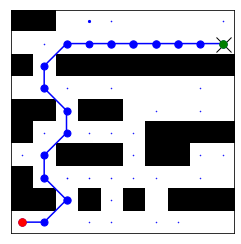

1735
Prediction time:  0.07870741699991868
Reconstruction time:  0.0008826559999306482
ground truth path
predicted path


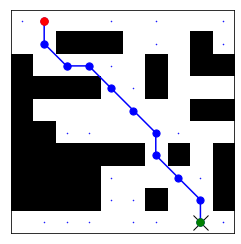

1736
Prediction time:  0.06740285599994422
Reconstruction time:  0.0006870580000395421
ground truth path
predicted path


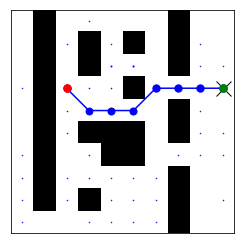

1737
Prediction time:  0.0689343880000024
Reconstruction time:  0.0007454809999671852
ground truth path
predicted path


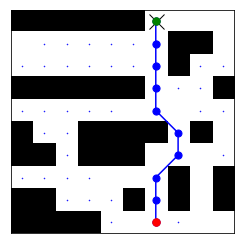

1738
Prediction time:  0.07385768100004952
Reconstruction time:  0.0006848130000207675
ground truth path
predicted path


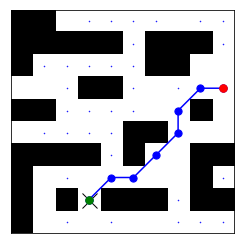

1739
Prediction time:  0.3762712929999452
Reconstruction time:  0.0006782210000437772
ground truth path
predicted path


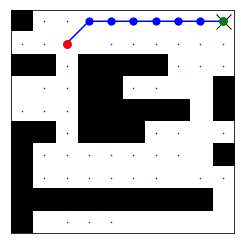

1740
Prediction time:  0.0714178539999466
Reconstruction time:  0.0011027289999674394
ground truth path
predicted path


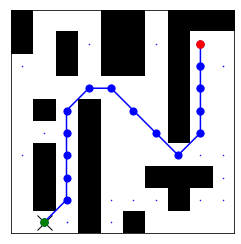

1741
Prediction time:  0.06776442500006397
Reconstruction time:  0.0005611169999610865
ground truth path
predicted path


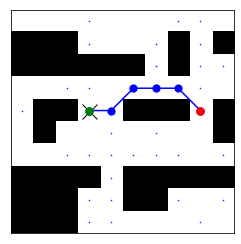

1742
Prediction time:  0.07133471500003452
Reconstruction time:  0.0005722040000364359
ground truth path
predicted path


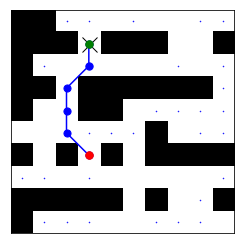

1743
Prediction time:  0.06757437800001753
Reconstruction time:  0.0005899340000041775
ground truth path
predicted path


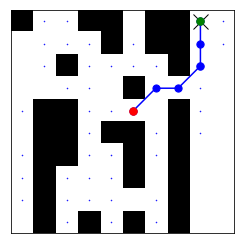

1744
Prediction time:  0.06662166700004946
Reconstruction time:  0.0005638469999666995
ground truth path
predicted path


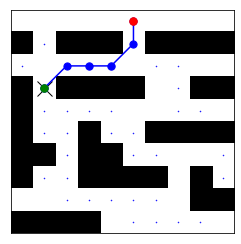

1745
Prediction time:  0.0705924099999038
Reconstruction time:  0.0007967909999706535
ground truth path
predicted path


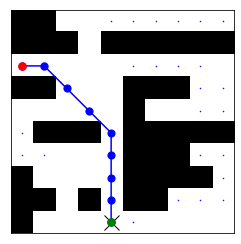

1746
Prediction time:  0.0711101869999311
Reconstruction time:  0.0007446800000252551
ground truth path
predicted path


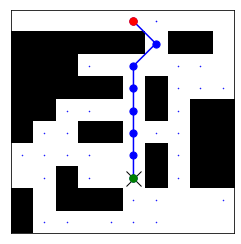

1747
Prediction time:  0.07009690400002455
Reconstruction time:  0.0010873480000554991
ground truth path
predicted path


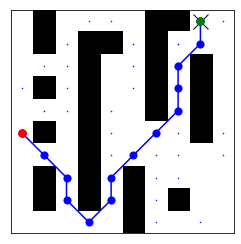

1748
Prediction time:  0.07190658899992286
Reconstruction time:  0.0007259239999939382
ground truth path
predicted path


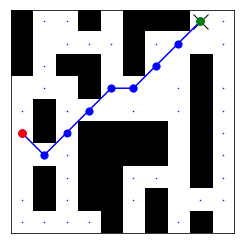

1749
Prediction time:  0.06957083700001476
Reconstruction time:  0.0008029440000427712
ground truth path
predicted path


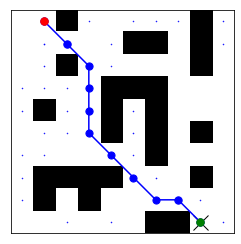

1750
Prediction time:  0.06971242499992059
Reconstruction time:  0.0006930389999979525
ground truth path
predicted path


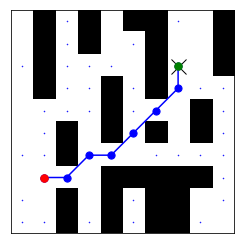

1751
Prediction time:  0.0697056449999991
Reconstruction time:  0.002541309000093861
ground truth path
predicted path


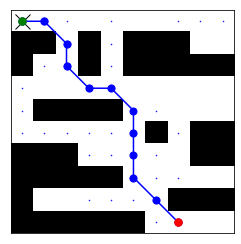

1752
Prediction time:  0.06932989500000986
Reconstruction time:  0.0012728089999427539
ground truth path
predicted path


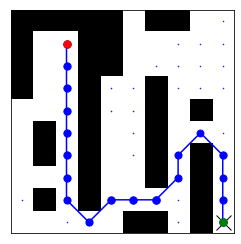

1753
Prediction time:  0.06799320400000397
Reconstruction time:  0.0009826120000298033
ground truth path
predicted path


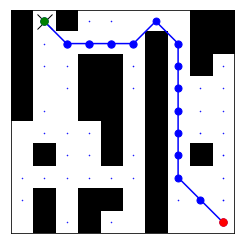

1754
Prediction time:  0.06870760999993308
Reconstruction time:  0.0006443959999842264
ground truth path
predicted path


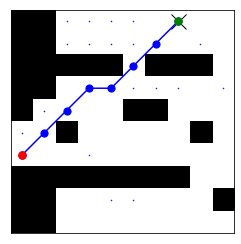

1755
Prediction time:  0.07018034800000805
Reconstruction time:  0.0008514989999639511
ground truth path
predicted path


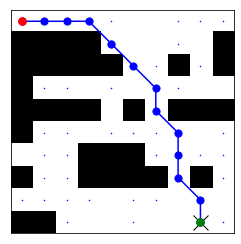

1756
Prediction time:  0.3723927719998983
Reconstruction time:  0.0007671270000173536
ground truth path
predicted path


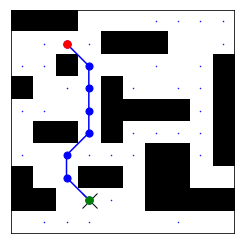

1757
Prediction time:  0.07184144500001821
Reconstruction time:  0.000865891999978885
ground truth path
predicted path


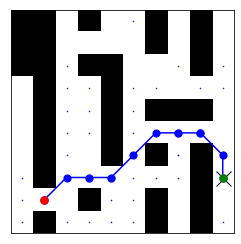

1758
Prediction time:  0.07130582800004959
Reconstruction time:  0.000735571999939566
ground truth path
predicted path


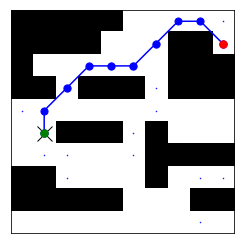

1759
Prediction time:  0.06949352599997383
Reconstruction time:  0.0006372049999754381
ground truth path
predicted path


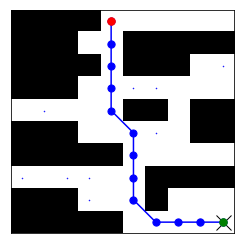

1760
Prediction time:  0.06969636599990281
Reconstruction time:  0.0008584509999991496
ground truth path
predicted path


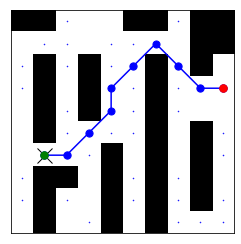

1761
Prediction time:  0.07257371999992301
Reconstruction time:  0.00097842299999229
ground truth path
predicted path


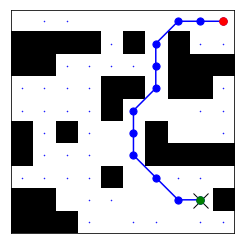

1762
Prediction time:  0.07457539799997903
Reconstruction time:  0.0006257310000137295
ground truth path
predicted path


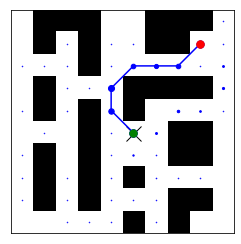

1763
Prediction time:  0.07346853900003225
Reconstruction time:  0.002173124000023563
ground truth path
predicted path


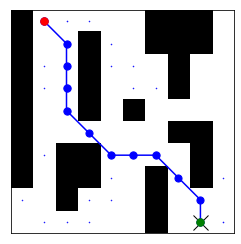

1764
Prediction time:  0.06981878900000993
Reconstruction time:  0.0006153499999754786
ground truth path
predicted path


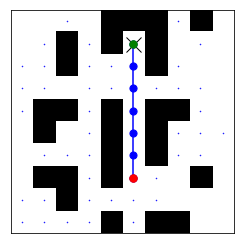

1765
Prediction time:  0.07223162200000388
Reconstruction time:  0.0007185919999983525
ground truth path
predicted path


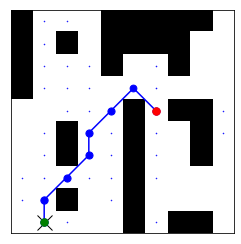

1766
Prediction time:  0.07098690800000895
Reconstruction time:  0.0007851860000300803
ground truth path
predicted path


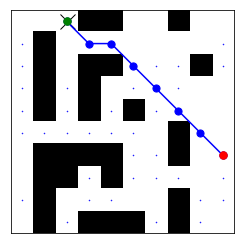

1767
Prediction time:  0.07494346299995414
Reconstruction time:  0.0008669420000160244
ground truth path
predicted path


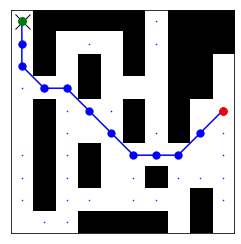

1768
Prediction time:  0.07114345100001174
Reconstruction time:  0.0007204509998928188
ground truth path
predicted path


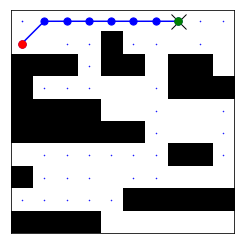

1769
Prediction time:  0.07166245300004448
Reconstruction time:  0.0007382160000588556
ground truth path
predicted path


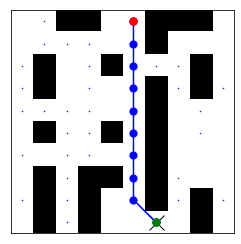

1770
Prediction time:  0.07587788199998613
Reconstruction time:  0.0006048710000641222
ground truth path
predicted path


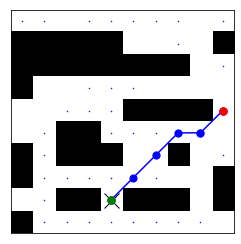

1771
Prediction time:  0.06794787800004087
Reconstruction time:  0.0011341310000716476
ground truth path
predicted path


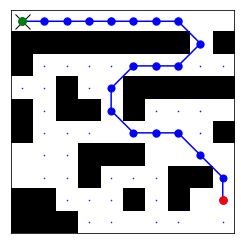

1772
Prediction time:  0.0708064650000324
Reconstruction time:  0.0007657329999801732
ground truth path
predicted path


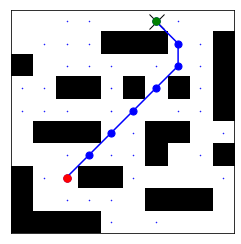

1773
Prediction time:  0.3684636320000436
Reconstruction time:  0.0008671250000134023
ground truth path
predicted path


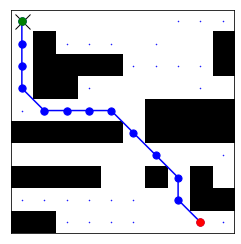

1774
Prediction time:  0.07001308799999606
Reconstruction time:  0.0008841510000365815
ground truth path
predicted path


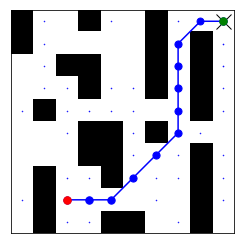

1775
Prediction time:  0.0692374599999539
Reconstruction time:  0.0009143339999582167
ground truth path
predicted path


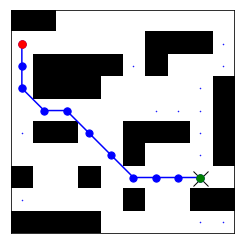

1776
Prediction time:  0.0709557060000634
Reconstruction time:  0.000979267000047912
ground truth path
predicted path


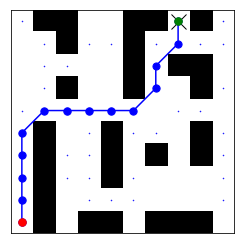

1777
Prediction time:  0.0698579319999908
Reconstruction time:  0.0006850349999467653
ground truth path
predicted path


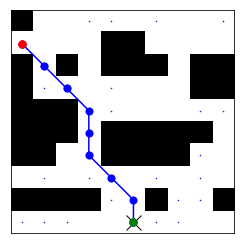

1778
Prediction time:  0.06916627099997186
Reconstruction time:  0.0006181859999969674
ground truth path
predicted path


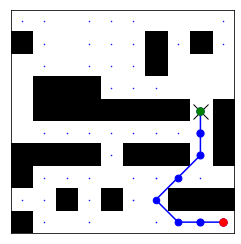

1779
Prediction time:  0.07001922799997828
Reconstruction time:  0.000877704000004087
ground truth path
predicted path


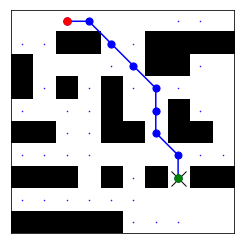

1780
Prediction time:  0.07074337699998523
Reconstruction time:  0.0007962690000340444
ground truth path
predicted path


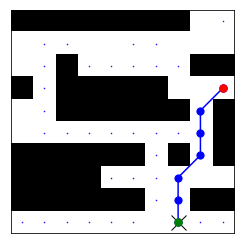

1781
Prediction time:  0.07020930700002737
Reconstruction time:  0.0005683129999169978
ground truth path
predicted path


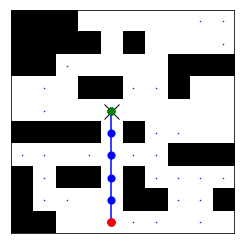

1782
Prediction time:  0.06932102799999029
Reconstruction time:  0.0006601669999781734
ground truth path
predicted path


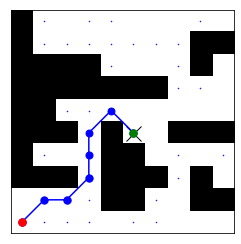

1783
Prediction time:  0.06783041799997136
Reconstruction time:  0.0009045340000284341
ground truth path
predicted path


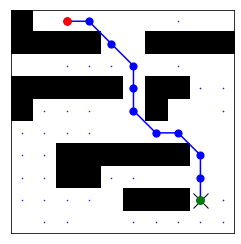

1784
Prediction time:  0.07155948399997669
Reconstruction time:  0.0008472480000136784
ground truth path
predicted path


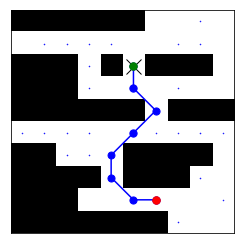

1785
Prediction time:  0.07169234299999516
Reconstruction time:  0.002209952999919551
ground truth path
predicted path


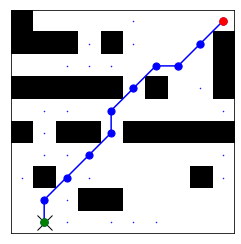

1786
Prediction time:  0.07166477499993107
Reconstruction time:  0.0009009300000570875
ground truth path
predicted path


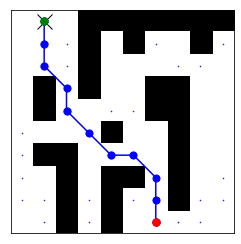

1787
Prediction time:  0.07139425100001517
Reconstruction time:  0.0008148179999807326
ground truth path
predicted path


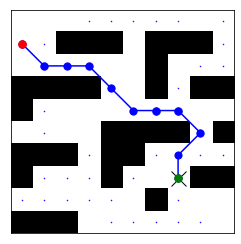

1788
Prediction time:  0.07407938500000455
Reconstruction time:  0.000737532000016472
ground truth path
predicted path


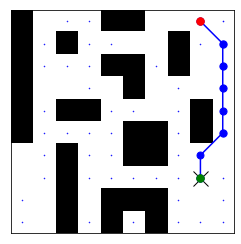

1789
Prediction time:  0.0743175349999774
Reconstruction time:  0.0006631920000472746
ground truth path
predicted path


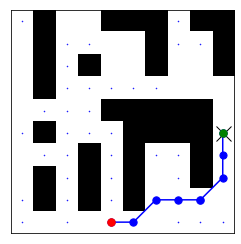

1790
Prediction time:  0.0705465879999565
Reconstruction time:  0.0007667579999406371
ground truth path
predicted path


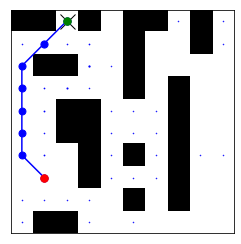

1791
Prediction time:  0.3883133540000472
Reconstruction time:  0.0010352350000175647
ground truth path
predicted path


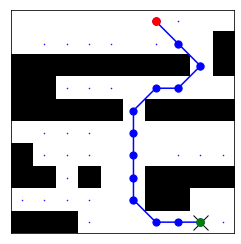

1792
Prediction time:  0.07667944700006046
Reconstruction time:  0.0008787579999989248
ground truth path
predicted path


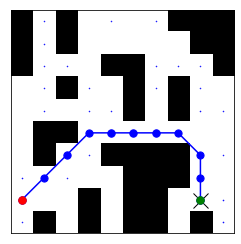

1793
Prediction time:  0.06687324400002126
Reconstruction time:  0.0007106600000952312
ground truth path
predicted path


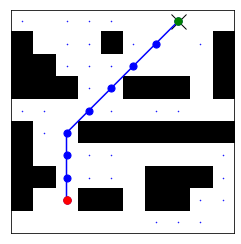

1794
Prediction time:  0.06969618300001912
Reconstruction time:  0.001031491999924583
ground truth path
predicted path


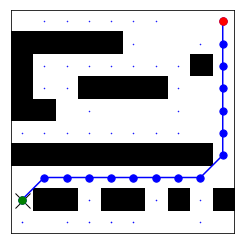

1795
Prediction time:  0.06768135799995889
Reconstruction time:  0.0008755690000725735
ground truth path
predicted path


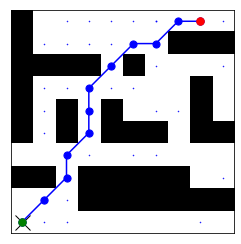

1796
Prediction time:  0.07201352399999905
Reconstruction time:  0.0009251479999647927
ground truth path
predicted path


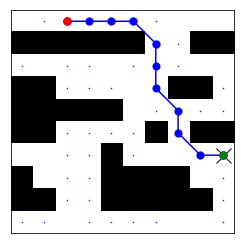

1797
Prediction time:  0.06894818899991151
Reconstruction time:  0.0007404939999560156
ground truth path
predicted path


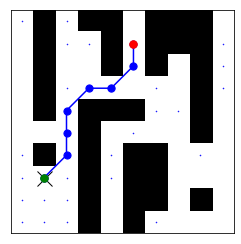

1798
Prediction time:  0.06599000000005617
Reconstruction time:  0.0005533590000368349
ground truth path
predicted path


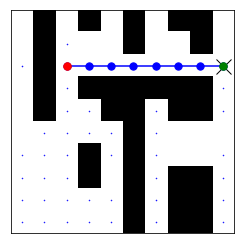

1799
Prediction time:  0.06807086700007403
Reconstruction time:  0.0007780619999948613
ground truth path
predicted path


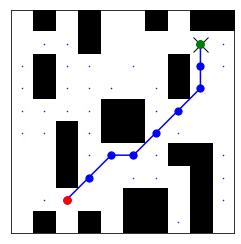

1800
Prediction time:  0.06948020999993787
Reconstruction time:  0.0008340859999407257
ground truth path
predicted path


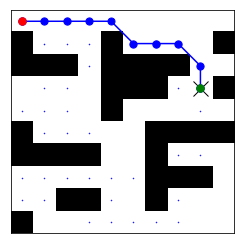

1801
Prediction time:  0.07705697500000497
Reconstruction time:  0.0007443659999353258
ground truth path
predicted path


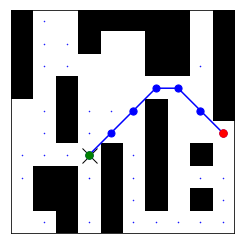

1802
Prediction time:  0.07191193500000281
Reconstruction time:  0.0005383210000218241
ground truth path
predicted path


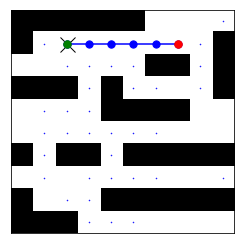

1803
Prediction time:  0.07071308000001864
Reconstruction time:  0.0007557389999419684
ground truth path
predicted path


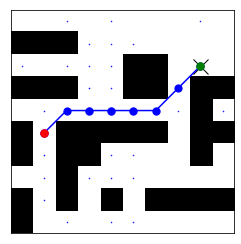

1804
Prediction time:  0.07129608000002463
Reconstruction time:  0.0011539289999973334
ground truth path
predicted path


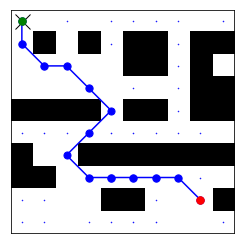

1805
Prediction time:  0.07097172500004945
Reconstruction time:  0.0009164020000298478
ground truth path
predicted path


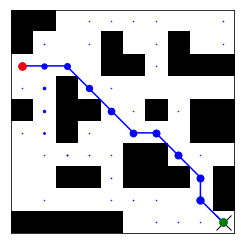

1806
Prediction time:  0.07034737300000415
Reconstruction time:  0.0006365939999568582
ground truth path
predicted path


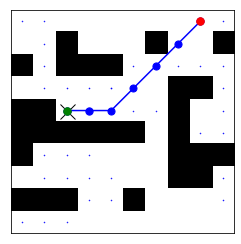

1807
Prediction time:  0.0715776319999577
Reconstruction time:  0.0008979739999404046
ground truth path
predicted path


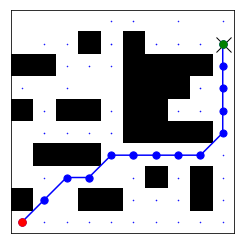

1808
Prediction time:  0.3706790290000299
Reconstruction time:  0.0008784600000808496
ground truth path
predicted path


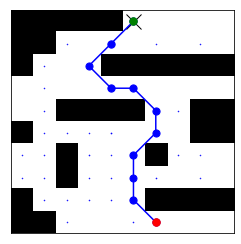

1809
Prediction time:  0.07333154699995248
Reconstruction time:  0.0009763839999550328
ground truth path
predicted path


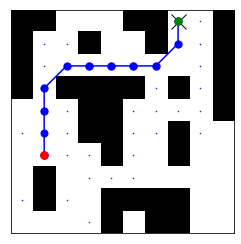

1810
Prediction time:  0.07049539900003765
Reconstruction time:  0.0005781910000450807
ground truth path
predicted path


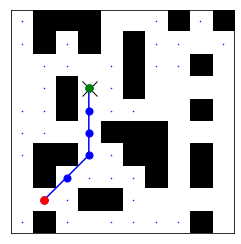

1811
Prediction time:  0.0748614600000792
Reconstruction time:  0.001119657999993251
ground truth path
predicted path


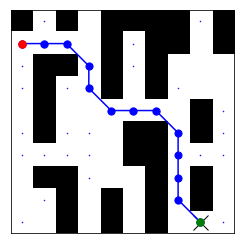

1812
Prediction time:  0.07652295000002596
Reconstruction time:  0.0010975550000011935
ground truth path
predicted path


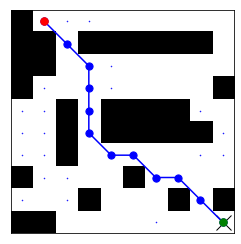

1813
Prediction time:  0.07148897900003703
Reconstruction time:  0.0006257679999635002
ground truth path
predicted path


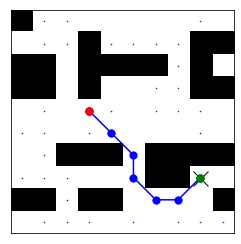

1814
Prediction time:  0.07214416299996174
Reconstruction time:  0.0020281719999957204
ground truth path
predicted path


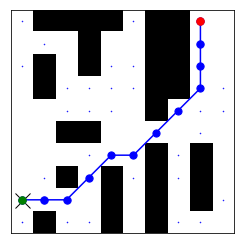

1815
Prediction time:  0.07170492099999137
Reconstruction time:  0.0009374439999874085
ground truth path
predicted path


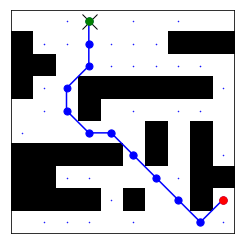

1816
Prediction time:  0.07276007699999809
Reconstruction time:  0.0009714340000073207
ground truth path
predicted path


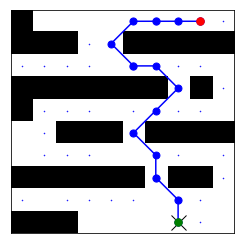

1817
Prediction time:  0.07279592600002616
Reconstruction time:  0.0007985069998994732
ground truth path
predicted path


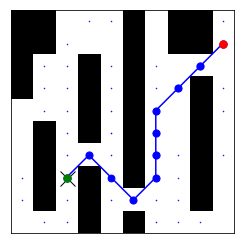

1818
Prediction time:  0.06977558000005502
Reconstruction time:  0.0008574570000519088
ground truth path
predicted path


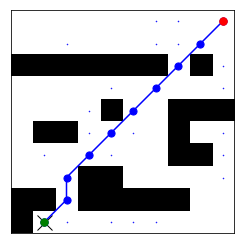

1819
Prediction time:  0.07202493700003743
Reconstruction time:  0.0005049220000046262
ground truth path
predicted path


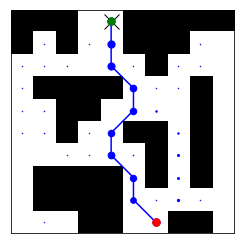

1820
Prediction time:  0.07138727500000641
Reconstruction time:  0.0008229940000319402
ground truth path
predicted path


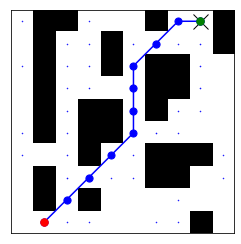

1821
Prediction time:  0.06955046900009165
Reconstruction time:  0.0006557450000173048
ground truth path
predicted path


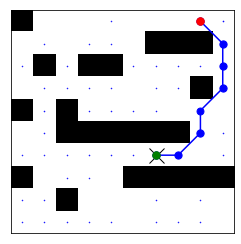

1822
Prediction time:  0.06847576500001651
Reconstruction time:  0.0007514530000207742
ground truth path
predicted path


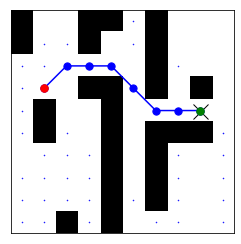

1823
Prediction time:  0.06922086899999158
Reconstruction time:  0.0005774669999709658
ground truth path
predicted path


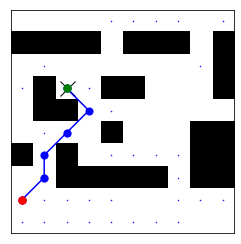

1824
Prediction time:  0.07091070700005275
Reconstruction time:  0.0007121310000002268
ground truth path
predicted path


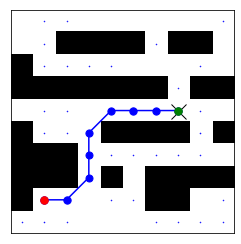

1825
Prediction time:  0.3850284659999943
Reconstruction time:  0.0007494859999042092
ground truth path
predicted path


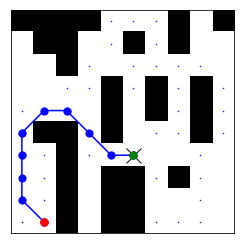

1826
Prediction time:  0.0776822100000345
Reconstruction time:  0.0009119349999764381
ground truth path
predicted path


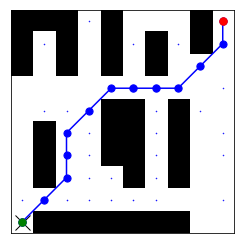

1827
Prediction time:  0.07106211600000734
Reconstruction time:  0.0007655470000145215
ground truth path
predicted path


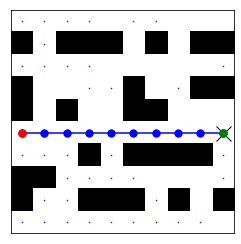

1828
Prediction time:  0.07095270499996786
Reconstruction time:  0.0007147019999820259
ground truth path
predicted path


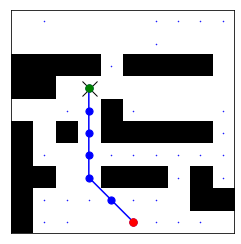

1829
Prediction time:  0.06921272699992187
Reconstruction time:  0.000657437999961985
ground truth path
predicted path


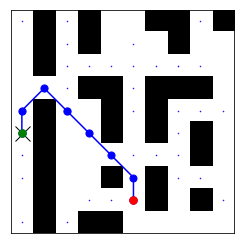

1830
Prediction time:  0.06865898900002776
Reconstruction time:  0.0027252040000576017
ground truth path
predicted path


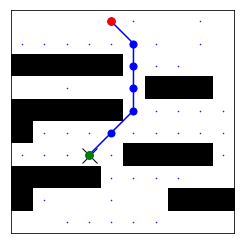

1831
Prediction time:  0.07417637800006105
Reconstruction time:  0.0006553409999696669
ground truth path
predicted path


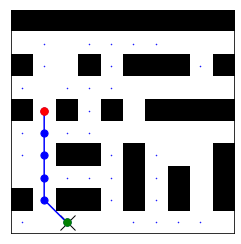

1832
Prediction time:  0.06819708599994101
Reconstruction time:  0.0008559509999486181
ground truth path
predicted path


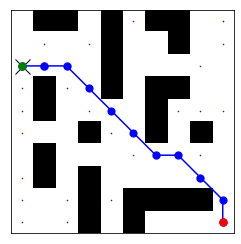

1833
Prediction time:  0.06678063499998643
Reconstruction time:  0.000530389000005016
ground truth path
predicted path


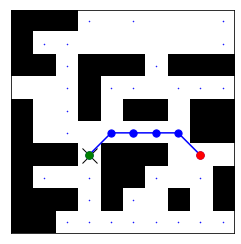

1834
Prediction time:  0.06884895600001073
Reconstruction time:  0.0006173579999995127
ground truth path
predicted path


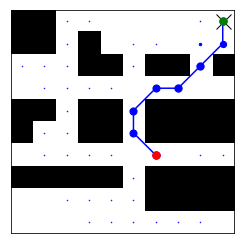

1835
Prediction time:  0.06910596000000169
Reconstruction time:  0.0008744390000856583
ground truth path
predicted path


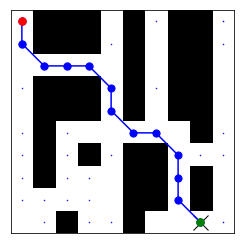

1836
Prediction time:  0.07235557299998163
Reconstruction time:  0.000799574999973629
ground truth path
predicted path


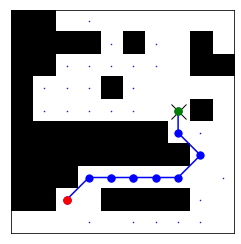

1837
Prediction time:  0.07161727599998358
Reconstruction time:  0.0008124440000756294
ground truth path
predicted path


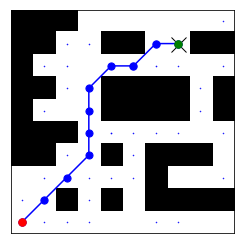

1838
Prediction time:  0.07065926600000694
Reconstruction time:  0.0006212950000872297
ground truth path
predicted path


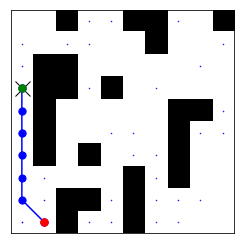

1839
Prediction time:  0.06731608799998412
Reconstruction time:  0.0008061649999717702
ground truth path
predicted path


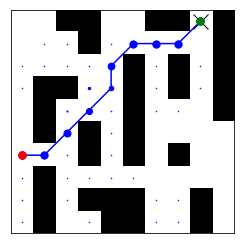

1840
Prediction time:  0.06973475500001314
Reconstruction time:  0.0008532649999324349
ground truth path
predicted path


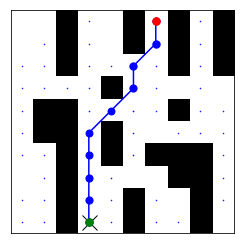

1841
Prediction time:  0.07571101600001384
Reconstruction time:  0.0009989840000343975
ground truth path
predicted path


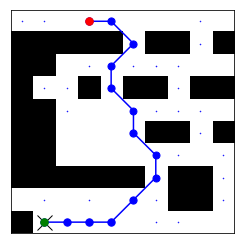

1842
Prediction time:  0.36542801600000985
Reconstruction time:  0.0008956770000168035
ground truth path
predicted path


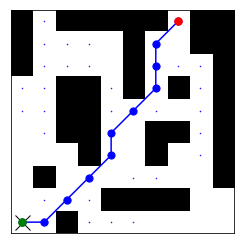

1843
Prediction time:  0.06890787099996487
Reconstruction time:  0.0009275539999862303
ground truth path
predicted path


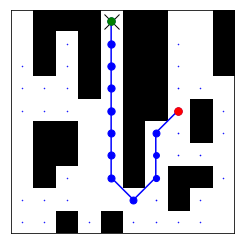

1844
Prediction time:  0.06986037199999373
Reconstruction time:  0.0007342139999764186
ground truth path
predicted path


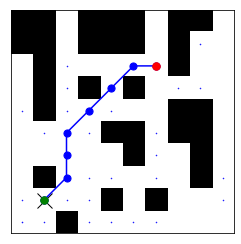

1845
Prediction time:  0.06969129100002647
Reconstruction time:  0.0007689560000017082
ground truth path
predicted path


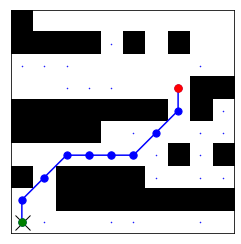

1846
Prediction time:  0.0687759019999703
Reconstruction time:  0.0006686990000162041
ground truth path
predicted path


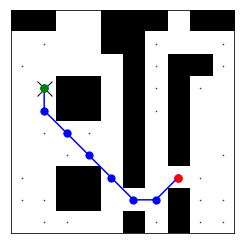

1847
Prediction time:  0.0709716369999569
Reconstruction time:  0.003066336999950181
ground truth path
predicted path


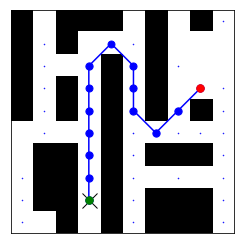

1848
Prediction time:  0.07295269100006863
Reconstruction time:  0.0007822100000112187
ground truth path
predicted path


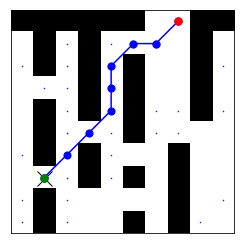

1849
Prediction time:  0.07372828999996273
Reconstruction time:  0.0008826899999121451
ground truth path
predicted path


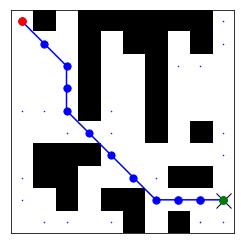

1850
Prediction time:  0.07364921600003527
Reconstruction time:  0.000833734000025288
ground truth path
predicted path


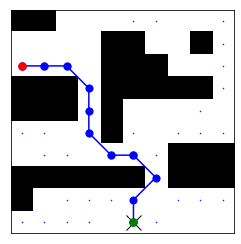

1851
Prediction time:  0.07235345200001575
Reconstruction time:  0.0007916619999832619
ground truth path
predicted path


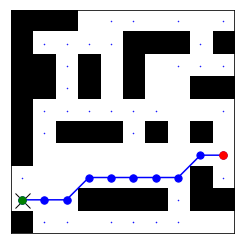

1852
Prediction time:  0.07028763700009222
Reconstruction time:  0.0006406610000340152
ground truth path
predicted path


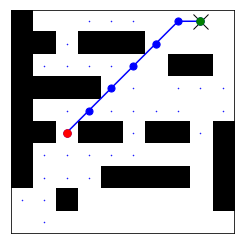

1853
Prediction time:  0.0664164569999457
Reconstruction time:  0.0009052139999994324
ground truth path
predicted path


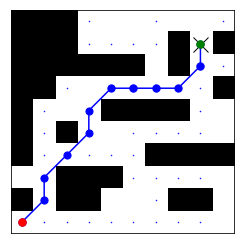

1854
Prediction time:  0.06770738700004131
Reconstruction time:  0.001018967999925735
ground truth path
predicted path


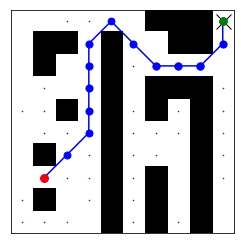

1855
Prediction time:  0.06797873000004984
Reconstruction time:  0.001072850000014114
ground truth path
predicted path


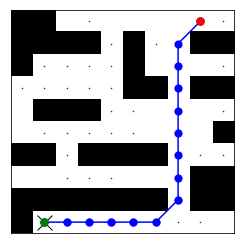

1856
Prediction time:  0.06782266699997308
Reconstruction time:  0.000893054000016491
ground truth path
predicted path


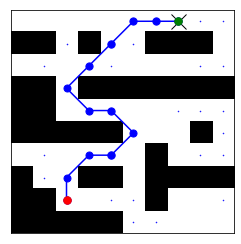

1857
Prediction time:  0.06762132599999404
Reconstruction time:  0.0007681529999672421
ground truth path
predicted path


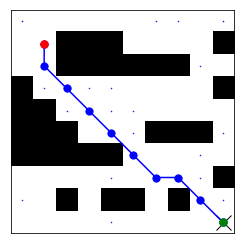

1858
Prediction time:  0.07156534599994302
Reconstruction time:  0.0006005660000028001
ground truth path
predicted path


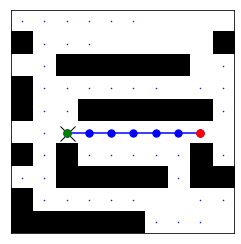

1859
Prediction time:  0.07130014799997753
Reconstruction time:  0.0005926659999886397
ground truth path
predicted path


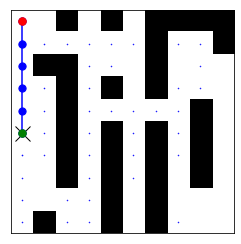

1860
Prediction time:  0.3888304500000004
Reconstruction time:  0.0006745429999455155
ground truth path
predicted path


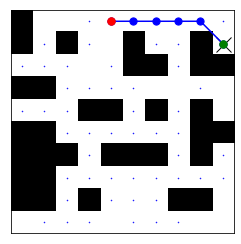

1861
Prediction time:  0.07100513000000319
Reconstruction time:  0.0009741650000023583
ground truth path
predicted path


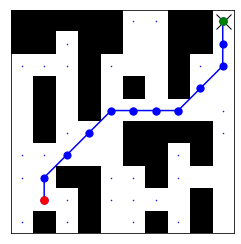

1862
Prediction time:  0.07195425199995498
Reconstruction time:  0.003807874000017364
ground truth path
predicted path


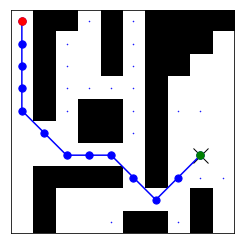

1863
Prediction time:  0.06646453200005453
Reconstruction time:  0.0005682949999936682
ground truth path
predicted path


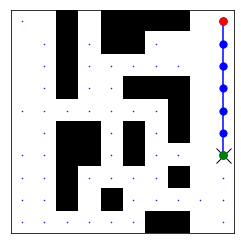

1864
Prediction time:  0.07145667899999353
Reconstruction time:  0.0009701709999490049
ground truth path
predicted path


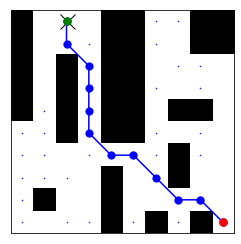

1865
Prediction time:  0.07250671200006309
Reconstruction time:  0.0007539559999258927
ground truth path
predicted path


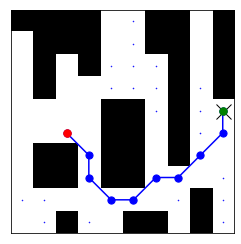

1866
Prediction time:  0.0700211540000737
Reconstruction time:  0.0006040719999873545
ground truth path
predicted path


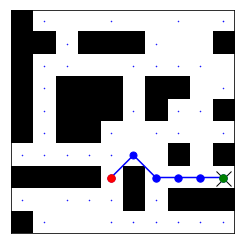

1867
Prediction time:  0.0734503119999772
Reconstruction time:  0.0005830919999425532
ground truth path
predicted path


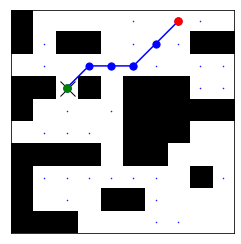

1868
Prediction time:  0.07050299700006235
Reconstruction time:  0.0008853319999388987
ground truth path
predicted path


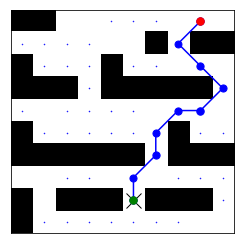

1869
Prediction time:  0.0672859740000149
Reconstruction time:  0.000664963999952306
ground truth path
predicted path


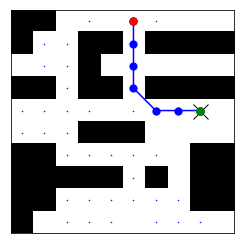

1870
Prediction time:  0.0682959689999052
Reconstruction time:  0.0009115069999552361
ground truth path
predicted path


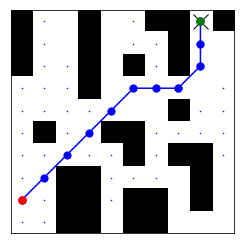

1871
Prediction time:  0.06791093100002854
Reconstruction time:  0.0008698099999264741
ground truth path
predicted path


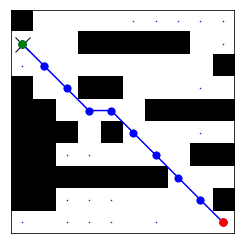

1872
Prediction time:  0.07030051900005674
Reconstruction time:  0.0008892390000028172
ground truth path
predicted path


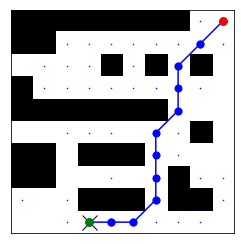

1873
Prediction time:  0.07476704299995163
Reconstruction time:  0.000786206999919159
ground truth path
predicted path


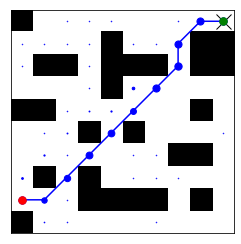

1874
Prediction time:  0.06613947099992856
Reconstruction time:  0.0008415199999944889
ground truth path
predicted path


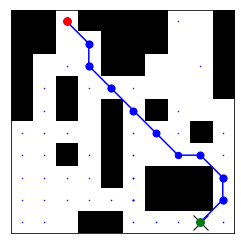

1875
Prediction time:  0.06954167599997163
Reconstruction time:  0.0009163610000086919
ground truth path
predicted path


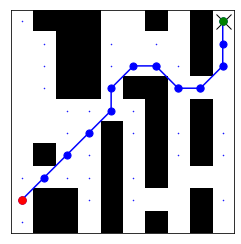

1876
Prediction time:  0.07013778400005322
Reconstruction time:  0.0010591700000759374
ground truth path
predicted path


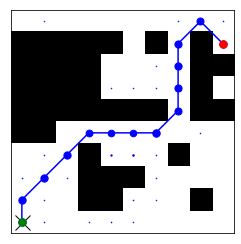

1877
Prediction time:  0.3778180130000237
Reconstruction time:  0.0007511079999176218
ground truth path
predicted path


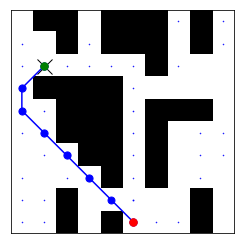

1878
Prediction time:  0.0699289870000257
Reconstruction time:  0.0006825159999834796
ground truth path
predicted path


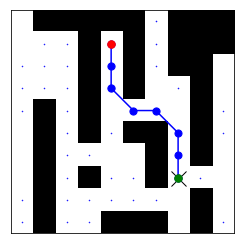

1879
Prediction time:  0.070919381000067
Reconstruction time:  0.0024524199999405027
ground truth path
predicted path


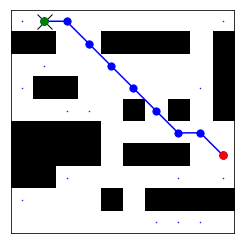

1880
Prediction time:  0.07203308200007541
Reconstruction time:  0.0006708150000349633
ground truth path
predicted path


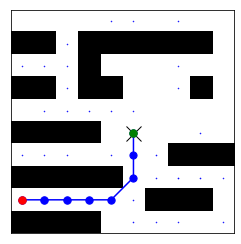

1881
Prediction time:  0.06916959200009387
Reconstruction time:  0.0007958520000101998
ground truth path
predicted path


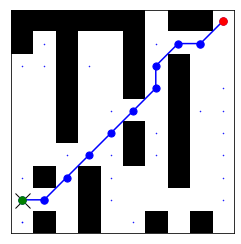

1882
Prediction time:  0.07142490299997917
Reconstruction time:  0.001114013000005798
ground truth path
predicted path


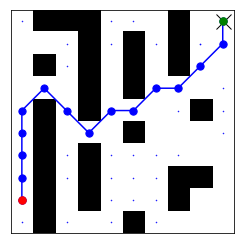

1883
Prediction time:  0.07379541000000245
Reconstruction time:  0.000591513000017585
ground truth path
predicted path


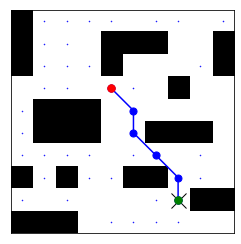

1884
Prediction time:  0.06707919899997705
Reconstruction time:  0.0005404020000696619
ground truth path
predicted path


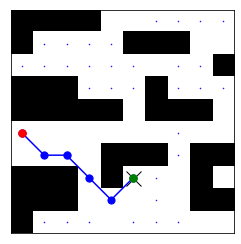

1885
Prediction time:  0.06943174299999555
Reconstruction time:  0.00093686799993975
ground truth path
predicted path


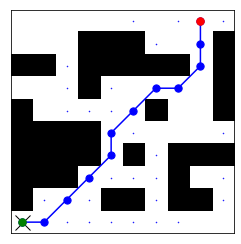

1886
Prediction time:  0.07080030400004489
Reconstruction time:  0.0011071190000393472
ground truth path
predicted path


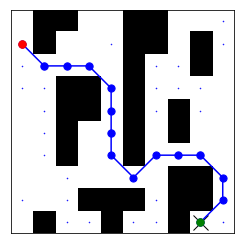

1887
Prediction time:  0.07268889199997375
Reconstruction time:  0.000693711000053554
ground truth path
predicted path


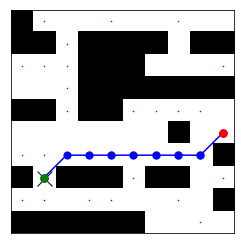

1888
Prediction time:  0.06823538000003282
Reconstruction time:  0.0010582759999806512
ground truth path
predicted path


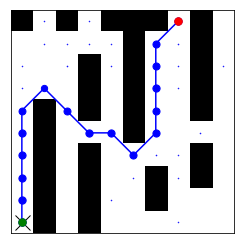

1889
Prediction time:  0.06857808699999168
Reconstruction time:  0.0009195189999218201
ground truth path
predicted path


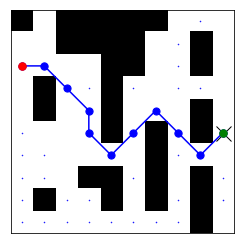

1890
Prediction time:  0.07205576100000144
Reconstruction time:  0.0008677329999500216
ground truth path
predicted path


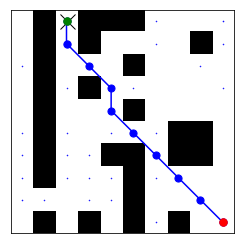

1891
Prediction time:  0.06864217700001518
Reconstruction time:  0.0006137880000096629
ground truth path
predicted path


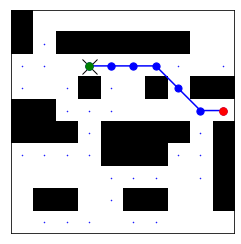

1892
Prediction time:  0.06860132400004204
Reconstruction time:  0.0006503839999822958
ground truth path
predicted path


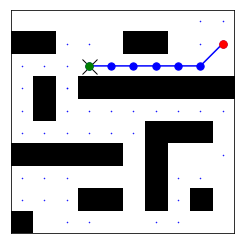

1893
Prediction time:  0.07001886800003376
Reconstruction time:  0.0005809299999555151
ground truth path
predicted path


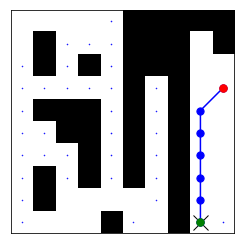

1894
Prediction time:  0.07052873899999668
Reconstruction time:  0.0022442069999897285
ground truth path
predicted path


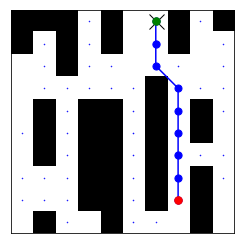

1895
Prediction time:  0.37155866399996285
Reconstruction time:  0.0007058519998963675
ground truth path
predicted path


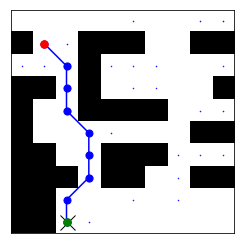

1896
Prediction time:  0.0712259780000295
Reconstruction time:  0.000749895000012657
ground truth path
predicted path


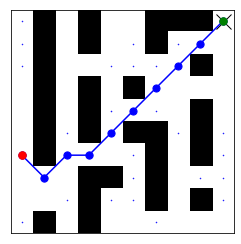

1897
Prediction time:  0.0680700780000052
Reconstruction time:  0.0010923019999609096
ground truth path
predicted path


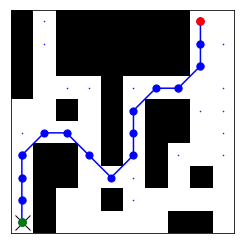

1898
Prediction time:  0.06954989199994088
Reconstruction time:  0.0010783379999566023
ground truth path
predicted path


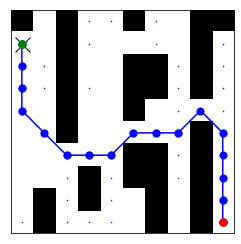

1899
Prediction time:  0.0693572510000422
Reconstruction time:  0.0005653700000038953
ground truth path
predicted path


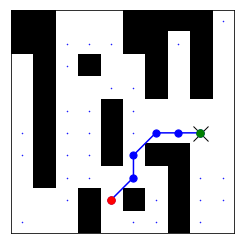

1900
Prediction time:  0.07315144999995482
Reconstruction time:  0.0010427710000158186
ground truth path
predicted path


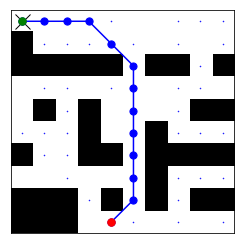

1901
Prediction time:  0.06998292699995545
Reconstruction time:  0.0007433030000356666
ground truth path
predicted path


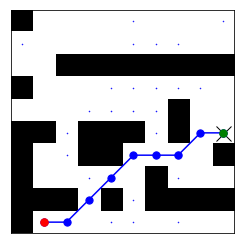

1902
Prediction time:  0.06997572800003127
Reconstruction time:  0.0008575489999884667
ground truth path
predicted path


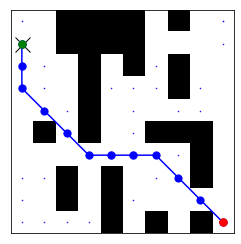

1903
Prediction time:  0.06901398399998016
Reconstruction time:  0.0008386160000100062
ground truth path
predicted path


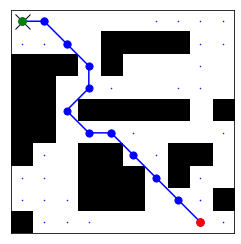

1904
Prediction time:  0.07142601200007448
Reconstruction time:  0.0006372110000256725
ground truth path
predicted path


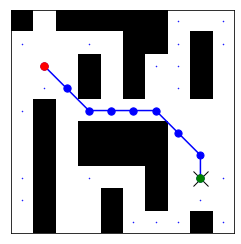

1905
Prediction time:  0.07225483300010183
Reconstruction time:  0.0007023189999699753
ground truth path
predicted path


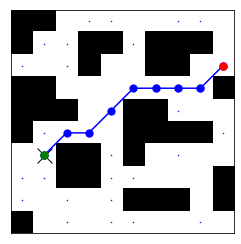

1906
Prediction time:  0.07118469299996377
Reconstruction time:  0.0007623799999691983
ground truth path
predicted path


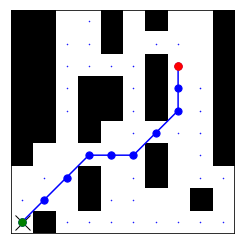

1907
Prediction time:  0.07070174300008603
Reconstruction time:  0.0008999809999750141
ground truth path
predicted path


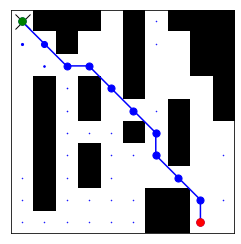

1908
Prediction time:  0.07389702000000398
Reconstruction time:  0.0005849079999507012
ground truth path
predicted path


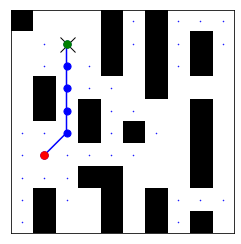

1909
Prediction time:  0.07378211500008547
Reconstruction time:  0.0007395430000087799
ground truth path
predicted path


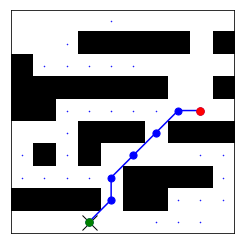

1910
Prediction time:  0.07111889899999824
Reconstruction time:  0.0007586120000269148
ground truth path
predicted path


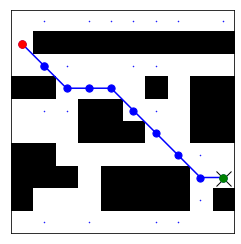

1911
Prediction time:  0.07073946200000591
Reconstruction time:  0.0006791289999910077
ground truth path
predicted path


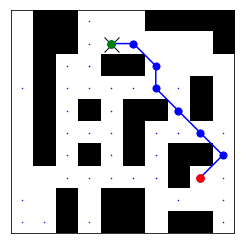

1912
Prediction time:  0.07029781599999296
Reconstruction time:  0.0006392839999307398
ground truth path
predicted path


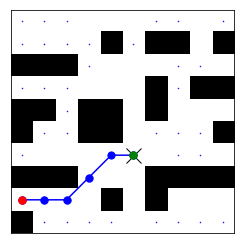

1913
Prediction time:  0.3807507370000849
Reconstruction time:  0.0007657840000092619
ground truth path
predicted path


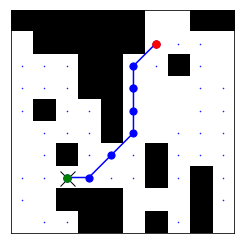

1914
Prediction time:  0.07233802899997954
Reconstruction time:  0.0005478850000599778
ground truth path
predicted path


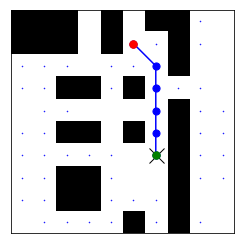

1915
Prediction time:  0.0682367819999854
Reconstruction time:  0.0023540060000186713
ground truth path
predicted path


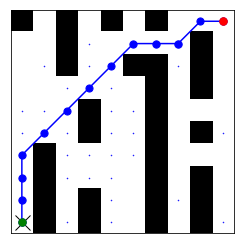

1916
Prediction time:  0.06893653299994185
Reconstruction time:  0.0010179580000340138
ground truth path
predicted path


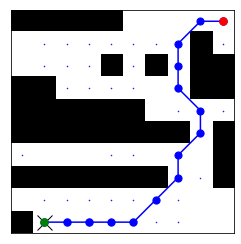

1917
Prediction time:  0.07078173900004003
Reconstruction time:  0.0006904000000531596
ground truth path
predicted path


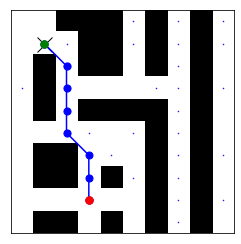

1918
Prediction time:  0.06749615399996856
Reconstruction time:  0.0006164970000099856
ground truth path
predicted path


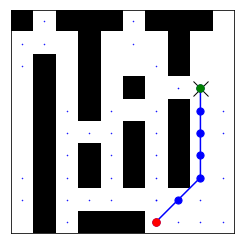

1919
Prediction time:  0.0707904820000067
Reconstruction time:  0.0009019710000757186
ground truth path
predicted path


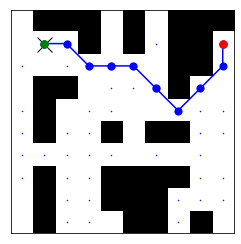

1920
Prediction time:  0.0728799019999542
Reconstruction time:  0.0007553549999101961
ground truth path
predicted path


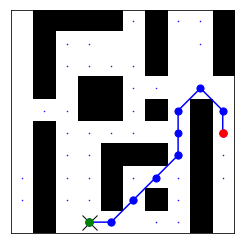

1921
Prediction time:  0.07242546399993444
Reconstruction time:  0.0008247279999977764
ground truth path
predicted path


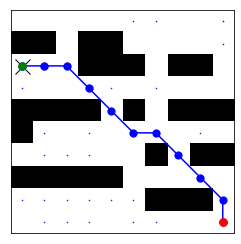

1922
Prediction time:  0.06955559699997593
Reconstruction time:  0.0016804120000415423
ground truth path
predicted path


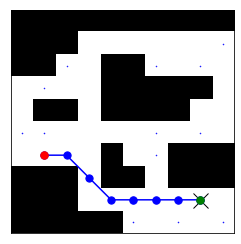

1923
Prediction time:  0.07362005799996041
Reconstruction time:  0.0012683170000400423
ground truth path
predicted path


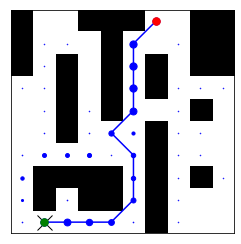

1924
Prediction time:  0.07237587899999198
Reconstruction time:  0.0008611279999968247
ground truth path
predicted path


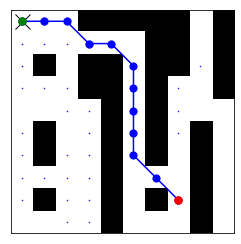

1925
Prediction time:  0.07003776199996992
Reconstruction time:  0.0006826349999755621
ground truth path
predicted path


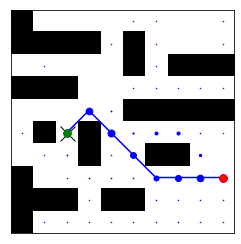

1926
Prediction time:  0.06956667300005392
Reconstruction time:  0.0006396219999942332
ground truth path
predicted path


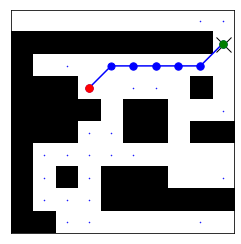

1927
Prediction time:  0.06850133000000369
Reconstruction time:  0.0007520779998912985
ground truth path
predicted path


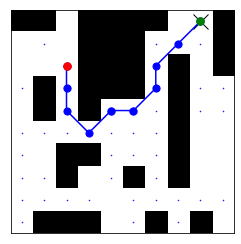

1928
Prediction time:  0.07075632700002643
Reconstruction time:  0.0006955989999823942
ground truth path
predicted path


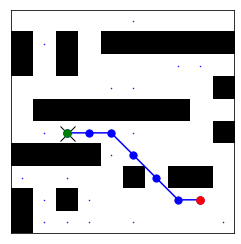

1929
Prediction time:  0.0715468770000598
Reconstruction time:  0.0009367730000349184
ground truth path
predicted path


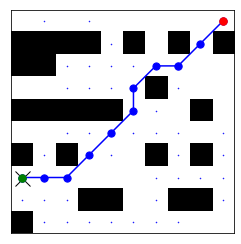

1930
Prediction time:  0.37945953300004476
Reconstruction time:  0.0009098770000264267
ground truth path
predicted path


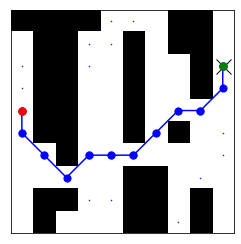

1931
Prediction time:  0.06859425100003591
Reconstruction time:  0.0007797179999897708
ground truth path
predicted path


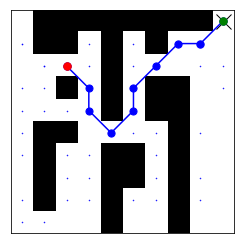

1932
Prediction time:  0.07323696500009191
Reconstruction time:  0.0006700720000480942
ground truth path
predicted path


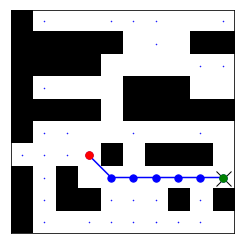

1933
Prediction time:  0.07035770000004504
Reconstruction time:  0.0008678379999764729
ground truth path
predicted path


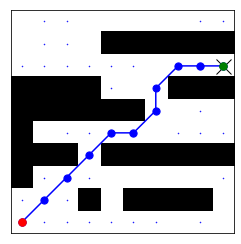

1934
Prediction time:  0.07075742600000012
Reconstruction time:  0.0007465050000519113
ground truth path
predicted path


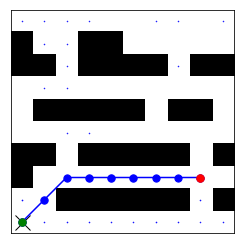

1935
Prediction time:  0.07452964300000531
Reconstruction time:  0.0006383850000020175
ground truth path
predicted path


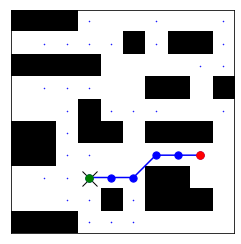

1936
Prediction time:  0.07398253899998508
Reconstruction time:  0.000937979000013911
ground truth path
predicted path


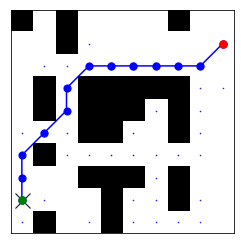

1937
Prediction time:  0.0715688619999355
Reconstruction time:  0.0010917089999793461
ground truth path
predicted path


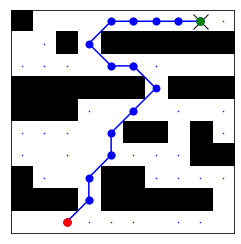

1938
Prediction time:  0.0712169339999491
Reconstruction time:  0.0009258869999939634
ground truth path
predicted path


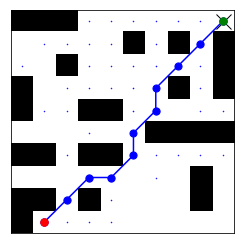

1939
Prediction time:  0.0710714580000058
Reconstruction time:  0.0008226050000530449
ground truth path
predicted path


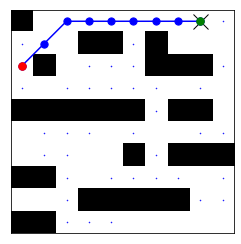

1940
Prediction time:  0.07122792500001651
Reconstruction time:  0.0009792509999897447
ground truth path
predicted path


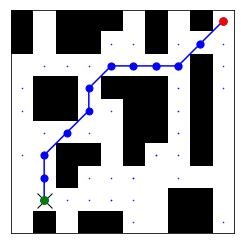

1941
Prediction time:  0.07366684900000564
Reconstruction time:  0.0007487950000495402
ground truth path
predicted path


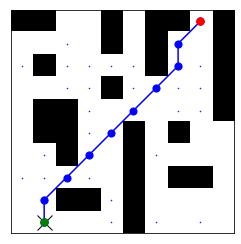

1942
Prediction time:  0.07051305899994986
Reconstruction time:  0.0018758700000489625
ground truth path
predicted path


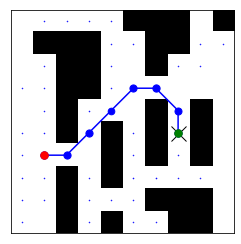

1943
Prediction time:  0.07406432999994195
Reconstruction time:  0.0009844879999718614
ground truth path
predicted path


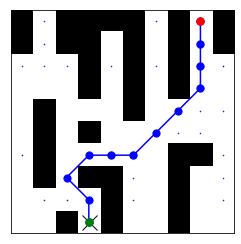

1944
Prediction time:  0.07264273199996296
Reconstruction time:  0.0006776909999643976
ground truth path
predicted path


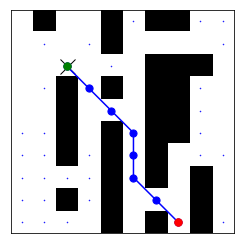

1945
Prediction time:  0.07091747300000861
Reconstruction time:  0.0006303440000010596
ground truth path
predicted path


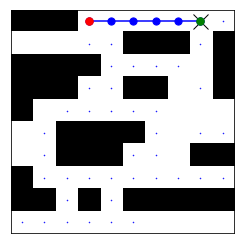

1946
Prediction time:  0.06765092499995262
Reconstruction time:  0.001980938999963655
ground truth path
predicted path


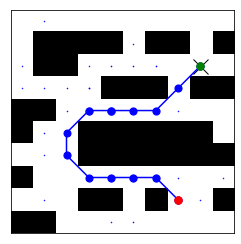

1947
Prediction time:  0.06747392800002672
Reconstruction time:  0.0005153470000323068
ground truth path
predicted path


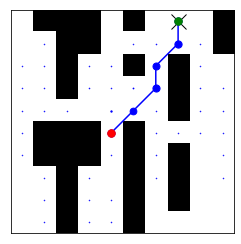

1948
Prediction time:  0.3884291660000372
Reconstruction time:  0.0007069729999784613
ground truth path
predicted path


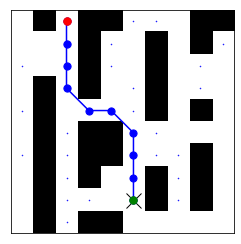

1949
Prediction time:  0.06742667100002109
Reconstruction time:  0.0008684339999263102
ground truth path
predicted path


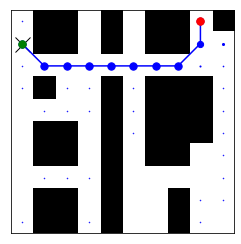

1950
Prediction time:  0.06904882799994994
Reconstruction time:  0.000642083000002458
ground truth path
predicted path


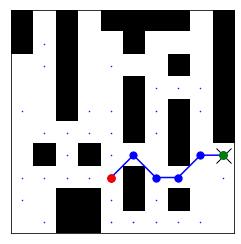

1951
Prediction time:  0.07454643899995972
Reconstruction time:  0.0011101799999551076
ground truth path
predicted path


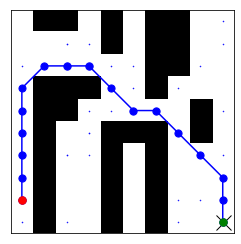

1952
Prediction time:  0.07171845699997448
Reconstruction time:  0.000660002000017812
ground truth path
predicted path


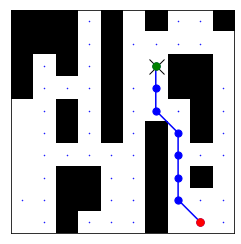

1953
Prediction time:  0.0706674009999233
Reconstruction time:  0.0008382369999253569
ground truth path
predicted path


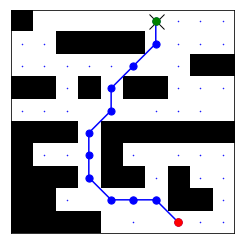

1954
Prediction time:  0.06760443799998939
Reconstruction time:  0.0007757560000527519
ground truth path
predicted path


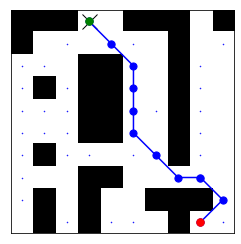

1955
Prediction time:  0.06921561699994072
Reconstruction time:  0.0028350129999807905
ground truth path
predicted path


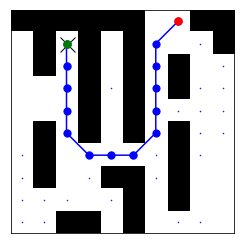

1956
Prediction time:  0.06883413699995344
Reconstruction time:  0.000930946000039512
ground truth path
predicted path


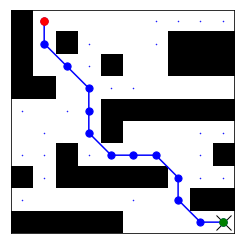

1957
Prediction time:  0.06903501599992978
Reconstruction time:  0.0009457849999989776
ground truth path
predicted path


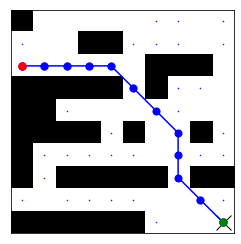

1958
Prediction time:  0.06883935300004396
Reconstruction time:  0.0006818110000494926
ground truth path
predicted path


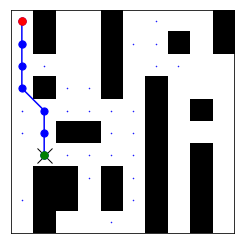

1959
Prediction time:  0.07501016900005197
Reconstruction time:  0.000707016999967891
ground truth path
predicted path


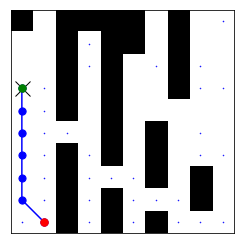

1960
Prediction time:  0.07247351600005913
Reconstruction time:  0.0009004220000861096
ground truth path
predicted path


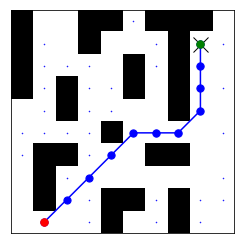

1961
Prediction time:  0.07107135000001108
Reconstruction time:  0.0006626389999837556
ground truth path
predicted path


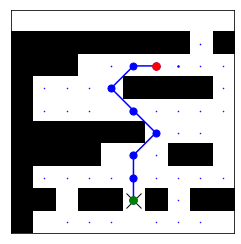

1962
Prediction time:  0.0708802699999751
Reconstruction time:  0.0009618840000484852
ground truth path
predicted path


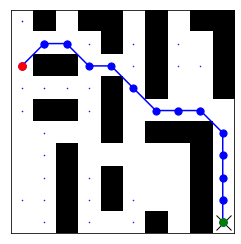

1963
Prediction time:  0.07200221800007967
Reconstruction time:  0.0006326630000330624
ground truth path
predicted path


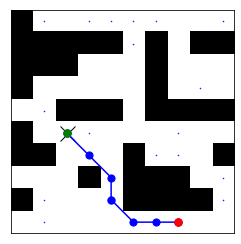

1964
Prediction time:  0.06937245099993561
Reconstruction time:  0.0017678049999858558
ground truth path
predicted path


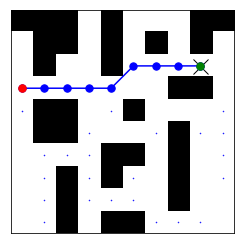

1965
Prediction time:  0.06854074599993965
Reconstruction time:  0.0008315089999086922
ground truth path
predicted path


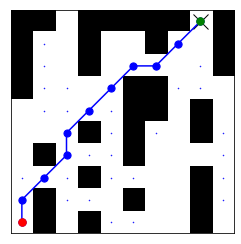

1966
Prediction time:  0.37733912600003805
Reconstruction time:  0.0009709790000442808
ground truth path
predicted path


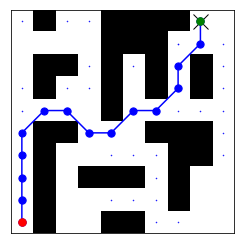

1967
Prediction time:  0.07101358300008087
Reconstruction time:  0.0006904969999368404
ground truth path
predicted path


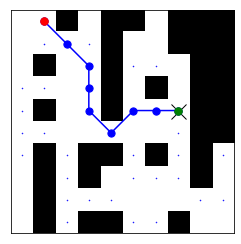

1968
Prediction time:  0.07145381300006193
Reconstruction time:  0.0008631469999045294
ground truth path
predicted path


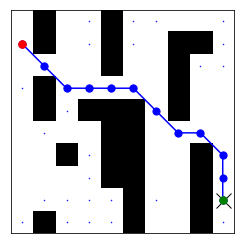

1969
Prediction time:  0.07245995200003108
Reconstruction time:  0.0008695379999608122
ground truth path
predicted path


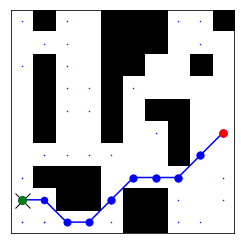

1970
Prediction time:  0.06992785400007051
Reconstruction time:  0.0021014540000123816
ground truth path
predicted path


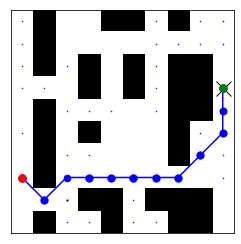

1971
Prediction time:  0.06882108599995718
Reconstruction time:  0.0008097439999801281
ground truth path
predicted path


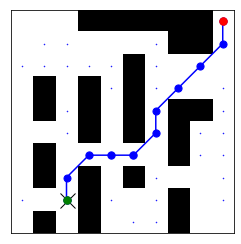

1972
Prediction time:  0.0699263469999778
Reconstruction time:  0.0006033099999740443
ground truth path
predicted path


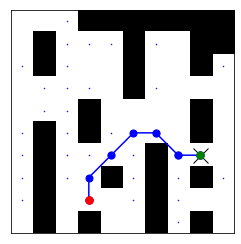

1973
Prediction time:  0.07005252900000869
Reconstruction time:  0.0009745969999812587
ground truth path
predicted path


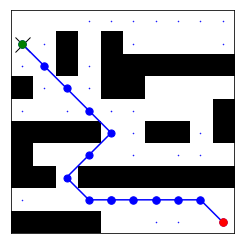

1974
Prediction time:  0.0711978240000235
Reconstruction time:  0.0012567979999857926
ground truth path
predicted path


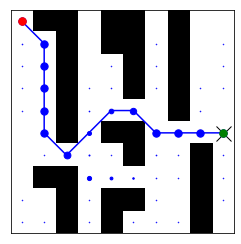

1975
Prediction time:  0.06906118699998842
Reconstruction time:  0.0009918939999806753
ground truth path
predicted path


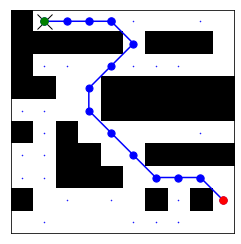

1976
Prediction time:  0.06901806500002294
Reconstruction time:  0.0008124160000306802
ground truth path
predicted path


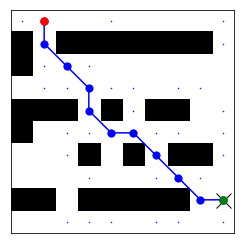

1977
Prediction time:  0.0691992099999652
Reconstruction time:  0.0010747730000275624
ground truth path
predicted path


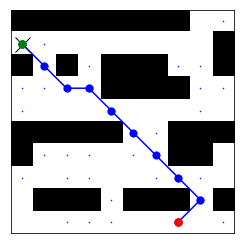

1978
Prediction time:  0.0809427560000131
Reconstruction time:  0.0012601660000655102
ground truth path
predicted path


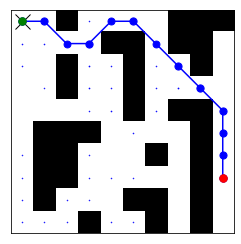

1979
Prediction time:  0.0682474299999285
Reconstruction time:  0.0007787479999024072
ground truth path
predicted path


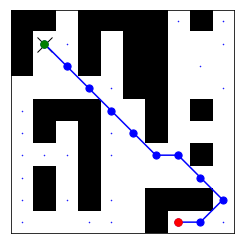

1980
Prediction time:  0.07079674400006297
Reconstruction time:  0.0007497189999412512
ground truth path
predicted path


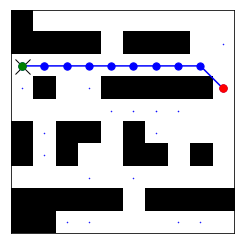

1981
Prediction time:  0.07004697299998952
Reconstruction time:  0.0008739300000115691
ground truth path
predicted path


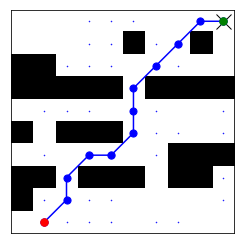

1982
Prediction time:  0.0708848010000338
Reconstruction time:  0.0007456270000147924
ground truth path
predicted path


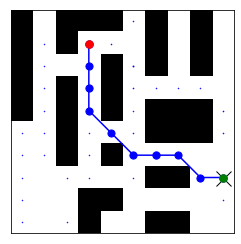

1983
Prediction time:  0.08064063900008023
Reconstruction time:  0.0008433019999074531
ground truth path
predicted path


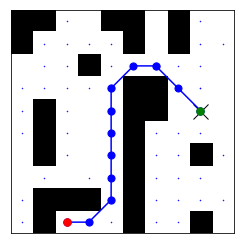

1984
Prediction time:  0.3867122350000045
Reconstruction time:  0.0007825279999451595
ground truth path
predicted path


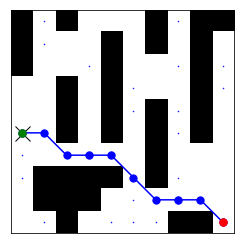

1985
Prediction time:  0.07106203899991215
Reconstruction time:  0.0006511919999638849
ground truth path
predicted path


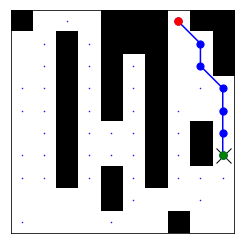

1986
Prediction time:  0.06943401499995616
Reconstruction time:  0.0005989239999735219
ground truth path
predicted path


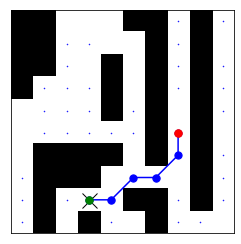

1987
Prediction time:  0.07182471299995541
Reconstruction time:  0.0006433329999708803
ground truth path
predicted path


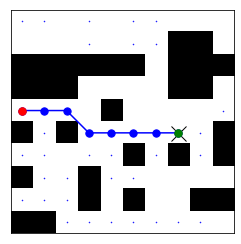

1988
Prediction time:  0.06899846299995716
Reconstruction time:  0.0019937260000233437
ground truth path
predicted path


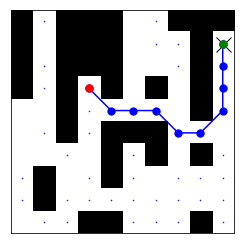

1989
Prediction time:  0.07227280899996913
Reconstruction time:  0.000583421999976963
ground truth path
predicted path


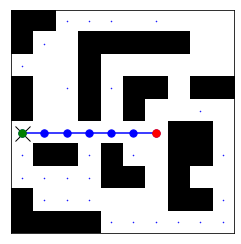

1990
Prediction time:  0.0685249500000964
Reconstruction time:  0.0008180859999811219
ground truth path
predicted path


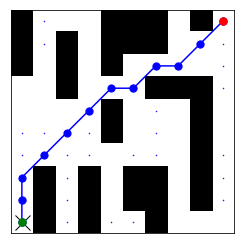

1991
Prediction time:  0.0688051860000769
Reconstruction time:  0.000808151999990514
ground truth path
predicted path


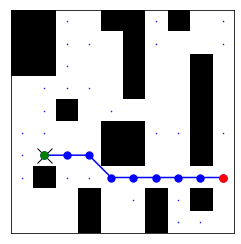

1992
Prediction time:  0.07009335500003999
Reconstruction time:  0.0006145490000335485
ground truth path
predicted path


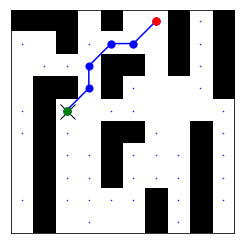

1993
Prediction time:  0.06819465400008085
Reconstruction time:  0.000712705000069036
ground truth path
predicted path


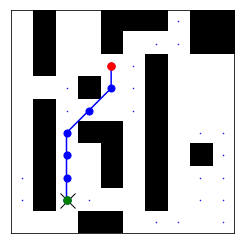

1994
Prediction time:  0.07178208300001643
Reconstruction time:  0.0008599559999993289
ground truth path
predicted path


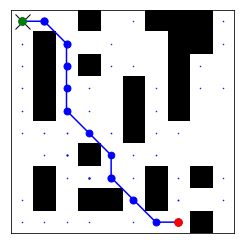

1995
Prediction time:  0.08031671200001256
Reconstruction time:  0.0006914749999396008
ground truth path
predicted path


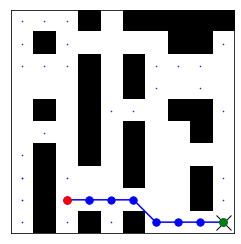

1996
Prediction time:  0.07185187000004589
Reconstruction time:  0.0008996530000331404
ground truth path
predicted path


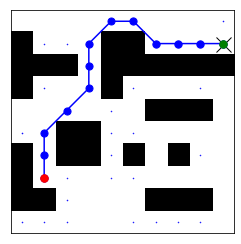

1997
Prediction time:  0.07048396000004686
Reconstruction time:  0.0011295620000737472
ground truth path
predicted path


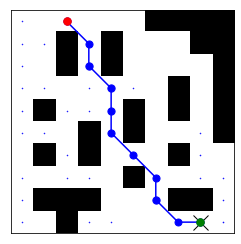

1998
Prediction time:  0.07427632099995662
Reconstruction time:  0.0007540039999867076
ground truth path
predicted path


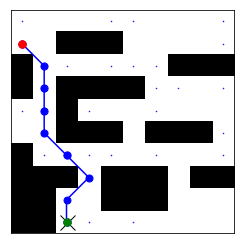

1999
Prediction time:  0.08045111899991753
Reconstruction time:  0.0008149720000574234
ground truth path
predicted path


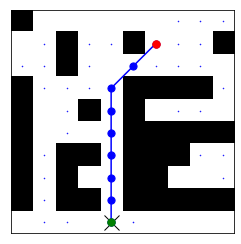

In [20]:
print('Predict path ...')
for i in range(m):
	print(i)
	
	### Predict path
	a = time.process_time()
	y_pred=model.predict(x_test[i,:,:,:].reshape(1,n,n,3)).squeeze()
	pred_t = time.process_time() - a
	print('Prediction time: ', pred_t)
	
	### Reconstruct path from the prediction
	env=x_test[i,:,:,0].squeeze()
	s=np.array(np.nonzero(x_test[i,:,:,1].squeeze()==1))
	g=np.array(np.nonzero(x_test[i,:,:,2].squeeze()==1))
	
	a = time.process_time()
	px,py=reconstruct_path(y_pred,env,s,g)
	rec_t = time.process_time() - a
	print('Reconstruction time: ', rec_t)
		
	### Plot path 
	t=np.array(np.nonzero(y_test[i,:,:].squeeze()==1)) #ground-truth path
	t_pred=np.array(np.nonzero(y_pred>0.001)) #predicted path
	#print("t",t)
	#print("t_pred",t_pred)
	fig = plt.matshow(env.T,cmap='binary')
	print("ground truth path")
	plt.plot(t[0],t[1],'kx',markersize=15)
	print("predicted path")
	for j in range(t_pred.shape[1]):
		plt.plot(t_pred[0,j],t_pred[1,j],'b.',markersize=15*y_pred[t_pred[0,j],t_pred[1,j]]+1)
	plt.plot(px-1,py-1,'b')
	plt.plot(s[0],s[1],'g.',markersize=15)
	plt.plot(g[0],g[1],'r.',markersize=15)
	fig.axes.get_xaxis().set_visible(False)
	fig.axes.get_yaxis().set_visible(False)
	plt.show()
	# plt.savefig('../results_2/images/env%05d.png' % (i+1))	
	plt.close()

 
  
